**The Dataset used below Contains Players Bowling and Batting Stats from IPL 2016-2022.**



**SOURCE** -- https://www.kaggle.com/datasets/anandkumarsahu09/ipl-player-stats-20162022



**Batting Stats**



POS -- Player's rank based on most runs.

Player -- Player's name

Mat -- Matches played

Inns -- Innings Played

NO -- Number of Not Out in innings

Runs -- Total Runs scored by a player

HS -- Highest Score in innings [* -- Not Out in that Innings]

Avg -- Average

BF -- Bowls faced

SR -- Strike Rate

100 -- No of times 100 scored

50 -- No of the times 50 scored

4s -- Total Fours Scored

6s -- Total Sixes Scored



**Bowling Stats**



POS -- Player's rank based on most wickets.

Player -- Player's name

Mat -- Matches playedn

Inns -- Innings Played

Ov -- Overs

Runs -- Total runs given by bowler

Wkts -- Total Wickets taken

BBI -- Best Bowling in Innings

Avg -- Bowling Average

Econ -- Economy rate

SR -- Strike Rate

4w -- 4 wickets haul

5w -- 5 wickets haul


In [1]:
# Importing necessary libraries
import os
import csv
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

In [2]:
# Function to convert a CSV file data to a list of dictionaries
def csv_to_list_of_dicts(file_path, year):
    data_list = []
    with open(file_path, newline='') as csvfile:
        reader = csv.DictReader(csvfile)
        for row in reader:
            row['Year'] = year
            data_list.append(row)
    return data_list


In [3]:
# Function to get a list of CSV files in a folder
def get_csv_files_in_folder(folder_path):
    csv_files = []
    for file in os.listdir(folder_path):
        if file.endswith('.csv'):
            csv_files.append(os.path.join(folder_path, file))
    return csv_files


In [4]:
# Folder paths for batting and bowling data
folder_path_batting = f"E:\\Movies\\Summer Training Project 2023\\kaggle data set\\IPL Player Stats\\Batting Stats"
folder_path_bowling = f"E:\\Movies\\Summer Training Project 2023\\kaggle data set\\IPL Player Stats\\Bowling Stats"

# Get all CSV files in the batting and bowling folders to csv_batting_files and csv_bowling_files rspectively
csv_batting_files = get_csv_files_in_folder(folder_path_batting)
csv_bowling_files = get_csv_files_in_folder(folder_path_bowling)

# Initialize empty lists to store all batting and bowling data
all_bowling_data = []
all_batting_data = []

# Iterate through each batting CSV file, extract data, and append to all_batting_data
for file_path in csv_batting_files:
    year = int(file_path.split('\\')[-1][:-4].split('_')[-1])
    data = csv_to_list_of_dicts(file_path, year)
    all_batting_data.extend(data)

# Iterate through each batting CSV file, extract data, and append to all_bowling_data
for file_path in csv_bowling_files:
    year = int(file_path.split('\\')[-1][:-4].split("_")[1])
    data = csv_to_list_of_dicts(file_path, year)
    all_bowling_data.extend(data)


In [5]:
# Display the data in all_batting data
all_batting_data[:]

[{'POS': '1',
  'Player': 'Virat Kohli',
  'Mat': '16',
  'Inns': '16',
  'NO': '4',
  'Runs': '973',
  'HS': '113',
  'Avg': '81.08',
  'BF': '640',
  'SR': '152.03',
  '100': '4',
  '50': '7',
  '4s': '83',
  '6s': '38',
  'Year': 2016},
 {'POS': '2',
  'Player': 'David Warner',
  'Mat': '17',
  'Inns': '17',
  'NO': '3',
  'Runs': '848',
  'HS': '93*',
  'Avg': '60.57',
  'BF': '560',
  'SR': '151.42',
  '100': '0',
  '50': '9',
  '4s': '88',
  '6s': '31',
  'Year': 2016},
 {'POS': '3',
  'Player': 'AB de Villiers',
  'Mat': '16',
  'Inns': '16',
  'NO': '3',
  'Runs': '687',
  'HS': '129*',
  'Avg': '52.84',
  'BF': '407',
  'SR': '168.79',
  '100': '1',
  '50': '6',
  '4s': '57',
  '6s': '37',
  'Year': 2016},
 {'POS': '4',
  'Player': 'Gautam Gambhir',
  'Mat': '15',
  'Inns': '15',
  'NO': '2',
  'Runs': '501',
  'HS': '90*',
  'Avg': '38.53',
  'BF': '411',
  'SR': '121.89',
  '100': '0',
  '50': '5',
  '4s': '54',
  '6s': '6',
  'Year': 2016},
 {'POS': '5',
  'Player': 'Shikha

In [6]:
# Function to display information about the dataset
def info(df):
    # Assuming the keys of the first dictionary represent column names
    col_names = list(df[0].keys())
    data_types = {col: type(df[0][col]).__name__ for col in col_names}
    non_null_counts = {
        col: sum(1 for row in df if row[col] is not None) for col in col_names}

    print(f"Data Frame Info:")
    print("Number of Rows:", len(df))
    print("Number of Columns:", len(col_names))
    print()

    print("{: <20} {: <20} {: <20}".format(
        "Column Name", "Data Type", "Non-Null Count"))
    print("-" * 60)
    for col in col_names:
        print("{: <20} {: <20} {: <20}".format(
            col, data_types[col], non_null_counts[col]))


In [7]:
# Display information about all_batting_data
batting_info = info(all_batting_data)

Data Frame Info:
Number of Rows: 1005
Number of Columns: 15

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
POS                  str                  1005                
Player               str                  1005                
Mat                  str                  1005                
Inns                 str                  1005                
NO                   str                  1005                
Runs                 str                  1005                
HS                   str                  1005                
Avg                  str                  1005                
BF                   str                  1005                
SR                   str                  1005                
100                  str                  1005                
50                   str                  1005                
4s                   str                  1005             

In [8]:
info(all_bowling_data)

Data Frame Info:
Number of Rows: 615
Number of Columns: 14

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
POS                  str                  615                 
Player               str                  615                 
Mat                  str                  615                 
Inns                 str                  615                 
Ov                   str                  615                 
Runs                 str                  615                 
Wkts                 str                  615                 
BBI                  str                  615                 
Avg                  str                  615                 
Econ                 str                  615                 
SR                   str                  615                 
4w                   str                  615                 
5w                   str                  615               

In [9]:
# Count the occurrences of each player's name
player_bat_name_counts = Counter(entry['Player'] for entry in all_batting_data)
player_bowl_name_counts = Counter(entry['Player'] for entry in all_bowling_data)

# Filter out players with less than 6 occurrences in batting data and bowling data
all_batting_data = [entry for entry in all_batting_data if player_bat_name_counts[entry['Player']] >= 6]
all_bowling_data = [entry for entry in all_bowling_data if player_bowl_name_counts[entry['Player']] >= 6]


In [10]:
#Displaying the players' name that are filtered out
for row in all_batting_data:
    print(row['Player'])

Virat Kohli
David Warner
AB de Villiers
Shikhar Dhawan
Rohit Sharma
Ajinkya Rahane
Robin Uthappa
Karun Nair
Dinesh Karthik
Ambati Rayudu
Sanju Samson
MS Dhoni
Wriddhiman Saha
Jos Buttler
Manish Pandey
Krunal Pandya
Chris Gayle
Kieron Pollard
Faf du Plessis
Rishabh Pant
Chris Morris
Ravindra Jadeja
Andre Russell
Suryakumar Yadav
Glenn Maxwell
David Miller
Marcus Stoinis
Deepak Hooda
Kane Williamson
Axar Patel
Nitish Rana
Dwayne Bravo
Sarfaraz Khan
Hardik Pandya
Bhuvneshwar Kumar
Kedar Jadhav
Ishan Kishan
Ravichandran Ashwin
Shreyas Iyer
Tim Southee
Mayank Agarwal
Umesh Yadav
Jasprit Bumrah
Sandeep Sharma
Sunil Narine
Shreyas Gopal
Mohammad Shami
Murugan Ashwin
David Warner
Shikhar Dhawan
Manish Pandey
Rahul Tripathi
Robin Uthappa
Sanju Samson
Kieron Pollard
Ajinkya Rahane
Rishabh Pant
Dinesh Karthik
Shreyas Iyer
Nitish Rana
Rohit Sharma
Glenn Maxwell
Virat Kohli
MS Dhoni
Karun Nair
Ishan Kishan
Jos Buttler
Kedar Jadhav
Kane Williamson
Hardik Pandya
Krunal Pandya
Wriddhiman Saha
Axar Pat

In [11]:
#Displaying the players' name that are filtered out
for row in all_bowling_data:
    print(row['Player'])

Bhuvneshwar Kumar
Yuzvendra Chahal
Dwayne Bravo
Jasprit Bumrah
Sandeep Sharma
Andre Russell
Axar Patel
Chris Morris
Amit Mishra
Sunil Narine
Piyush Chawla
Ravichandran Ashwin
Tim Southee
Ravindra Jadeja
Marcus Stoinis
Murugan Ashwin
Krunal Pandya
Kuldeep Yadav
Imran Tahir
Mohammad Shami
Shahbaz Nadeem
Trent Boult
Harshal Patel
Bhuvneshwar Kumar
Jaydev Unadkat
Jasprit Bumrah
Imran Tahir
Rashid Khan
Sandeep Sharma
Axar Patel
Yuzvendra Chahal
Kuldeep Yadav
Chris Morris
Shardul Thakur
Sunil Narine
Mohammed Siraj
Amit Mishra
Krunal Pandya
Washington Sundar
Shahbaz Nadeem
Piyush Chawla
Mohammad Shami
Trent Boult
Ravindra Jadeja
Tim Southee
Harshal Patel
Marcus Stoinis
Rashid Khan
Trent Boult
Jasprit Bumrah
Sunil Narine
Kuldeep Yadav
Shardul Thakur
Dwayne Bravo
Piyush Chawla
Andre Russell
Sandeep Sharma
Krunal Pandya
Amit Mishra
Yuzvendra Chahal
Mohammed Siraj
Ravindra Jadeja
Jaydev Unadkat
Ravichandran Ashwin
Bhuvneshwar Kumar
Harshal Patel
Imran Tahir
Tim Southee
Washington Sundar
Shahbaz N

In [12]:
# Display the data in all_bowling data
all_bowling_data[:]

[{'POS': '1',
  'Player': 'Bhuvneshwar Kumar',
  'Mat': '17',
  'Inns': '17',
  'Ov': '66',
  'Runs': '490',
  'Wkts': '23',
  'BBI': '5/19',
  'Avg': '21.3',
  'Econ': '7.42',
  'SR': '17.21',
  '4w': '1',
  '5w': '0',
  'Year': 2016},
 {'POS': '2',
  'Player': 'Yuzvendra Chahal',
  'Mat': '13',
  'Inns': '13',
  'Ov': '49',
  'Runs': '401',
  'Wkts': '21',
  'BBI': '4/25',
  'Avg': '19.09',
  'Econ': '8.15',
  'SR': '14.04',
  '4w': '1',
  '5w': '0',
  'Year': 2016},
 {'POS': '6',
  'Player': 'Dwayne Bravo',
  'Mat': '15',
  'Inns': '15',
  'Ov': '56',
  'Runs': '494',
  'Wkts': '17',
  'BBI': '4/22',
  'Avg': '29.05',
  'Econ': '8.82',
  'SR': '19.76',
  '4w': '1',
  '5w': '0',
  'Year': 2016},
 {'POS': '8',
  'Player': 'Jasprit Bumrah',
  'Mat': '14',
  'Inns': '14',
  'Ov': '52',
  'Runs': '406',
  'Wkts': '15',
  'BBI': '4/14',
  'Avg': '27.06',
  'Econ': '7.8',
  'SR': '20.8',
  '4w': '0',
  '5w': '0',
  'Year': 2016},
 {'POS': '9',
  'Player': 'Sandeep Sharma',
  'Mat': '14',
 

In [13]:
# Display information about all_bowling_data
bowling_info = info(all_bowling_data)

Data Frame Info:
Number of Rows: 180
Number of Columns: 14

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
POS                  str                  180                 
Player               str                  180                 
Mat                  str                  180                 
Inns                 str                  180                 
Ov                   str                  180                 
Runs                 str                  180                 
Wkts                 str                  180                 
BBI                  str                  180                 
Avg                  str                  180                 
Econ                 str                  180                 
SR                   str                  180                 
4w                   str                  180                 
5w                   str                  180               

In [14]:
# Data Cleaning and Transformation

# Convert 'Avg' values to string, replace '-' with '0', strip whitespace, and convert to float
for row in all_batting_data:
    row['Avg'] = str(row['Avg']).replace("-", "0").strip()
    row['Avg'] = float(row['Avg'])

# Removing * from 'HS' (High Score) values
for row in all_batting_data:
    row['HS'] = str(row['HS']).replace("*", "")
    row['HS'] = float(row['HS'])

# Dropping the 'POS' key from each dataset and 'BBI' from all_bowling_data
for row in all_bowling_data:
    del row['POS']
    del row['BBI']
    
for row in all_batting_data:
    del row['POS']

In [15]:
info(all_batting_data)

Data Frame Info:
Number of Rows: 376
Number of Columns: 14

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  376                 
Mat                  str                  376                 
Inns                 str                  376                 
NO                   str                  376                 
Runs                 str                  376                 
HS                   float                376                 
Avg                  float                376                 
BF                   str                  376                 
SR                   str                  376                 
100                  str                  376                 
50                   str                  376                 
4s                   str                  376                 
6s                   str                  376               

In [16]:
# Function to convert data types to int or float as needed

def convert_data_types(data):
    for i in range(len(data)):
        for key, value in data[i].items():
            if isinstance(value , (int , float)):
               continue 
            elif '.' in value:
                # Check if value contains '.' in it, then convert to float
                try:
                    data[i][key] = float(value)  # Convert to float
                except ValueError:
                    pass
            else:
                try:
                    data[i][key] = int(value)  # Convert to int
                except ValueError:
                    pass  # Value remains as string if not numeric


In [17]:
# Convert data types in batting and bowling data
convert_data_types(all_batting_data)
convert_data_types(all_bowling_data)

In [18]:
info(all_batting_data)

Data Frame Info:
Number of Rows: 376
Number of Columns: 14

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  376                 
Mat                  int                  376                 
Inns                 int                  376                 
NO                   int                  376                 
Runs                 int                  376                 
HS                   float                376                 
Avg                  float                376                 
BF                   int                  376                 
SR                   float                376                 
100                  int                  376                 
50                   int                  376                 
4s                   int                  376                 
6s                   int                  376               

In [19]:
info(all_bowling_data)

Data Frame Info:
Number of Rows: 180
Number of Columns: 12

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  180                 
Mat                  int                  180                 
Inns                 int                  180                 
Ov                   int                  180                 
Runs                 int                  180                 
Wkts                 int                  180                 
Avg                  float                180                 
Econ                 float                180                 
SR                   float                180                 
4w                   int                  180                 
5w                   int                  180                 
Year                 int                  180                 


In [20]:
# Function to calculate mean, median, min, max, and count for a given column

def calculate_mean(column):
    return sum(column) / len(column)

def calculate_median(column):
    sorted_column = sorted(column)
    n = len(sorted_column)
    if n % 2 == 1:
        return sorted_column[n // 2]
    else:
        return (sorted_column[n // 2 - 1] + sorted_column[n // 2]) / 2

def calculate_min(column):
    return min(column)

def calculate_max(column):
    return max(column)

def calculate_count(column):
    return len(column)

In [21]:
# Fuction to describe the data
def describe(data):
    statistics = {}
    for column in data[0].keys():  # As all dictionaries have the same keys
        try:
            values = [item[column] for item in data]
            statistics[column] = {
                'mean': calculate_mean(values),
                'median': calculate_median(values),
                'min': calculate_min(values),
                'max': calculate_max(values),
                'count': calculate_count(values)
            }
        except:
            TypeError
    return statistics


In [22]:
# Displaying the stats
statistics_batting = describe(all_batting_data)
print(f"statistics of batting \n{statistics_batting}")

statistics of batting 
{'Mat': {'mean': 11.691489361702128, 'median': 13.0, 'min': 1, 'max': 17, 'count': 376}, 'Inns': {'mean': 9.170212765957446, 'median': 10.0, 'min': 1, 'max': 17, 'count': 376}, 'NO': {'mean': 2.106382978723404, 'median': 2.0, 'min': 0, 'max': 10, 'count': 376}, 'Runs': {'mean': 205.13297872340425, 'median': 172.0, 'min': 0, 'max': 973, 'count': 376}, 'HS': {'mean': 47.901595744680854, 'median': 47.5, 'min': 0.0, 'max': 129.0, 'count': 376}, 'Avg': {'mean': 24.173696808510627, 'median': 23.09, 'min': 0.0, 'max': 101.0, 'count': 376}, 'BF': {'mean': 151.29255319148936, 'median': 130.0, 'min': 1, 'max': 640, 'count': 376}, 'SR': {'mean': 123.69476063829802, 'median': 128.54500000000002, 'min': 0, 'max': 300, 'count': 376}, '100': {'mean': 0.061170212765957445, 'median': 0.0, 'min': 0, 'max': 4, 'count': 376}, '50': {'mean': 1.172872340425532, 'median': 0.0, 'min': 0, 'max': 9, 'count': 376}, '4s': {'mean': 17.94148936170213, 'median': 13.0, 'min': 0, 'max': 88, 'cou

In [23]:
statistics_bowling = describe(all_bowling_data)
print(f"statistics of bowling \n{statistics_bowling}")


statistics of bowling 
{'Mat': {'mean': 10.86111111111111, 'median': 12.0, 'min': 1, 'max': 17, 'count': 180}, 'Inns': {'mean': 10.622222222222222, 'median': 12.0, 'min': 1, 'max': 17, 'count': 180}, 'Ov': {'mean': 36.81111111111111, 'median': 40.0, 'min': 4, 'max': 68, 'count': 180}, 'Runs': {'mean': 290.8388888888889, 'median': 307.0, 'min': 16, 'max': 533, 'count': 180}, 'Wkts': {'mean': 10.666666666666666, 'median': 10.0, 'min': 1, 'max': 32, 'count': 180}, 'Avg': {'mean': 34.0226111111111, 'median': 28.479999999999997, 'min': 8, 'max': 147, 'count': 180}, 'Econ': {'mean': 8.15933333333334, 'median': 7.955, 'min': 4, 'max': 13.11, 'count': 180}, 'SR': {'mean': 24.820166666666676, 'median': 21.560000000000002, 'min': 8, 'max': 84, 'count': 180}, '4w': {'mean': 0.16666666666666666, 'median': 0.0, 'min': 0, 'max': 2, 'count': 180}, '5w': {'mean': 0.03333333333333333, 'median': 0.0, 'min': 0, 'max': 1, 'count': 180}, 'Year': {'mean': 2019.0277777777778, 'median': 2019.0, 'min': 2016, '

'Avg' column in both batting dataset and bowling dataset represents the batting average and bowling average i.e. is :

Batting Average = Runs Scored ÷ Times Out                                   

“Runs Scored” – The number of runs scored by the batter.    

“Times Out” – The number of times the batter has been caught out.  
   
---------------------------------------------------
Bowling Average = Runs Conceded ÷ Wickets Taken

“Runs Conceded” is the number of runs conceded by the bowler.

“Wickets Taken” is the number of wickets taken by the bowler.

In [24]:
# Now calculating Avg_score i.e. Average Score of the batsman , total runs divided by innings , i.e. average runs scored by a batsman per innings
# And adding a new column in batting data nameky Avg_score
def cal_batting_avg_score(player_data):
    for row in player_data:
        runs = row['Runs']
        innings = row['Inns']
        if innings == 0:
           row['Avg_score'] = 0 
        else:
            row['Avg_score'] = runs / innings

In [25]:
cal_batting_avg_score(all_batting_data)

In [26]:
info(all_batting_data)

Data Frame Info:
Number of Rows: 376
Number of Columns: 15

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  376                 
Mat                  int                  376                 
Inns                 int                  376                 
NO                   int                  376                 
Runs                 int                  376                 
HS                   float                376                 
Avg                  float                376                 
BF                   int                  376                 
SR                   float                376                 
100                  int                  376                 
50                   int                  376                 
4s                   int                  376                 
6s                   int                  376               

In [27]:
info(all_bowling_data)

Data Frame Info:
Number of Rows: 180
Number of Columns: 12

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  180                 
Mat                  int                  180                 
Inns                 int                  180                 
Ov                   int                  180                 
Runs                 int                  180                 
Wkts                 int                  180                 
Avg                  float                180                 
Econ                 float                180                 
SR                   float                180                 
4w                   int                  180                 
5w                   int                  180                 
Year                 int                  180                 


In [28]:
# Function to find all rounders and aggregate them.
def aggregate_allrounder_statistics(batdata , bowldata):
    player_stats = []
    for row in batdata:
        bat_name = row['Player']
        for x in bowldata:
            bowl_name = x["Player"]
            if bat_name == bowl_name:
                if row["Year"] == x["Year"]:
                    new_dict = {
                        "Year" : row["Year"],
                        "Player" : bat_name,
                        "Batting_avg" : row['Avg'],
                        "Strike_rate" : row["SR"],
                        "Batting_avg_score" : row["Avg_score"],
                        "Bowling_avg" : x["Avg"],
                        "Economy_rate" : x["Econ"],
                        "Bat_score" : (row["Avg"] + row["SR"] + row["Avg_score"]) / 3 ,    
                        "Bowl_score" : (x["Avg"] + x["Econ"]) / 2      
                    }
                    player_stats.append(new_dict)
        
    return player_stats
aggregate_allrounder_statistics(all_batting_data , all_bowling_data)

[{'Year': 2016,
  'Player': 'Krunal Pandya',
  'Batting_avg': 39.5,
  'Strike_rate': 191.12,
  'Batting_avg_score': 26.333333333333332,
  'Bowling_avg': 39.33,
  'Economy_rate': 7.57,
  'Bat_score': 85.6511111111111,
  'Bowl_score': 23.45},
 {'Year': 2016,
  'Player': 'Chris Morris',
  'Batting_avg': 65.0,
  'Strike_rate': 178.89,
  'Batting_avg_score': 27.857142857142858,
  'Bowling_avg': 23.69,
  'Economy_rate': 7,
  'Bat_score': 90.58238095238094,
  'Bowl_score': 15.345},
 {'Year': 2016,
  'Player': 'Ravindra Jadeja',
  'Batting_avg': 21.22,
  'Strike_rate': 107.3,
  'Batting_avg_score': 12.733333333333333,
  'Bowling_avg': 38.87,
  'Economy_rate': 7.74,
  'Bat_score': 47.084444444444436,
  'Bowl_score': 23.305},
 {'Year': 2016,
  'Player': 'Andre Russell',
  'Batting_avg': 26.85,
  'Strike_rate': 164.91,
  'Batting_avg_score': 23.5,
  'Bowling_avg': 19.4,
  'Economy_rate': 7.97,
  'Bat_score': 71.75333333333333,
  'Bowl_score': 13.684999999999999},
 {'Year': 2016,
  'Player': 'Marc

In [29]:
all_rounder_data = aggregate_allrounder_statistics(all_batting_data , all_bowling_data)

In [30]:
print(all_rounder_data)

[{'Year': 2016, 'Player': 'Krunal Pandya', 'Batting_avg': 39.5, 'Strike_rate': 191.12, 'Batting_avg_score': 26.333333333333332, 'Bowling_avg': 39.33, 'Economy_rate': 7.57, 'Bat_score': 85.6511111111111, 'Bowl_score': 23.45}, {'Year': 2016, 'Player': 'Chris Morris', 'Batting_avg': 65.0, 'Strike_rate': 178.89, 'Batting_avg_score': 27.857142857142858, 'Bowling_avg': 23.69, 'Economy_rate': 7, 'Bat_score': 90.58238095238094, 'Bowl_score': 15.345}, {'Year': 2016, 'Player': 'Ravindra Jadeja', 'Batting_avg': 21.22, 'Strike_rate': 107.3, 'Batting_avg_score': 12.733333333333333, 'Bowling_avg': 38.87, 'Economy_rate': 7.74, 'Bat_score': 47.084444444444436, 'Bowl_score': 23.305}, {'Year': 2016, 'Player': 'Andre Russell', 'Batting_avg': 26.85, 'Strike_rate': 164.91, 'Batting_avg_score': 23.5, 'Bowling_avg': 19.4, 'Economy_rate': 7.97, 'Bat_score': 71.75333333333333, 'Bowl_score': 13.684999999999999}, {'Year': 2016, 'Player': 'Marcus Stoinis', 'Batting_avg': 36.5, 'Strike_rate': 135.18, 'Batting_avg_

New column is added namely overall_score of player of a year in both data i.e. 

mean of batting average(Avg) , runs per innings (Avg_score) , Strike rate (SR) ; this in batting data

mean of bowling average(Avg) , economy rate (Econ) ; this in bowling data

In [31]:
# Adding a new column in batting data named as overall_score
def cal_overall_bat_score(player_data):
    for row in player_data:
        avg = row['Avg']
        sr = row['SR']
        avg_sc = row['Avg_score']
        overall_sc = (avg + sr + avg_sc) / 3
        
        row['Overall_score'] = overall_sc
        

In [32]:
# Adding a new column in bowling data named as overall_score
def cal_overall_bowl_score(player_data):
    for row in player_data:
        avg = row['Avg']
        er = row['Econ']
        
        overall_sc = (avg + er) / 2
        
        row['Overall_score'] = overall_sc
        

In [33]:
cal_overall_bat_score(all_batting_data)
info(all_batting_data)
print("\n")
cal_overall_bowl_score(all_bowling_data)
info(all_bowling_data)

Data Frame Info:
Number of Rows: 376
Number of Columns: 16

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Player               str                  376                 
Mat                  int                  376                 
Inns                 int                  376                 
NO                   int                  376                 
Runs                 int                  376                 
HS                   float                376                 
Avg                  float                376                 
BF                   int                  376                 
SR                   float                376                 
100                  int                  376                 
50                   int                  376                 
4s                   int                  376                 
6s                   int                  376               

In [34]:
info(all_rounder_data)

Data Frame Info:
Number of Rows: 132
Number of Columns: 9

Column Name          Data Type            Non-Null Count      
------------------------------------------------------------
Year                 int                  132                 
Player               str                  132                 
Batting_avg          float                132                 
Strike_rate          float                132                 
Batting_avg_score    float                132                 
Bowling_avg          float                132                 
Economy_rate         float                132                 
Bat_score            float                132                 
Bowl_score           float                132                 


In [35]:
for row in all_batting_data:
    print(row['Overall_score'])

97.97416666666668
87.2907843137255
88.18916666666667
61.593529411764706
70.75285714285714
68.18523809523809
62.952222222222225
61.88333333333333
58.00777777777778
59.44444444444445
53.19523809523809
66.48888888888888
58.129999999999995
59.99142857142858
63.01848484848485
85.6511111111111
65.57666666666667
62.29
65.27444444444446
58.27
90.58238095238094
47.084444444444436
71.75333333333333
56.60515151515151
60.167575757575754
50.46153846153846
66.96
46.29333333333333
47.652222222222214
57.03333333333333
69.32888888888888
46.9051282051282
87.46666666666665
27.002962962962965
57.26166666666666
48.416666666666664
39.74333333333334
45.074444444444445
26.58666666666667
58.46333333333333
42.0
64.5
28.24
30.293333333333333
20.863333333333333
5.5
17.0
0.0
81.9552380952381
66.14809523809525
69.51051282051282
67.42952380952381
74.92871794871795
65.51047619047618
64.3875
55.865
72.63095238095238
67.74974358974359
67.01888888888888
61.38333333333333
55.520833333333336
76.00871794871794
61.273333333

In [36]:
# Function to aggregate player statistics over the years, group by players
def aggregate_player_batting_statistics(data):
    player_stats = {}
    for player in data:
        player_name = player['Player']
        if player_name not in player_stats:
            player_stats[player_name] = {
                'Batting Avg': [],
                'Batting Avg Score': [],
                'Batting Strike Rate': [],
                'Overall Score' : []
            }
        try:   
            player_stats[player_name]['Batting Avg'].append(player['Avg'])
            player_stats[player_name]['Batting Avg Score'].append(player['Avg_score'])
            player_stats[player_name]['Batting Strike Rate'].append(player['SR'])
            player_stats[player_name]['Overall Score'].append(player['Overall_score'])
        except:
            KeyError
    return player_stats

def aggregate_player_bowling_statistics(data):
    player_stats = {}
    for player in data:
        player_name = player['Player']
        if player_name not in player_stats:
            player_stats[player_name] = {
                'Bowling Econ Rate': [],
                'Bowling Avg': [],
                'Overall Score' : []
            }
        try:
            player_stats[player_name]['Bowling Econ Rate'].append(player['Econ'])
            player_stats[player_name]['Bowling Avg'].append(player['Avg'])
            player_stats[player_name]['Overall Score'].append(player['Overall_score'])
        except:
            KeyError
    return player_stats


def aggregate_player_allrounder_statistics(data):
    player_stats = {}
    for player in data:
        player_name = player['Player']
        if player_name not in player_stats:
            player_stats[player_name] = {
                'Batting Avg': [],
                'Batting Avg Score': [],
                'Batting Strike Rate': [],
                'Bowling Econ Rate': [],
                'Bowling Avg': [],
                "Bat Score" : [],
                "Bowl Score" : [],
            }
        try:   
            player_stats[player_name]['Batting Avg'].append(player['Batting_avg'])
            player_stats[player_name]['Batting Avg Score'].append(player['Batting_avg_score'])
            player_stats[player_name]['Batting Strike Rate'].append(player['Strike_rate'])
            player_stats[player_name]['Bowling Econ Rate'].append(player['Economy_rate'])
            player_stats[player_name]['Bowling Avg'].append(player['Bowling_avg'])
            player_stats[player_name]["Bat Score"].append(player['Bat_score'])
            player_stats[player_name]["Bowl Score"].append(player['Bowl_score'])
        except:
            KeyError
    return player_stats

In [37]:
# Aggregate player statistics for batting and bowling
aggregated_batting_player_stats = aggregate_player_batting_statistics(all_batting_data)
aggregated_bowling_player_stats = aggregate_player_bowling_statistics(all_bowling_data)
aggregated_allrounder_player_stats = aggregate_player_allrounder_statistics(all_rounder_data)

In [38]:
print(aggregated_bowling_player_stats)

{'Bhuvneshwar Kumar': {'Bowling Econ Rate': [7.42, 7.05, 7.66, 7.81, 6.98, 7.97, 7.34], 'Bowling Avg': [21.3, 14.19, 39.33, 35.46, 33, 55.83, 31.91], 'Overall Score': [14.36, 10.62, 23.494999999999997, 21.635, 19.990000000000002, 31.9, 19.625]}, 'Yuzvendra Chahal': {'Bowling Econ Rate': [8.15, 7.65, 7.26, 7.82, 7.08, 7.05, 7.75], 'Bowling Avg': [19.09, 23.78, 30.25, 21.44, 19.28, 20.77, 19.51], 'Overall Score': [13.620000000000001, 15.715, 18.755, 14.63, 13.18, 13.91, 13.63]}, 'Dwayne Bravo': {'Bowling Econ Rate': [8.82, 9.96, 8.01, 8.57, 7.81, 8.7], 'Bowling Avg': [29.05, 38.07, 30, 30, 18.78, 18.68], 'Overall Score': [18.935000000000002, 24.015, 19.005, 19.285, 13.295, 13.69]}, 'Jasprit Bumrah': {'Bowling Econ Rate': [7.8, 7.39, 6.88, 6.63, 6.73, 7.45, 7.18], 'Bowling Avg': [27.06, 21.95, 21.88, 21.52, 14.96, 19.52, 25.53], 'Overall Score': [17.43, 14.67, 14.379999999999999, 14.075, 10.845, 13.485, 16.355]}, 'Sandeep Sharma': {'Bowling Econ Rate': [7.32, 8.29, 7.56, 8.25, 7.19, 8.63,

In [39]:
print(aggregated_batting_player_stats)

{'Virat Kohli': {'Batting Avg': [81.08, 30.8, 48.18, 33.14, 42.36, 28.92, 22.73], 'Batting Avg Score': [60.8125, 30.8, 37.857142857142854, 33.142857142857146, 31.066666666666666, 27.0, 21.3125], 'Batting Strike Rate': [152.03, 122.22, 139.1, 141.46, 121.35, 119.46, 115.98], 'Overall Score': [97.97416666666668, 61.27333333333334, 75.04571428571428, 69.24761904761905, 64.92555555555555, 58.46, 53.340833333333336]}, 'David Warner': {'Batting Avg': [60.57, 58.27, 69.2, 39.14, 24.37, 48.0], 'Batting Avg Score': [49.88235294117647, 45.785714285714285, 57.666666666666664, 34.25, 24.375, 36.0], 'Batting Strike Rate': [151.42, 141.81, 143.86, 134.64, 107.73, 150.52], 'Overall Score': [87.2907843137255, 81.9552380952381, 90.24222222222222, 69.34333333333332, 52.15833333333333, 78.17333333333333]}, 'AB de Villiers': {'Batting Avg': [52.84, 27.0, 53.33, 44.2, 45.4, 31.3], 'Batting Avg Score': [42.9375, 24.0, 43.63636363636363, 34.0, 32.42857142857143, 22.357142857142858], 'Batting Strike Rate': [1

In [40]:
print(aggregated_allrounder_player_stats)

{'Krunal Pandya': {'Batting Avg': [39.5, 34.71, 22.8, 16.63, 18.16, 14.3, 20.33], 'Batting Avg Score': [26.333333333333332, 22.09090909090909, 17.53846153846154, 12.2, 9.083333333333334, 11.916666666666666, 14.076923076923077], 'Batting Strike Rate': [191.12, 135.75, 145.22, 122, 118.47, 116.26, 126.2], 'Bowling Econ Rate': [7.57, 6.82, 7.07, 7.28, 7.57, 7.98, 6.97], 'Bowling Avg': [39.33, 27.3, 23.66, 27.91, 63.33, 53, 26.5], 'Bat Score': [85.6511111111111, 64.18363636363637, 61.85282051282052, 50.276666666666664, 48.571111111111115, 47.49222222222222, 53.53564102564102], 'Bowl Score': [23.45, 17.060000000000002, 15.365, 17.595, 35.45, 30.490000000000002, 16.735]}, 'Chris Morris': {'Batting Avg': [65.0, 30.8, 46.0, 5.33, 8.5, 13.4], 'Batting Avg Score': [27.857142857142858, 17.11111111111111, 11.5, 5.333333333333333, 6.8, 9.571428571428571], 'Batting Strike Rate': [178.89, 163.82, 176.92, 86.48, 161.9, 136.73], 'Bowling Econ Rate': [7, 7.74, 10.21, 9.27, 6.63, 9.17], 'Bowling Avg': [2

In [41]:
# Function to calculate player rankings based on a given performance metric
def calculate_player_rankings(player_stats, metric):
    rankings = {}
    for player, values in player_stats.items():
        metric_values = values[metric]
        if len(metric_values) > 0:
            avg_metric = sum(metric_values) / len(metric_values)
            rankings[player] = avg_metric

    sorted_rankings = sorted(rankings.items(), key=lambda x: x[1], reverse=True)
    return sorted_rankings

In [42]:
# Calculate rankings for batting and bowling metrics
batting_avg_rankings = calculate_player_rankings(aggregated_batting_player_stats, 'Batting Avg')
batting_avg_score_rankings = calculate_player_rankings(aggregated_batting_player_stats, 'Batting Avg Score')
batting_sr_rankings = calculate_player_rankings(aggregated_batting_player_stats, 'Batting Strike Rate')

bowling_econ_rankings = calculate_player_rankings(aggregated_bowling_player_stats, 'Bowling Econ Rate')
bowling_avg_rankings = calculate_player_rankings(aggregated_bowling_player_stats, 'Bowling Avg')

allrounder_bat_rankings = calculate_player_rankings(aggregated_allrounder_player_stats , 'Bat Score')
allrounder_bowl_rankings = calculate_player_rankings(aggregated_allrounder_player_stats , 'Bowl Score')


In [43]:
print(bowling_econ_rankings)

[('Marcus Stoinis', 9.968571428571428), ('Andre Russell', 9.388333333333334), ('Harshal Patel', 9.305714285714286), ('Tim Southee', 9.186666666666666), ('Jaydev Unadkat', 9.061666666666667), ('Shardul Thakur', 8.986666666666666), ('Mohammad Shami', 8.882857142857143), ('Mohammed Siraj', 8.873333333333333), ('Shahbaz Nadeem', 8.825000000000001), ('Piyush Chawla', 8.770000000000001), ('Dwayne Bravo', 8.645000000000001), ('Trent Boult', 8.574285714285713), ('Chris Morris', 8.336666666666668), ('Kuldeep Yadav', 8.251666666666667), ('Murugan Ashwin', 7.941666666666666), ('Sandeep Sharma', 7.841428571428572), ('Ravindra Jadeja', 7.711428571428572), ('Washington Sundar', 7.640000000000001), ('Yuzvendra Chahal', 7.5371428571428565), ('Ravichandran Ashwin', 7.53), ('Amit Mishra', 7.526666666666667), ('Bhuvneshwar Kumar', 7.461428571428572), ('Axar Patel', 7.382857142857143), ('Krunal Pandya', 7.322857142857144), ('Imran Tahir', 7.191666666666666), ('Jasprit Bumrah', 7.151428571428572), ('Sunil 

In [44]:
# Function to get top N players from the rankings
def get_top_players(rankings, N = 40):
    return rankings[:N]
def get_bottom_players(rankings, N = 20):
    return rankings[-N:]

In [45]:
# Get top 40 players for each metric
top_batting_avg = sorted(set(get_top_players(batting_avg_rankings)), key=lambda x: x[1], reverse=True)
top_batting_avg_score = sorted(set(get_top_players(batting_avg_score_rankings)), key=lambda x: x[1], reverse=True)
top_batting_sr = sorted(set(get_top_players(batting_sr_rankings)), key=lambda x: x[1], reverse=True)
top_bowling_econ = sorted(set(get_bottom_players(bowling_econ_rankings)), key=lambda x: x[1], reverse=False)
top_bowling_avg = sorted(set(get_bottom_players(bowling_avg_rankings)), key=lambda x: x[1], reverse=False)

In [46]:
top_allrounder_batting = sorted(set(get_top_players(allrounder_bat_rankings)), key=lambda x: x[1], reverse=True)
top_allrounder_bowling = sorted(set(get_top_players(allrounder_bowl_rankings)), key=lambda x: x[1], reverse=False)

In [47]:
print(top_batting_avg)

[('David Warner', 49.925000000000004), ('MS Dhoni', 42.91142857142857), ('AB de Villiers', 42.345000000000006), ('Virat Kohli', 41.03000000000001), ('Jos Buttler', 38.66571428571428), ('Shikhar Dhawan', 38.561428571428564), ('Ravindra Jadeja', 36.462857142857146), ('Kane Williamson', 35.33571428571428), ('Manish Pandey', 35.04714285714285), ('Rishabh Pant', 34.004285714285714), ('Dinesh Karthik', 33.52285714285715), ('David Miller', 33.48166666666666), ('Faf du Plessis', 32.791666666666664), ('Chris Gayle', 31.535), ('Andre Russell', 31.43166666666667), ('Suryakumar Yadav', 31.229999999999997), ('Deepak Hooda', 31.12857142857143), ('Sanju Samson', 31.07428571428571), ('Hardik Pandya', 29.861428571428572), ('Ambati Rayudu', 29.771428571428572), ('Kieron Pollard', 29.71), ('Shreyas Iyer', 29.638571428571428), ('Nitish Rana', 29.297142857142855), ('Wriddhiman Saha', 28.28142857142857), ('Chris Morris', 28.17166666666667), ('Rohit Sharma', 28.15428571428572), ('Rahul Tripathi', 27.57166666

In [48]:
print(top_batting_avg_score)

[('David Warner', 41.32662231559291), ('Virat Kohli', 34.57023809523809), ('Jos Buttler', 34.40384076707606), ('Shikhar Dhawan', 33.31535114045618), ('AB de Villiers', 33.226596320346324), ('Chris Gayle', 29.41865541865542), ('Faf du Plessis', 29.405715811965816), ('Rishabh Pant', 28.877335164835166), ('Sanju Samson', 27.79363745498199), ('Kane Williamson', 27.12004130323458), ('Suryakumar Yadav', 26.985915275200988), ('Nitish Rana', 26.97459029066172), ('Manish Pandey', 26.517982017982018), ('Rohit Sharma', 25.612408424908427), ('Ambati Rayudu', 25.365893420305184), ('Shreyas Iyer', 24.644082633053223), ('Andre Russell', 24.425366300366303), ('Wriddhiman Saha', 24.292352092352093), ('Robin Uthappa', 24.239872627372627), ('Ishan Kishan', 24.21420722135008), ('Rahul Tripathi', 23.68772546897547), ('Ajinkya Rahane', 22.277864992150707), ('MS Dhoni', 21.839493839493837), ('Dinesh Karthik', 21.17888540031397), ('Mayank Agarwal', 20.820429570429575), ('David Miller', 20.77729700854701), ('G

In [49]:
print(top_bowling_econ)

[('Rashid Khan', 6.38), ('Sunil Narine', 7.069999999999999), ('Jasprit Bumrah', 7.151428571428572), ('Imran Tahir', 7.191666666666666), ('Krunal Pandya', 7.322857142857144), ('Axar Patel', 7.382857142857143), ('Bhuvneshwar Kumar', 7.461428571428572), ('Amit Mishra', 7.526666666666667), ('Ravichandran Ashwin', 7.53), ('Yuzvendra Chahal', 7.5371428571428565), ('Washington Sundar', 7.640000000000001), ('Ravindra Jadeja', 7.711428571428572), ('Sandeep Sharma', 7.841428571428572), ('Murugan Ashwin', 7.941666666666666), ('Kuldeep Yadav', 8.251666666666667), ('Chris Morris', 8.336666666666668), ('Trent Boult', 8.574285714285713), ('Dwayne Bravo', 8.645000000000001), ('Piyush Chawla', 8.770000000000001), ('Shahbaz Nadeem', 8.825000000000001)]


In [50]:
# Display top 40 players for each metric in batting and 20 player in bowling

print(f"\n----- Top {len(top_batting_avg)} Batting Averages -----\n")
for player, avg in top_batting_avg:
    print(f"Player: {player}, Batting Avg: {avg:.2f}")

print(f"\n----- Top {len(top_batting_avg_score)} Batting Average Scores -----\n")
for player, avg_score in top_batting_avg_score:
    print(f"Player: {player}, Batting Avg Score: {avg_score:.2f}")

print(f"\n----- Top {len(top_batting_sr)} Batting Strike Rates -----\n")
for player, sr in top_batting_sr:
    print(f"Player: {player}, Batting Strike Rate: {sr:.2f}")

print(f"\n----- Top {len(top_bowling_econ)} Bowling Economy Rates -----\n")
for player, econ in top_bowling_econ:
    print(f"Player: {player}, Bowling Econ Rate: {econ:.2f}")

print(f"\n----- Top {len(top_bowling_avg)} Bowling Averages -----\n")
for player, avg in top_bowling_avg:
    print(f"Player: {player}, Bowling Avg: {avg:.2f}")
    
print(f"\n----- Top {len(top_allrounder_batting)} All Rounder Batting Score Averages -----\n")
for player, avg in top_allrounder_batting:
    print(f"Player: {player}, Batting Score Avg: {avg:.2f}")
    
print(f"\n----- Top {len(top_allrounder_bowling)} All Rounder Bowling Score Averages -----\n")
for player, avg in top_allrounder_bowling:
    print(f"Player: {player}, Bowling Score Avg: {avg:.2f}")




----- Top 40 Batting Averages -----

Player: David Warner, Batting Avg: 49.93
Player: MS Dhoni, Batting Avg: 42.91
Player: AB de Villiers, Batting Avg: 42.35
Player: Virat Kohli, Batting Avg: 41.03
Player: Jos Buttler, Batting Avg: 38.67
Player: Shikhar Dhawan, Batting Avg: 38.56
Player: Ravindra Jadeja, Batting Avg: 36.46
Player: Kane Williamson, Batting Avg: 35.34
Player: Manish Pandey, Batting Avg: 35.05
Player: Rishabh Pant, Batting Avg: 34.00
Player: Dinesh Karthik, Batting Avg: 33.52
Player: David Miller, Batting Avg: 33.48
Player: Faf du Plessis, Batting Avg: 32.79
Player: Chris Gayle, Batting Avg: 31.54
Player: Andre Russell, Batting Avg: 31.43
Player: Suryakumar Yadav, Batting Avg: 31.23
Player: Deepak Hooda, Batting Avg: 31.13
Player: Sanju Samson, Batting Avg: 31.07
Player: Hardik Pandya, Batting Avg: 29.86
Player: Ambati Rayudu, Batting Avg: 29.77
Player: Kieron Pollard, Batting Avg: 29.71
Player: Shreyas Iyer, Batting Avg: 29.64
Player: Nitish Rana, Batting Avg: 29.30
Pla

In [52]:
# Extract only the player names from the sets
players_set1 = {name for name, _ in top_batting_avg}
players_set2 = {name for name, _ in top_batting_avg_score}
players_set3 = {name for name, _ in top_batting_sr}
players_set4 = {name for name, _ in top_bowling_econ}
players_set5 = {name for name, _ in top_bowling_avg}
players_set6 = {name for name, _ in top_allrounder_batting[:12]}
players_set7 = {name for name, _ in top_allrounder_bowling[:12]}

# Find the common names in all five sets
overall_top_batsman = players_set1.intersection(players_set2, players_set3)
overall_top_bowler = players_set4.intersection(players_set5)
overall_top_allrounder = players_set6.intersection(players_set7)

print(overall_top_batsman)
print(len(overall_top_batsman))

{'Sanju Samson', 'Kane Williamson', 'Andre Russell', 'MS Dhoni', 'Ravindra Jadeja', 'Jos Buttler', 'David Warner', 'Virat Kohli', 'Krunal Pandya', 'Manish Pandey', 'Hardik Pandya', 'Deepak Hooda', 'Rahul Tewatia', 'Shikhar Dhawan', 'Glenn Maxwell', 'Mayank Agarwal', 'Rahul Tripathi', 'Wriddhiman Saha', 'Chris Gayle', 'Faf du Plessis', 'Robin Uthappa', 'Chris Morris', 'Marcus Stoinis', 'Rishabh Pant', 'Sarfaraz Khan', 'Nitish Rana', 'Suryakumar Yadav', 'Dinesh Karthik', 'Rohit Sharma', 'Ishan Kishan', 'Kieron Pollard', 'Ambati Rayudu', 'AB de Villiers', 'David Miller'}
34


In [53]:
print(overall_top_allrounder)
print(len(overall_top_allrounder))

{'Sunil Narine', 'Andre Russell', 'Chris Morris', 'Shardul Thakur', 'Rashid Khan', 'Dwayne Bravo'}
6


In [54]:
print(overall_top_bowler)
print(len(overall_top_bowler))

{'Amit Mishra', 'Axar Patel', 'Sunil Narine', 'Trent Boult', 'Krunal Pandya', 'Chris Morris', 'Imran Tahir', 'Yuzvendra Chahal', 'Bhuvneshwar Kumar', 'Jasprit Bumrah', 'Dwayne Bravo', 'Rashid Khan', 'Ravichandran Ashwin', 'Piyush Chawla', 'Washington Sundar'}
15


In [55]:
# Function to plot graph of each metric (taking average of 7 years of each player) vs palyers
def plot_performance_allplayers(player_names, performance_metric, data, ylabel):
    plt.figure(figsize=(12, 8))  # Increase the figure size for better visibility
    
    # Compute average value for the given metric for each player
    average_values = [sum(data[player][performance_metric]) / len(data[player][performance_metric]) for player in player_names]
    
    # Plotting histogram
    bars = plt.bar(player_names, average_values, alpha=0.7 , width=0.8)
    plt.xlabel('Player Names')
    plt.ylabel(ylabel)
    plt.title(f'Average of 7 Years of {performance_metric} for Players')
    plt.xticks(rotation=45, ha='right')  # Tilt x-axis labels
    for bar, value in zip(bars, average_values):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{value:.2f}', ha='center', va='bottom', fontsize = 6)

    plt.show()

batsman_names_list = list(overall_top_batsman)
bowler_names_list = list(overall_top_bowler)
allrounder_names_list = list(overall_top_allrounder)

In [56]:
# No. of Top common Batsman in all metric
len(batsman_names_list)

34

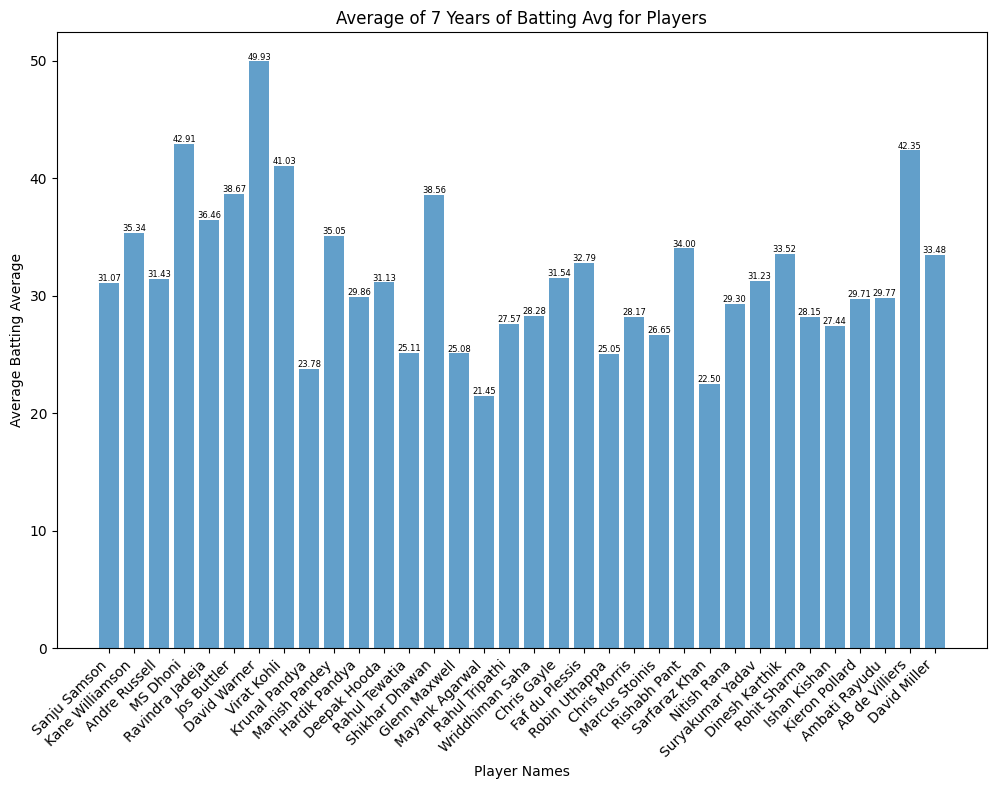

In [57]:
# Graph in Batting Average vs Players
plot_performance_allplayers(batsman_names_list, "Batting Avg", aggregated_batting_player_stats, 'Average Batting Average')

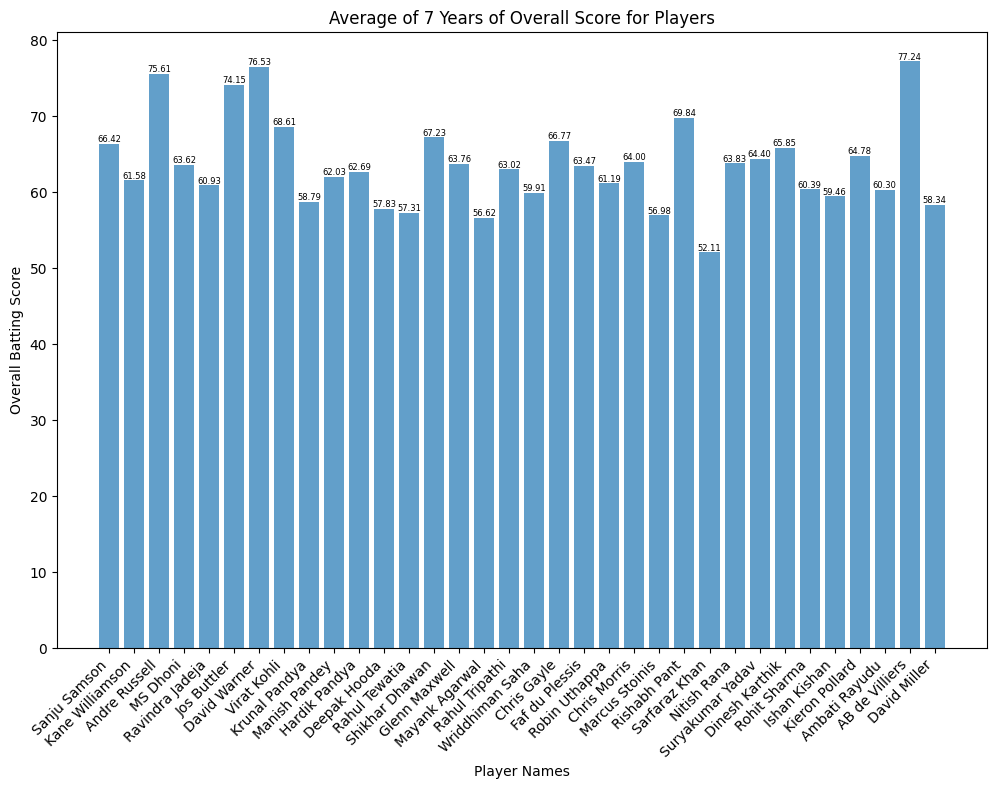

In [58]:
plot_performance_allplayers(batsman_names_list, "Overall Score", aggregated_batting_player_stats, 'Overall Batting Score')

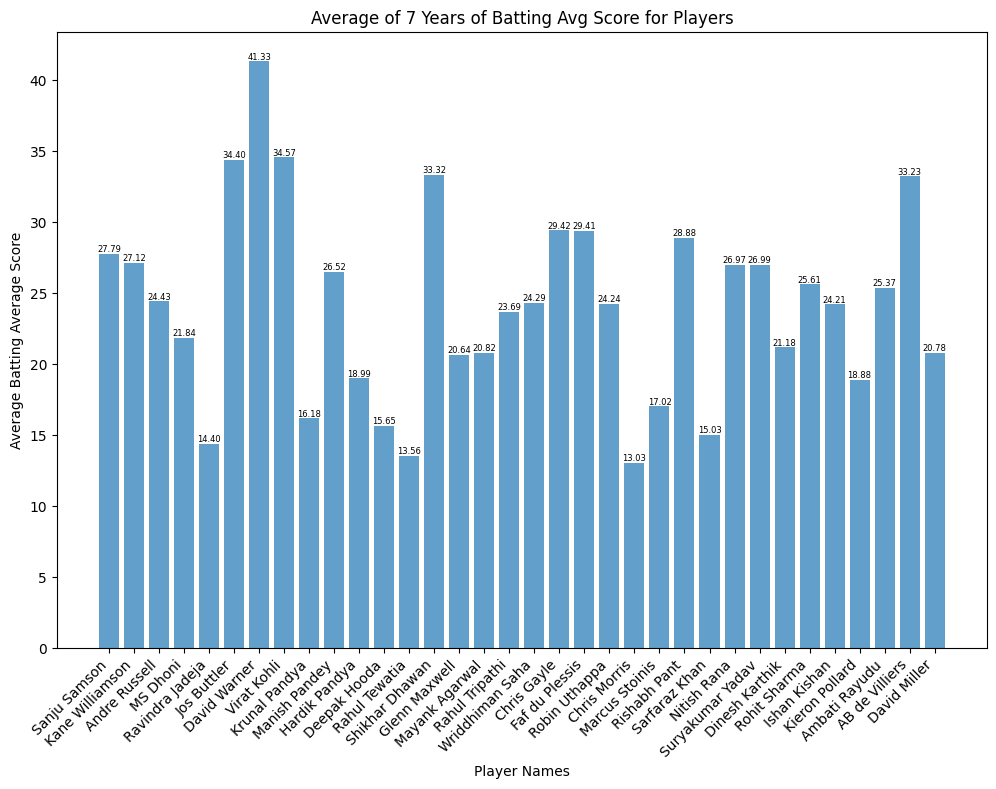

In [59]:
# Graph in Battin Average Score vs Players
plot_performance_allplayers(batsman_names_list, "Batting Avg Score", aggregated_batting_player_stats, 'Average Batting Average Score')

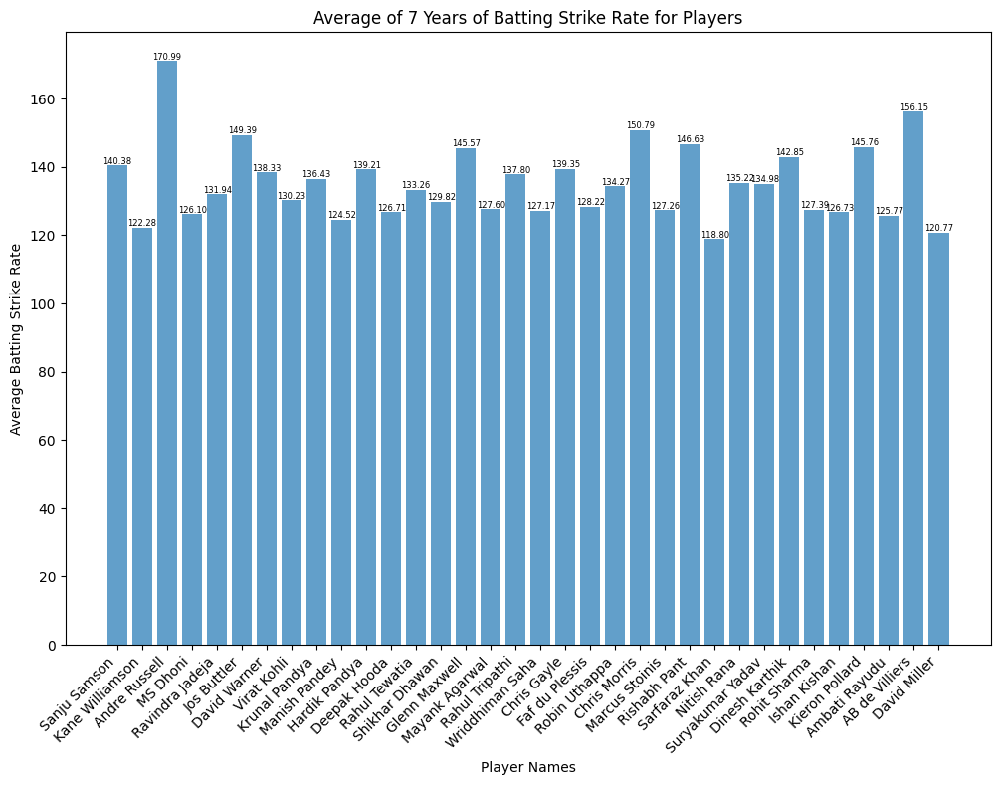

In [60]:
# Graph in Strike Rate vs Players
plot_performance_allplayers(batsman_names_list, "Batting Strike Rate", aggregated_batting_player_stats, 'Average Batting Strike Rate')

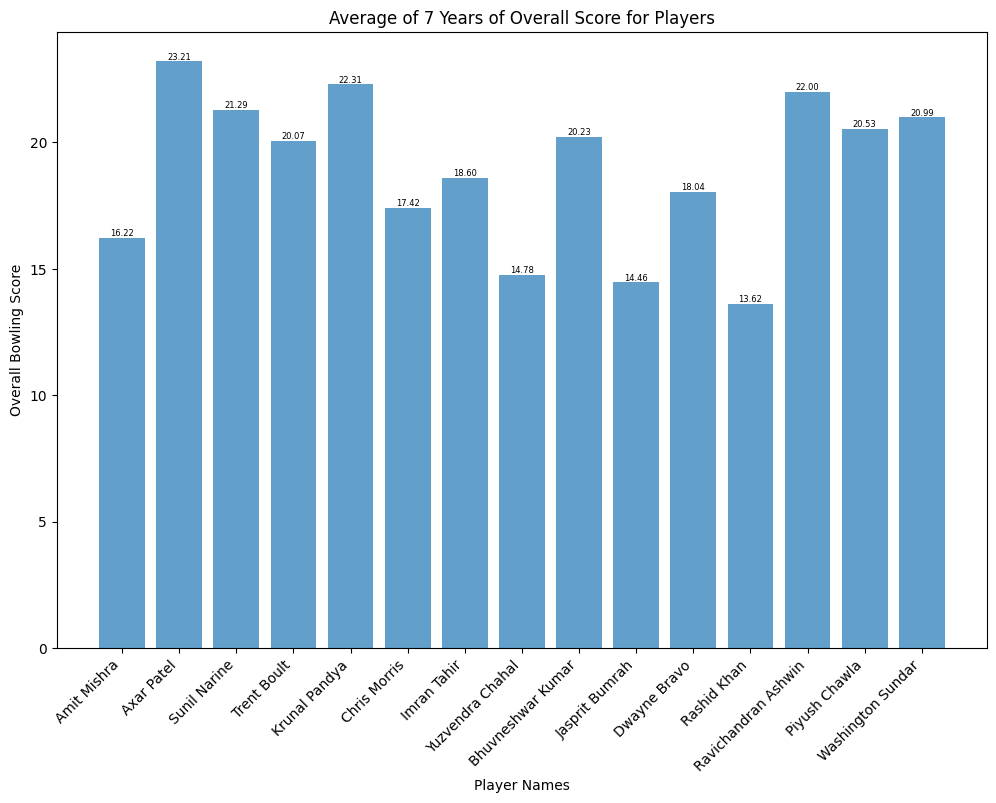

In [61]:
plot_performance_allplayers(bowler_names_list, "Overall Score", aggregated_bowling_player_stats, 'Overall Bowling Score')

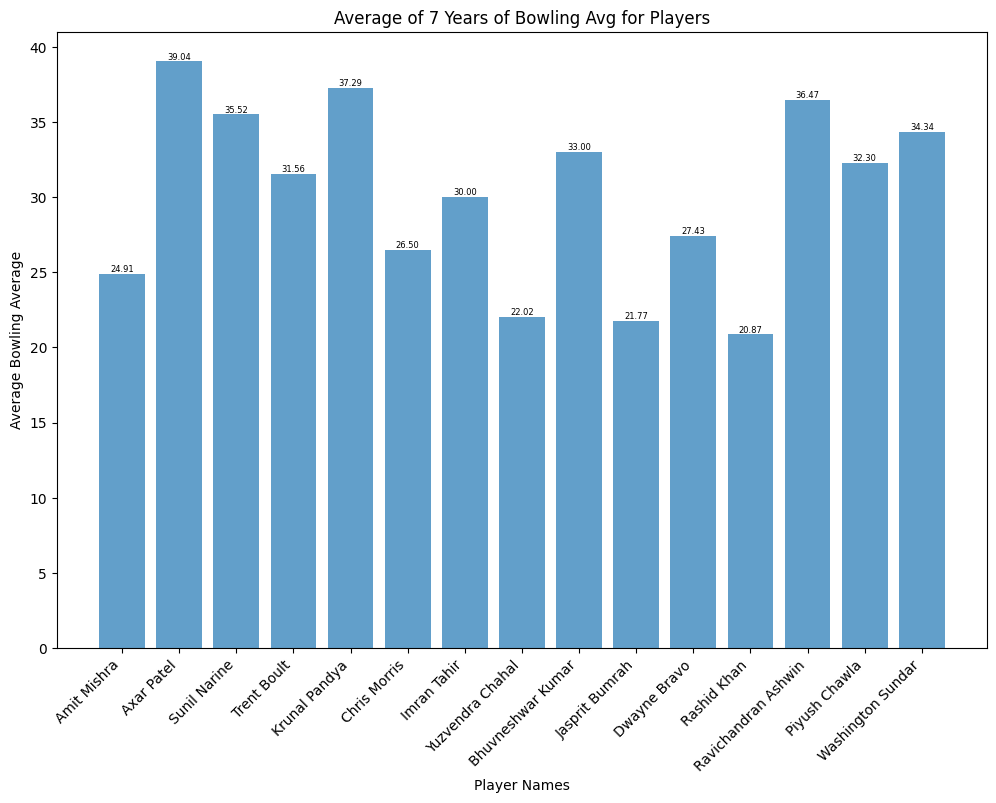

In [62]:
# Graph in Bowling Avgerage vs Players
plot_performance_allplayers(bowler_names_list, "Bowling Avg", aggregated_bowling_player_stats, 'Average Bowling Average')

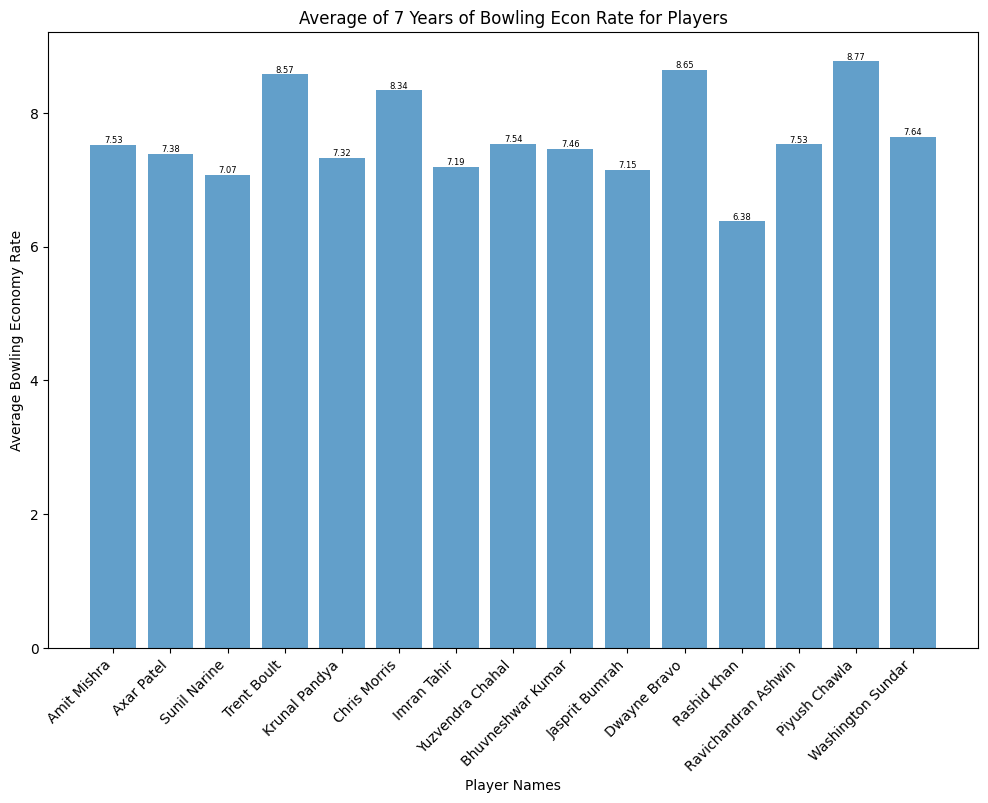

In [63]:
# Graph in Economy Rate vs Players
plot_performance_allplayers(bowler_names_list, "Bowling Econ Rate", aggregated_bowling_player_stats, 'Average Bowling Economy Rate')

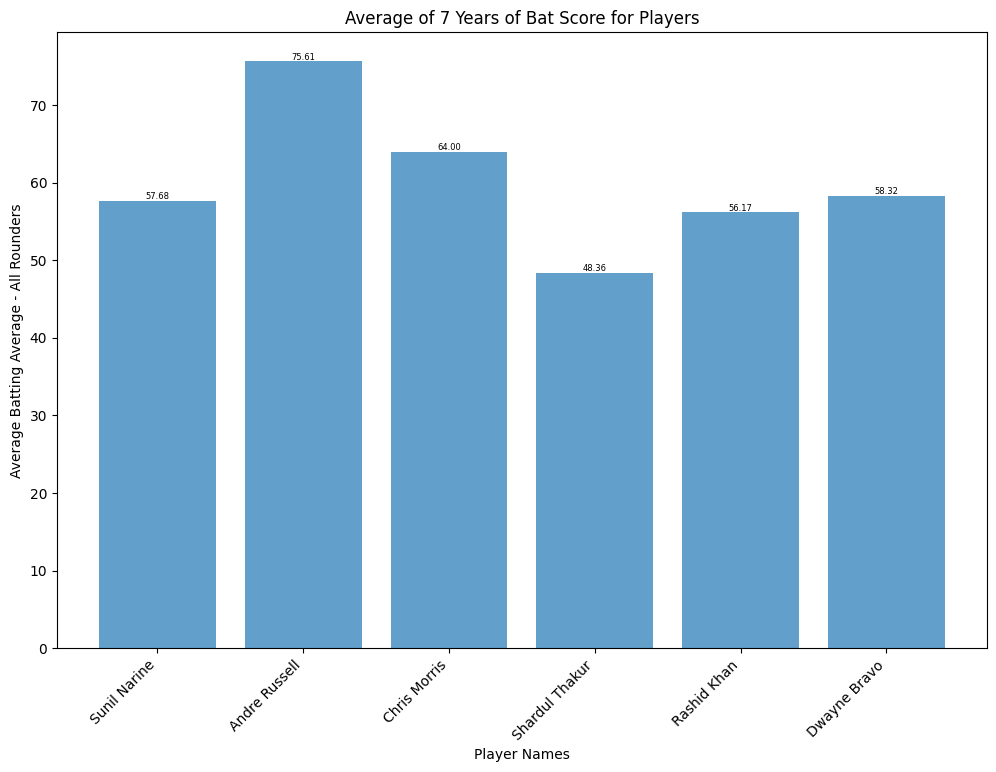

In [64]:
plot_performance_allplayers(allrounder_names_list, "Bat Score", aggregated_allrounder_player_stats, 'Average Batting Average - All Rounders')

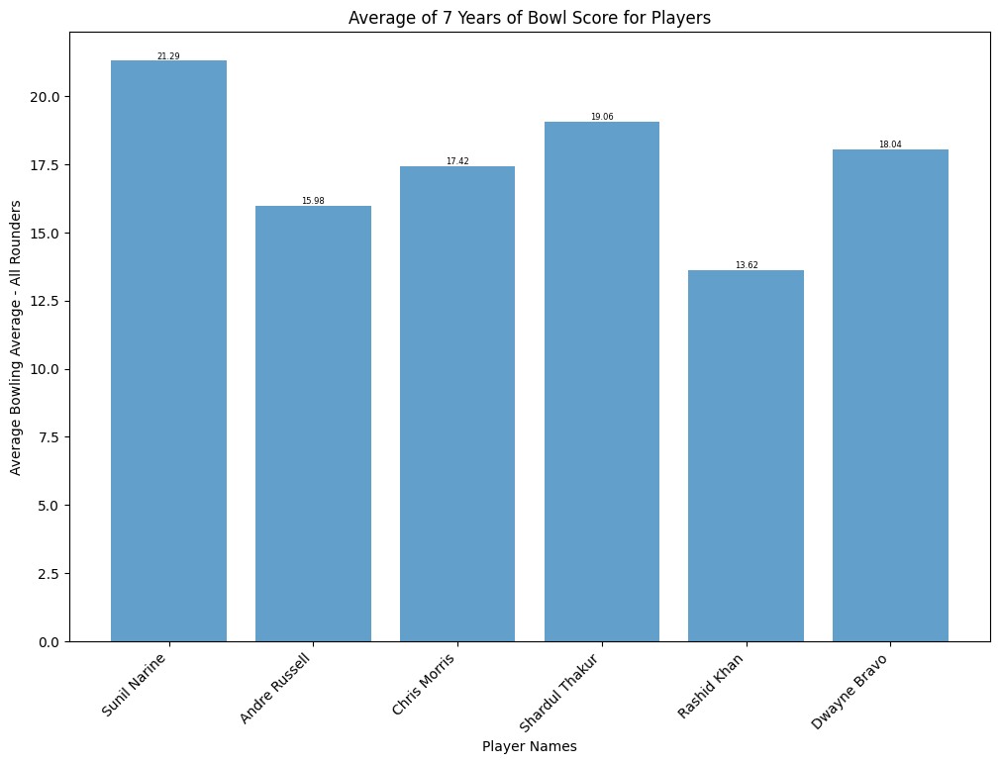

In [65]:
plot_performance_allplayers(allrounder_names_list, "Bowl Score", aggregated_allrounder_player_stats, 'Average Bowling Average - All Rounders')

In [66]:
# Function to plot player's performance over the years for multiple metrics
# or Historical Performance
def plot_player_performance(player_name, performance_metrics, data, ylabel):
    years = [entry['Year'] for entry in data if entry['Player'] == player_name]
    metric_values = {metric: [entry[metric] for entry in data if entry['Player'] == player_name] for metric in performance_metrics}

    plt.figure(figsize=(12, 8))  # Increase the figure size for better visibility
    
    for metric, values in metric_values.items():
        plt.plot(years, values, marker='o', label=metric)
        for i, value in enumerate(values):
            plt.text(years[i], value, f'{value:.2f}', ha='center', va='bottom', fontsize=10, color='black')
            
            
    plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability
    plt.xlabel('Year')
    plt.ylabel(ylabel)
    plt.title(f'{player_name} Performance over the Years')
    plt.legend()  # Display legend for different metrics
    plt.grid(True)  # Display grid lines
    plt.show()


performance_batting_metrics = ["Avg", "SR", "Avg_score" ]
performance_bowling_metrics = ["Econ", "Avg"]
performance_allrounder_metrics = ["Bat_score" , "Bowl_score"]

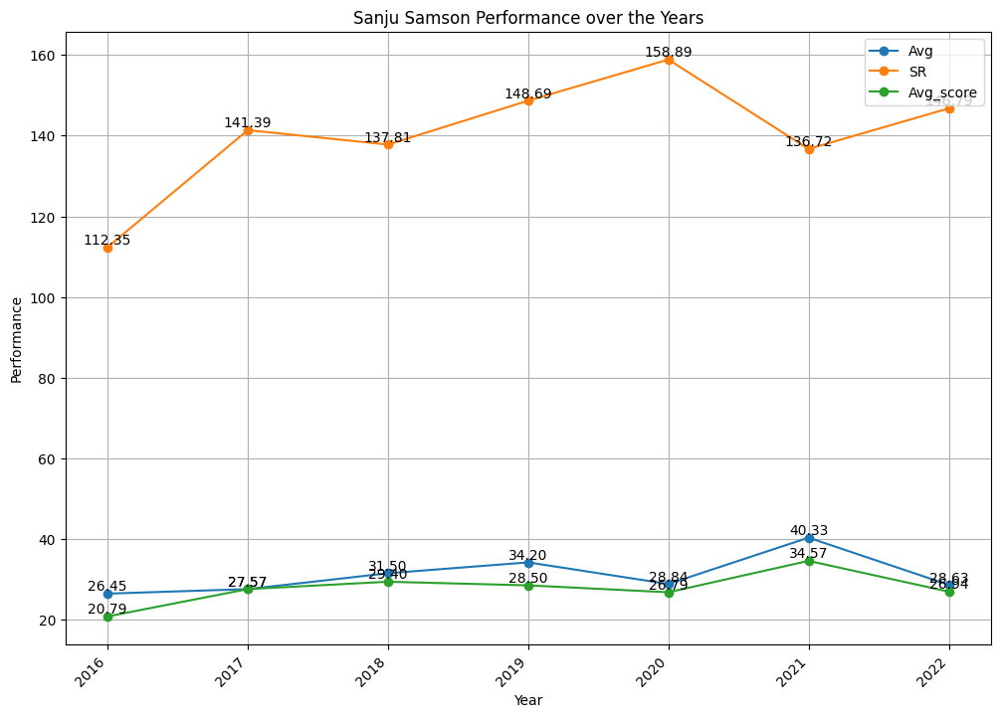

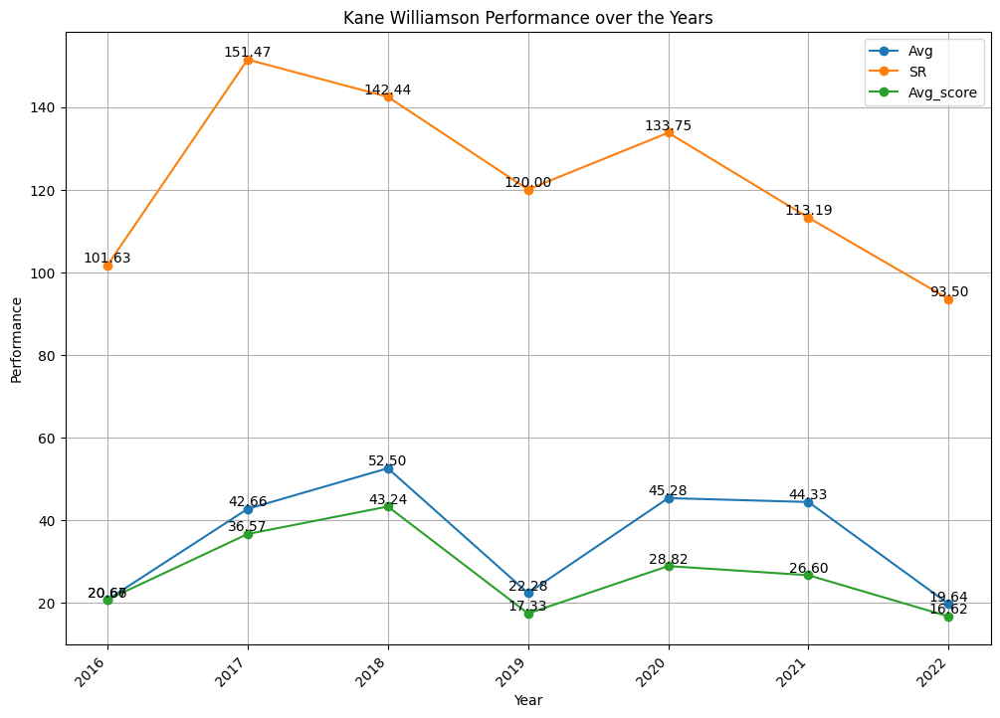

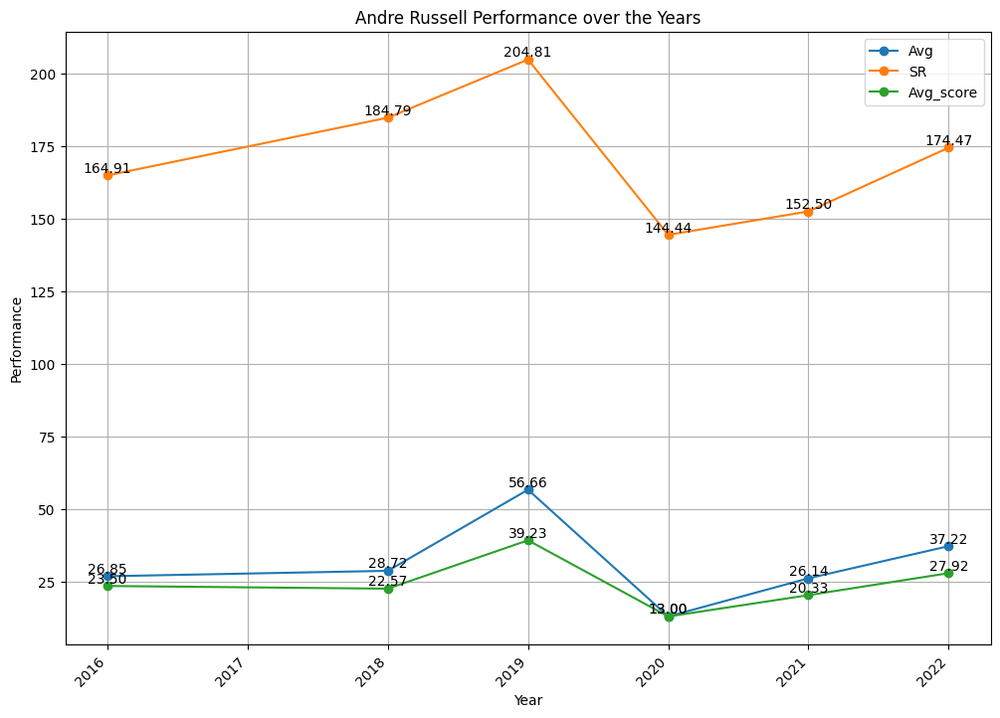

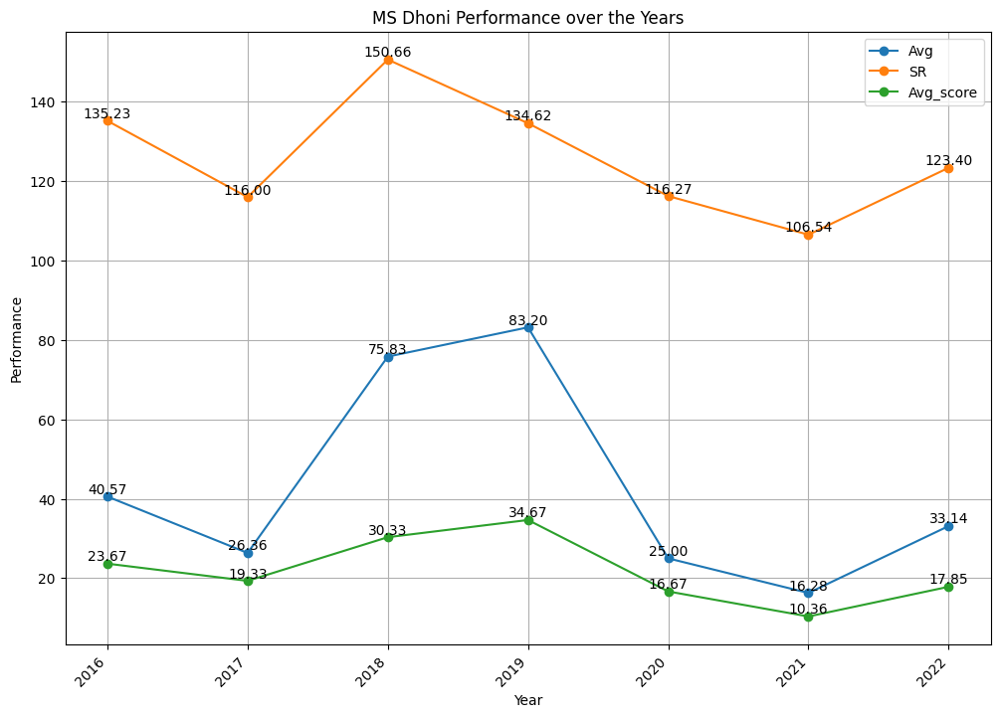

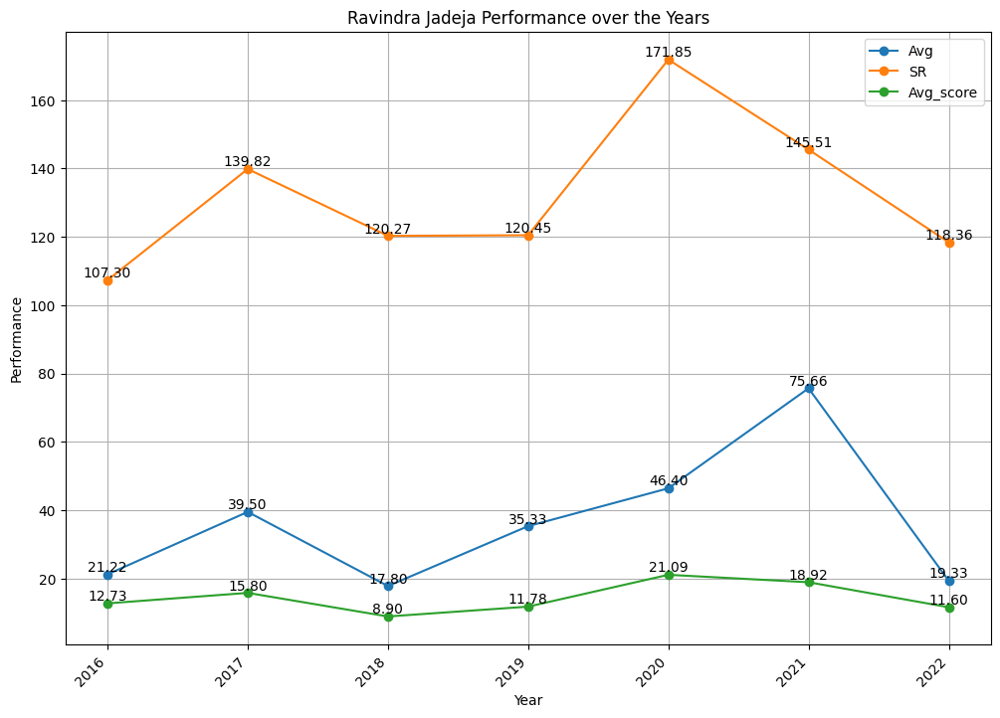

...

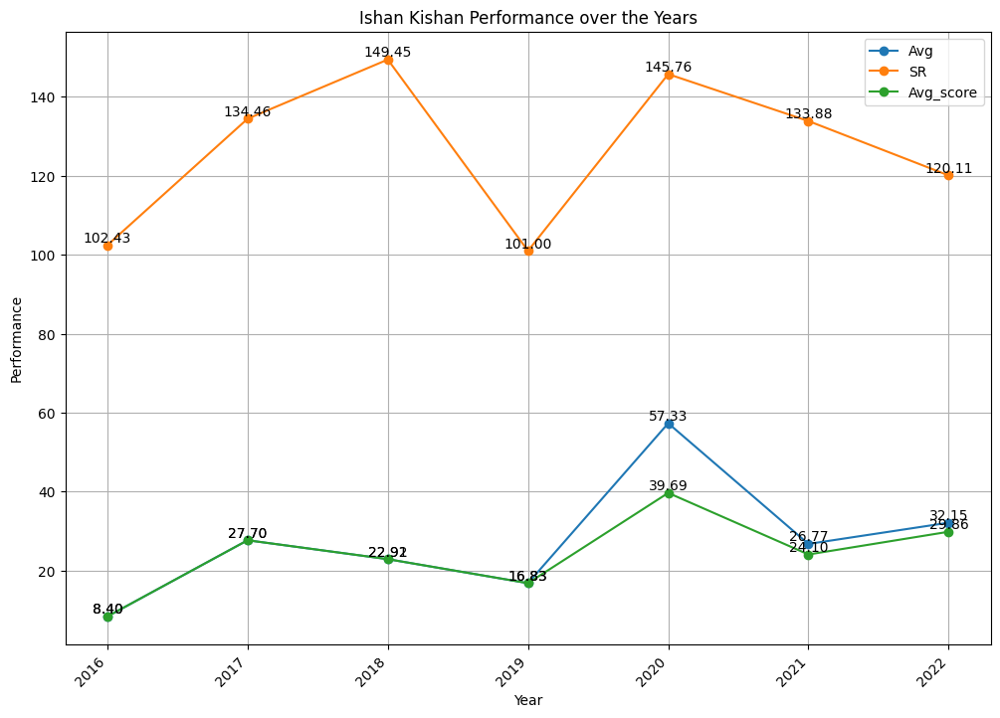

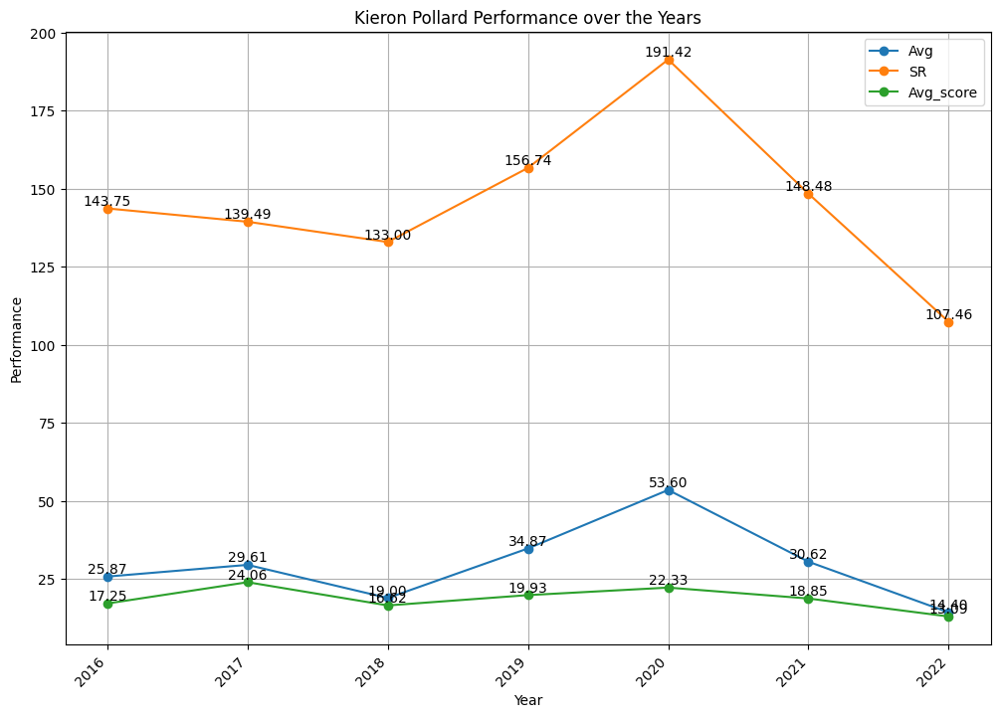

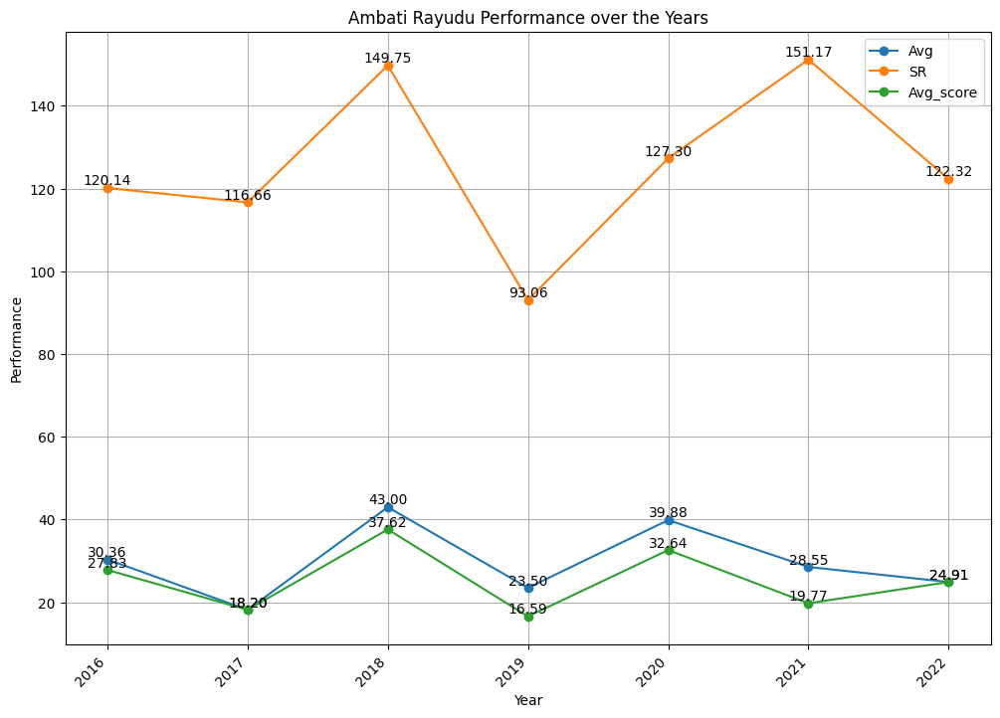

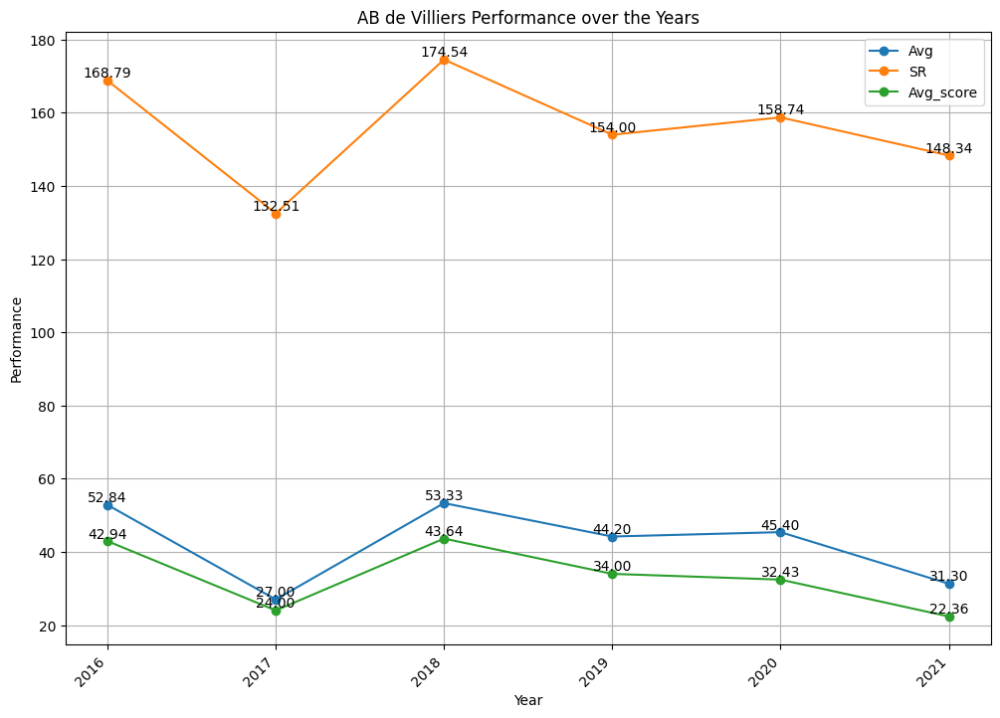

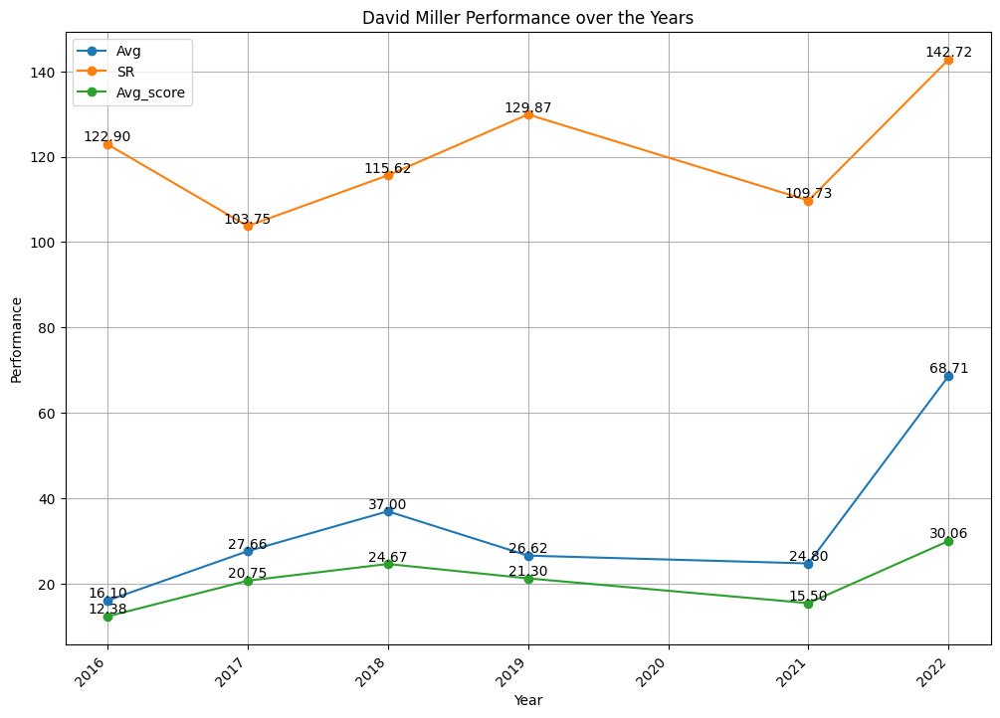

In [67]:
# Plot the graphs for batsman using the actual data directly
for player_name in overall_top_batsman:
    plot_player_performance(player_name, performance_batting_metrics, all_batting_data, 'Performance')

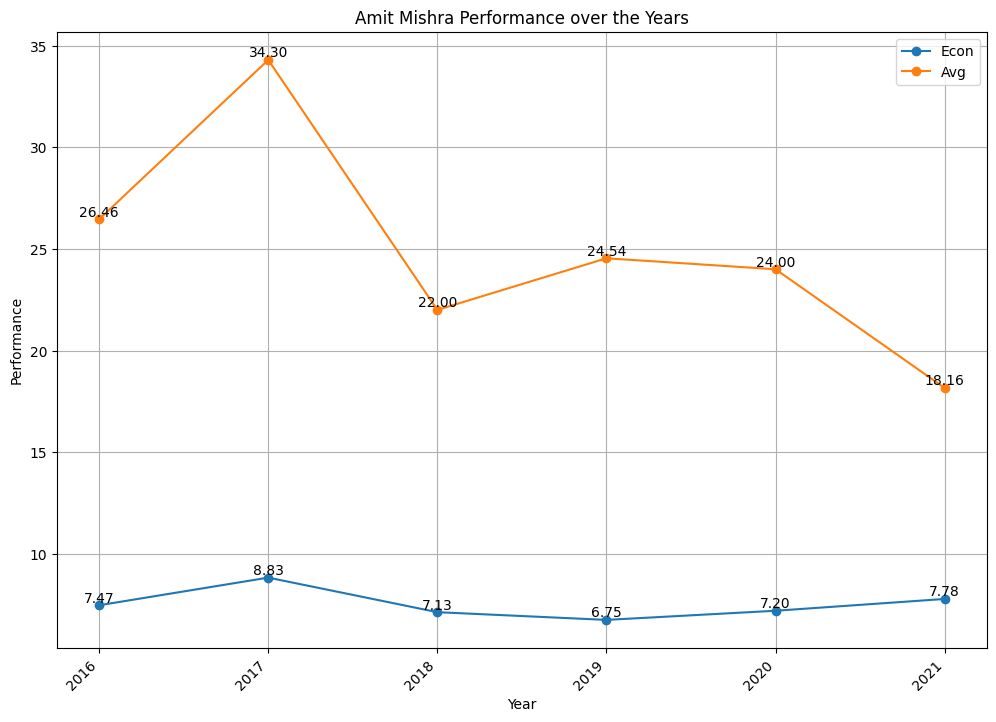

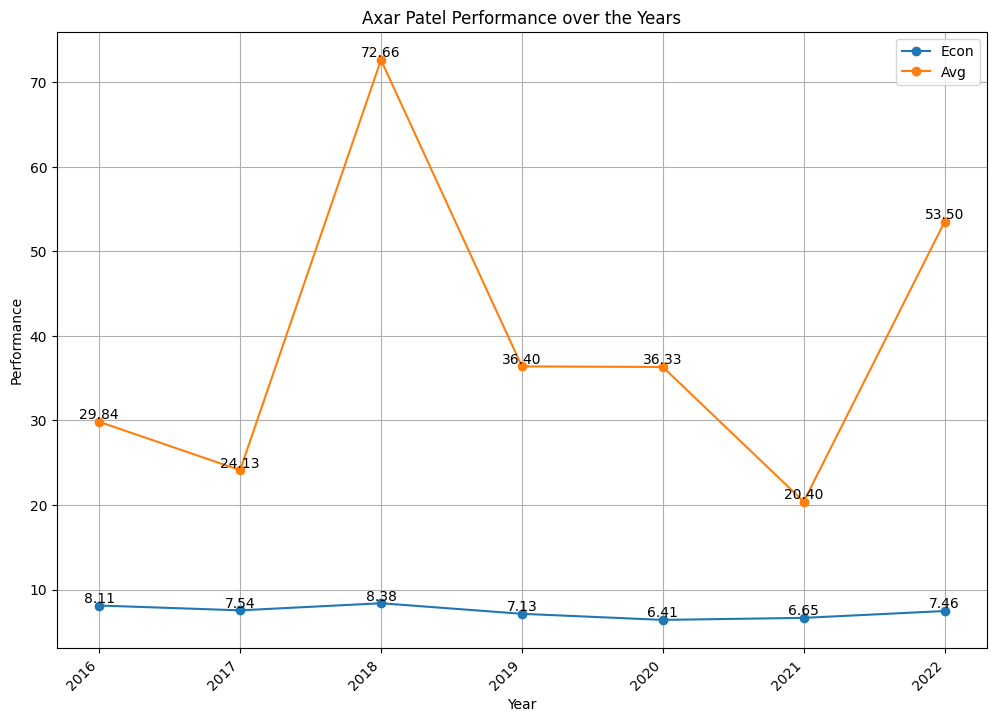

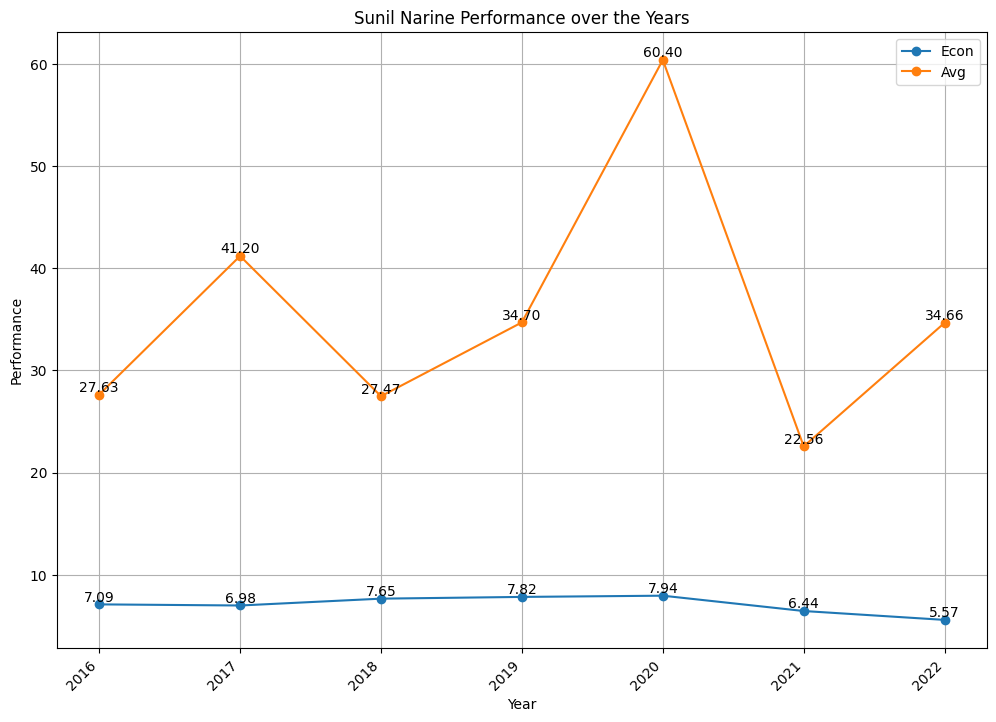

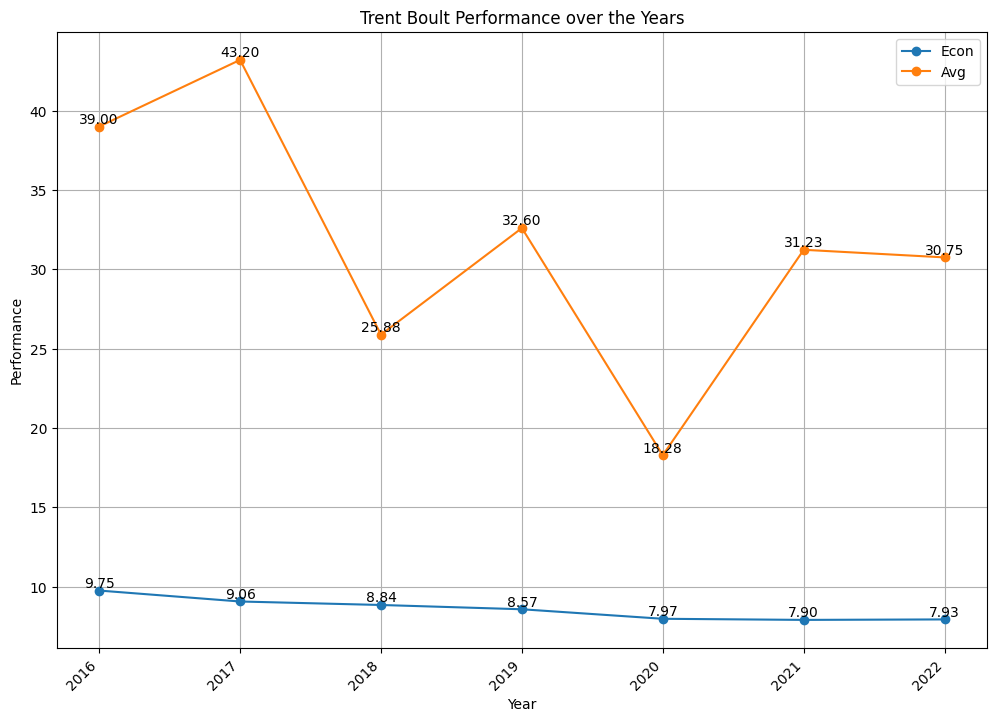

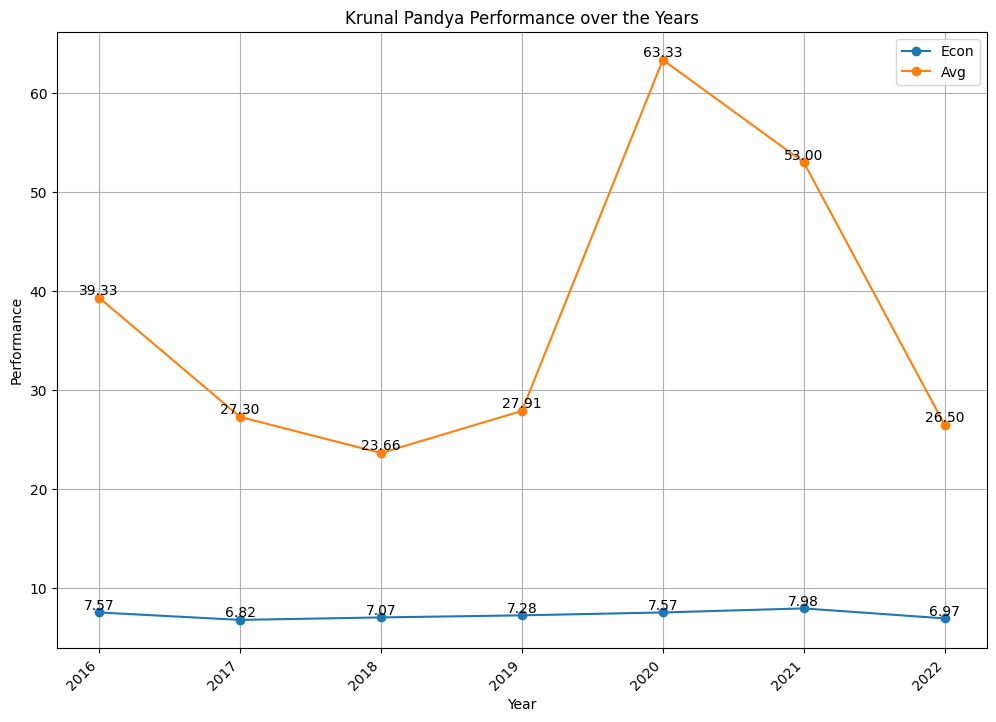

...

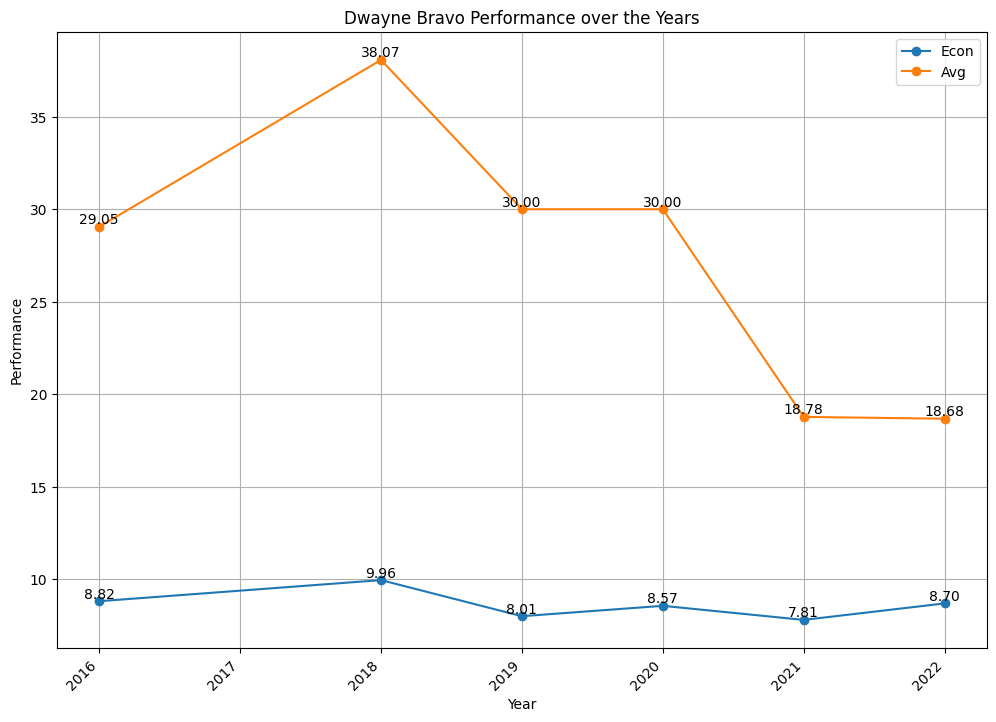

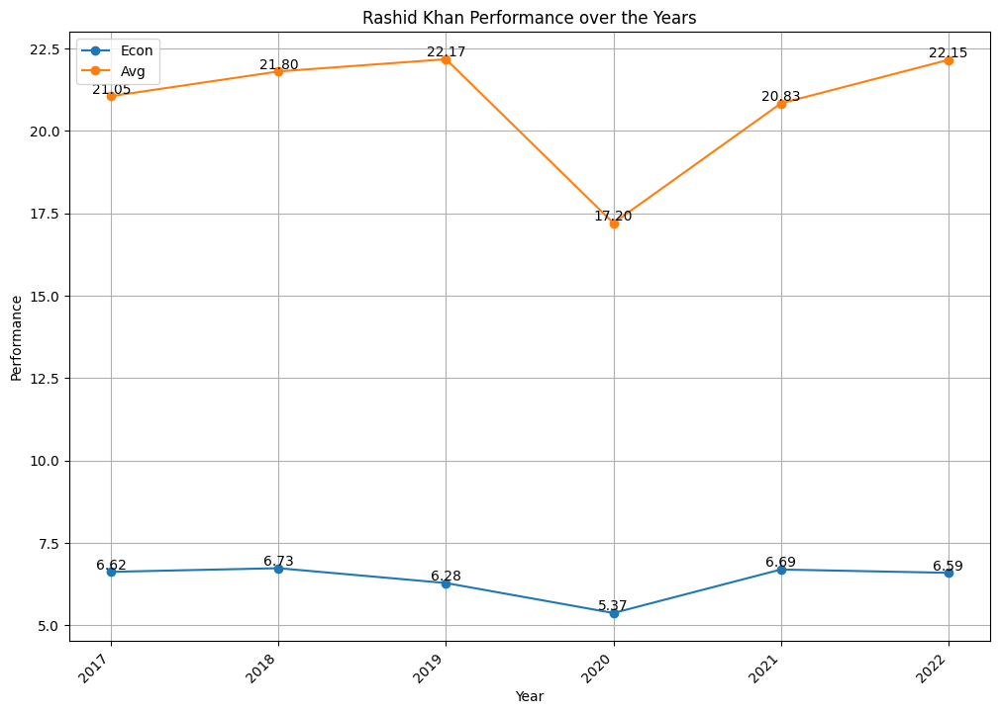

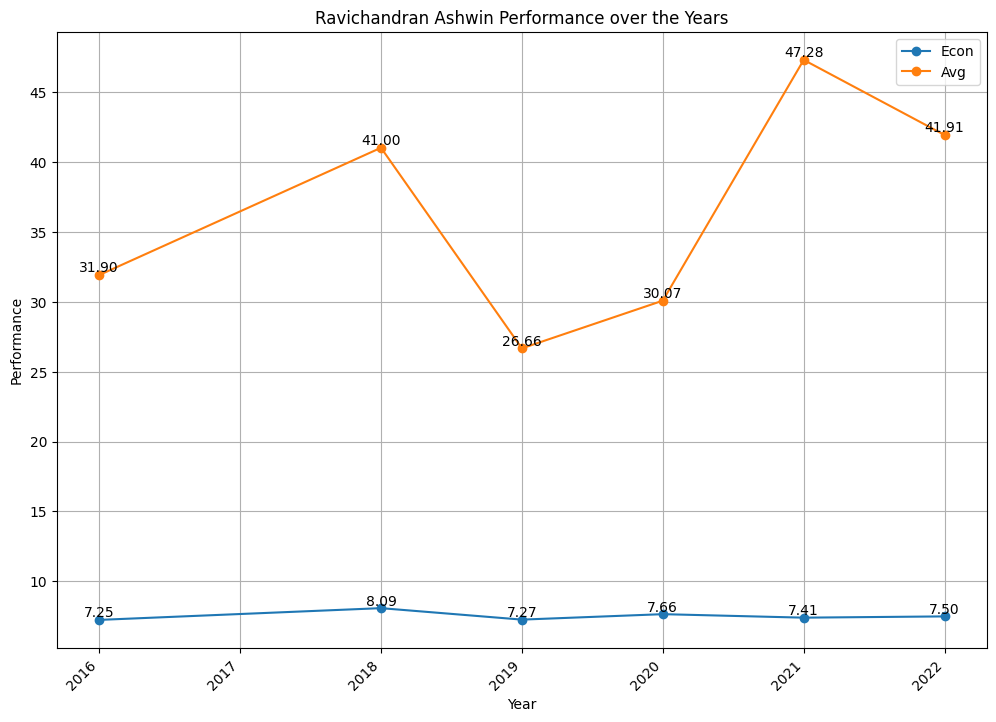

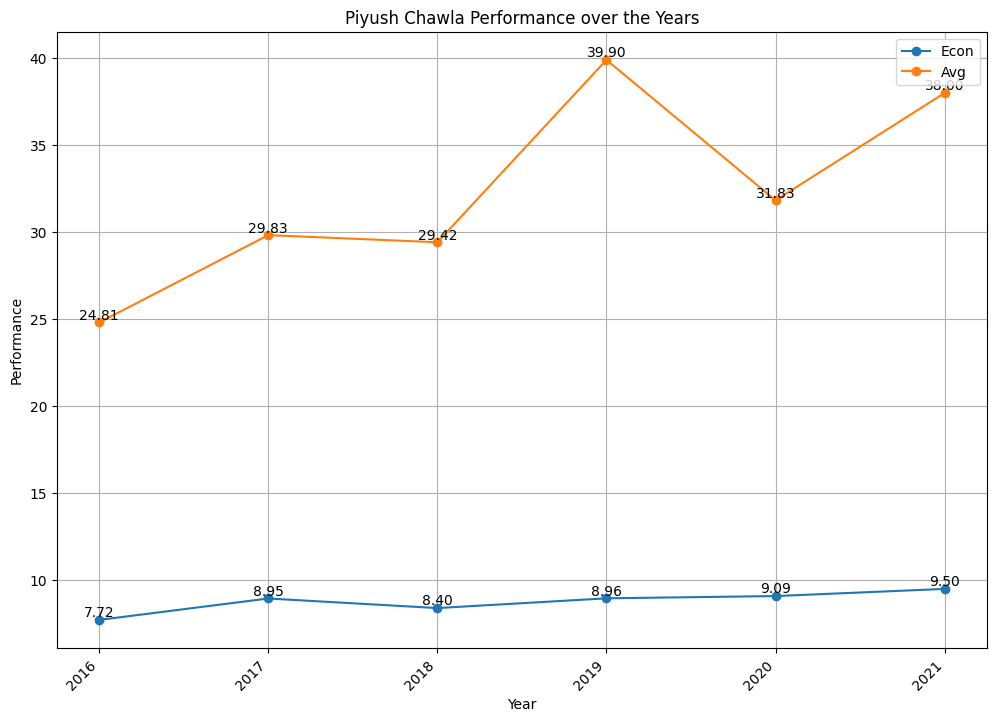

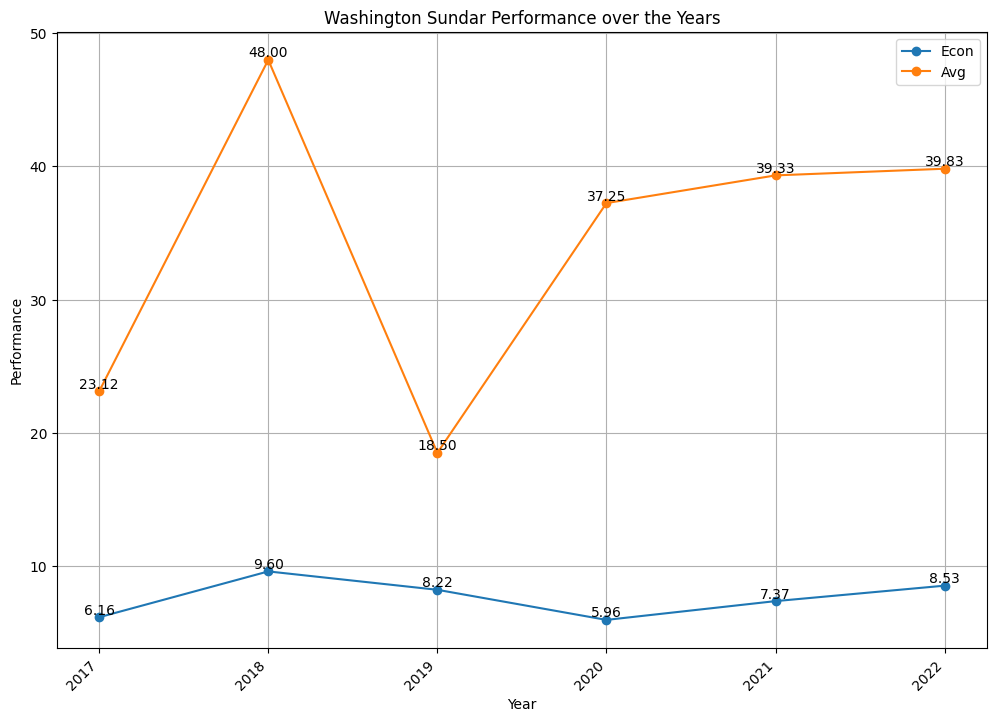

In [68]:
# Plot the graphs in bowlers using the actual data directly
for player_name in overall_top_bowler:
    plot_player_performance(player_name, performance_bowling_metrics, all_bowling_data, 'Performance')

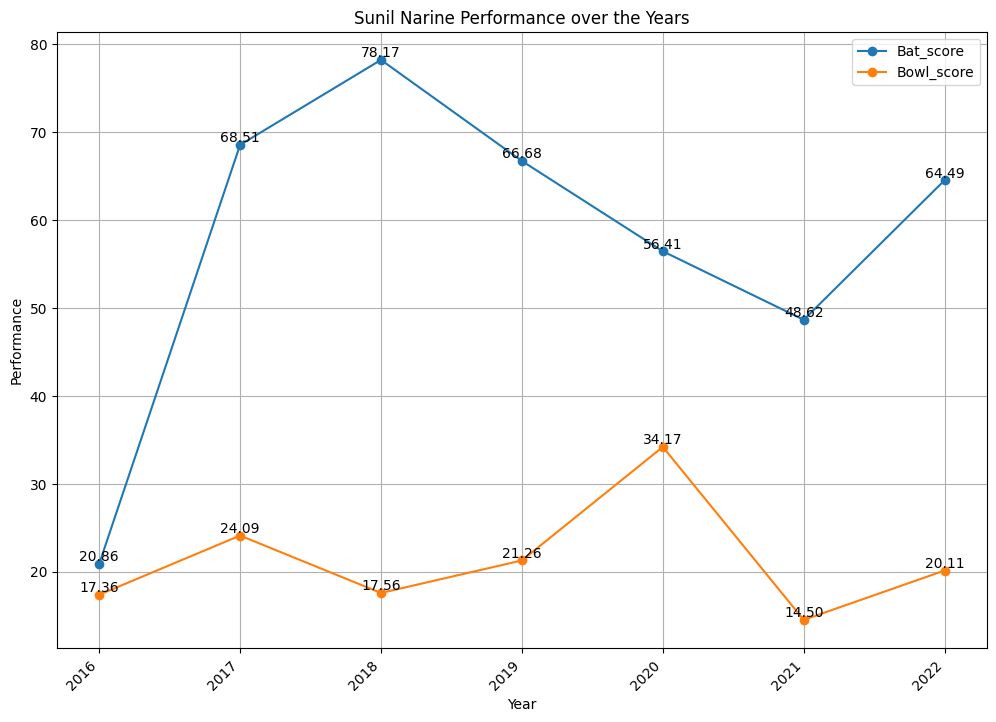

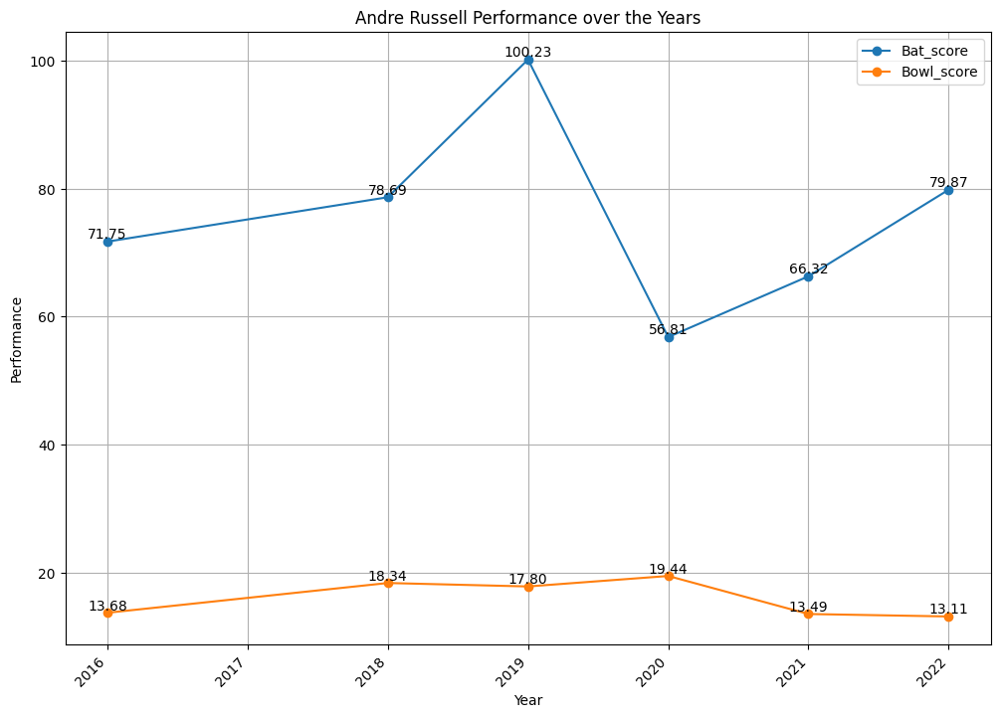

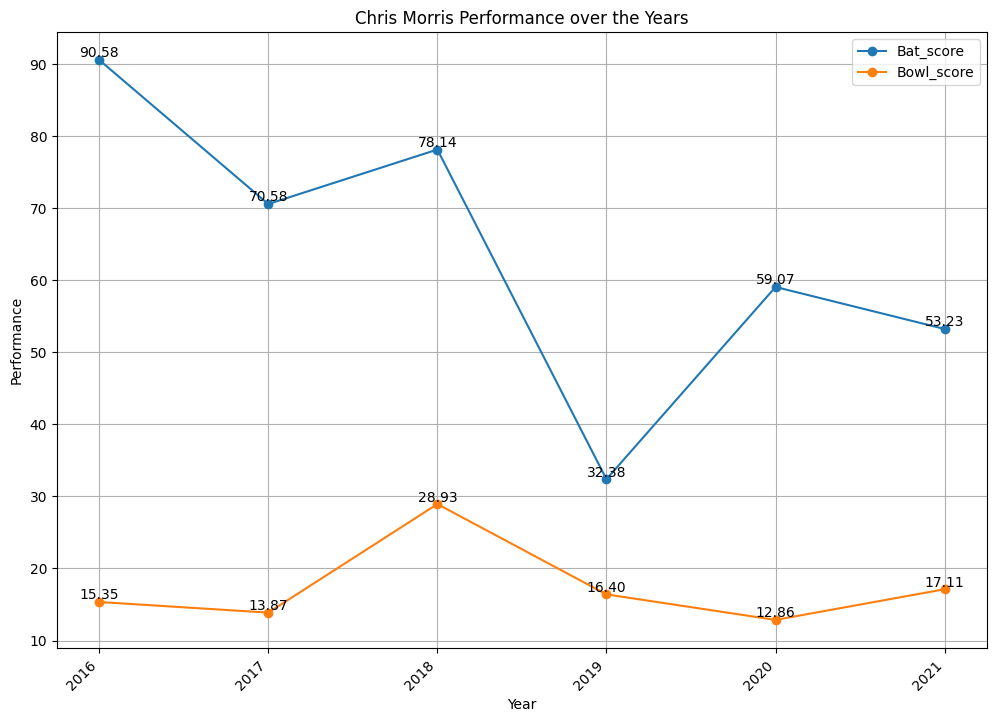

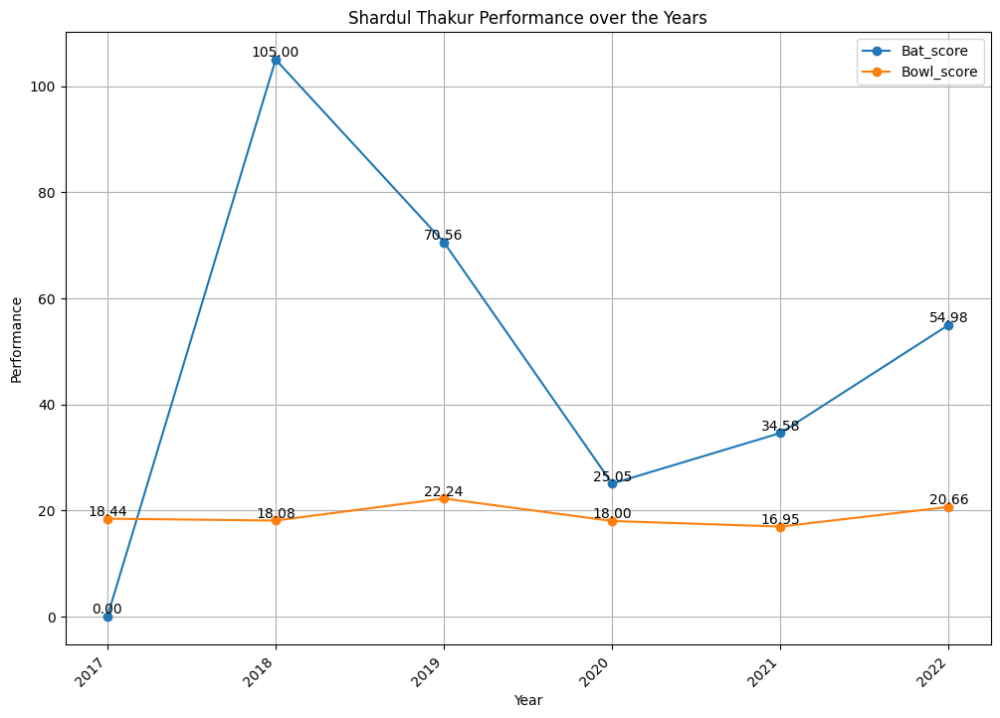

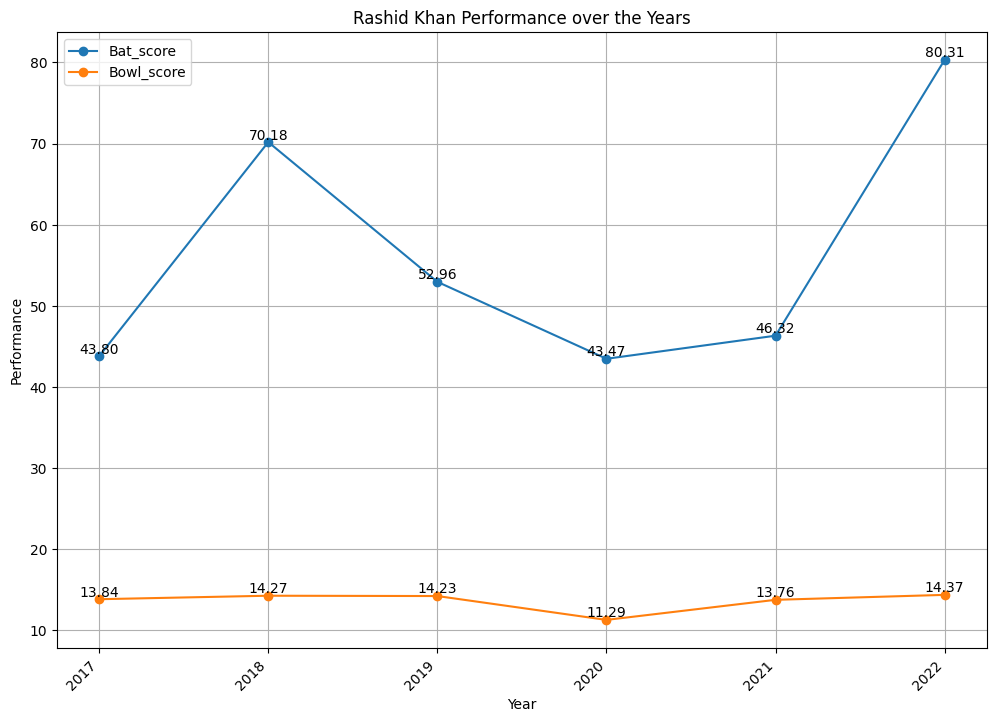

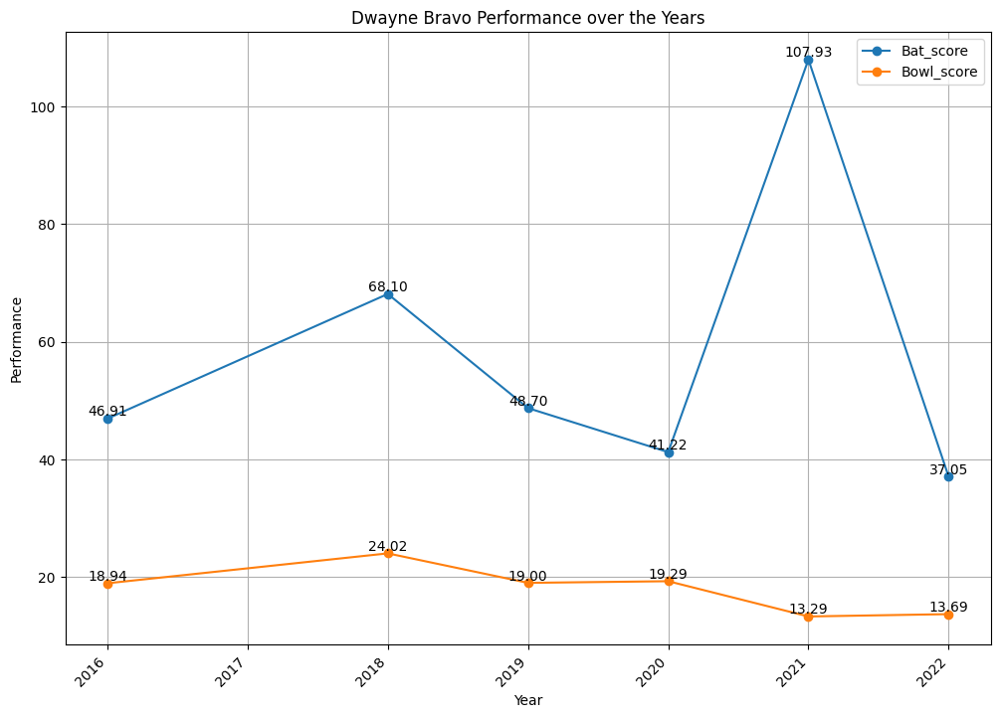

In [69]:
for player_name in overall_top_allrounder:
    plot_player_performance(player_name, performance_allrounder_metrics, all_rounder_data, 'Performance')

In [70]:
batsman_names_list[:]

['Sanju Samson',
 'Kane Williamson',
 'Andre Russell',
 'MS Dhoni',
 'Ravindra Jadeja',
 'Jos Buttler',
 'David Warner',
 'Virat Kohli',
 'Krunal Pandya',
 'Manish Pandey',
 'Hardik Pandya',
 'Deepak Hooda',
 'Rahul Tewatia',
 'Shikhar Dhawan',
 'Glenn Maxwell',
 'Mayank Agarwal',
 'Rahul Tripathi',
 'Wriddhiman Saha',
 'Chris Gayle',
 'Faf du Plessis',
 'Robin Uthappa',
 'Chris Morris',
 'Marcus Stoinis',
 'Rishabh Pant',
 'Sarfaraz Khan',
 'Nitish Rana',
 'Suryakumar Yadav',
 'Dinesh Karthik',
 'Rohit Sharma',
 'Ishan Kishan',
 'Kieron Pollard',
 'Ambati Rayudu',
 'AB de Villiers',
 'David Miller']

Player: Sanju Samson, Metric: Batting Avg, Slope (Coefficient): 1.0499999999999996, Intercept: -2088.8757142857135


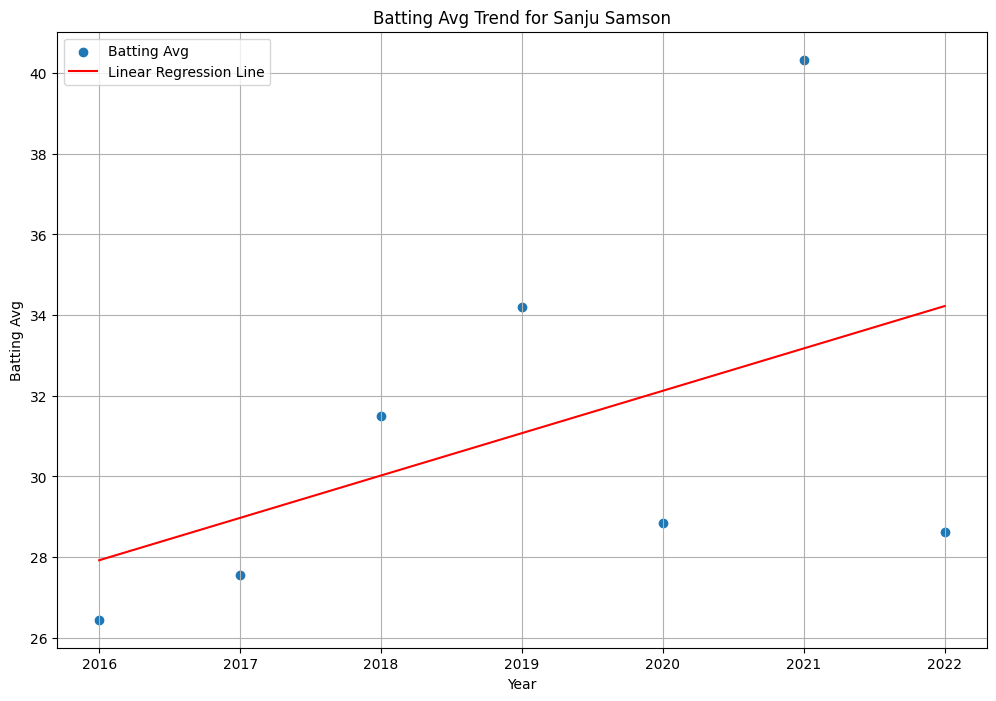

Player: Sanju Samson, Metric: Strike Rate, Slope (Coefficient): 4.109285714285714, Intercept: -8156.270714285713


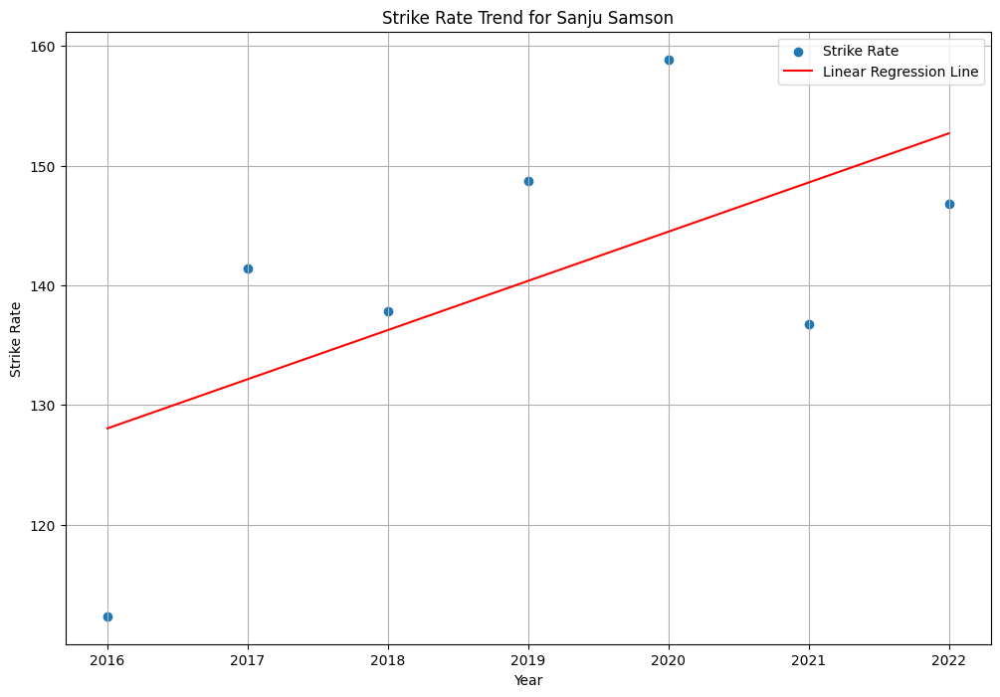

Player: Sanju Samson, Metric: Batting Avg Score, Slope (Coefficient): 1.0661464585834333, Intercept: -2124.75606242497


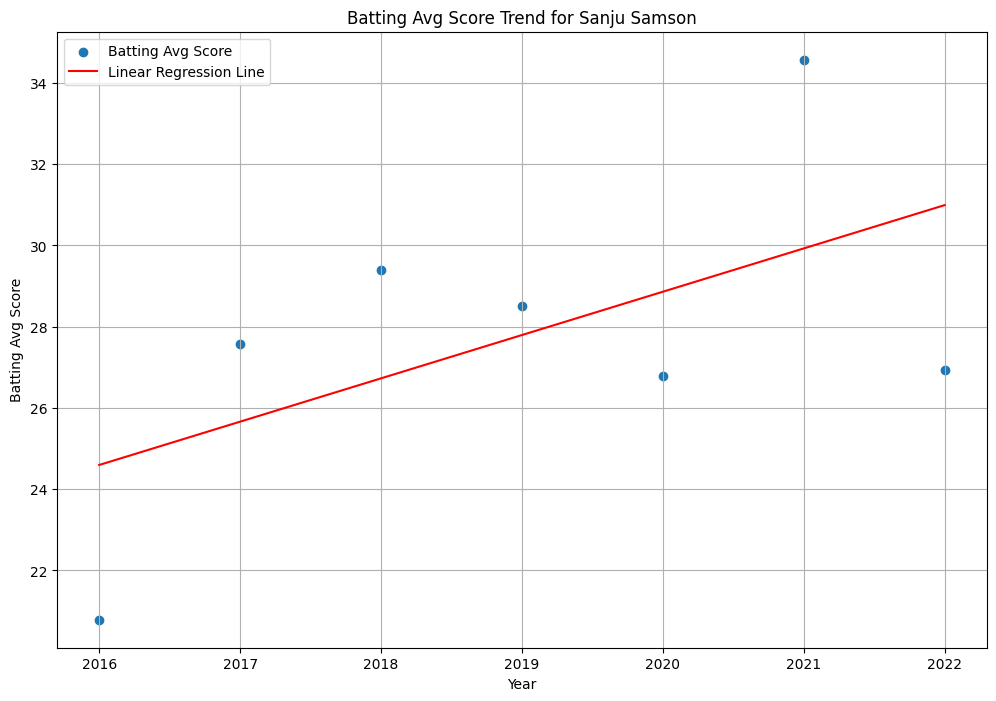

Player: Kane Williamson, Metric: Batting Avg, Slope (Coefficient): -0.24785714285714253, Intercept: 535.759285714285


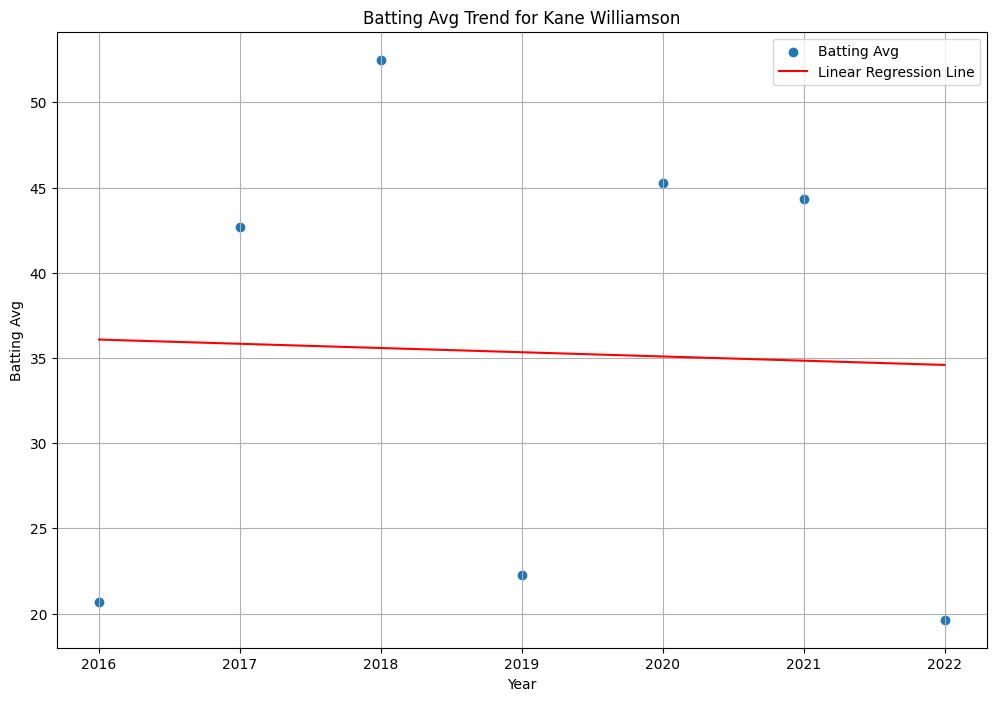

Player: Kane Williamson, Metric: Strike Rate, Slope (Coefficient): -3.915714285714285, Intercept: 8028.109999999999


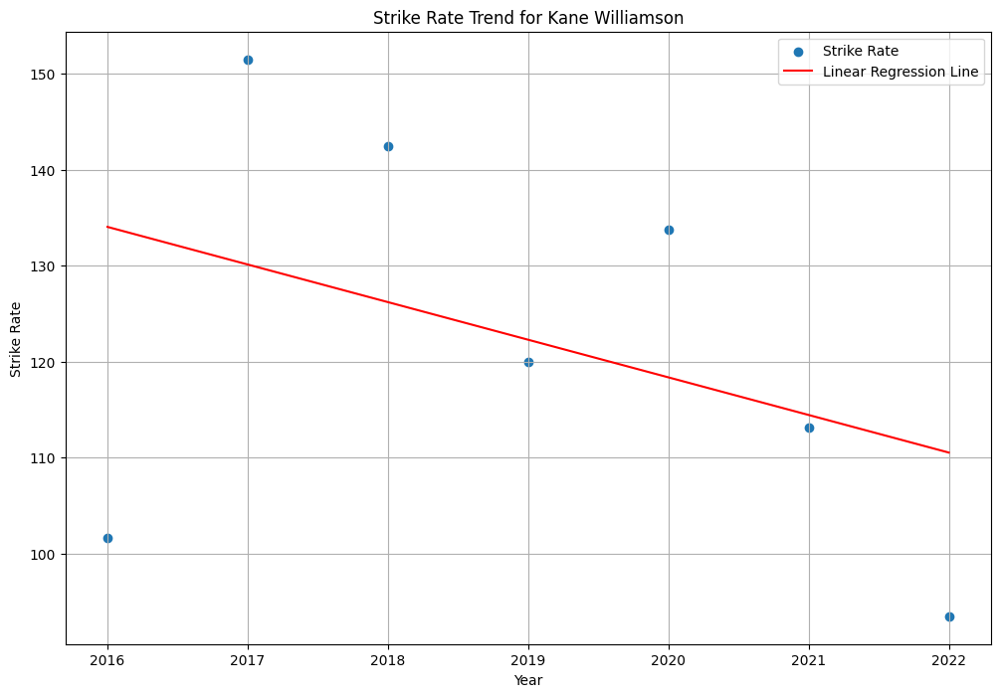

Player: Kane Williamson, Metric: Batting Avg Score, Slope (Coefficient): -1.6612076998631617, Intercept: 3381.0983873269583


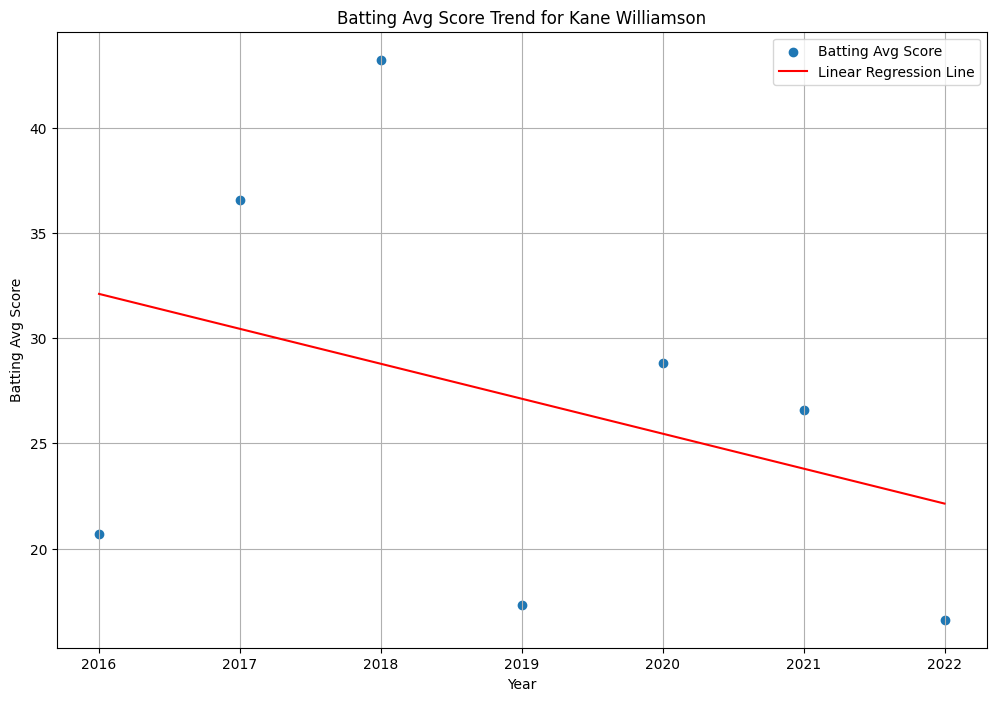

Player: Andre Russell, Metric: Batting Avg, Slope (Coefficient): 0.20599999999999974, Intercept: -384.5509999999995


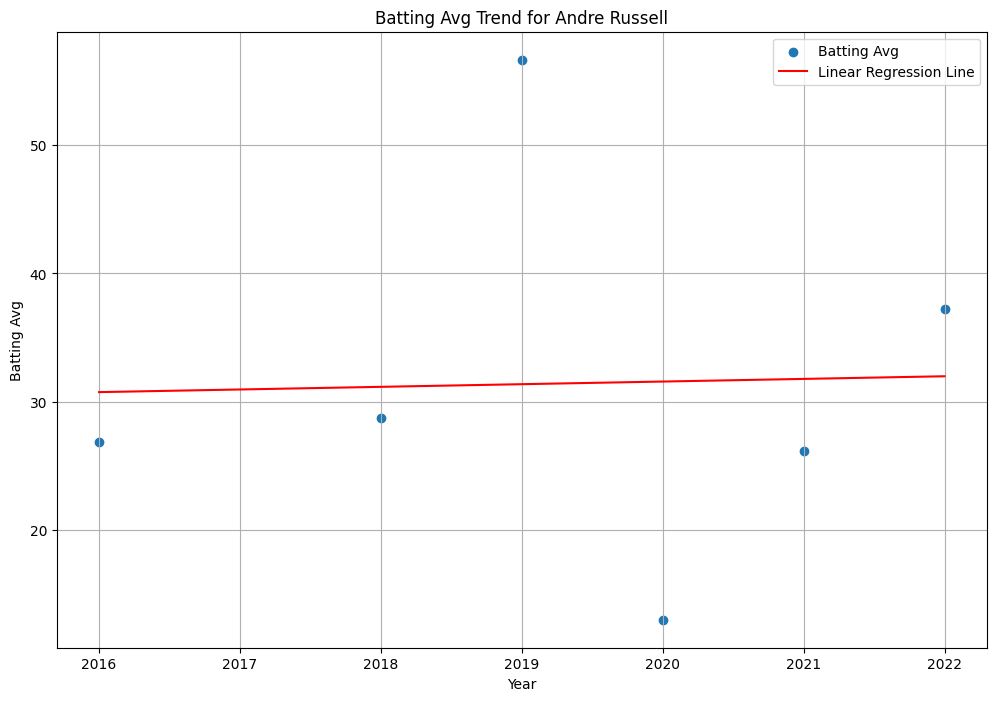

Player: Andre Russell, Metric: Strike Rate, Slope (Coefficient): -2.0847142857142846, Intercept: 4380.719714285712


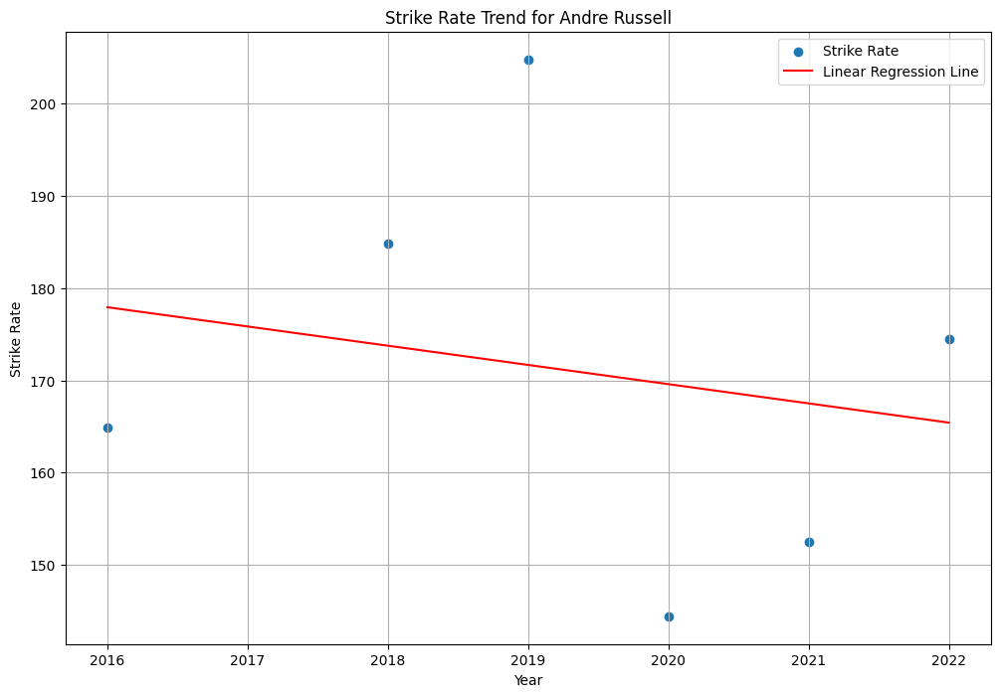

Player: Andre Russell, Metric: Batting Avg Score, Slope (Coefficient): -0.19309262166405028, Intercept: 414.34373364730516


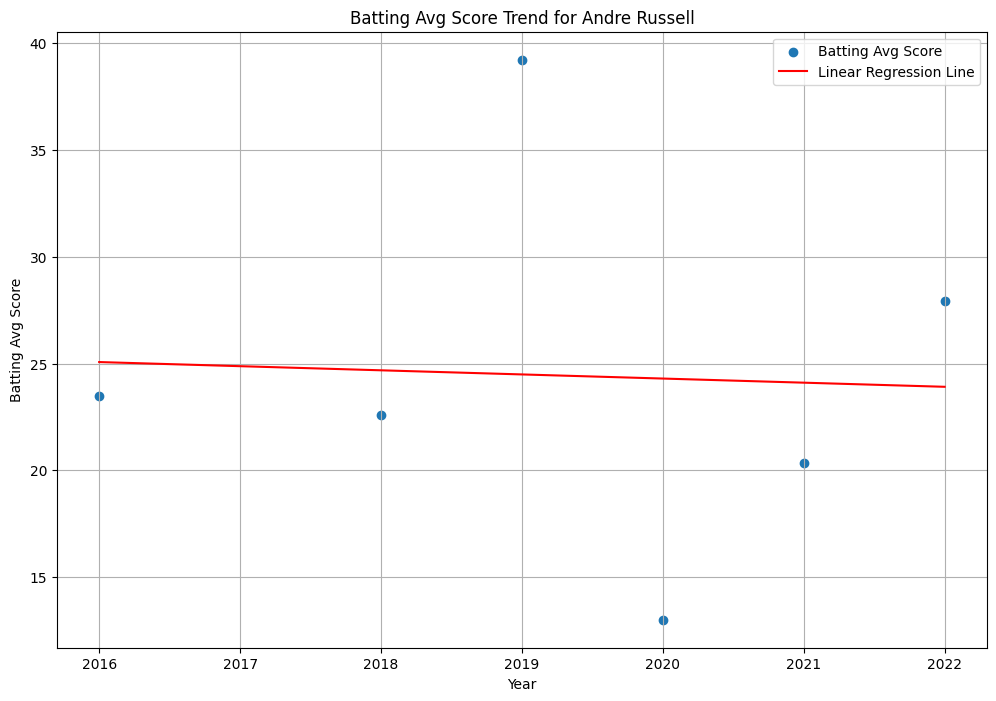

Player: MS Dhoni, Metric: Batting Avg, Slope (Coefficient): -3.3314285714285714, Intercept: 6769.065714285714


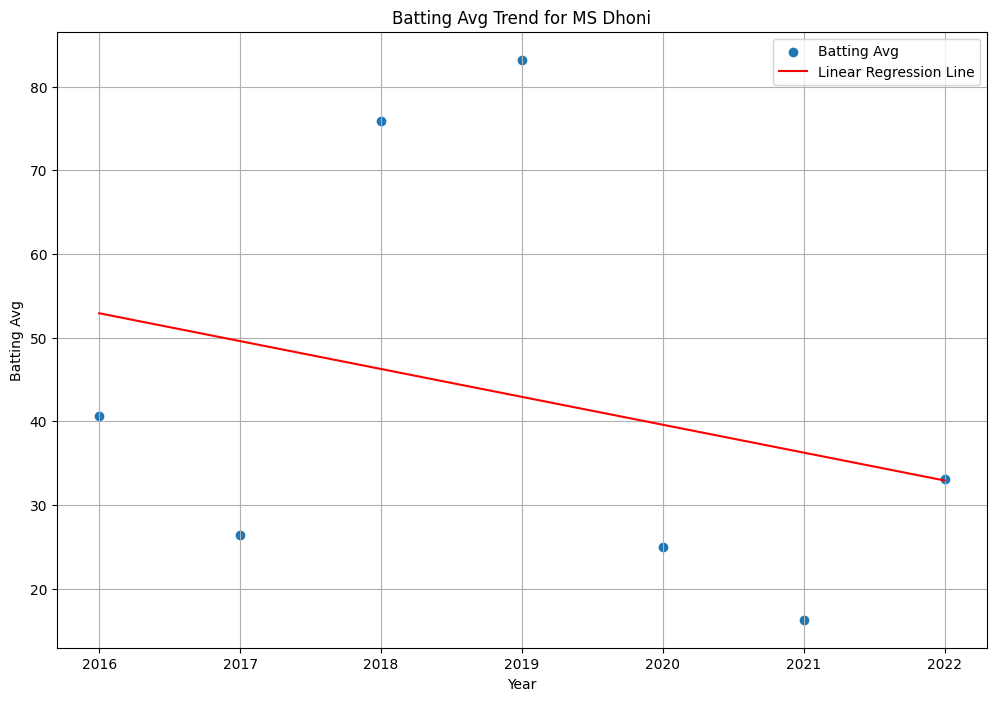

Player: MS Dhoni, Metric: Strike Rate, Slope (Coefficient): -3.1714285714285695, Intercept: 6529.217142857139


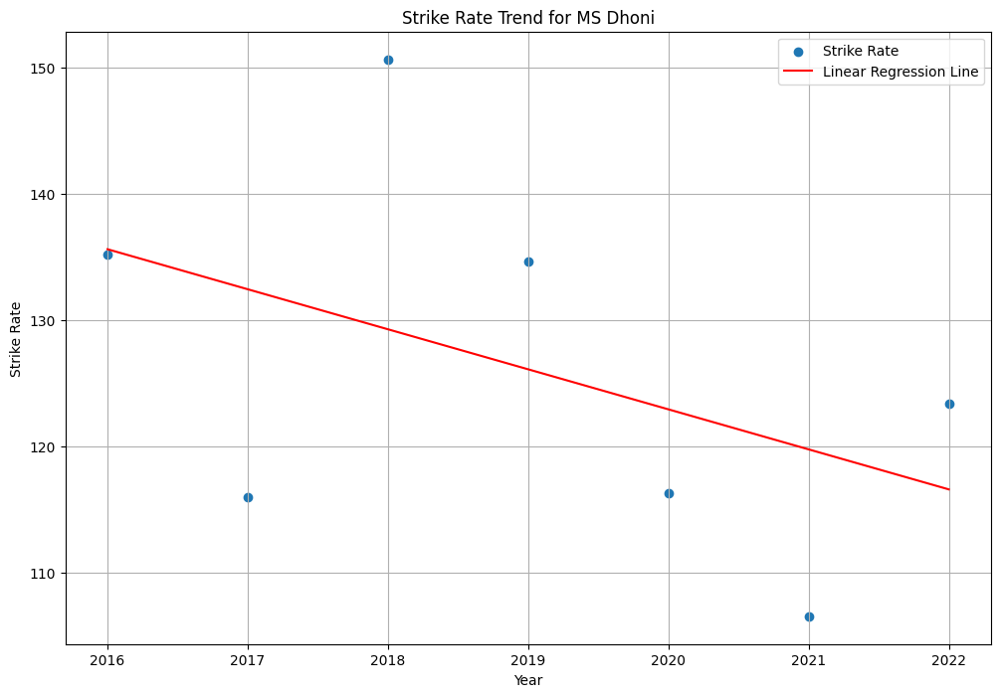

Player: MS Dhoni, Metric: Batting Avg Score, Slope (Coefficient): -1.7524142524142523, Intercept: 3559.9638694638693


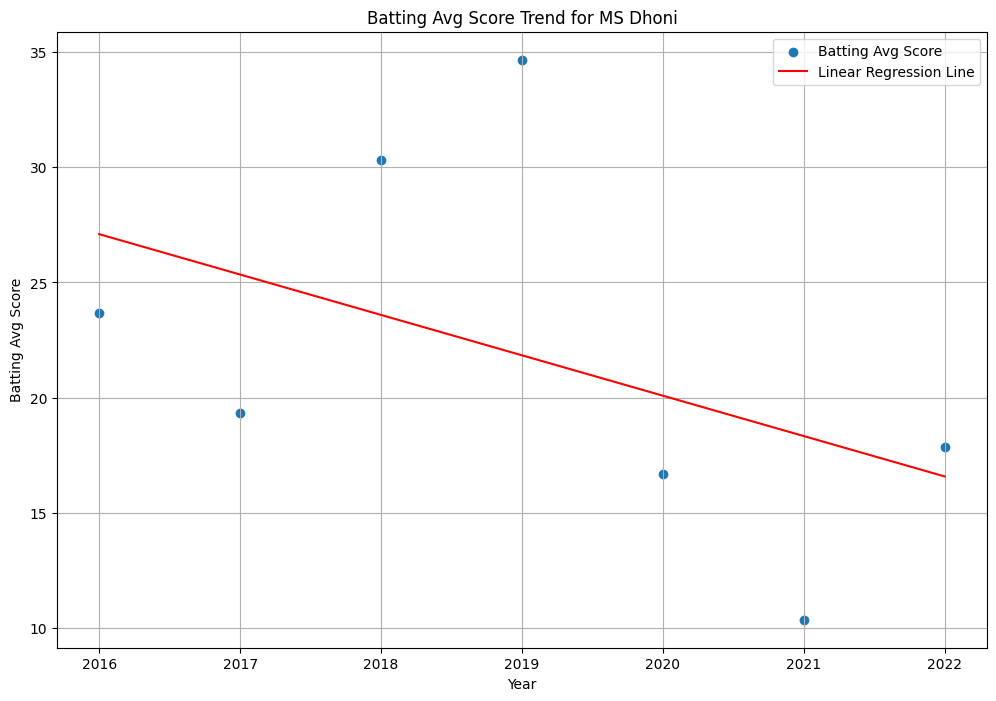

Player: Ravindra Jadeja, Metric: Batting Avg, Slope (Coefficient): 3.4017857142857144, Intercept: -6831.7425


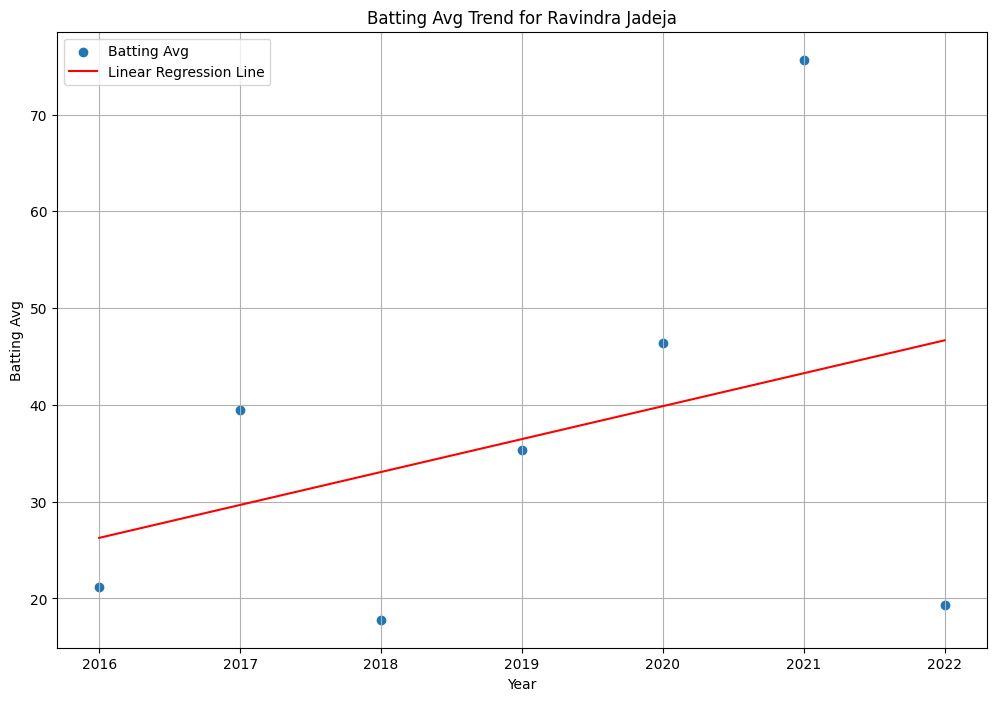

Player: Ravindra Jadeja, Metric: Strike Rate, Slope (Coefficient): 3.4335714285714287, Intercept: -6800.443571428572


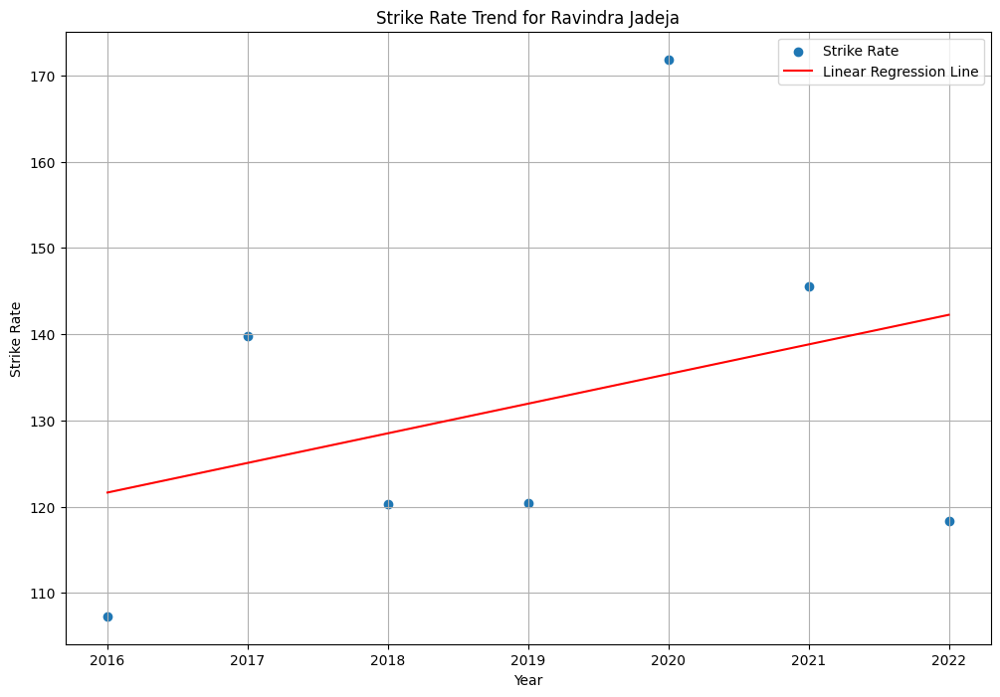

Player: Ravindra Jadeja, Metric: Batting Avg Score, Slope (Coefficient): 0.5365800865800867, Intercept: -1068.9525252525254


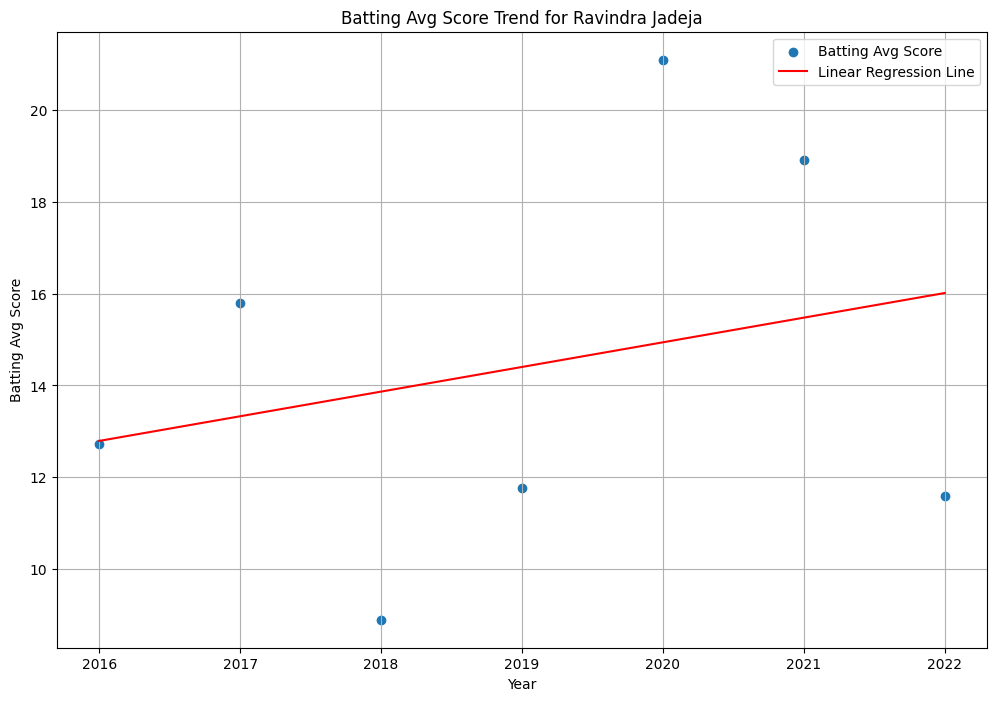

Player: Jos Buttler, Metric: Batting Avg, Slope (Coefficient): 3.543214285714286, Intercept: -7115.083928571429


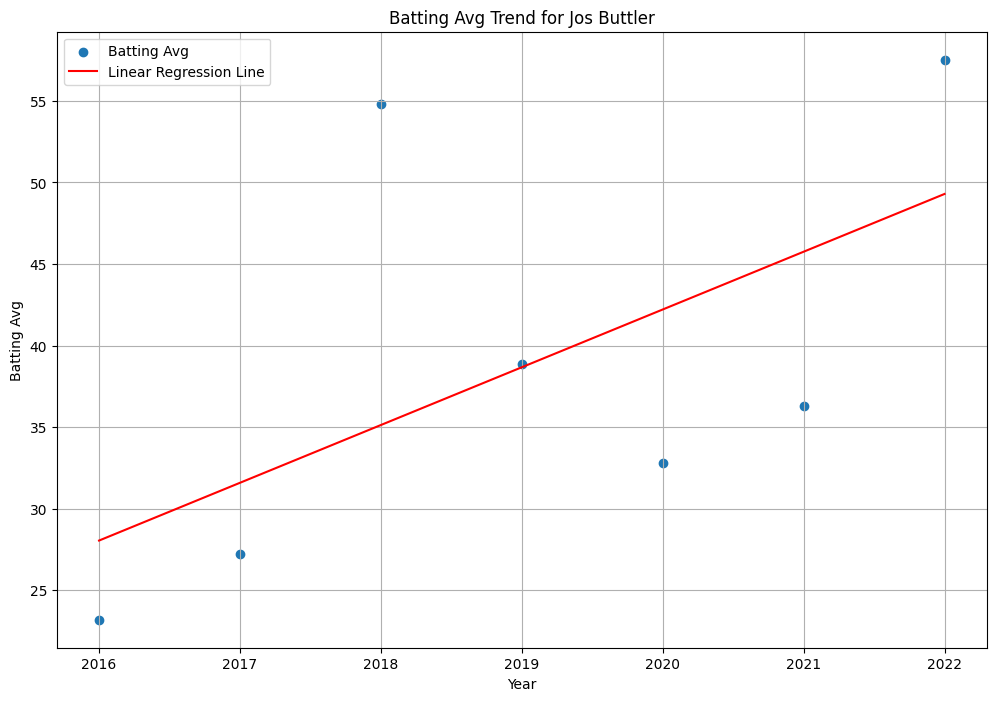

Player: Jos Buttler, Metric: Strike Rate, Slope (Coefficient): 0.6907142857142858, Intercept: -1245.1607142857144


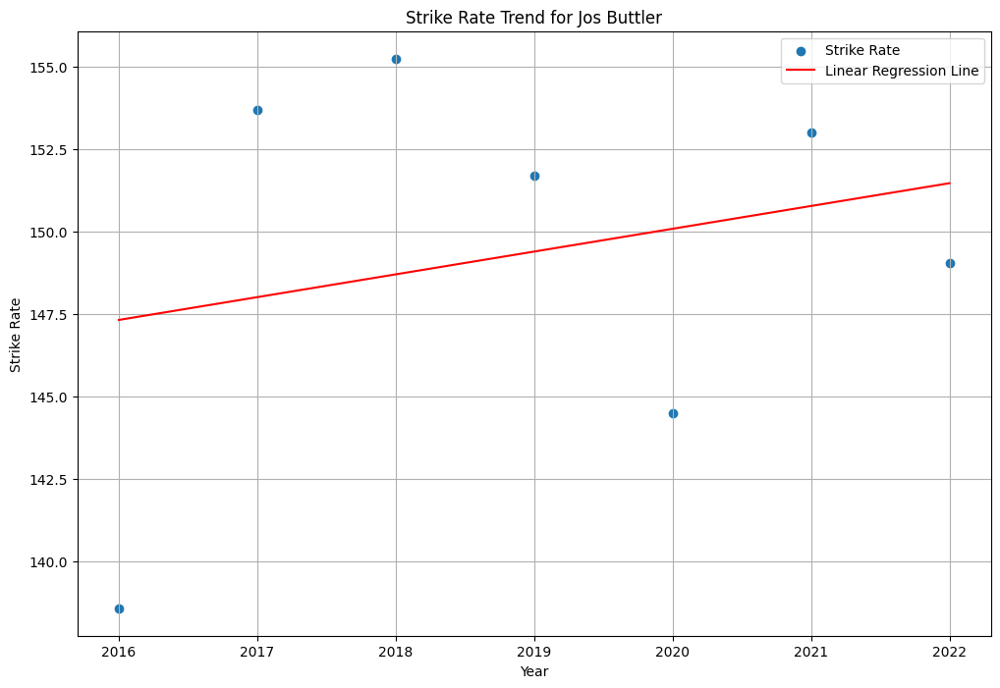

Player: Jos Buttler, Metric: Batting Avg Score, Slope (Coefficient): 3.6072205805399085, Intercept: -7248.574511342999


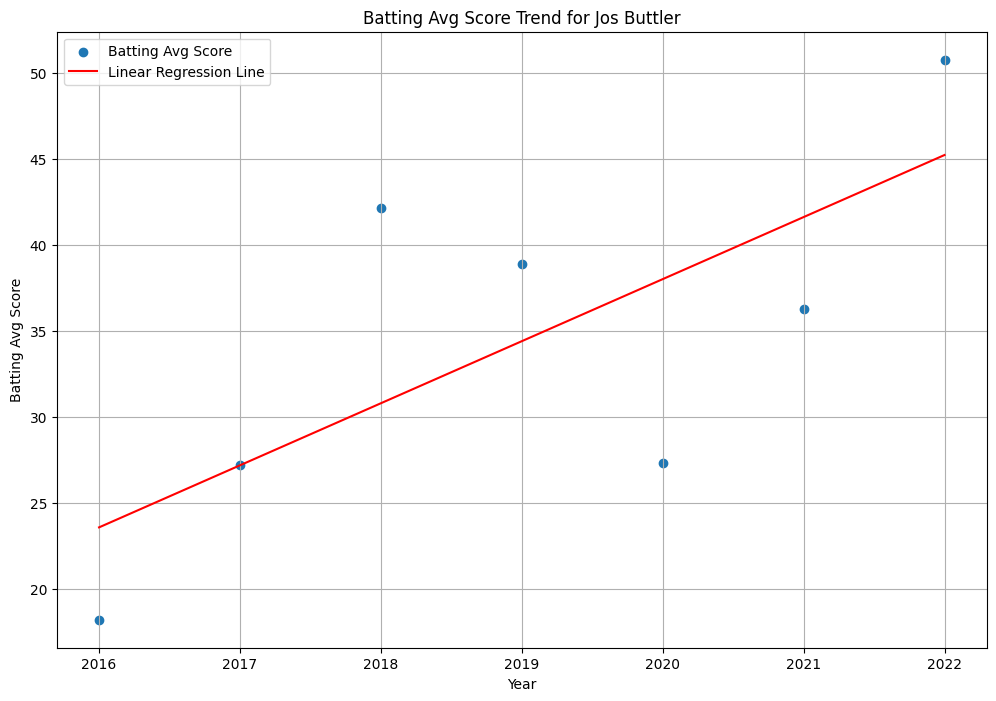

Player: David Warner, Metric: Batting Avg, Slope (Coefficient): -4.333975155279504, Intercept: 8800.943167701864


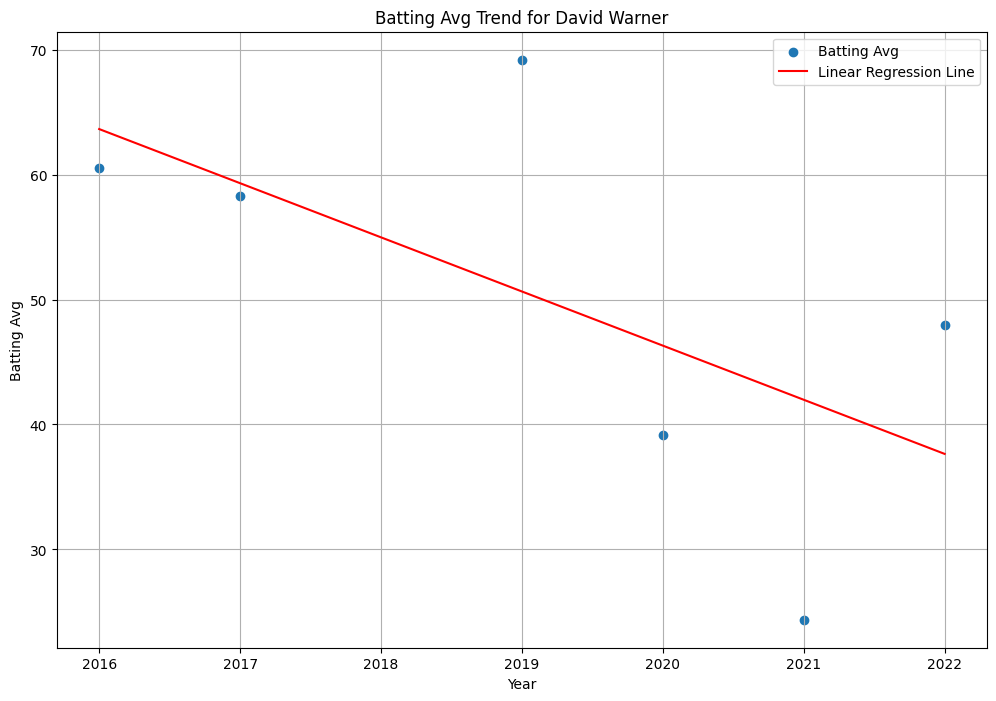

Player: David Warner, Metric: Strike Rate, Slope (Coefficient): -2.778260869565215, Intercept: 5748.101739130429


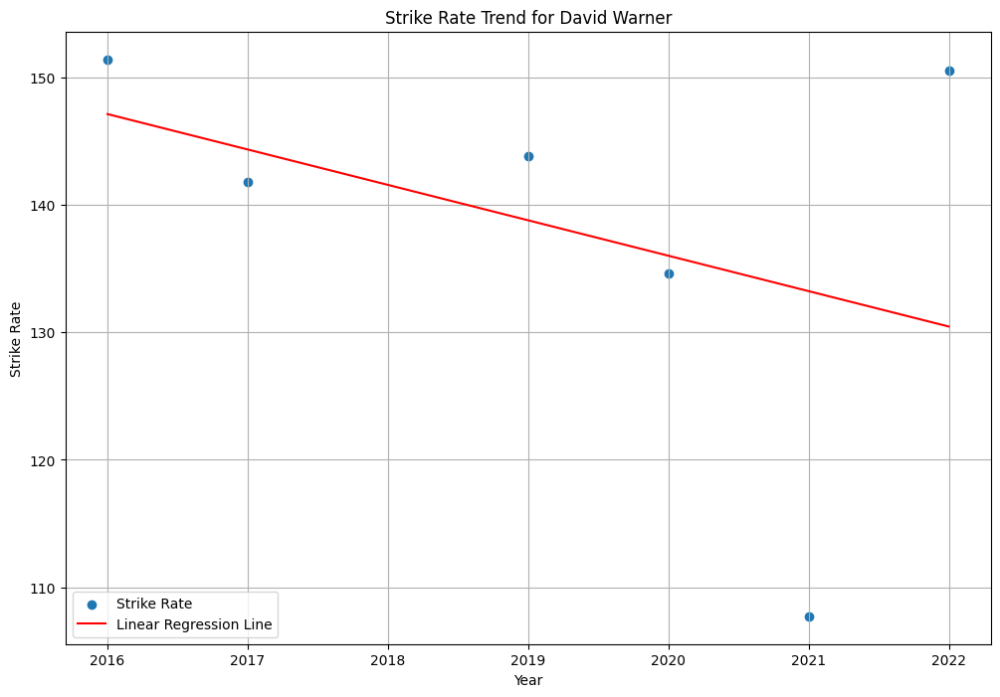

Player: David Warner, Metric: Batting Avg Score, Slope (Coefficient): -3.4116189954242566, Intercept: 6929.953977243072


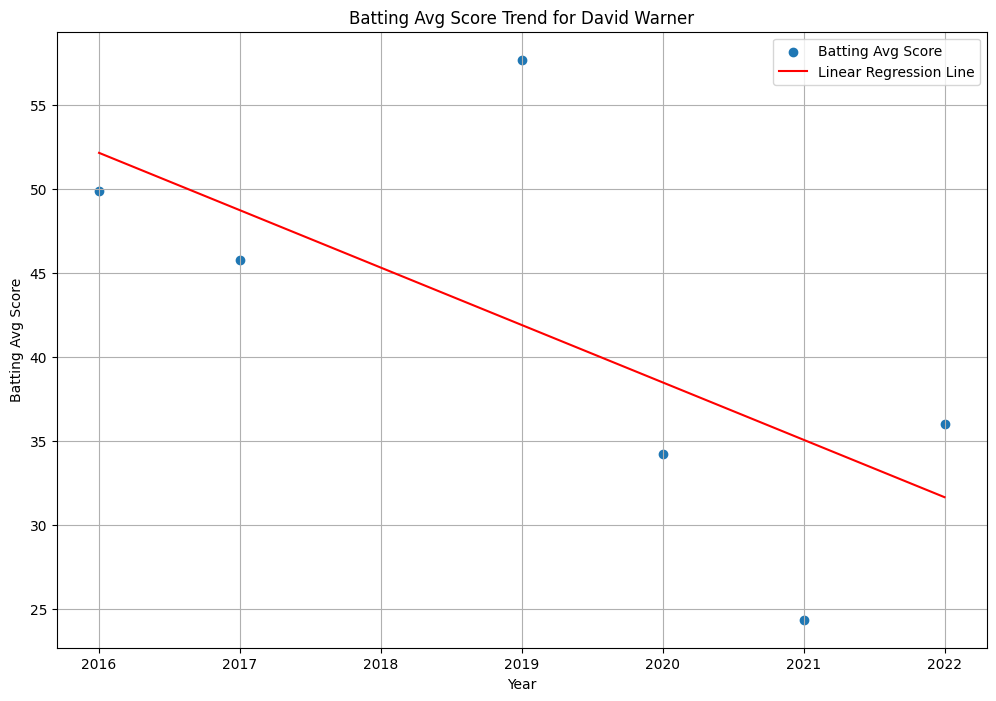

Player: Virat Kohli, Metric: Batting Avg, Slope (Coefficient): -6.593928571428571, Intercept: 13354.171785714287


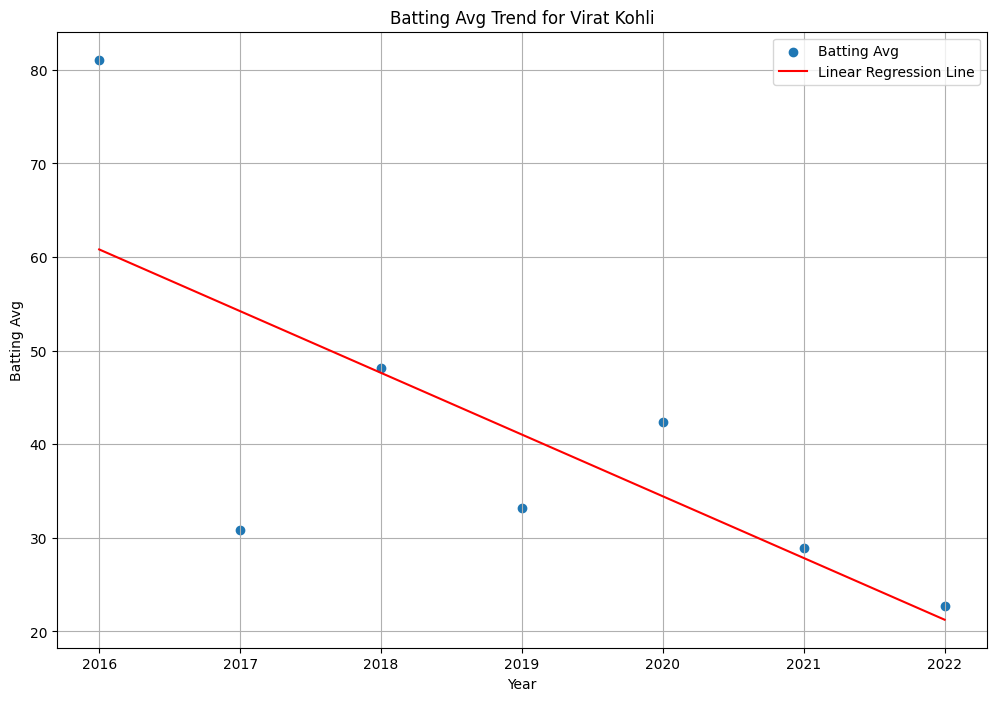

Player: Virat Kohli, Metric: Strike Rate, Slope (Coefficient): -4.693571428571429, Intercept: 9606.549285714287


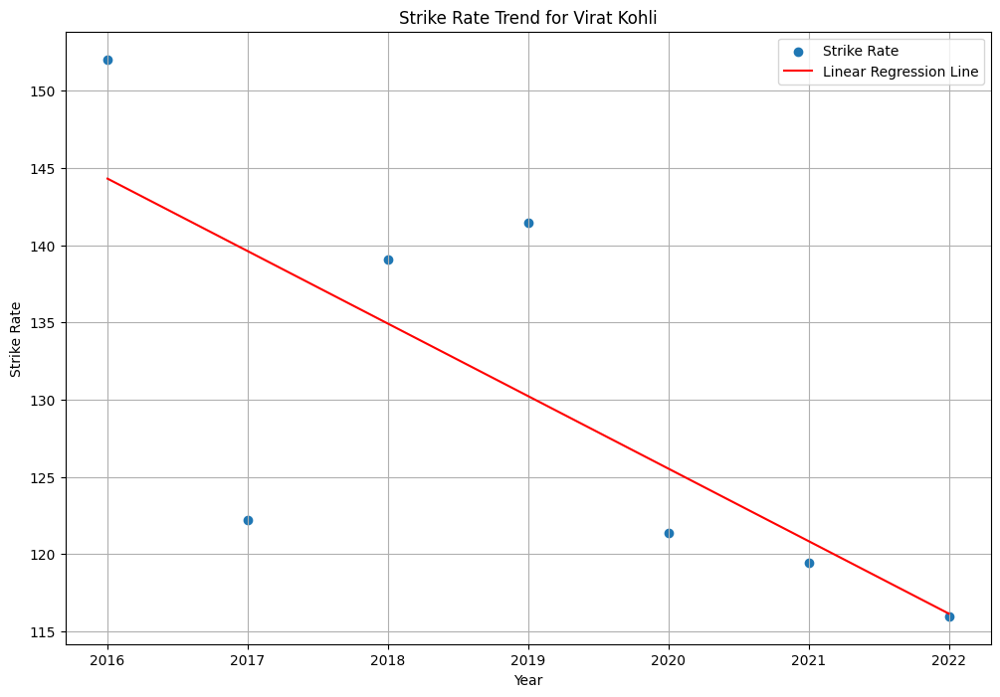

Player: Virat Kohli, Metric: Batting Avg Score, Slope (Coefficient): -4.7460884353741495, Intercept: 9616.922789115646


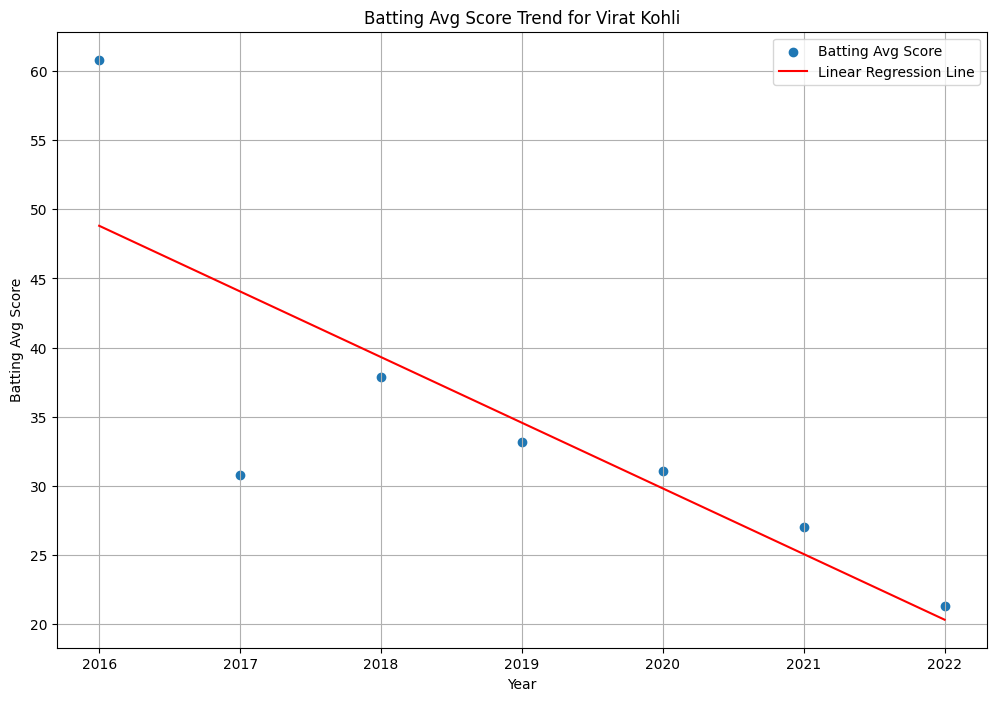

Player: Krunal Pandya, Metric: Batting Avg, Slope (Coefficient): -3.6775000000000007, Intercept: 7448.648214285716


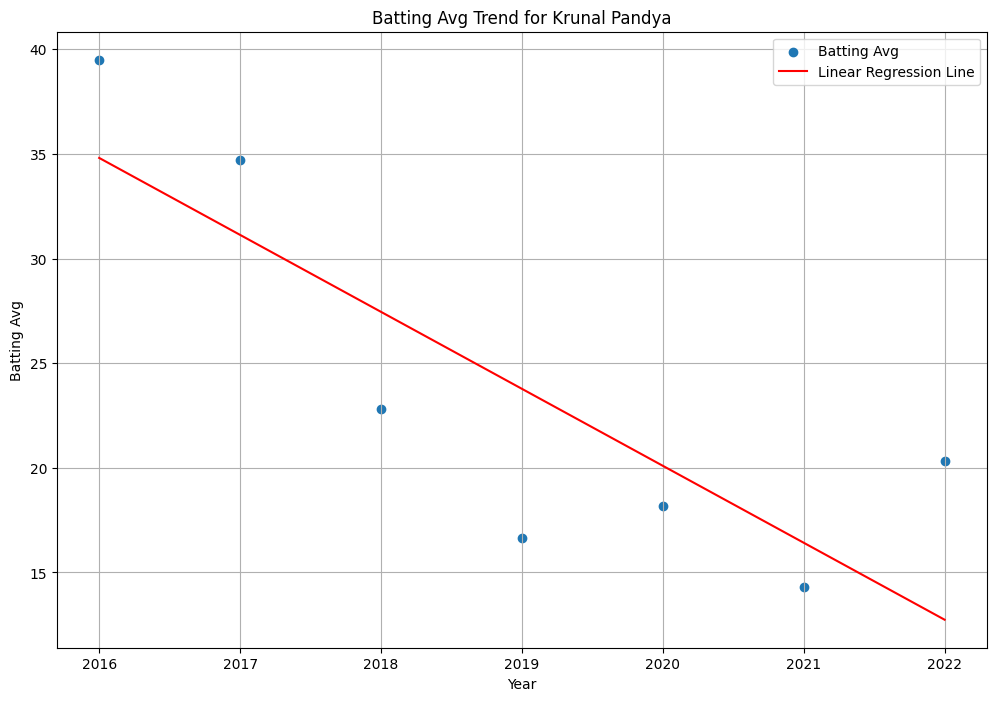

Player: Krunal Pandya, Metric: Strike Rate, Slope (Coefficient): -9.303214285714287, Intercept: 18919.621071428573


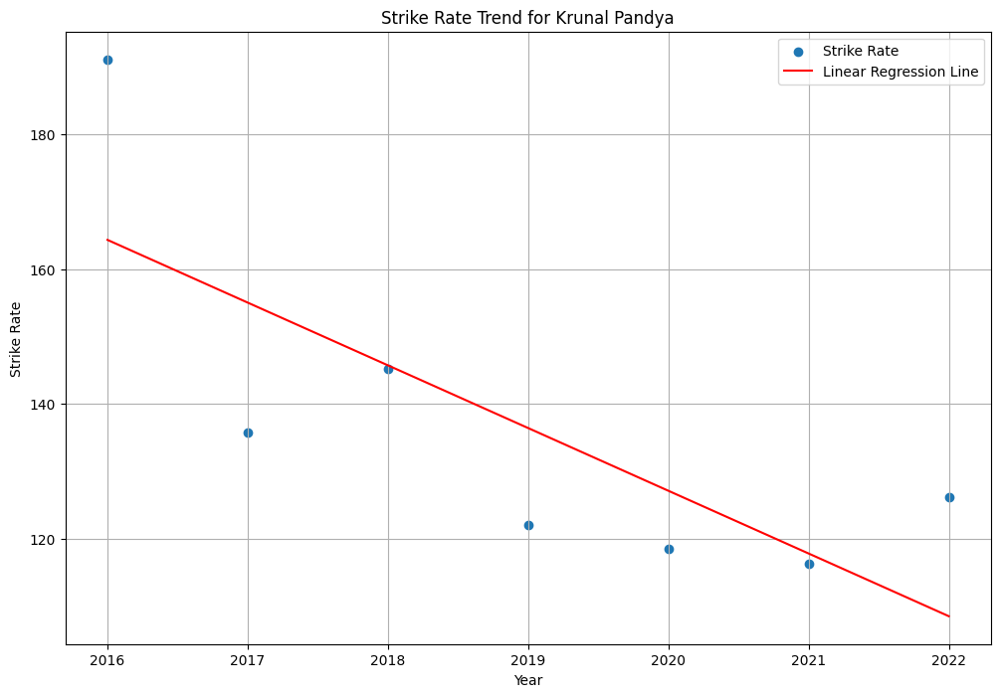

Player: Krunal Pandya, Metric: Batting Avg Score, Slope (Coefficient): -2.3418872793872794, Intercept: 4744.447506660007


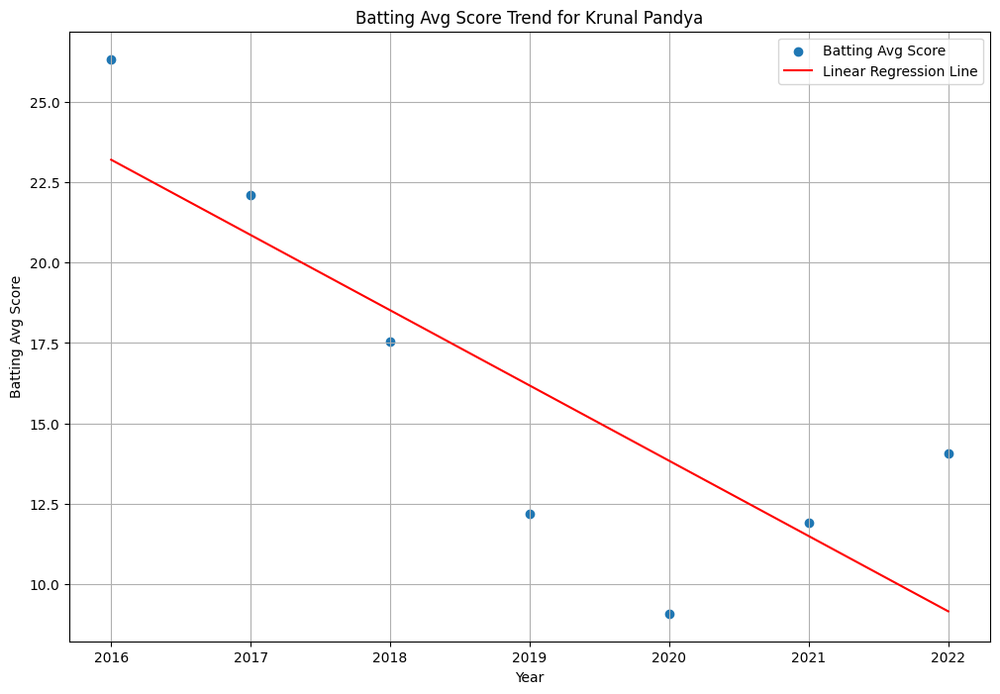

Player: Manish Pandey, Metric: Batting Avg, Slope (Coefficient): -1.5639285714285716, Intercept: 3192.6189285714286


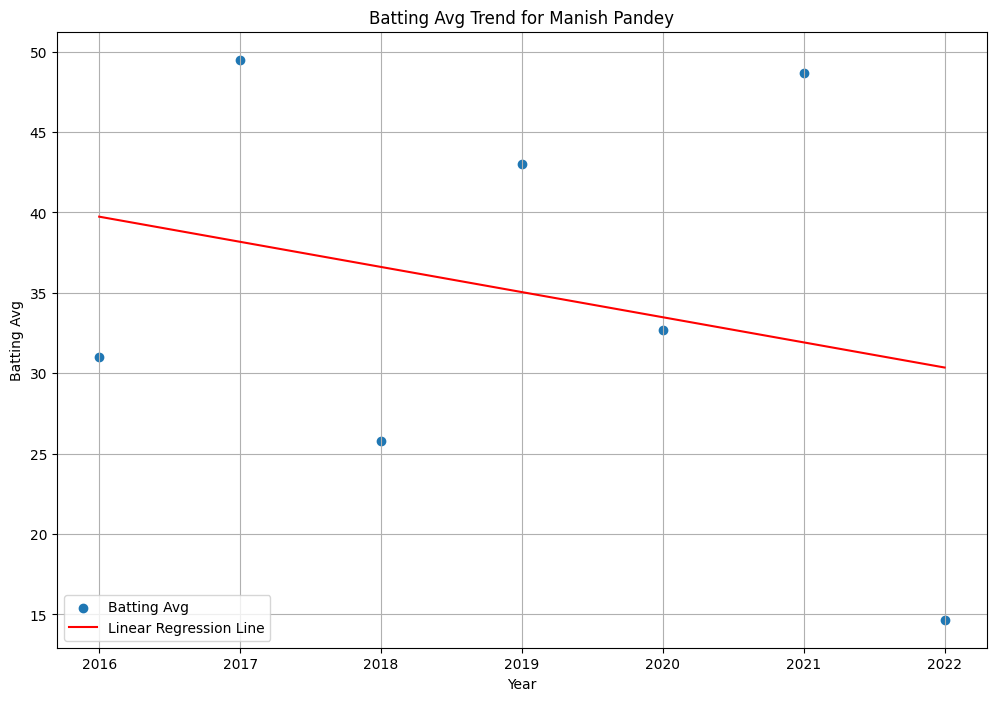

Player: Manish Pandey, Metric: Strike Rate, Slope (Coefficient): -2.6446428571428555, Intercept: 5464.055357142854


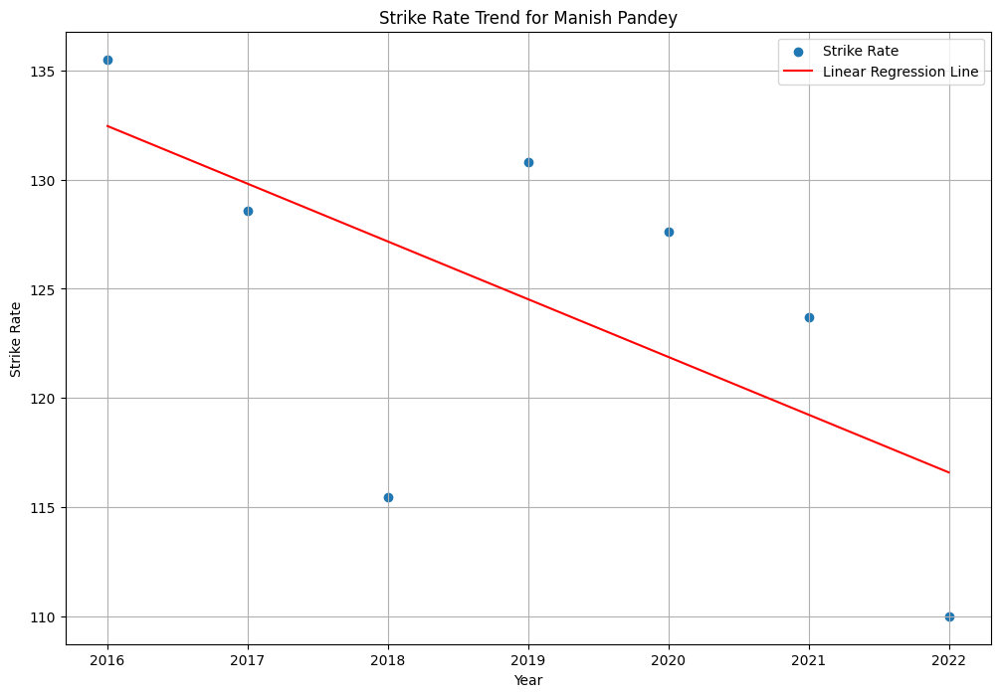

Player: Manish Pandey, Metric: Batting Avg Score, Slope (Coefficient): -0.18115218115218137, Intercept: 392.2642357642362


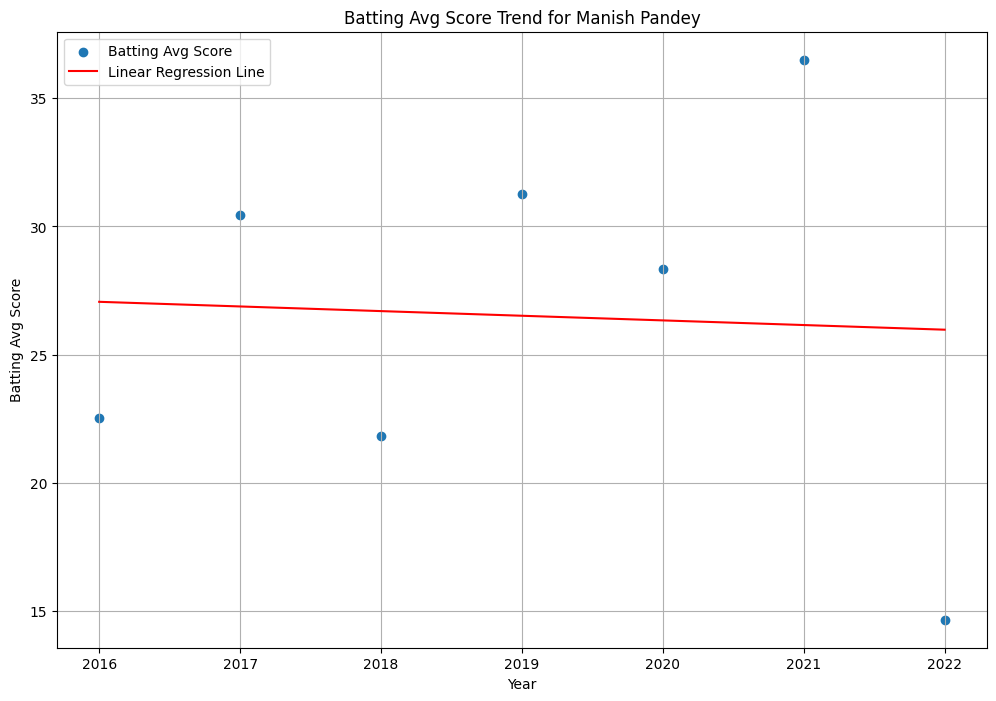

Player: Hardik Pandya, Metric: Batting Avg, Slope (Coefficient): 2.7503571428571427, Intercept: -5523.109642857143


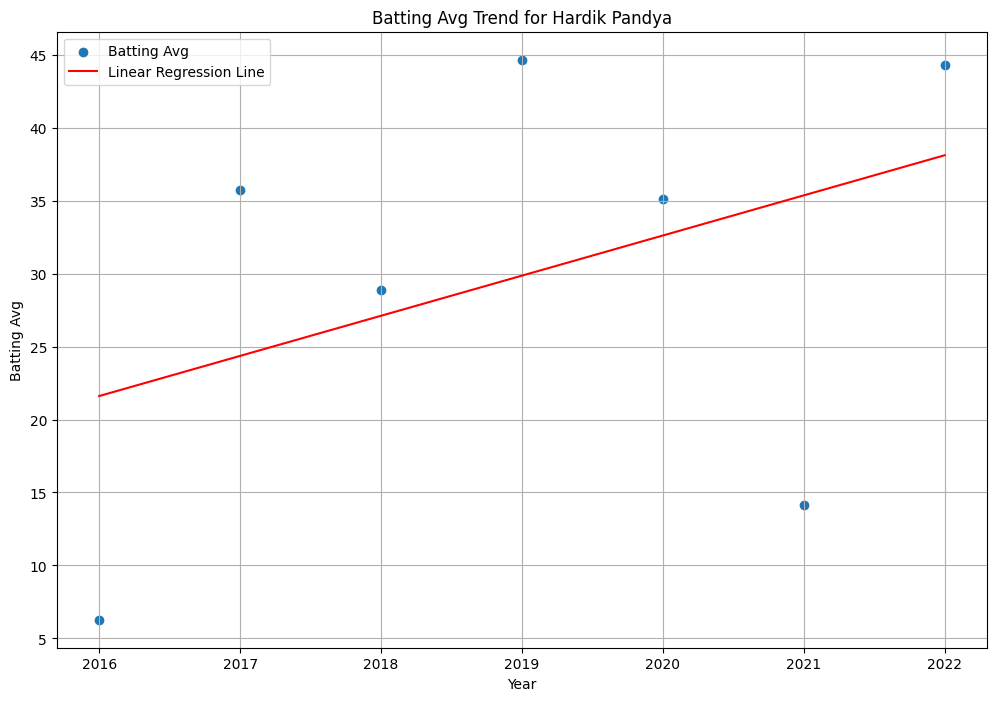

Player: Hardik Pandya, Metric: Strike Rate, Slope (Coefficient): 5.149642857142855, Intercept: -10257.918928571426


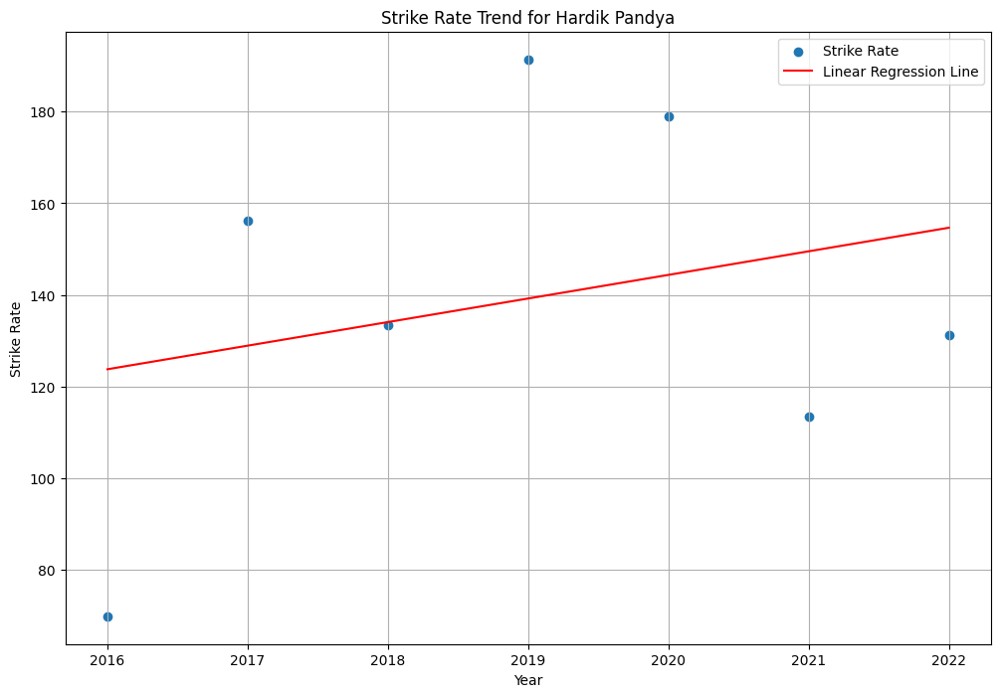

Player: Hardik Pandya, Metric: Batting Avg Score, Slope (Coefficient): 2.7210581085581085, Intercept: -5474.824693362194


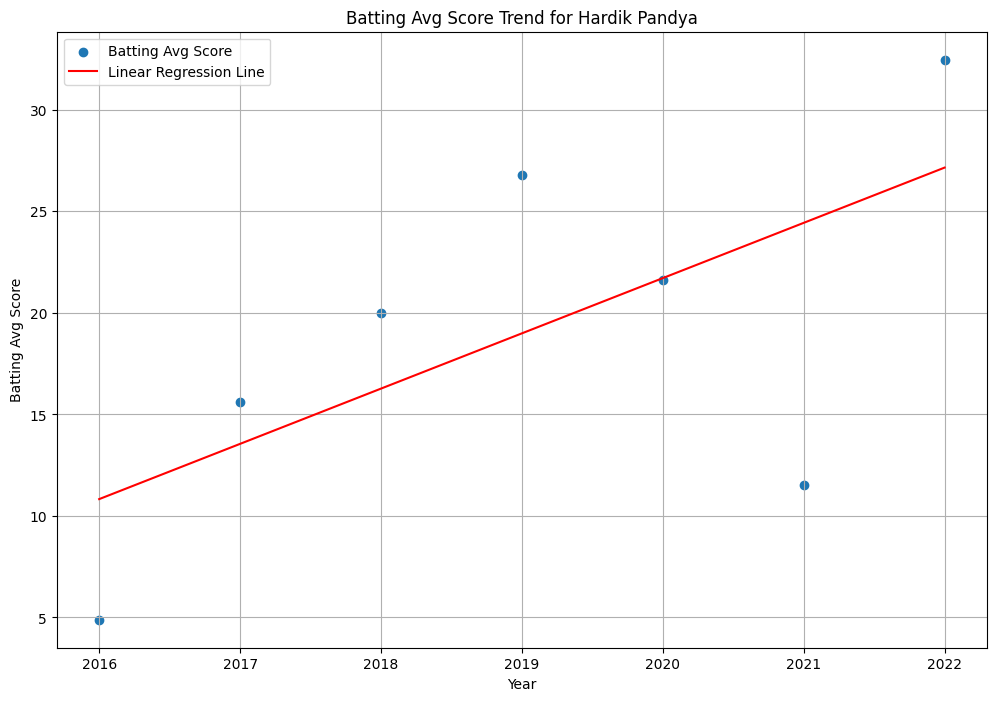

Player: Deepak Hooda, Metric: Batting Avg, Slope (Coefficient): 4.465714285714286, Intercept: -8985.148571428572


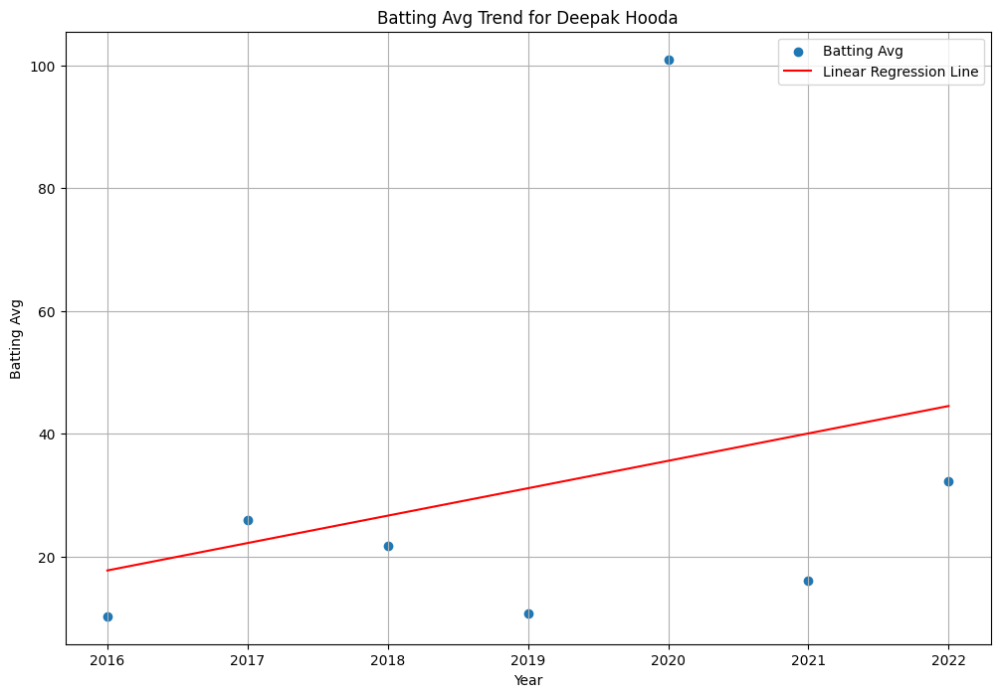

Player: Deepak Hooda, Metric: Strike Rate, Slope (Coefficient): 1.7139285714285717, Intercept: -3333.711785714286


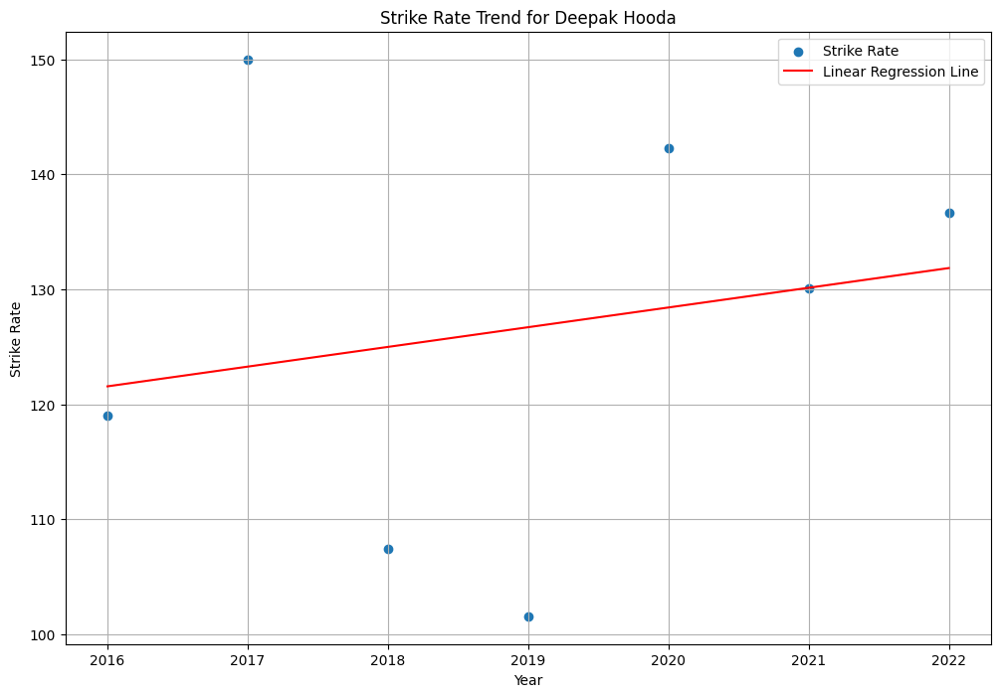

Player: Deepak Hooda, Metric: Batting Avg Score, Slope (Coefficient): 2.866384508348794, Intercept: -5771.57637987013


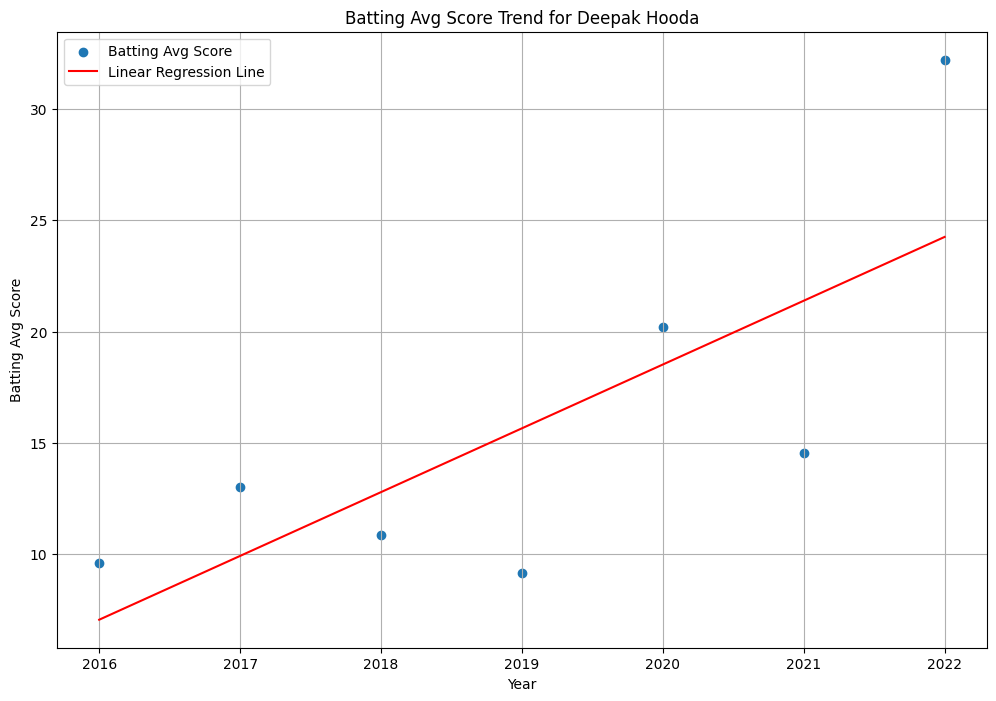

Player: Rahul Tewatia, Metric: Batting Avg, Slope (Coefficient): 2.0862857142857143, Intercept: -4188.144


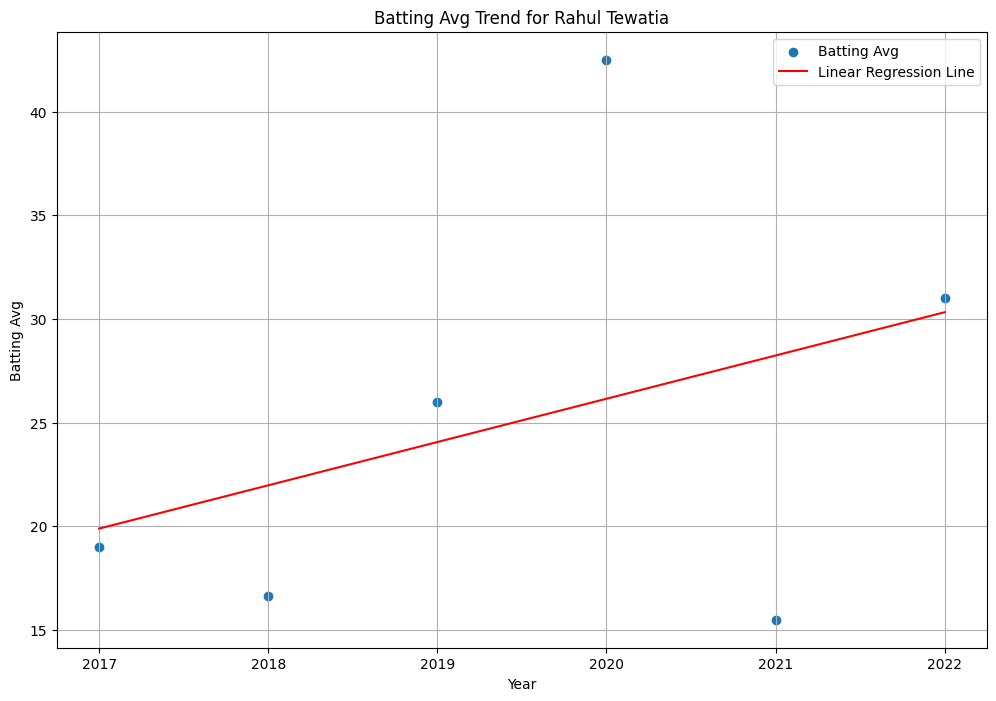

Player: Rahul Tewatia, Metric: Strike Rate, Slope (Coefficient): -3.9108571428571404, Intercept: 8031.235999999995


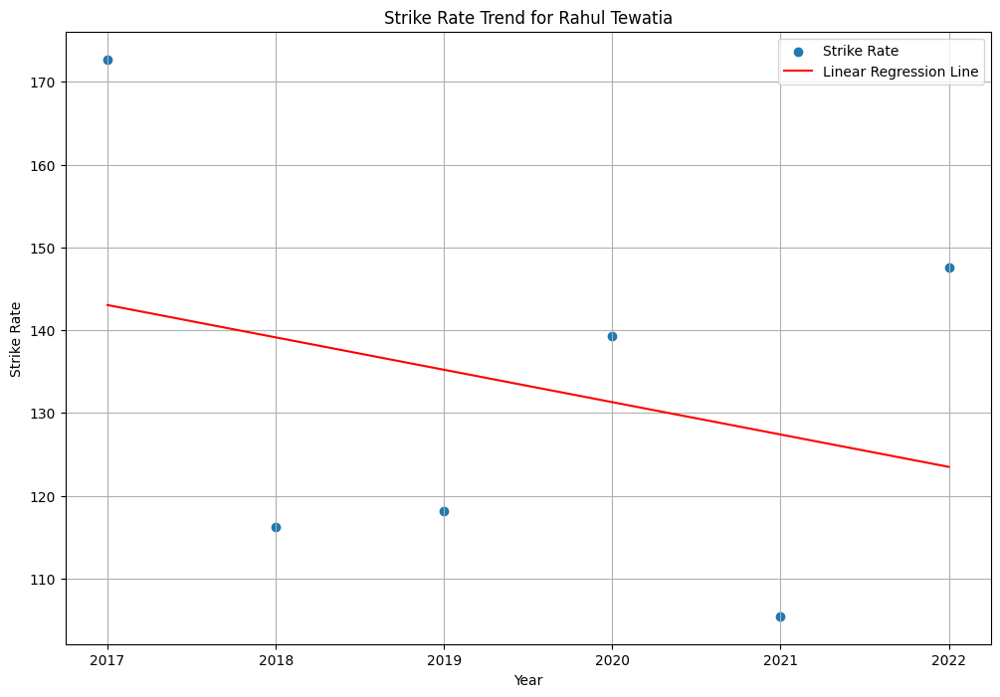

Player: Rahul Tewatia, Metric: Batting Avg Score, Slope (Coefficient): 2.0534632034632034, Intercept: -4133.409595959596


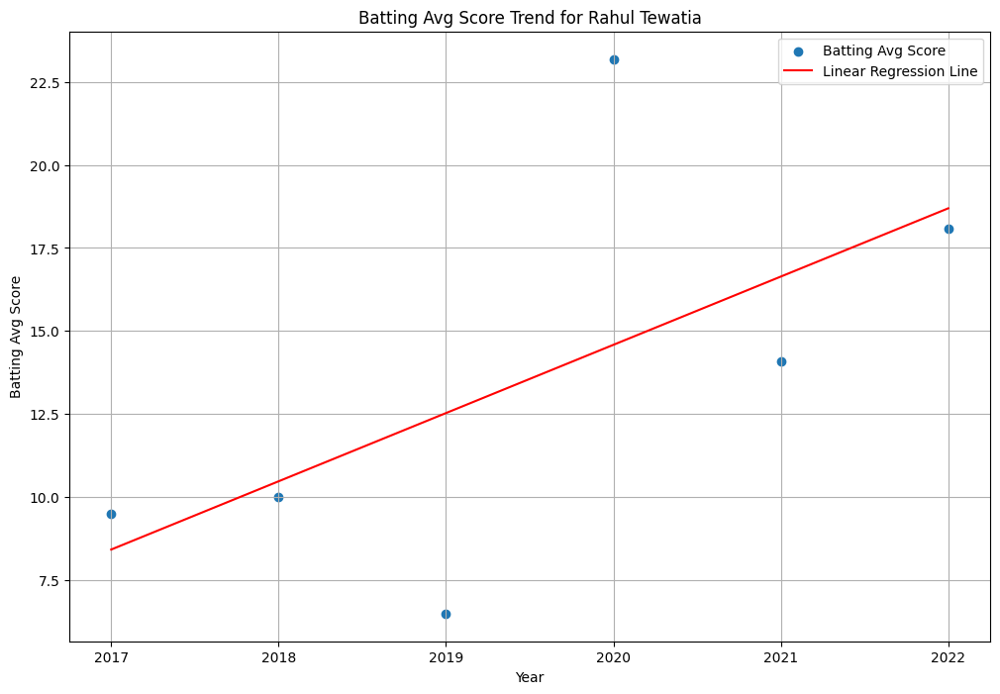

Player: Shikhar Dhawan, Metric: Batting Avg, Slope (Coefficient): 0.3532142857142855, Intercept: -674.5782142857138


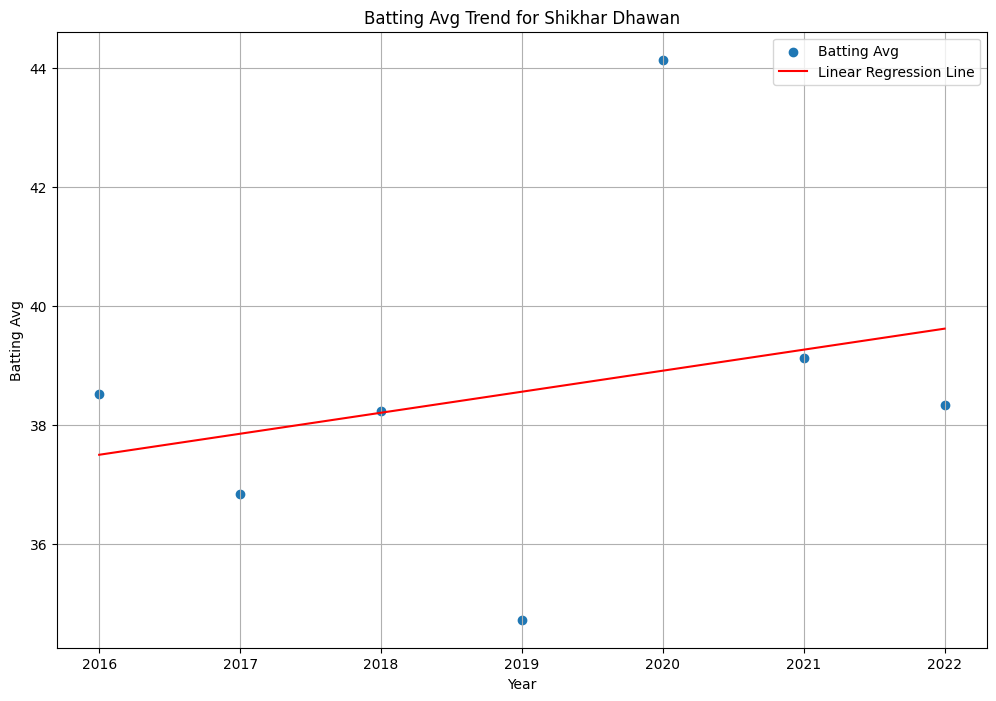

Player: Shikhar Dhawan, Metric: Strike Rate, Slope (Coefficient): 0.711428571428571, Intercept: -1306.5514285714276


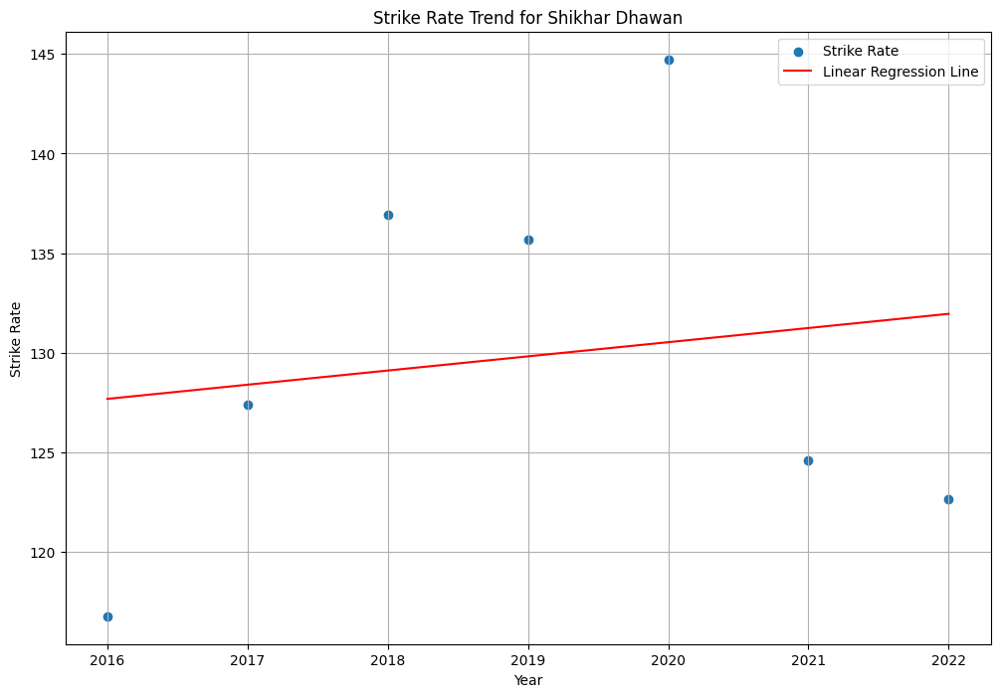

Player: Shikhar Dhawan, Metric: Batting Avg Score, Slope (Coefficient): 0.7284476290516204, Intercept: -1437.4204119147655


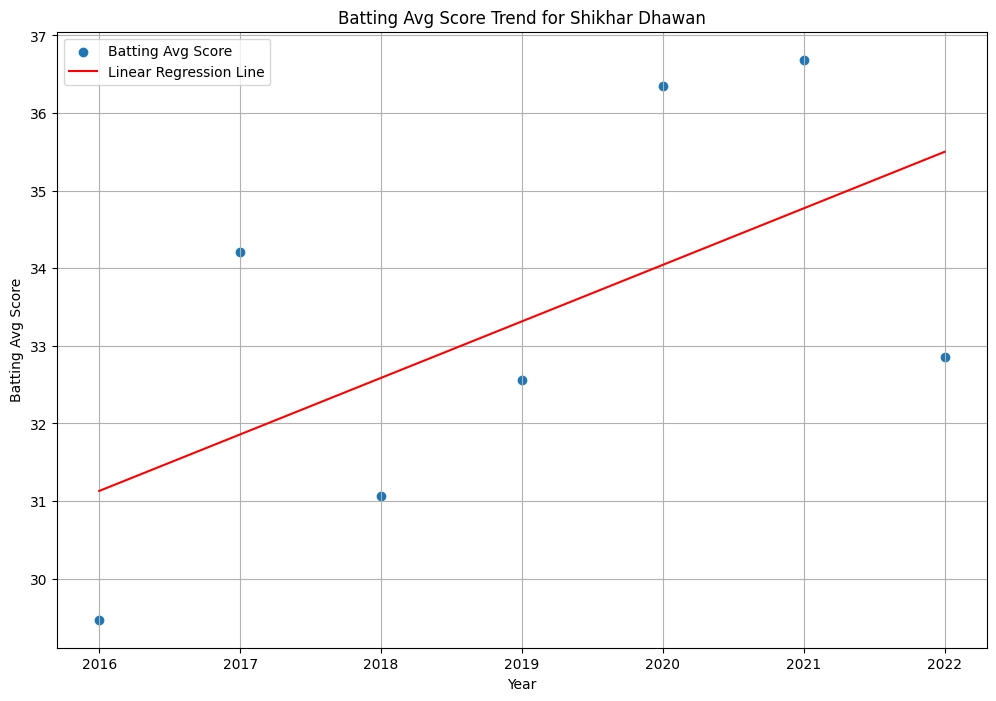

Player: Glenn Maxwell, Metric: Batting Avg, Slope (Coefficient): 1.6885714285714286, Intercept: -3384.144047619048


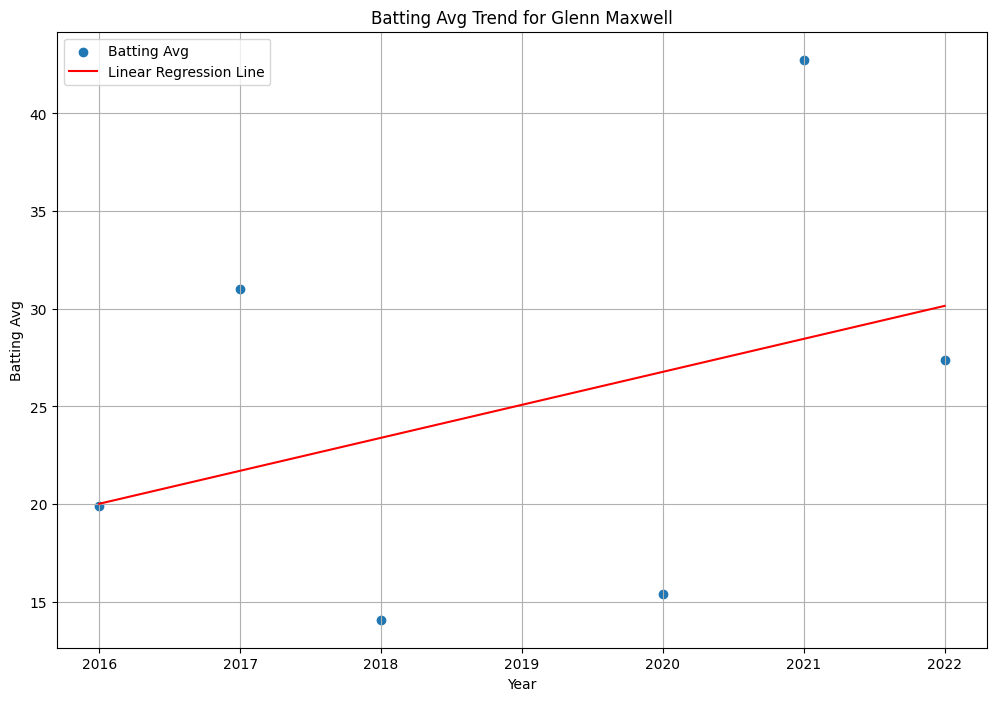

Player: Glenn Maxwell, Metric: Strike Rate, Slope (Coefficient): -0.816428571428573, Intercept: 1793.942619047622


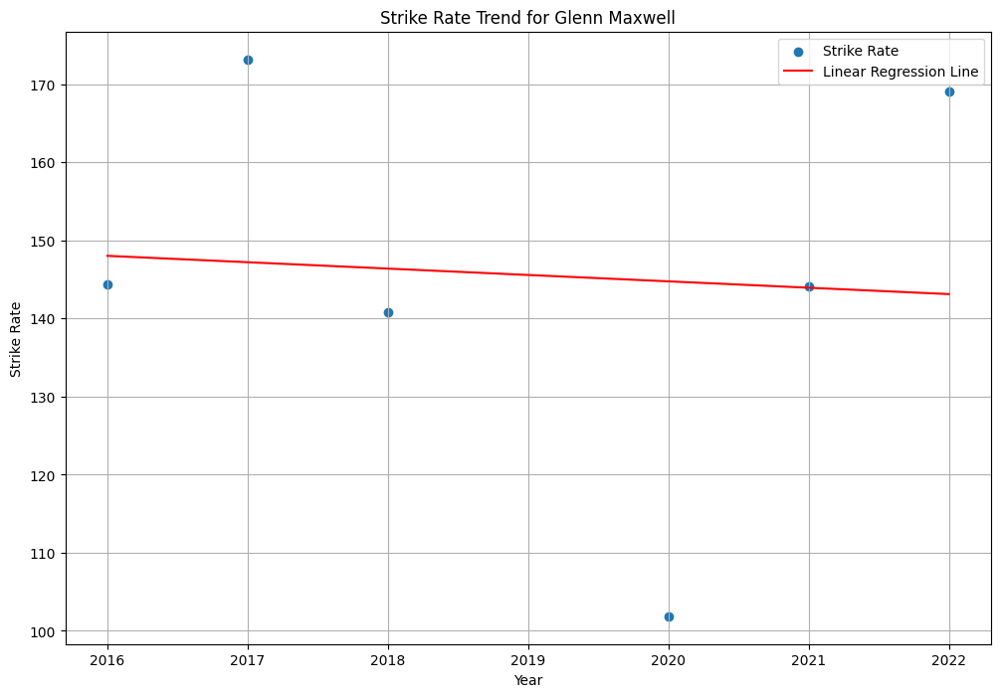

Player: Glenn Maxwell, Metric: Batting Avg Score, Slope (Coefficient): 1.4989861329147043, Intercept: -3005.816819093605


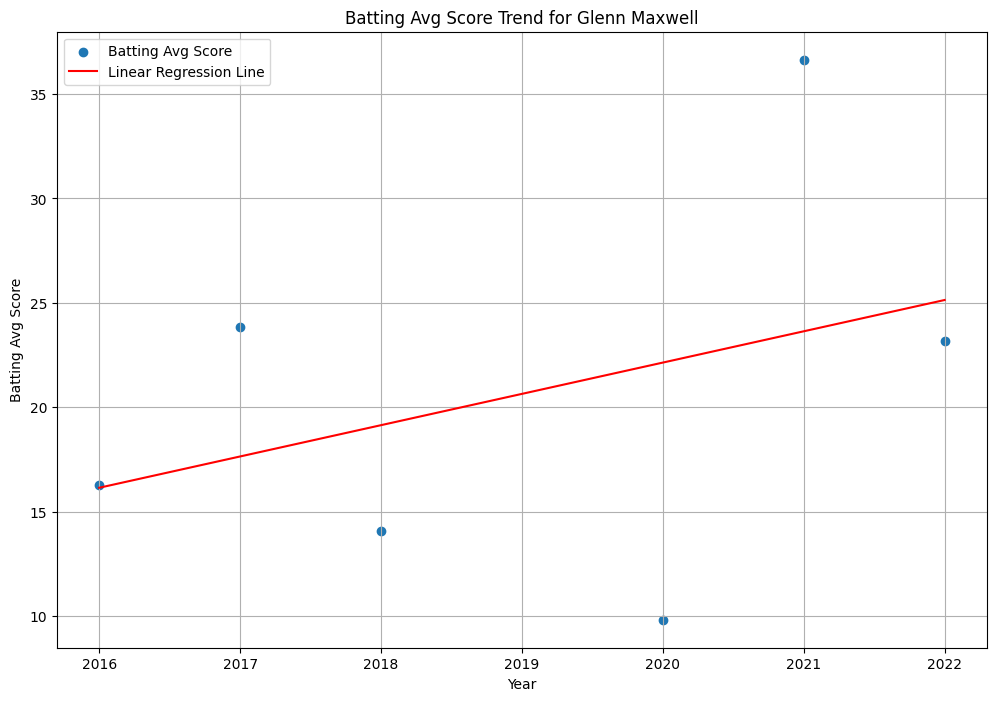

Player: Mayank Agarwal, Metric: Batting Avg, Slope (Coefficient): 3.978214285714285, Intercept: -8010.564642857142


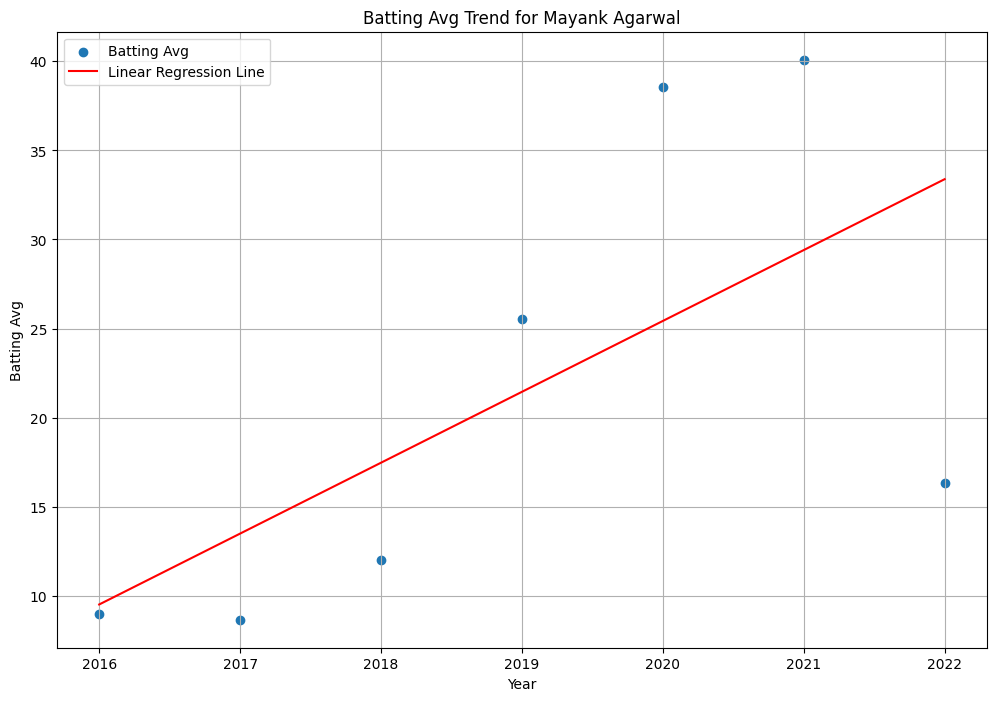

Player: Mayank Agarwal, Metric: Strike Rate, Slope (Coefficient): 5.735714285714285, Intercept: -11452.805714285712


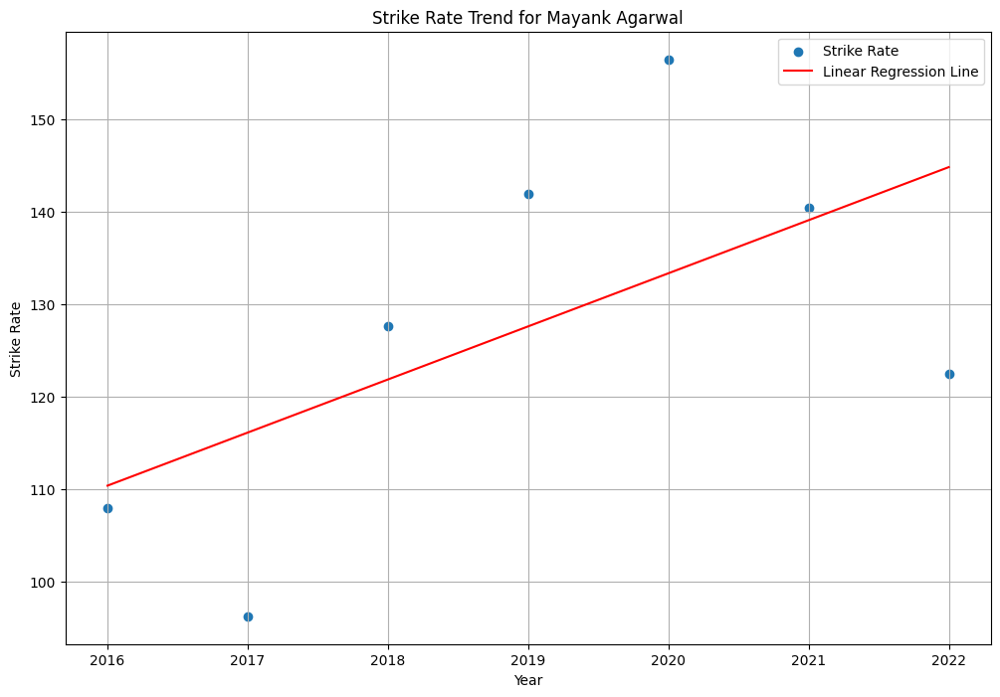

Player: Mayank Agarwal, Metric: Batting Avg Score, Slope (Coefficient): 3.778679653679653, Intercept: -7608.333791208789


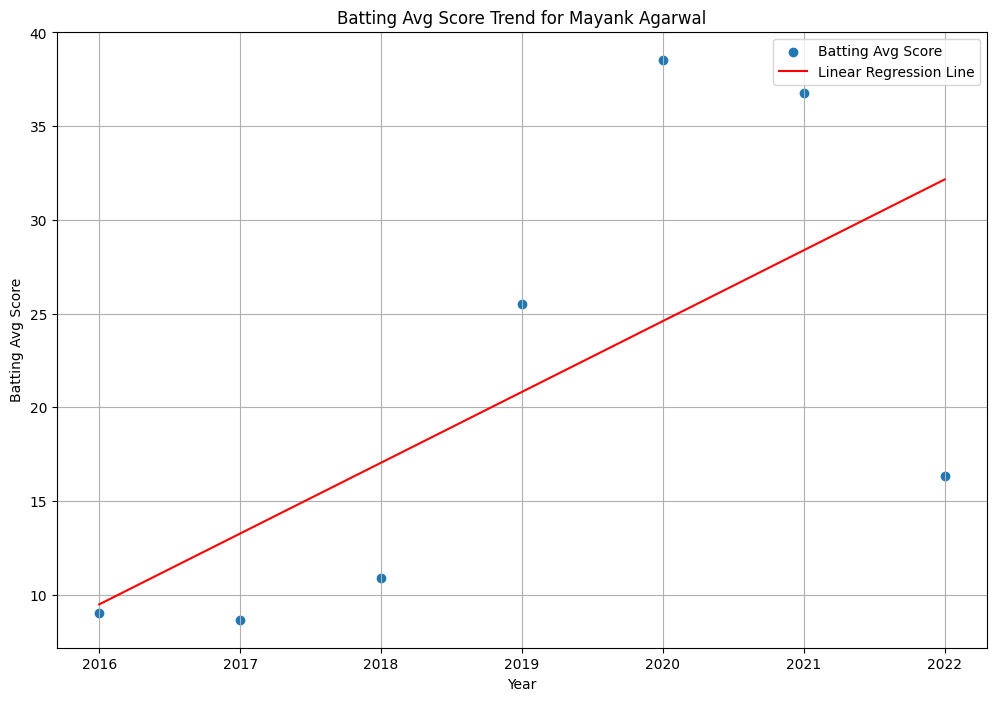

Player: Rahul Tripathi, Metric: Batting Avg, Slope (Coefficient): 1.6391428571428566, Intercept: -3282.677333333332


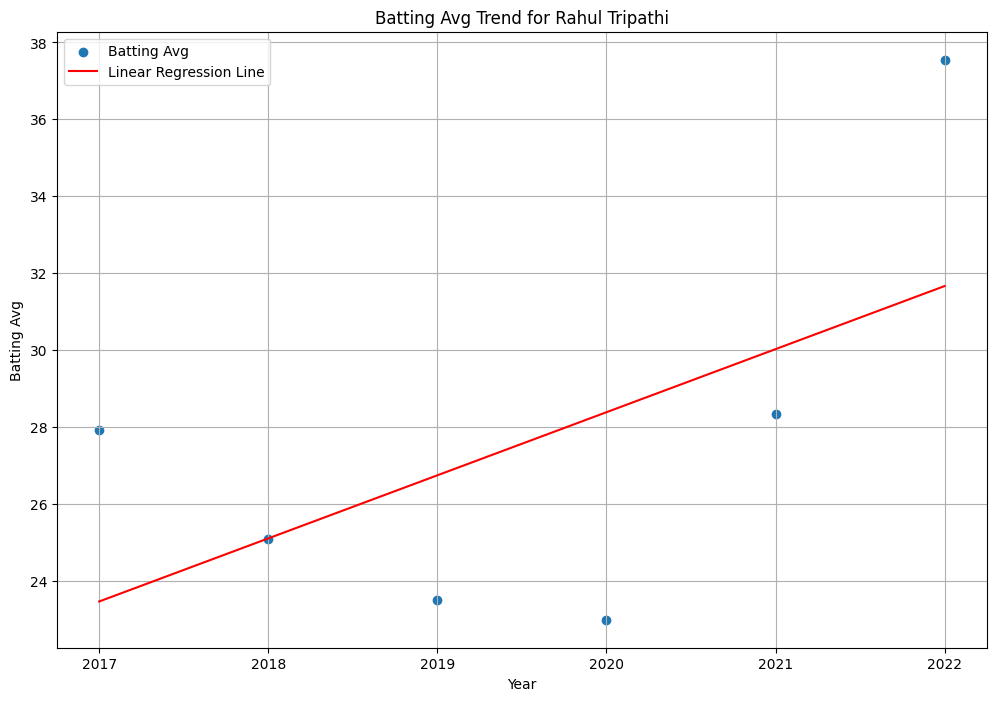

Player: Rahul Tripathi, Metric: Strike Rate, Slope (Coefficient): 2.3259999999999996, Intercept: -4559.551999999999


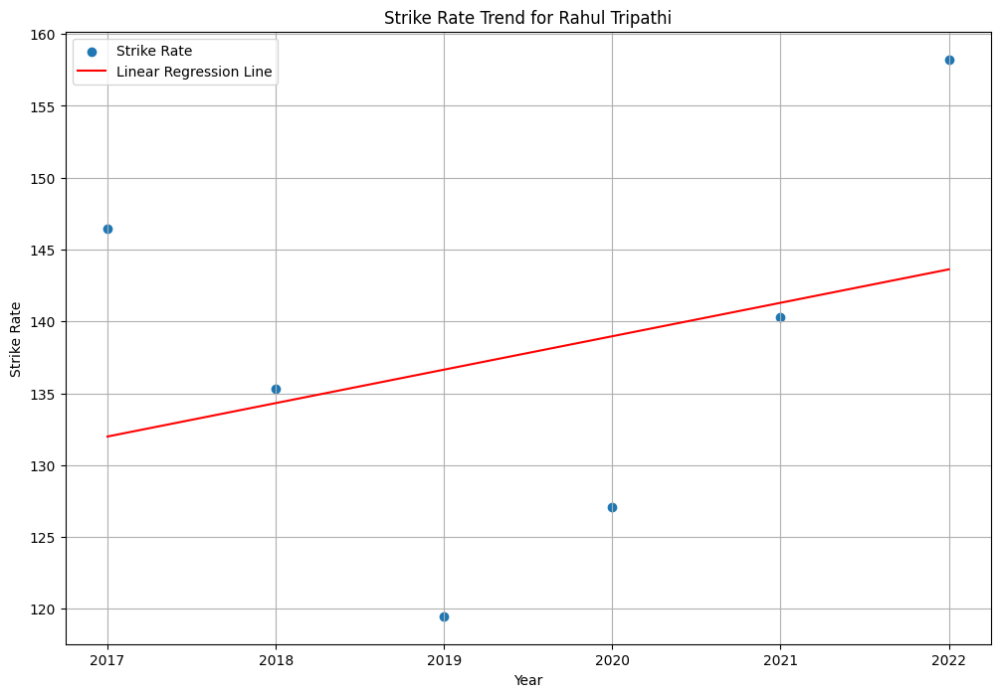

Player: Rahul Tripathi, Metric: Batting Avg Score, Slope (Coefficient): 0.7588821892393325, Intercept: -1508.8748556998564


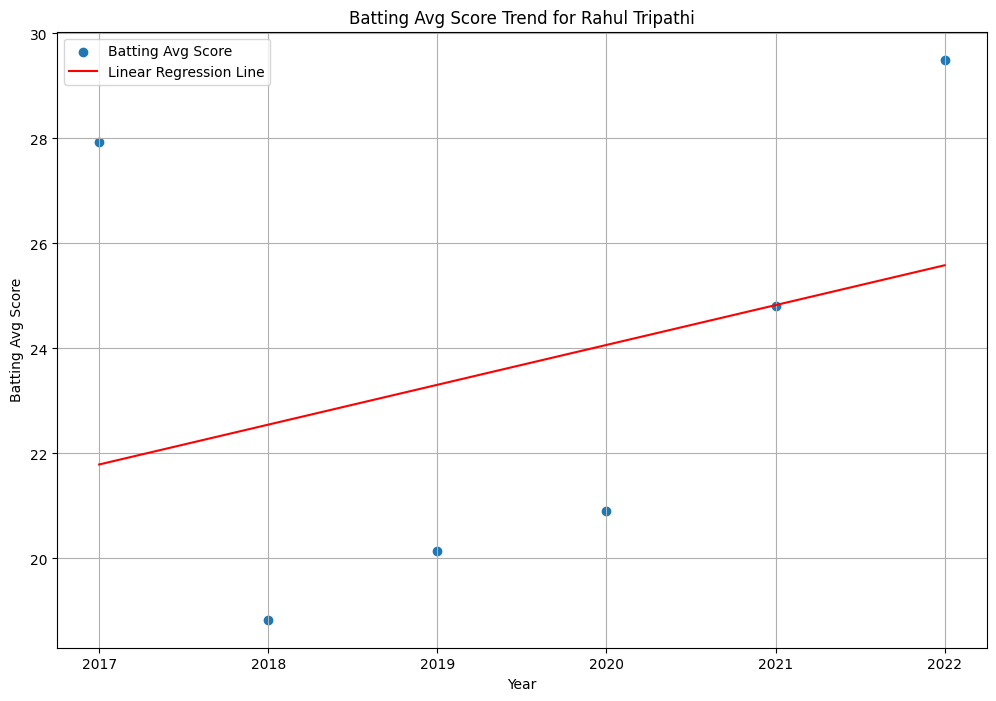

Player: Wriddhiman Saha, Metric: Batting Avg, Slope (Coefficient): 2.137857142857143, Intercept: -4288.052142857143


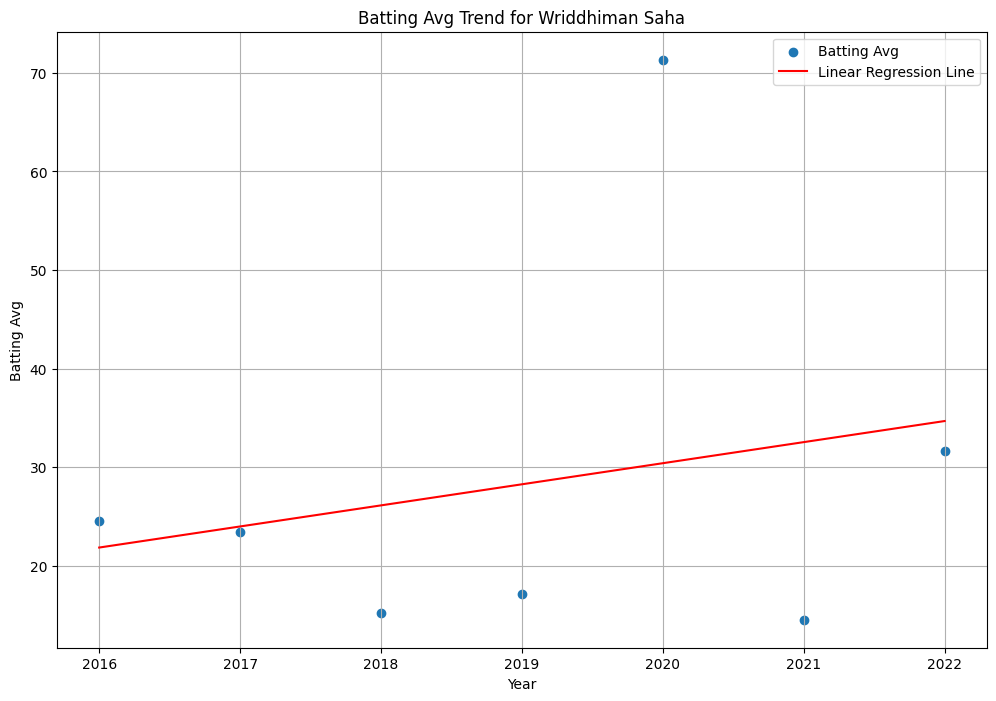

Player: Wriddhiman Saha, Metric: Strike Rate, Slope (Coefficient): -2.062142857142856, Intercept: 4290.63214285714


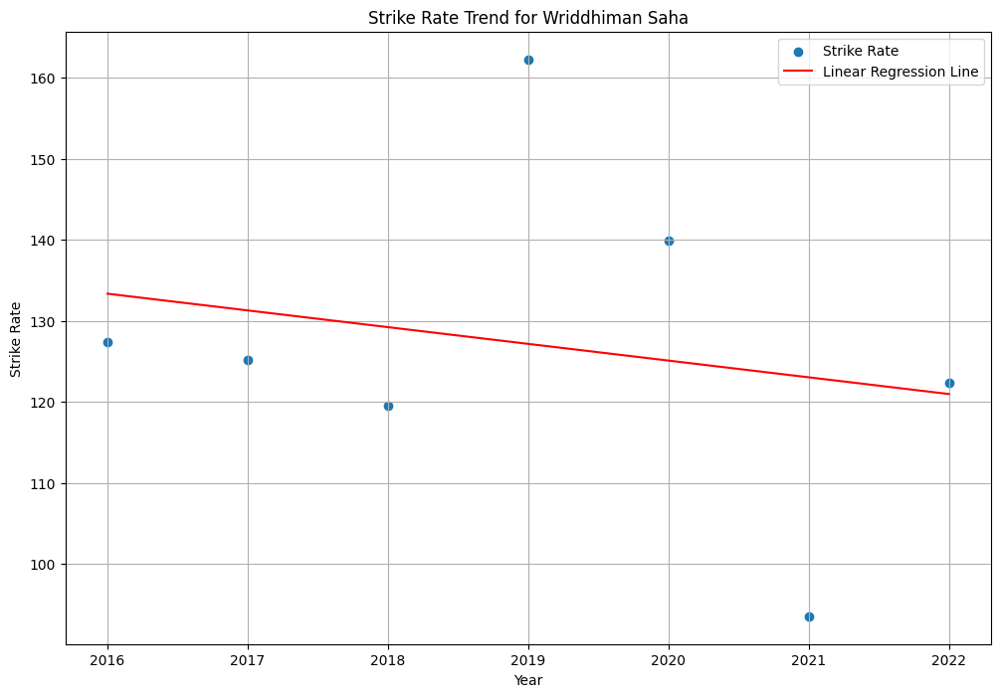

Player: Wriddhiman Saha, Metric: Batting Avg Score, Slope (Coefficient): 1.6721500721500722, Intercept: -3351.7786435786434


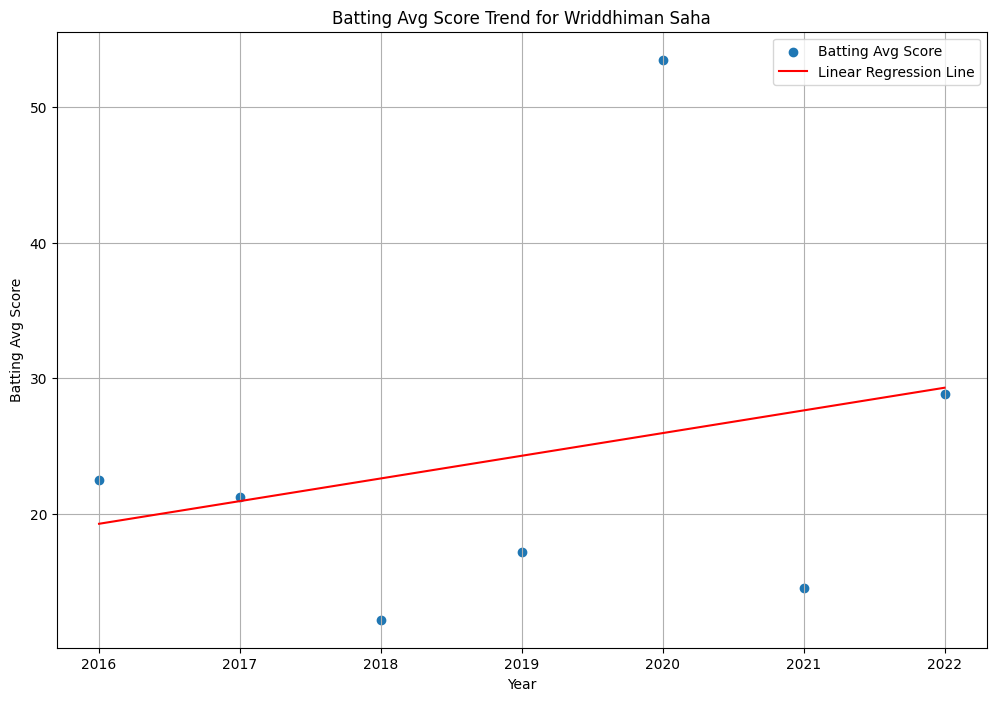

Player: Chris Gayle, Metric: Batting Avg, Slope (Coefficient): 1.4402857142857146, Intercept: -2875.6817142857153


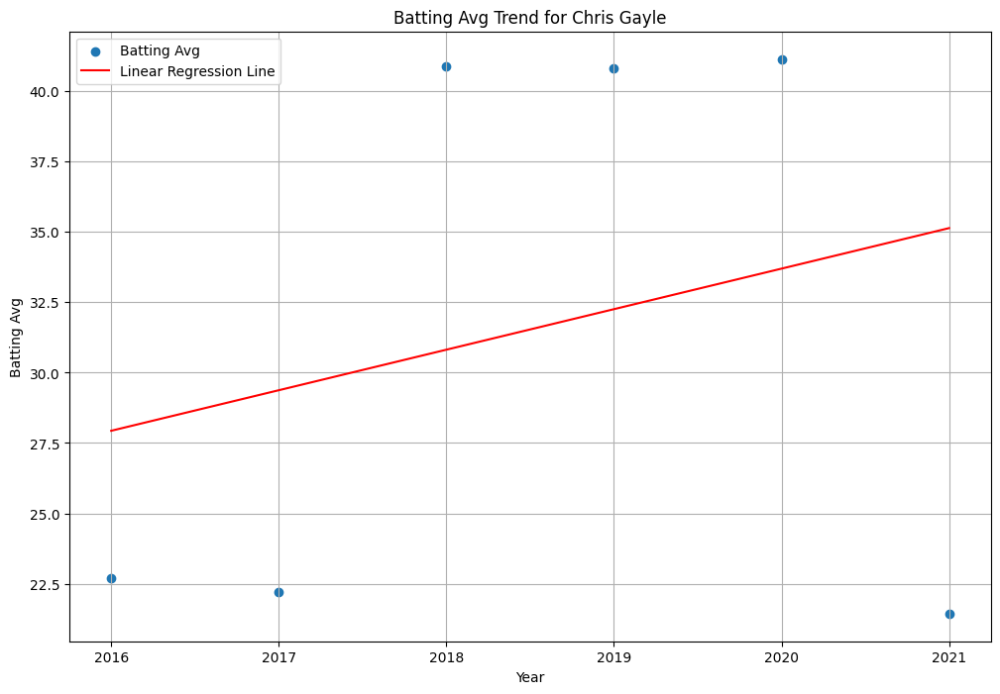

Player: Chris Gayle, Metric: Strike Rate, Slope (Coefficient): -2.2608571428571467, Intercept: 4702.891809523817


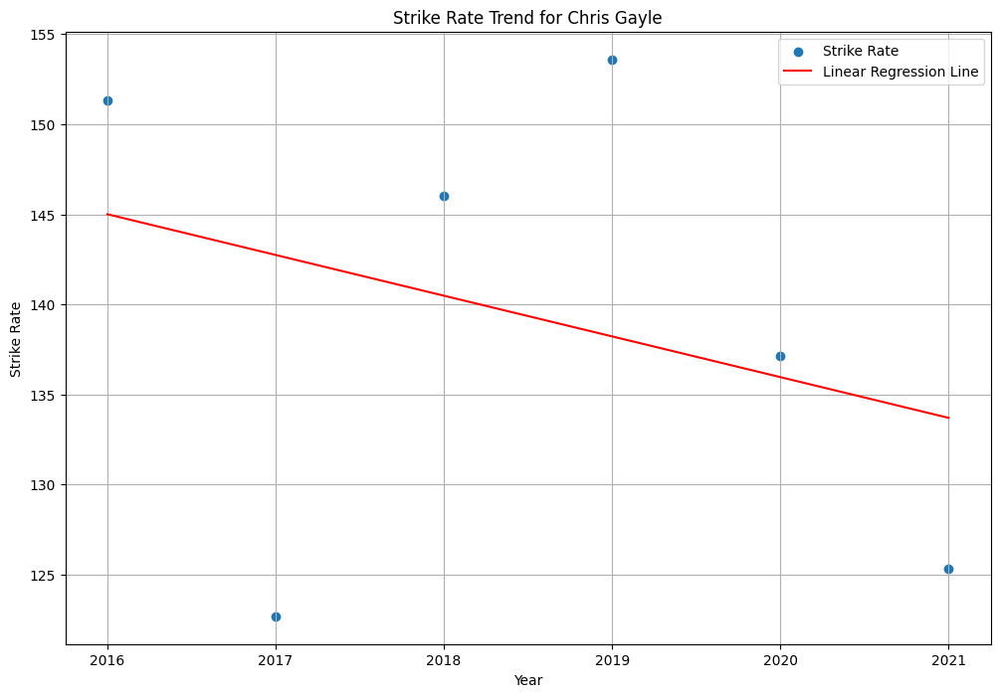

Player: Chris Gayle, Metric: Batting Avg Score, Slope (Coefficient): 1.257133342847629, Intercept: -2508.104997119284


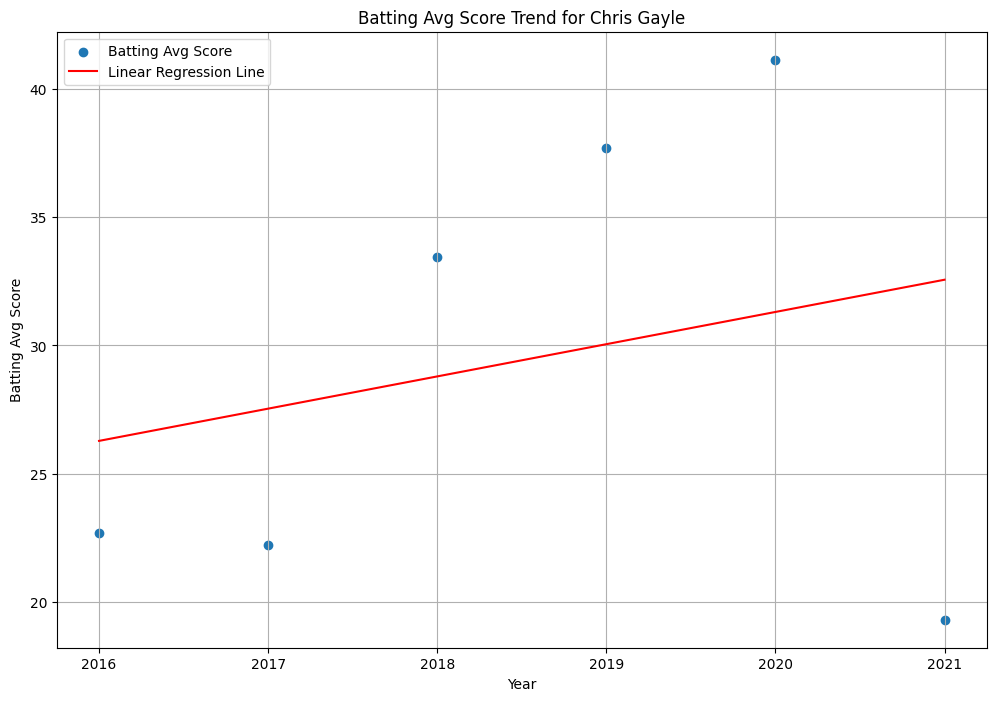

Player: Faf du Plessis, Metric: Batting Avg, Slope (Coefficient): 4.469428571428572, Intercept: -8988.749904761906


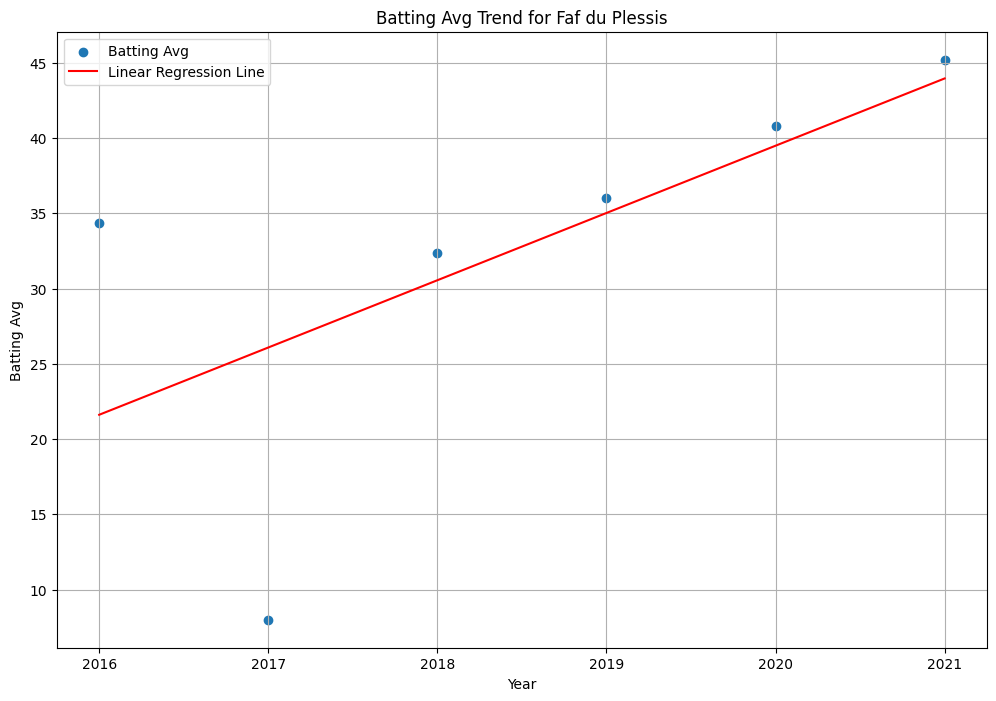

Player: Faf du Plessis, Metric: Strike Rate, Slope (Coefficient): 3.7825714285714276, Intercept: -7506.89876190476


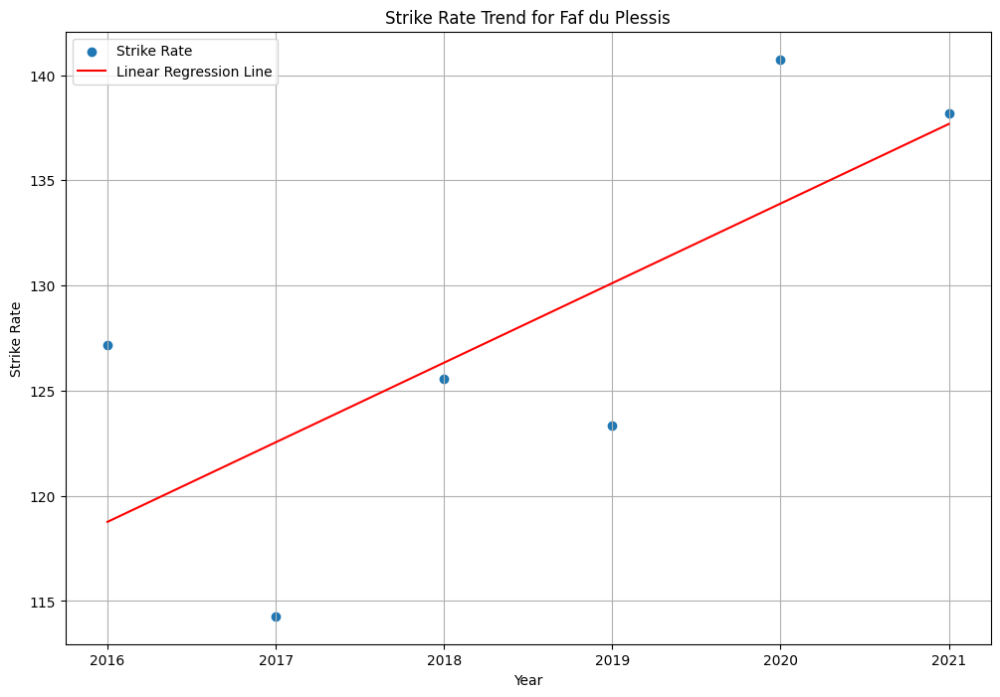

Player: Faf du Plessis, Metric: Batting Avg Score, Slope (Coefficient): 3.193177655677655, Intercept: -6416.023382173381


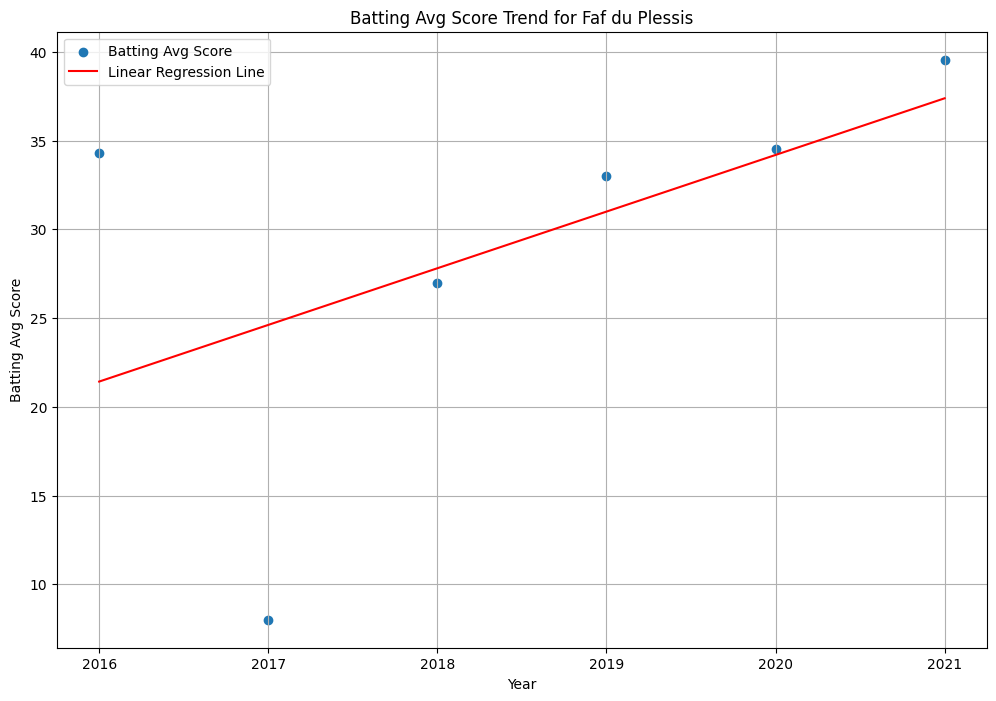

Player: Robin Uthappa, Metric: Batting Avg, Slope (Coefficient): -0.8510714285714288, Intercept: 1743.3632142857148


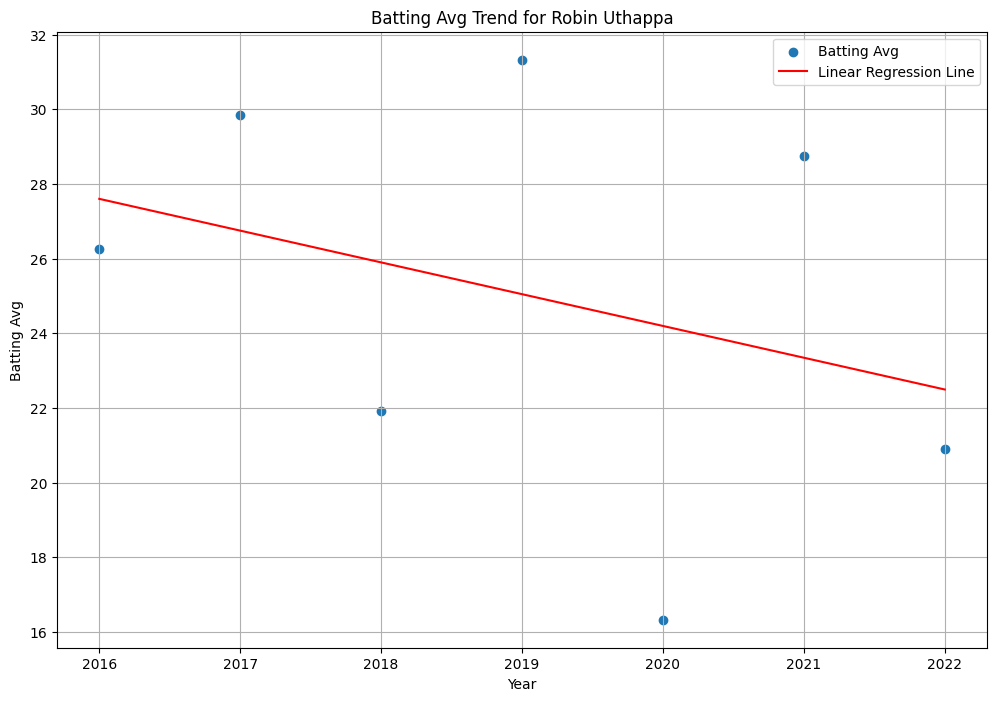

Player: Robin Uthappa, Metric: Strike Rate, Slope (Coefficient): -2.6725, Intercept: 5530.047500000001


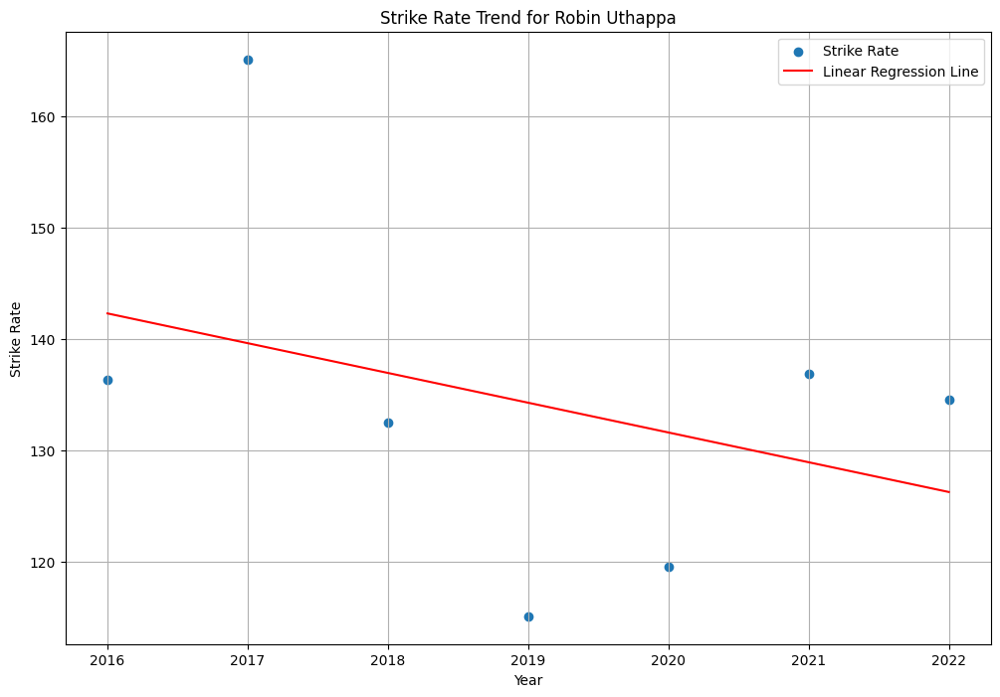

Player: Robin Uthappa, Metric: Batting Avg Score, Slope (Coefficient): -0.8524714868464868, Intercept: 1745.3798045704295


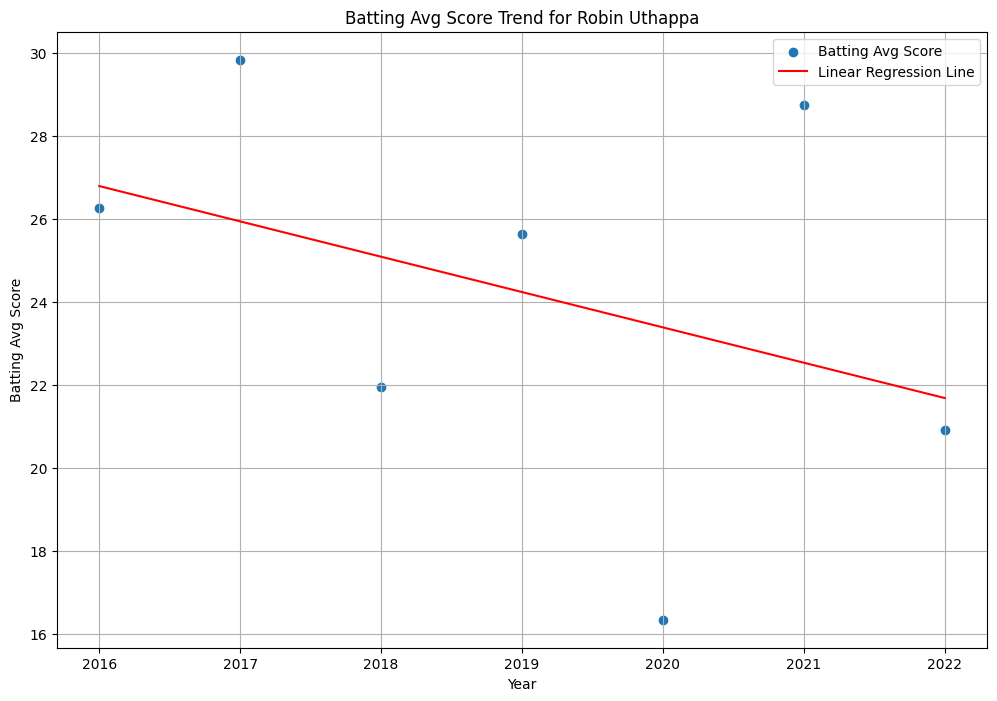

Player: Chris Morris, Metric: Batting Avg, Slope (Coefficient): -10.444857142857142, Intercept: 21111.115809523806


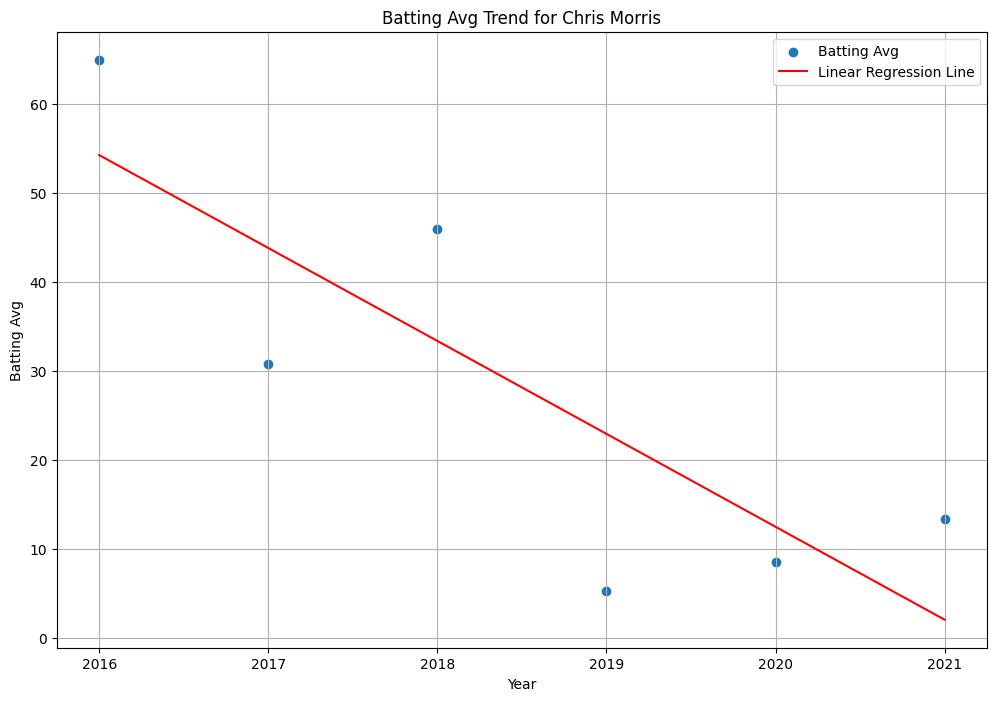

Player: Chris Morris, Metric: Strike Rate, Slope (Coefficient): -8.77142857142857, Intercept: 17855.91857142857


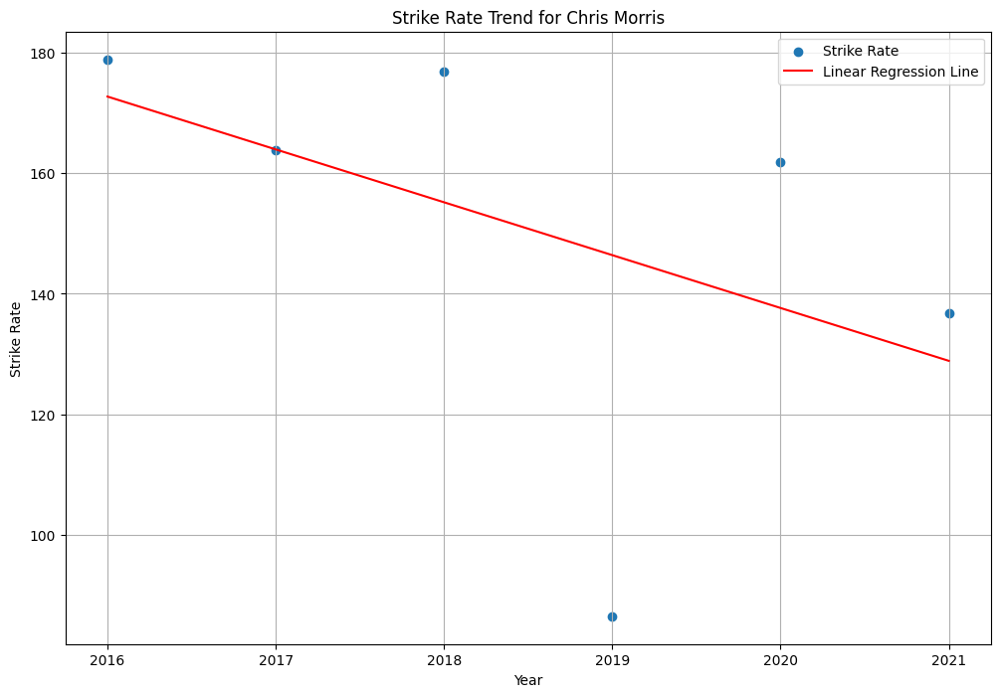

Player: Chris Morris, Metric: Batting Avg Score, Slope (Coefficient): -3.672244897959183, Intercept: 7425.455162509446


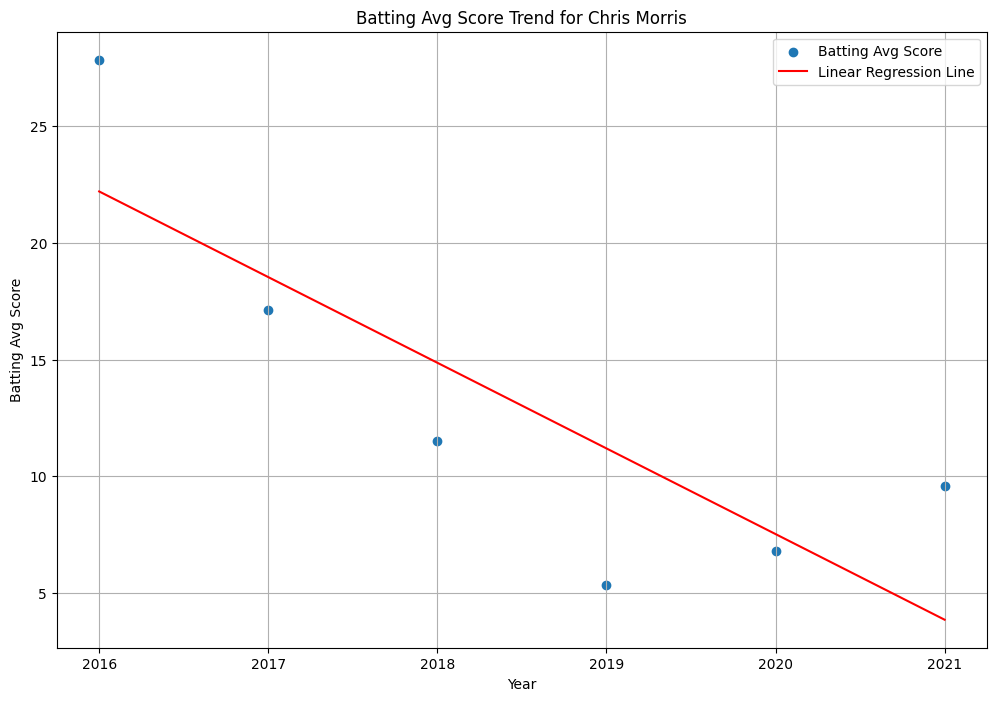

Player: Marcus Stoinis, Metric: Batting Avg, Slope (Coefficient): -0.6224999999999999, Intercept: 1283.4775


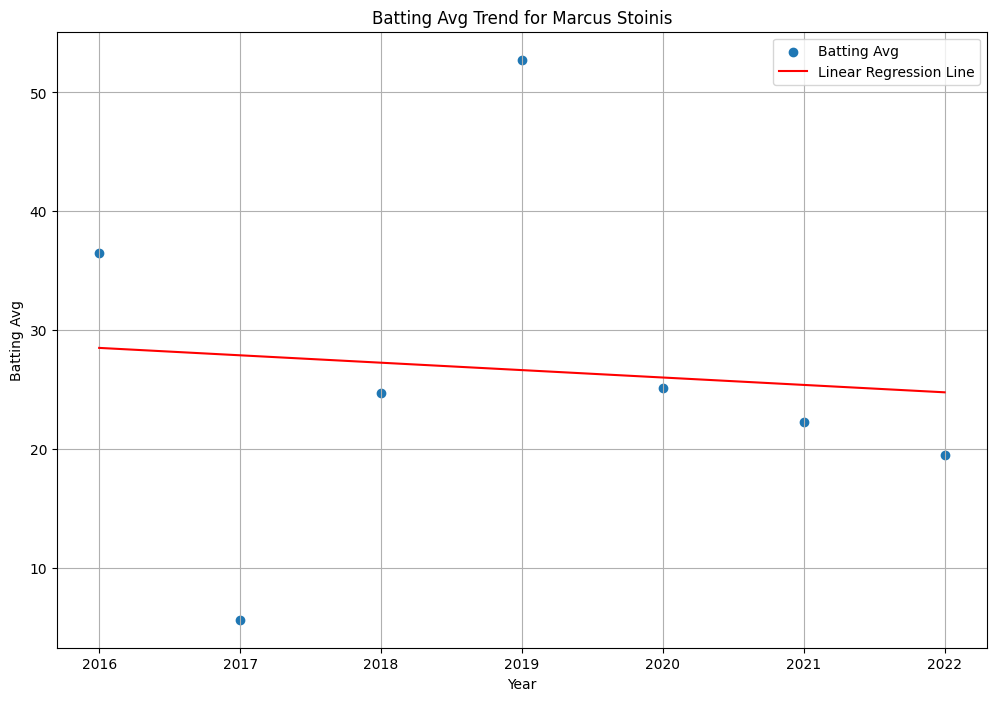

Player: Marcus Stoinis, Metric: Strike Rate, Slope (Coefficient): 5.7057142857142855, Intercept: -11392.578571428572


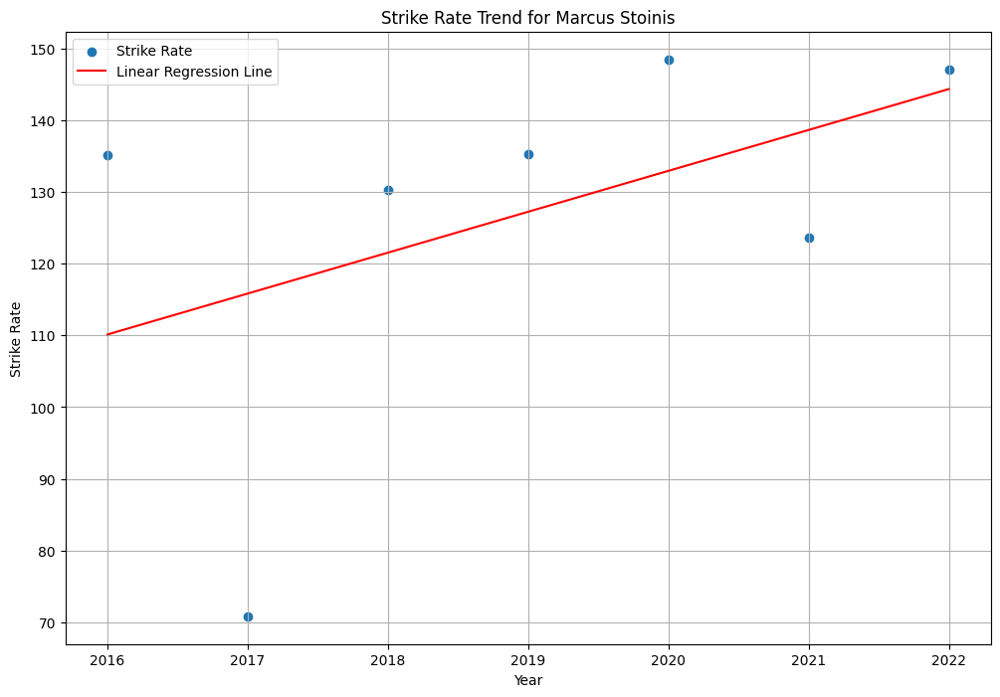

Player: Marcus Stoinis, Metric: Batting Avg Score, Slope (Coefficient): -0.7193477390956383, Intercept: 1469.381612645058


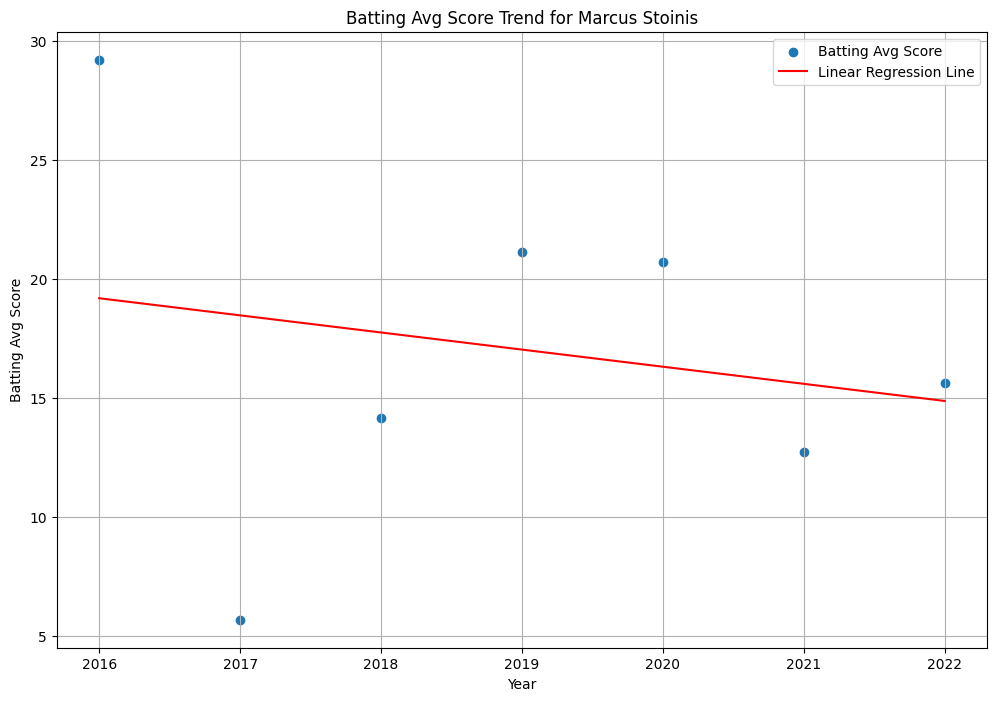

Player: Rishabh Pant, Metric: Batting Avg, Slope (Coefficient): 0.5210714285714283, Intercept: -1018.038928571428


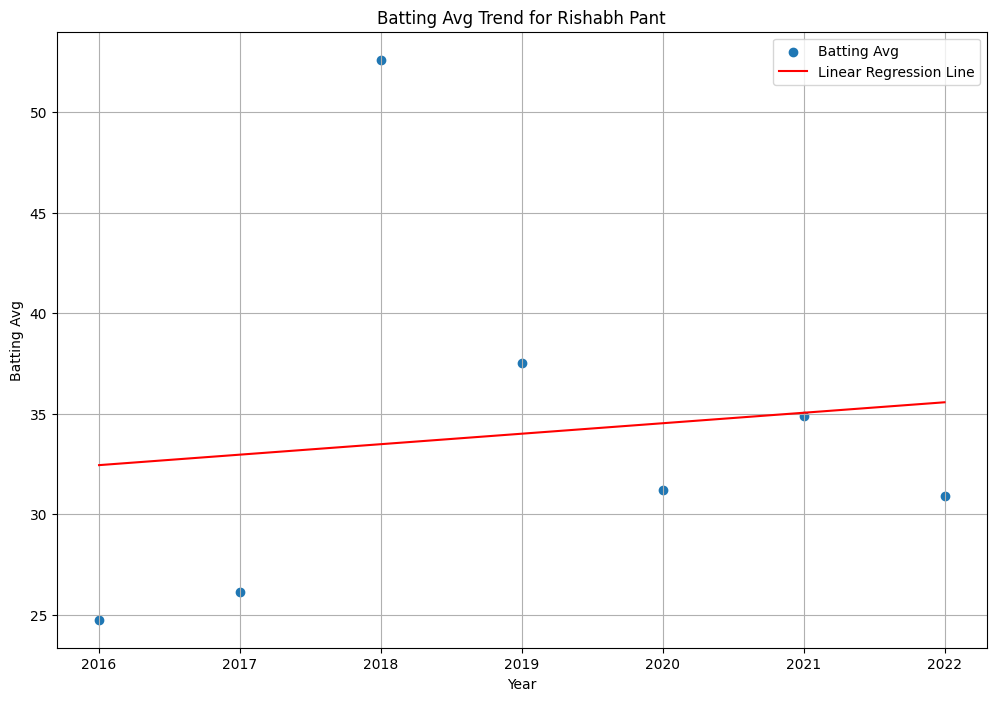

Player: Rishabh Pant, Metric: Strike Rate, Slope (Coefficient): -2.47392857142857, Intercept: 5141.487499999997


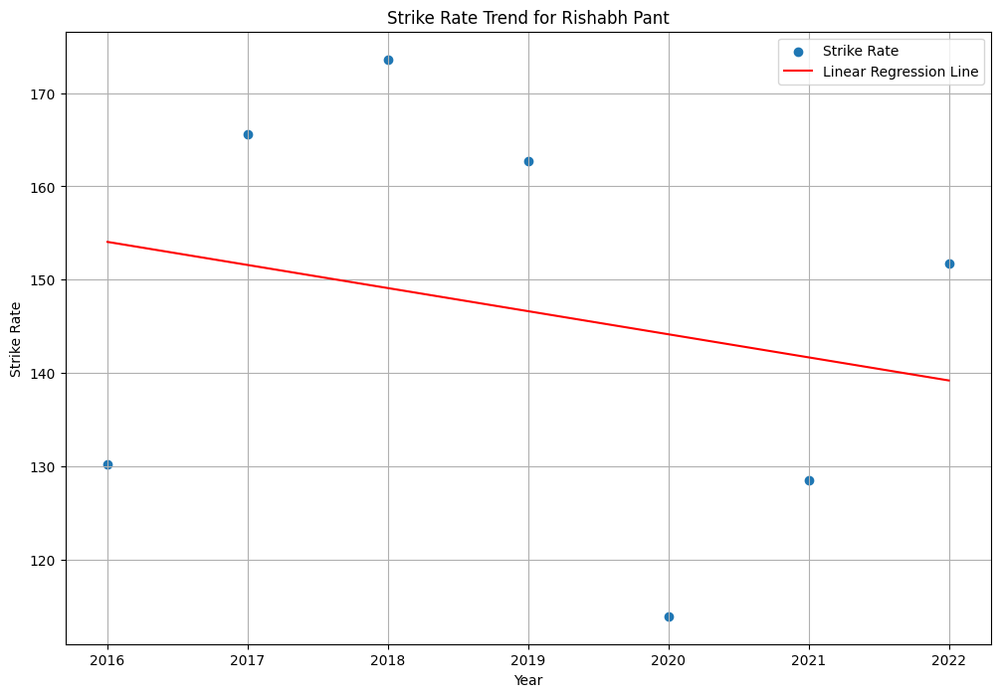

Player: Rishabh Pant, Metric: Batting Avg Score, Slope (Coefficient): -0.18593995290423873, Intercept: 404.2901000784932


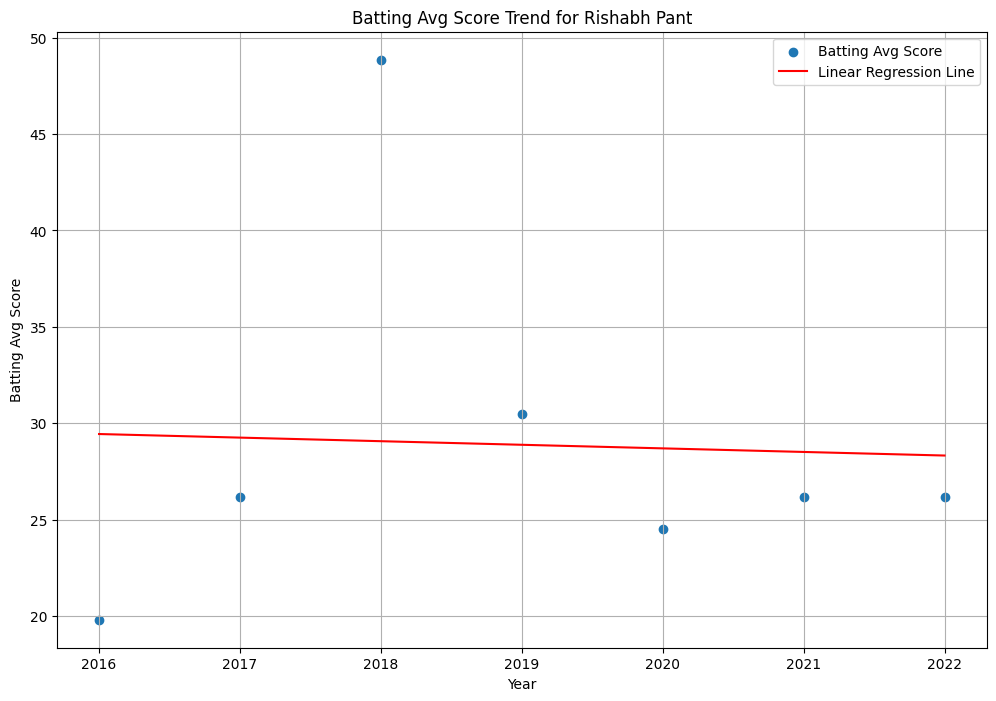

Player: Sarfaraz Khan, Metric: Batting Avg, Slope (Coefficient): -2.0022857142857147, Intercept: 4065.7872857142866


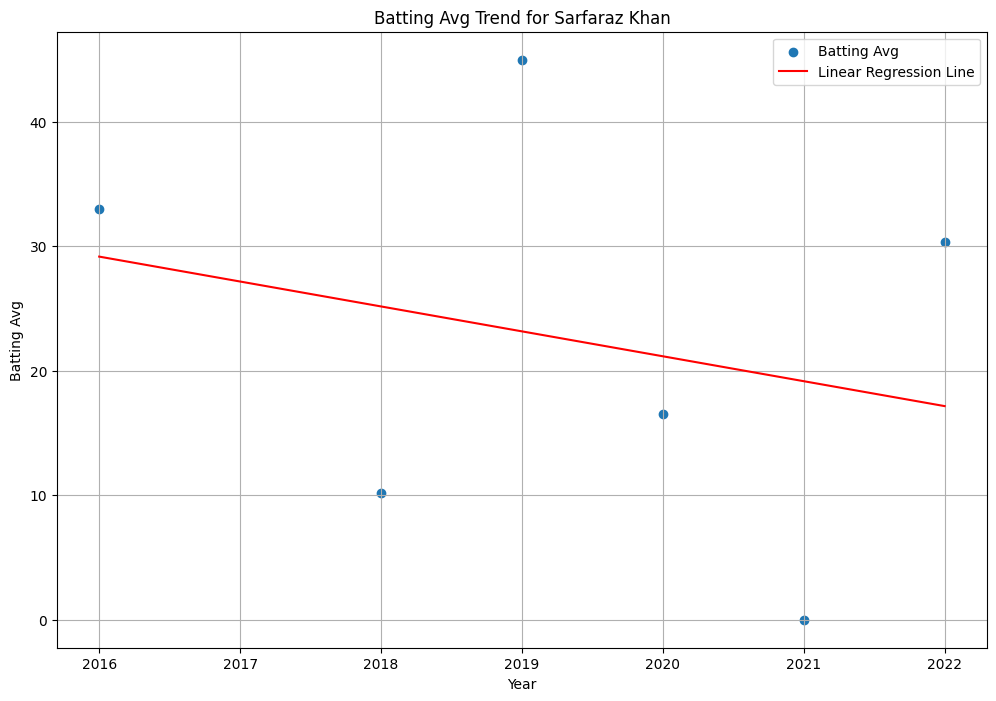

Player: Sarfaraz Khan, Metric: Strike Rate, Slope (Coefficient): -20.546999999999997, Intercept: 41610.03699999999


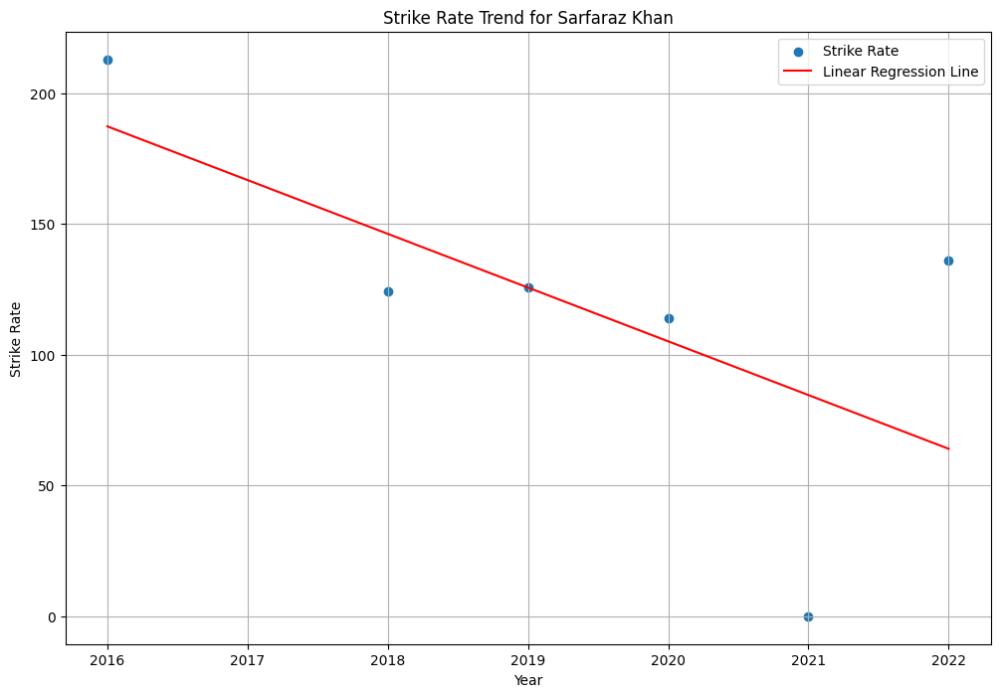

Player: Sarfaraz Khan, Metric: Batting Avg Score, Slope (Coefficient): -0.9628571428571429, Intercept: 1959.3628571428571


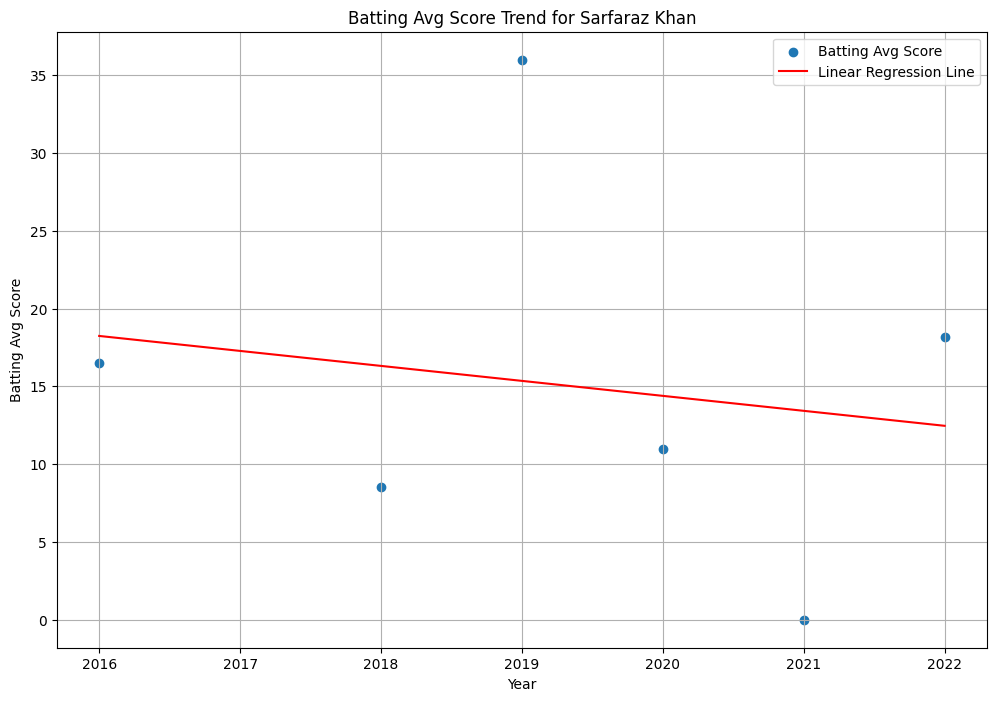

Player: Nitish Rana, Metric: Batting Avg, Slope (Coefficient): -0.7332142857142853, Intercept: 1509.656785714285


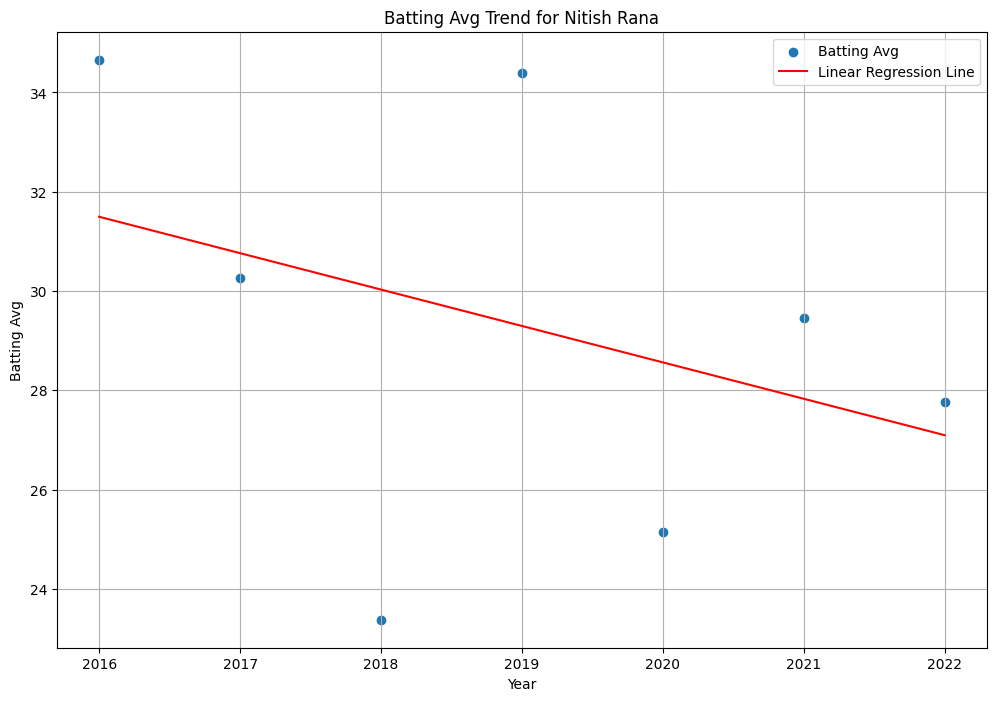

Player: Nitish Rana, Metric: Strike Rate, Slope (Coefficient): 0.5253571428571432, Intercept: -925.4717857142864


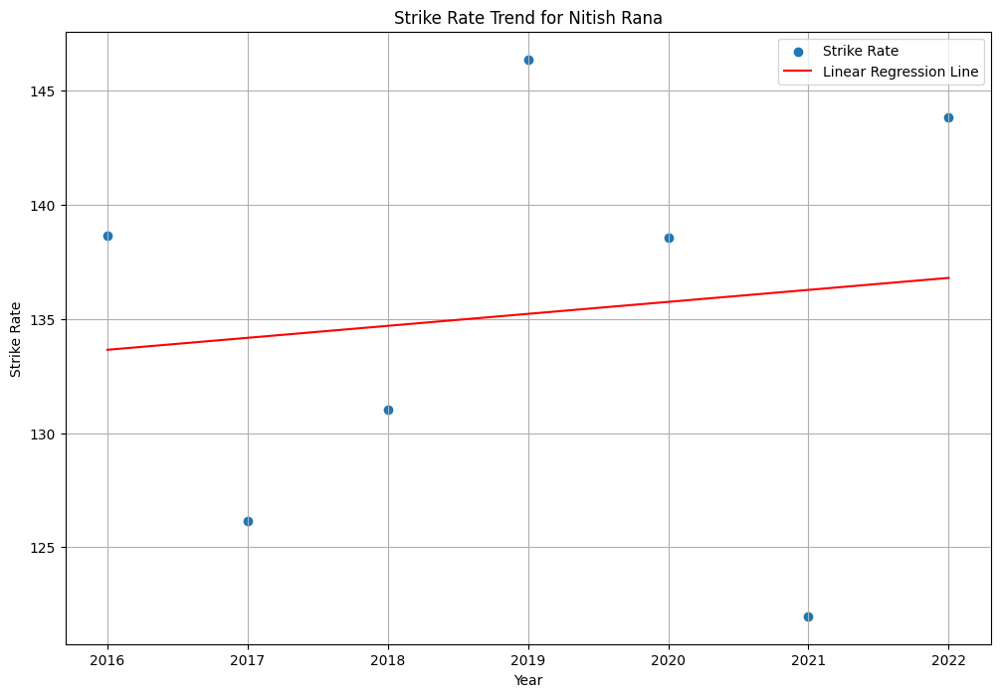

Player: Nitish Rana, Metric: Batting Avg Score, Slope (Coefficient): -1.0497023809523809, Intercept: 2146.3236974335186


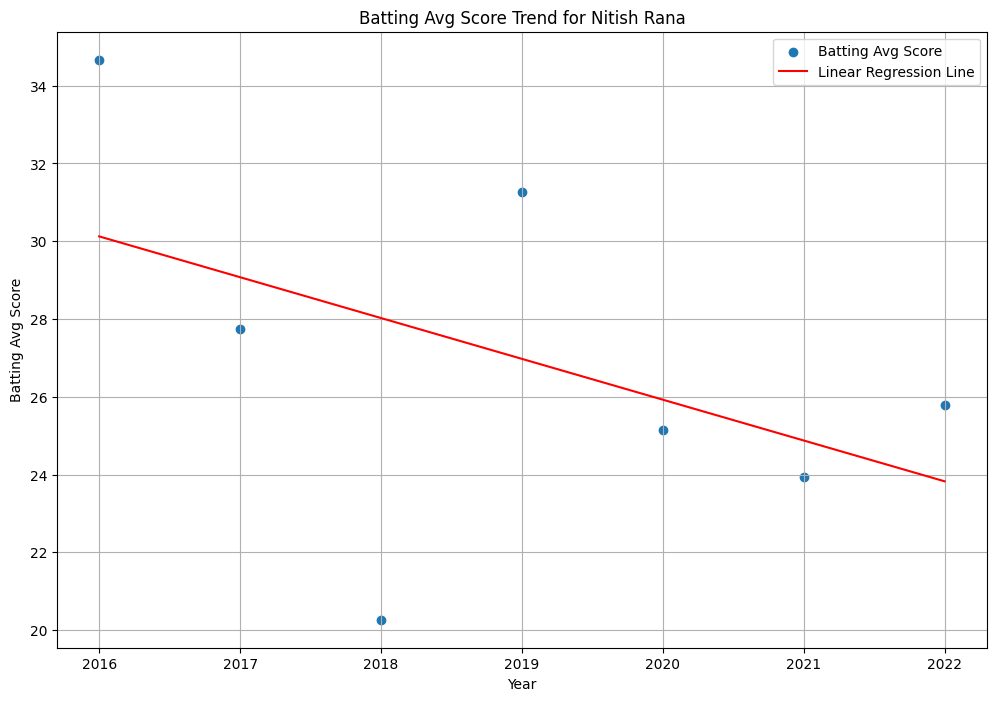

Player: Suryakumar Yadav, Metric: Batting Avg, Slope (Coefficient): 2.342142857142857, Intercept: -4697.556428571429


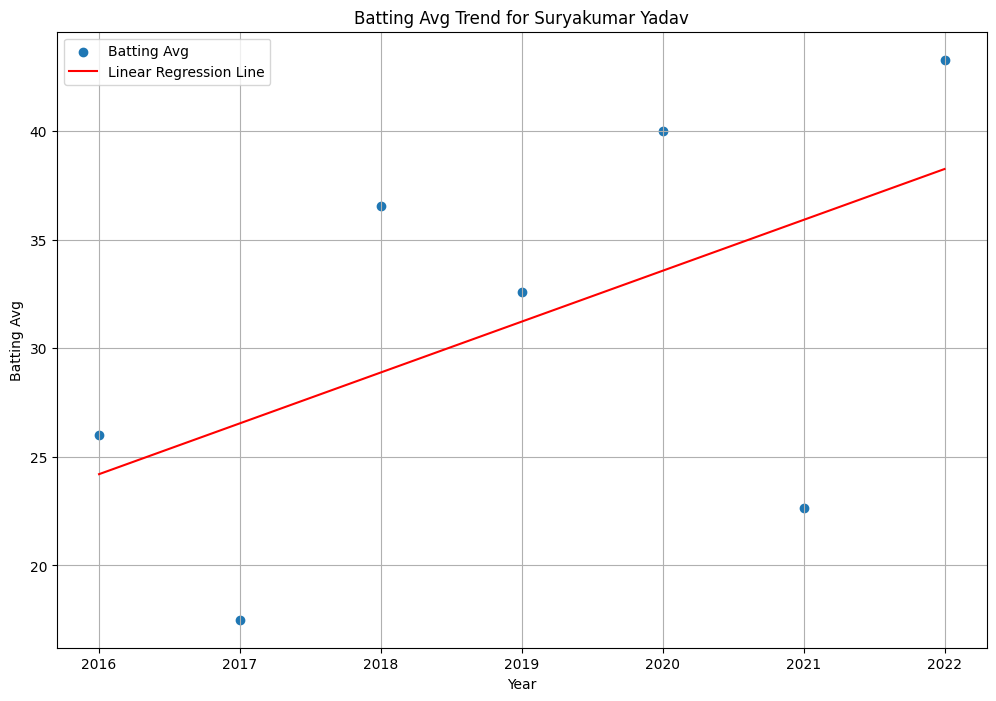

Player: Suryakumar Yadav, Metric: Strike Rate, Slope (Coefficient): 4.11142857142857, Intercept: -8165.991428571426


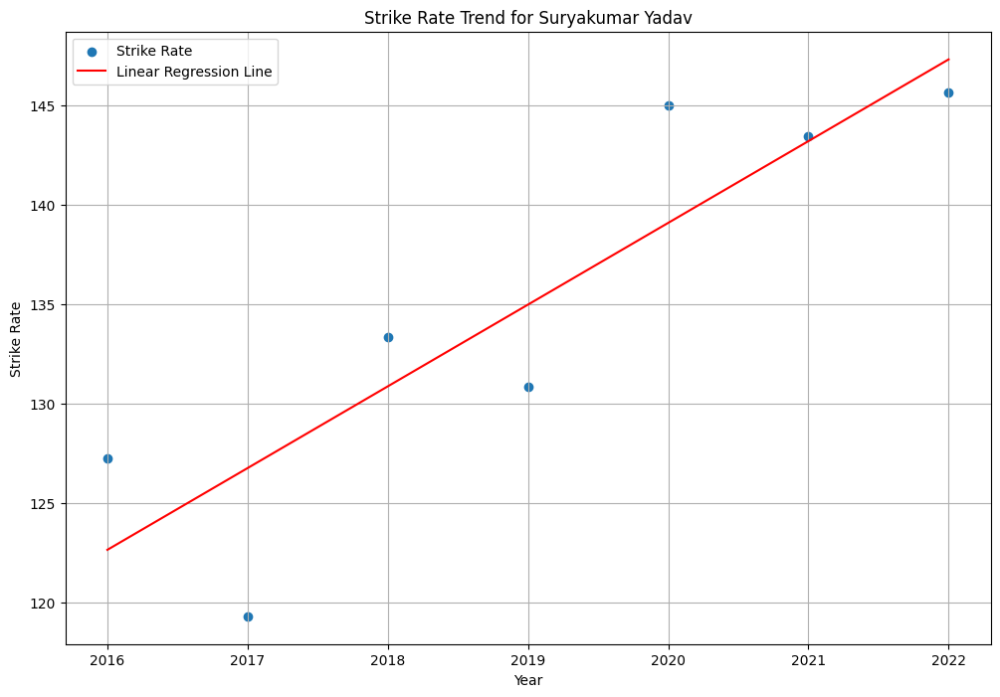

Player: Suryakumar Yadav, Metric: Batting Avg Score, Slope (Coefficient): 2.667961502782931, Intercept: -5359.628358843537


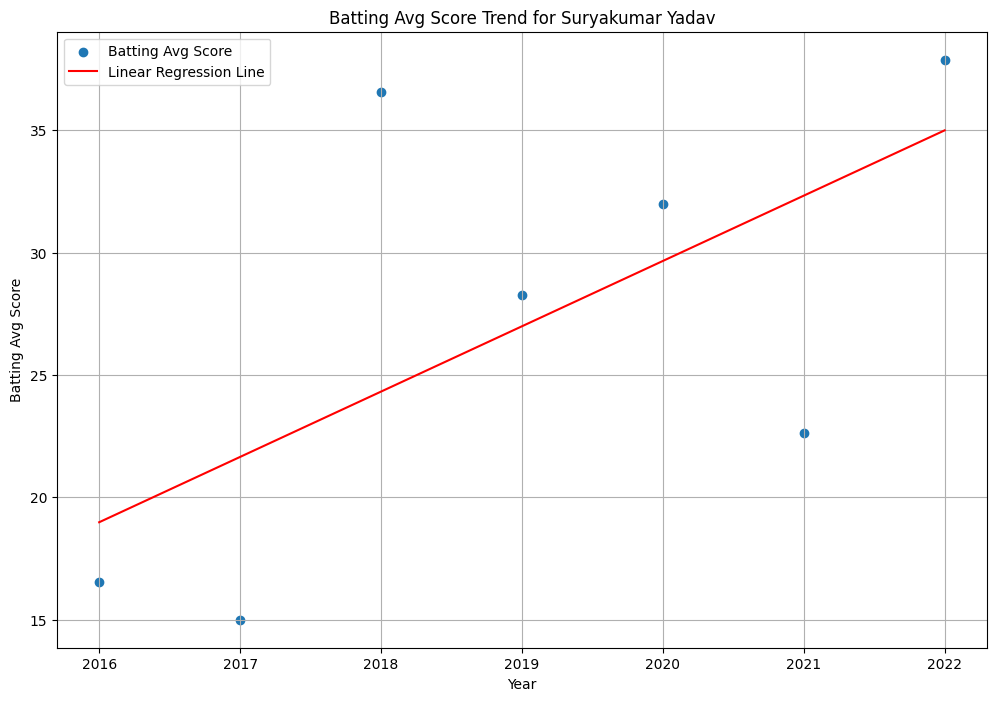

Player: Dinesh Karthik, Metric: Batting Avg, Slope (Coefficient): 0.8714285714285711, Intercept: -1725.891428571428


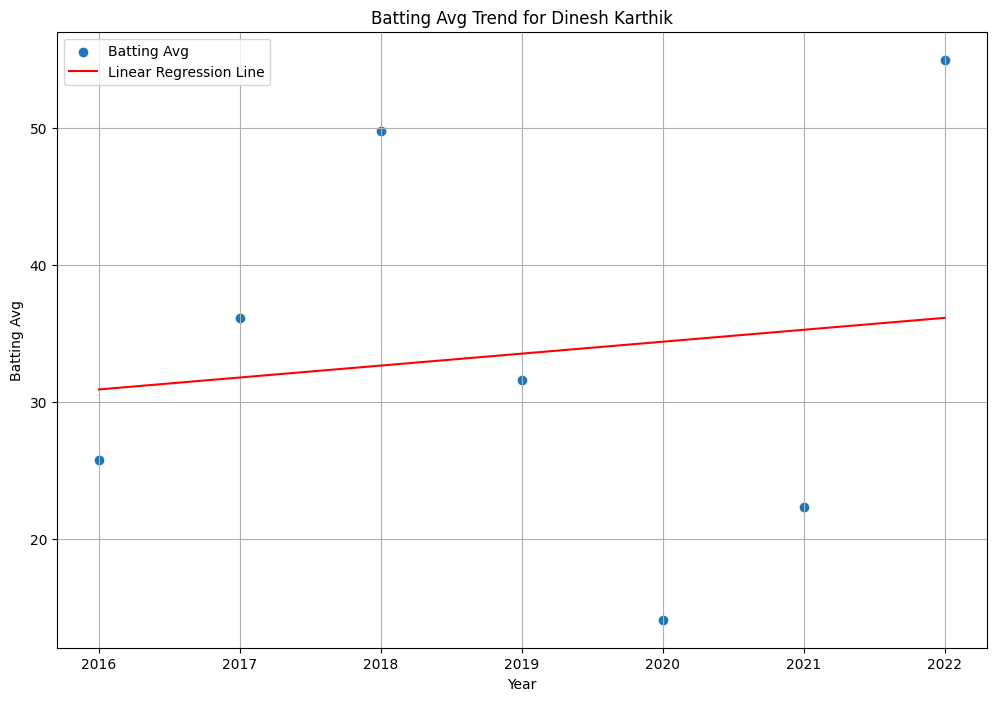

Player: Dinesh Karthik, Metric: Strike Rate, Slope (Coefficient): 4.79, Intercept: -9528.162857142857


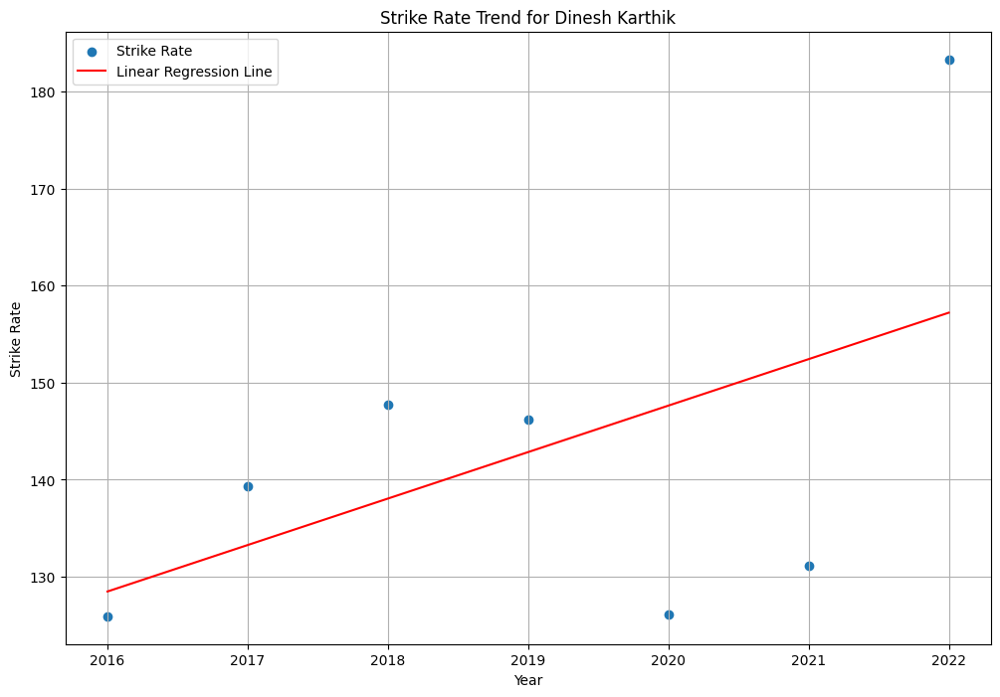

Player: Dinesh Karthik, Metric: Batting Avg Score, Slope (Coefficient): -1.7851321297749867, Intercept: 3625.360655416012


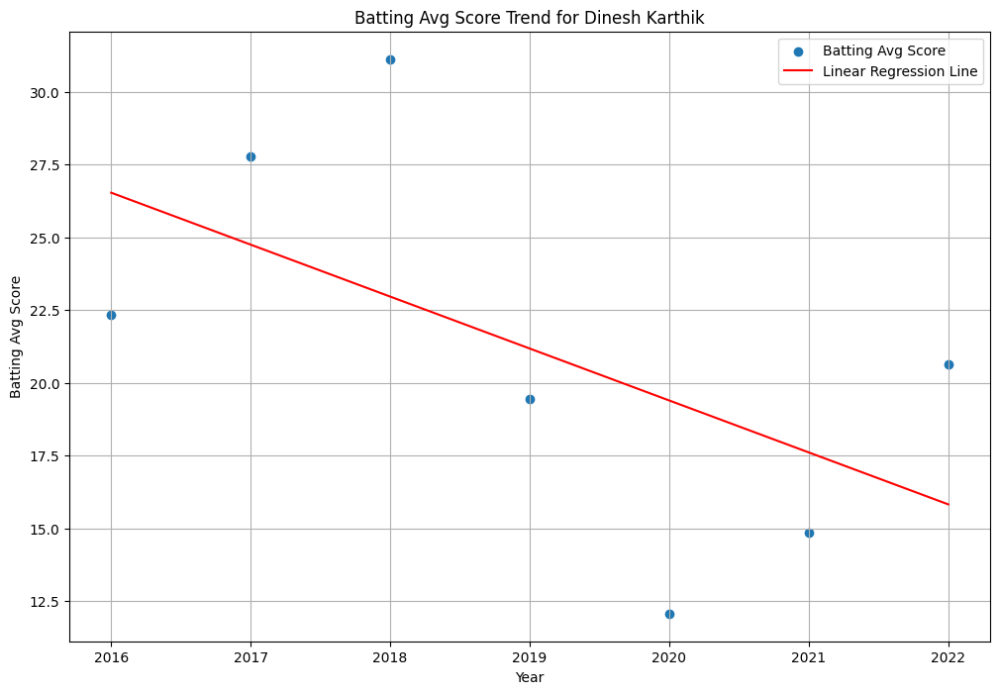

Player: Rohit Sharma, Metric: Batting Avg, Slope (Coefficient): -2.180714285714286, Intercept: 4431.016428571429


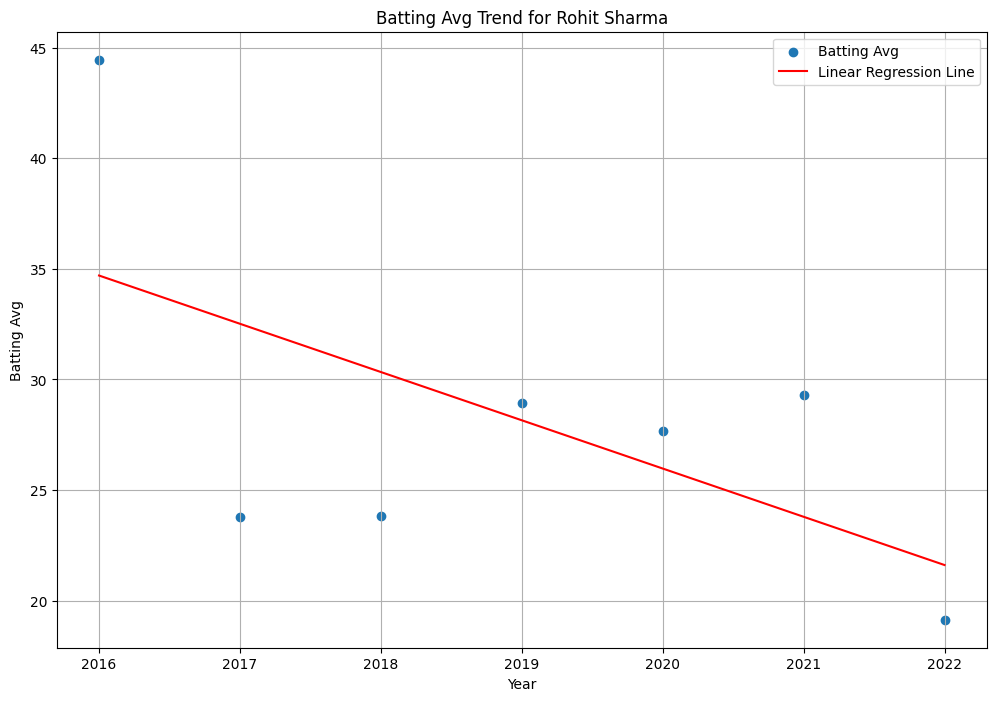

Player: Rohit Sharma, Metric: Strike Rate, Slope (Coefficient): -1.1628571428571424, Intercept: 2475.197142857142


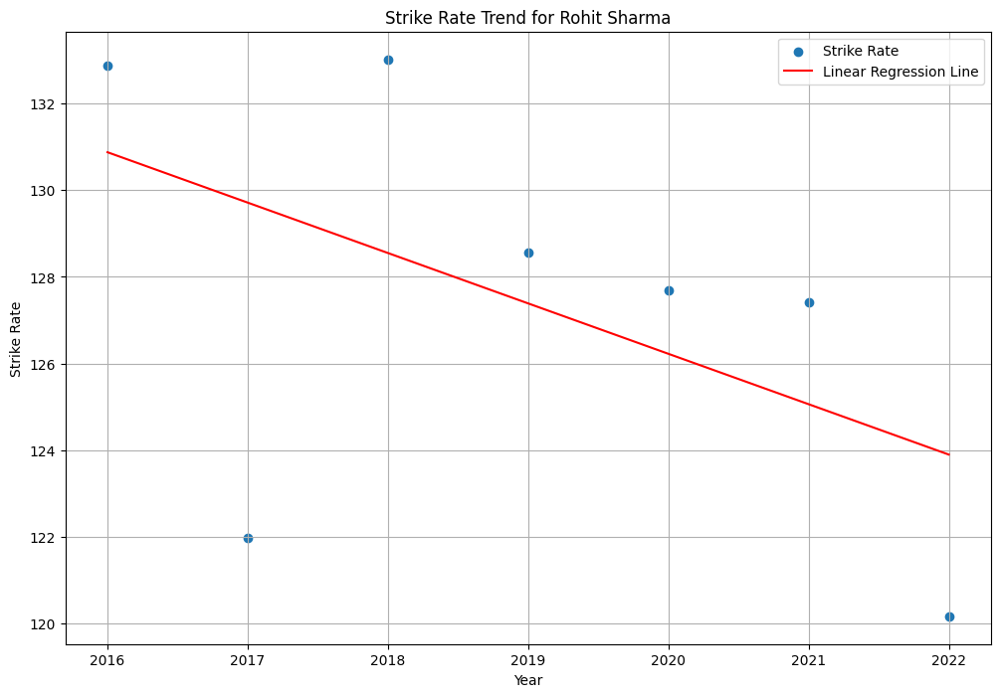

Player: Rohit Sharma, Metric: Batting Avg Score, Slope (Coefficient): -0.8260236787022504, Intercept: 1693.3542157247518


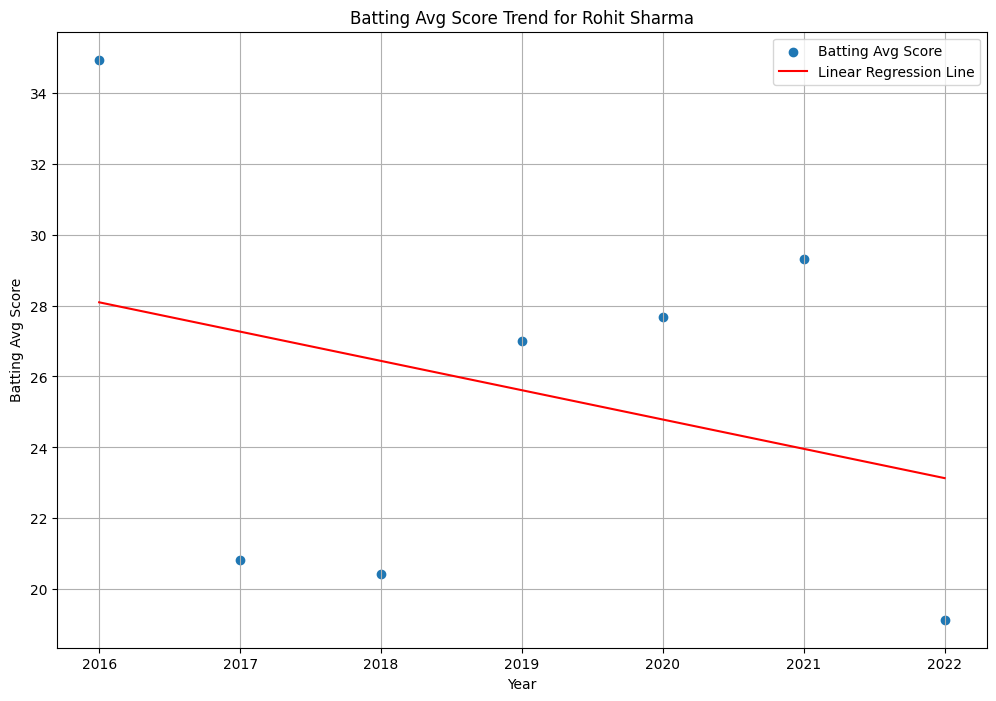

Player: Ishan Kishan, Metric: Batting Avg, Slope (Coefficient): 3.7074999999999996, Intercept: -7458.001071428571


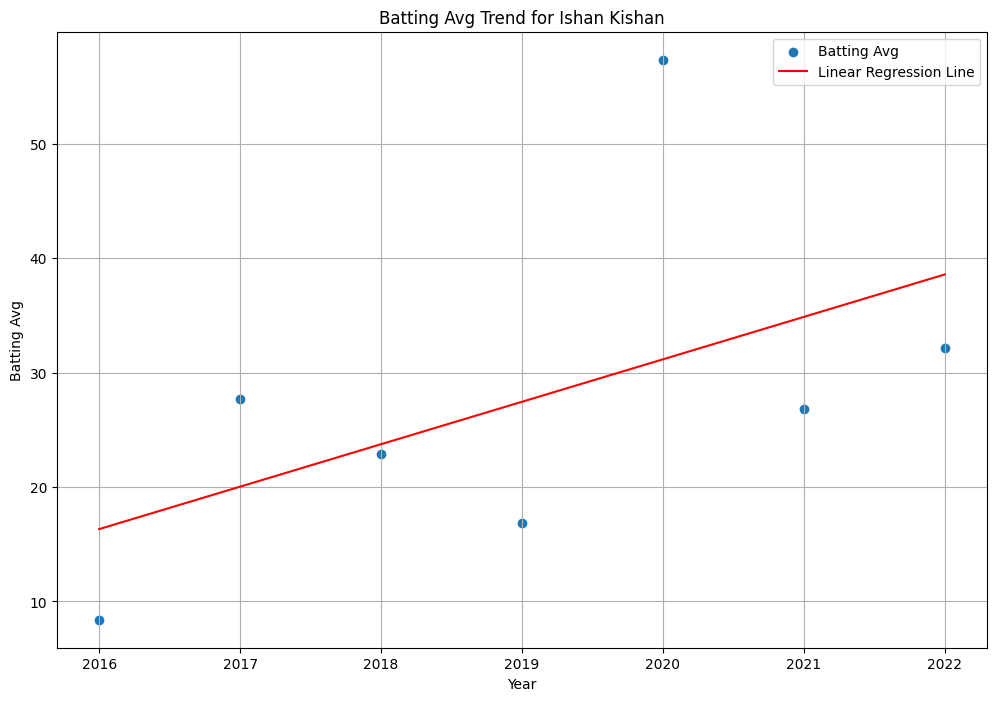

Player: Ishan Kishan, Metric: Strike Rate, Slope (Coefficient): 1.721071428571427, Intercept: -3348.1160714285684


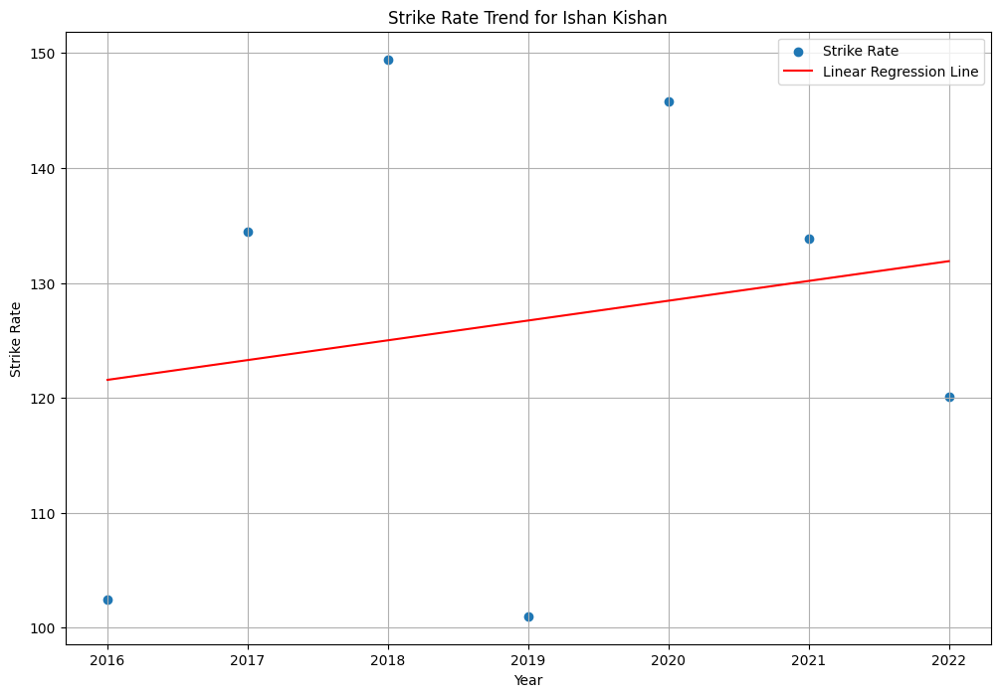

Player: Ishan Kishan, Metric: Batting Avg Score, Slope (Coefficient): 2.640966771323914, Intercept: -5307.897704081633


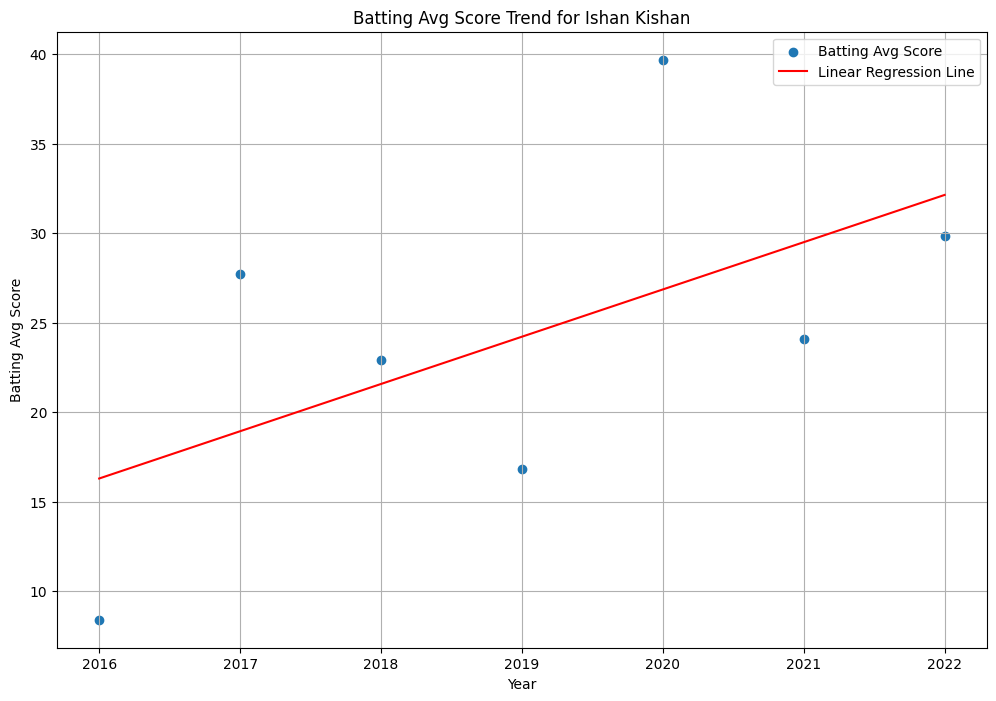

Player: Kieron Pollard, Metric: Batting Avg, Slope (Coefficient): 0.07892857142857171, Intercept: -129.64678571428627


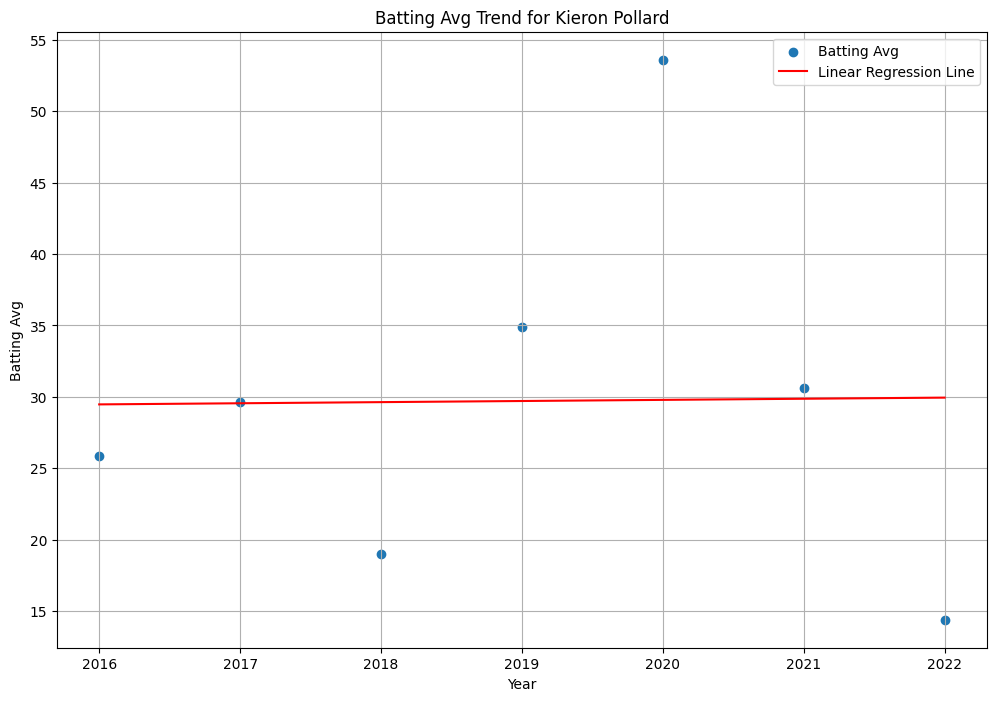

Player: Kieron Pollard, Metric: Strike Rate, Slope (Coefficient): -1.1596428571428596, Intercept: 2487.0817857142906


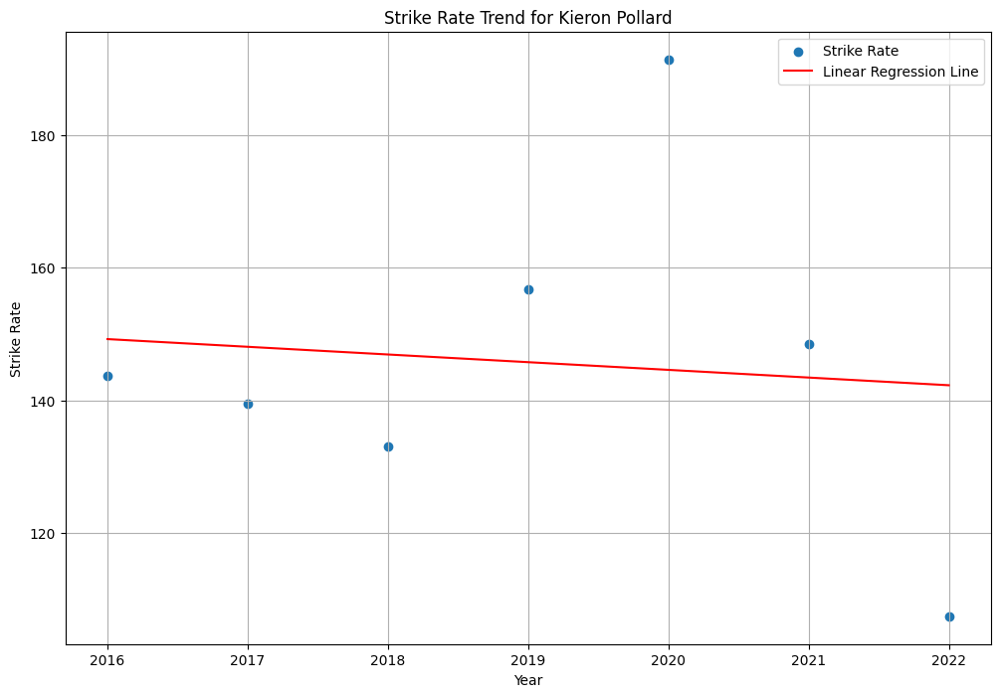

Player: Kieron Pollard, Metric: Batting Avg Score, Slope (Coefficient): -0.6143439893439891, Intercept: 1259.237152728224


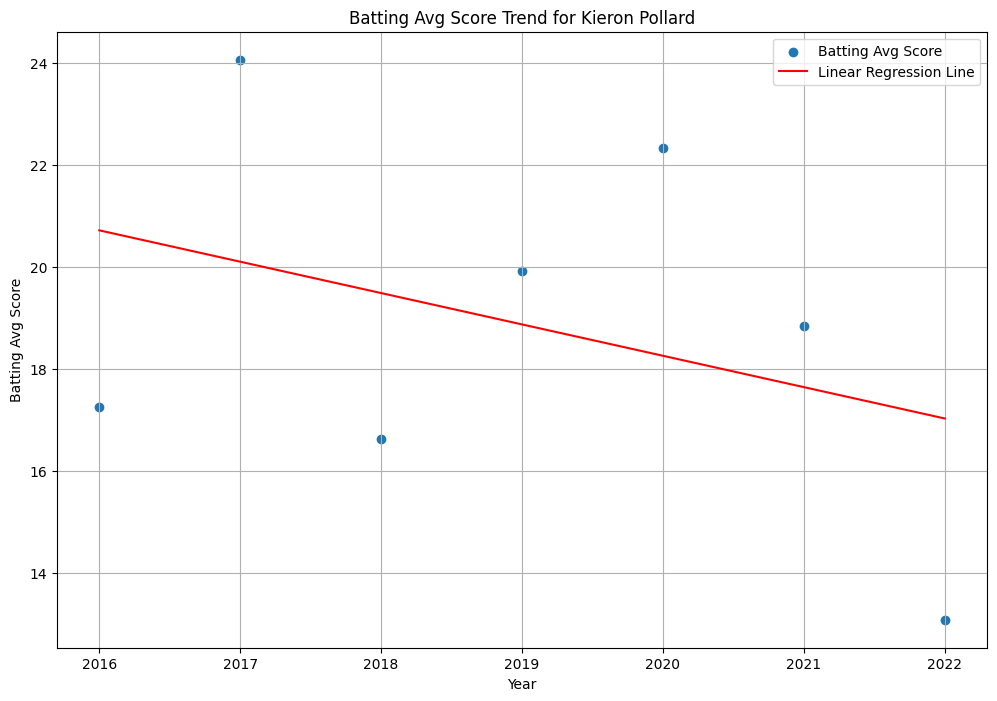

Player: Ambati Rayudu, Metric: Batting Avg, Slope (Coefficient): 0.0439285714285717, Intercept: -58.92035714285768


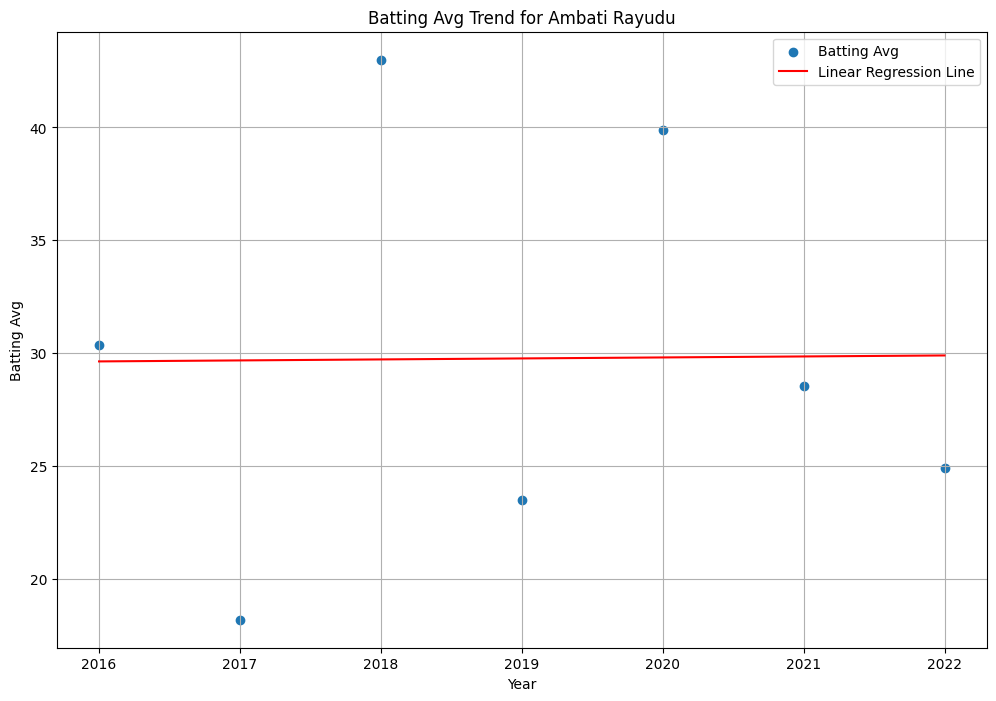

Player: Ambati Rayudu, Metric: Strike Rate, Slope (Coefficient): 1.8967857142857127, Intercept: -3703.838928571425


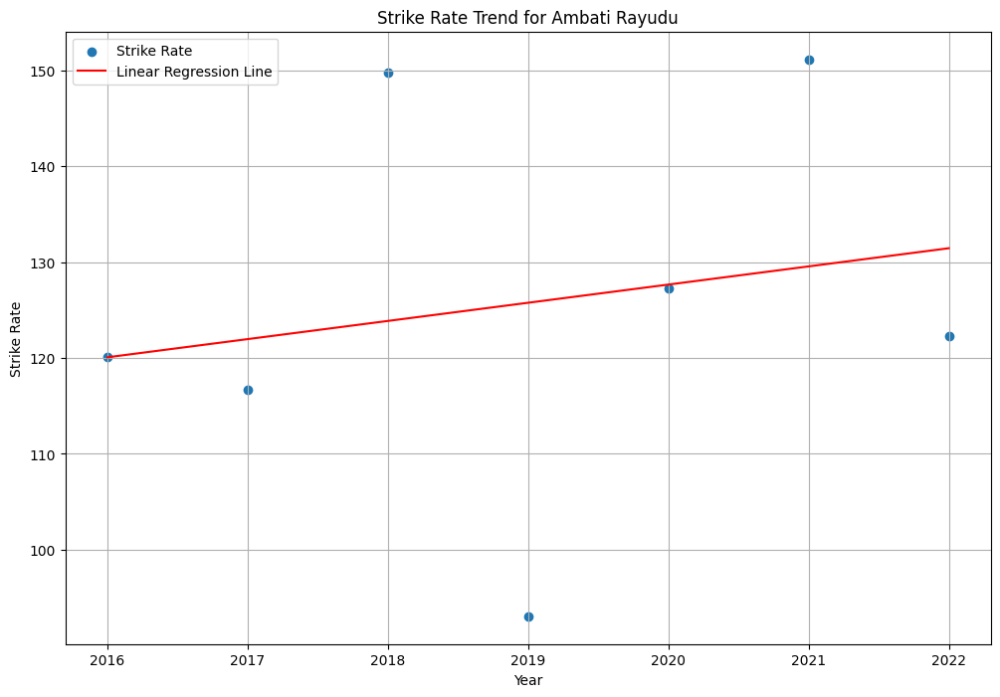

Player: Ambati Rayudu, Metric: Batting Avg Score, Slope (Coefficient): -0.3793893606393604, Intercept: 791.3530125511738


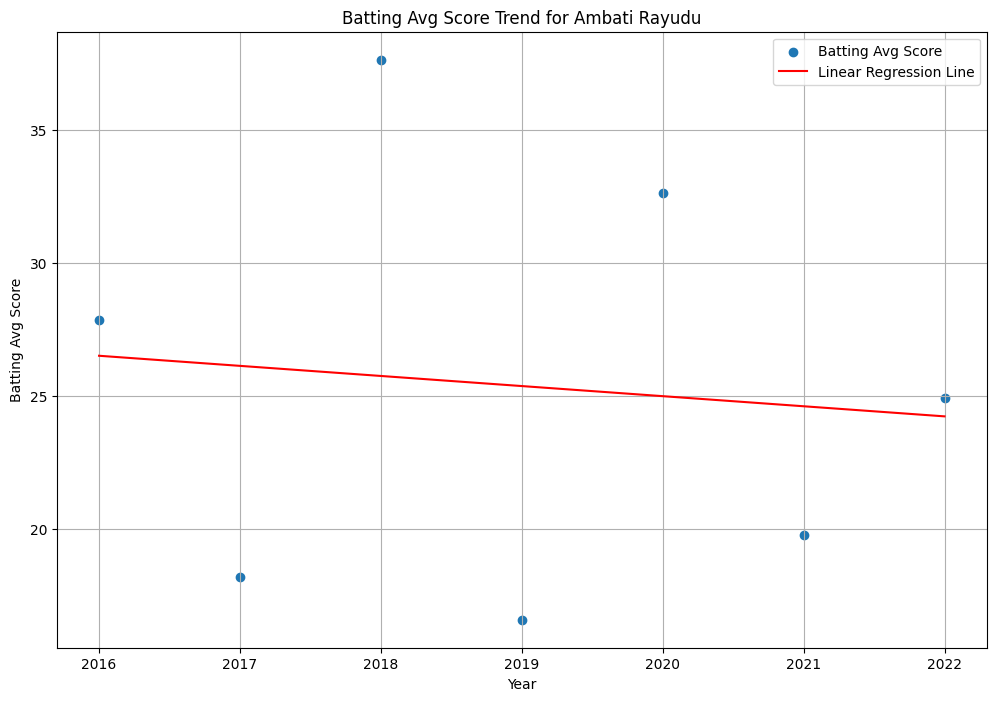

Player: AB de Villiers, Metric: Batting Avg, Slope (Coefficient): -1.7608571428571431, Intercept: 3596.6351428571434


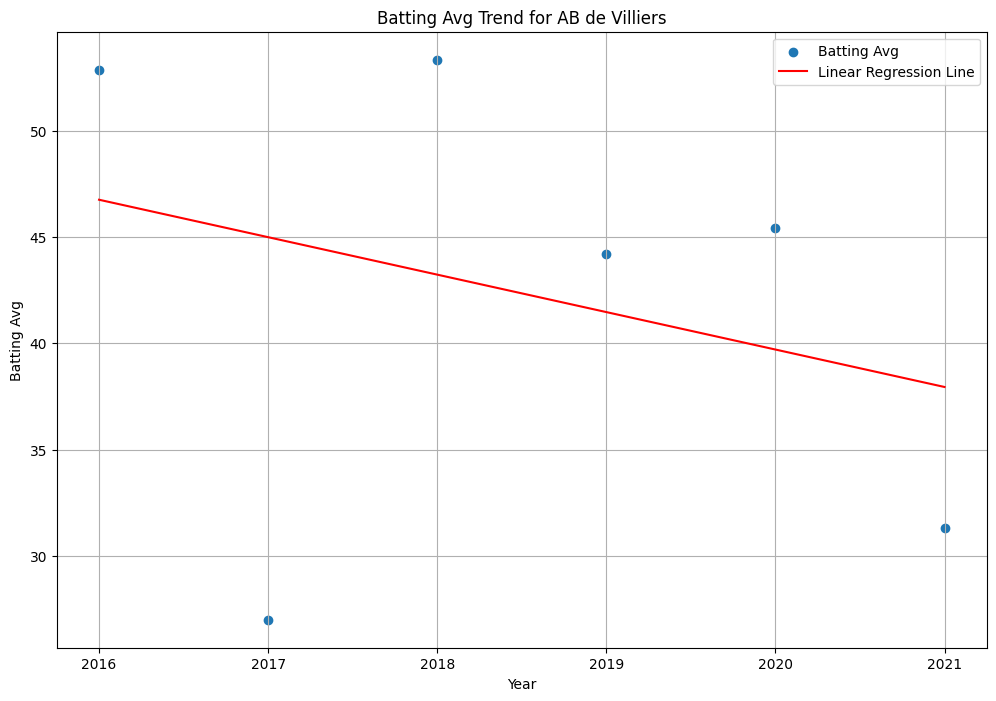

Player: AB de Villiers, Metric: Strike Rate, Slope (Coefficient): -1.2599999999999967, Intercept: 2699.4633333333263


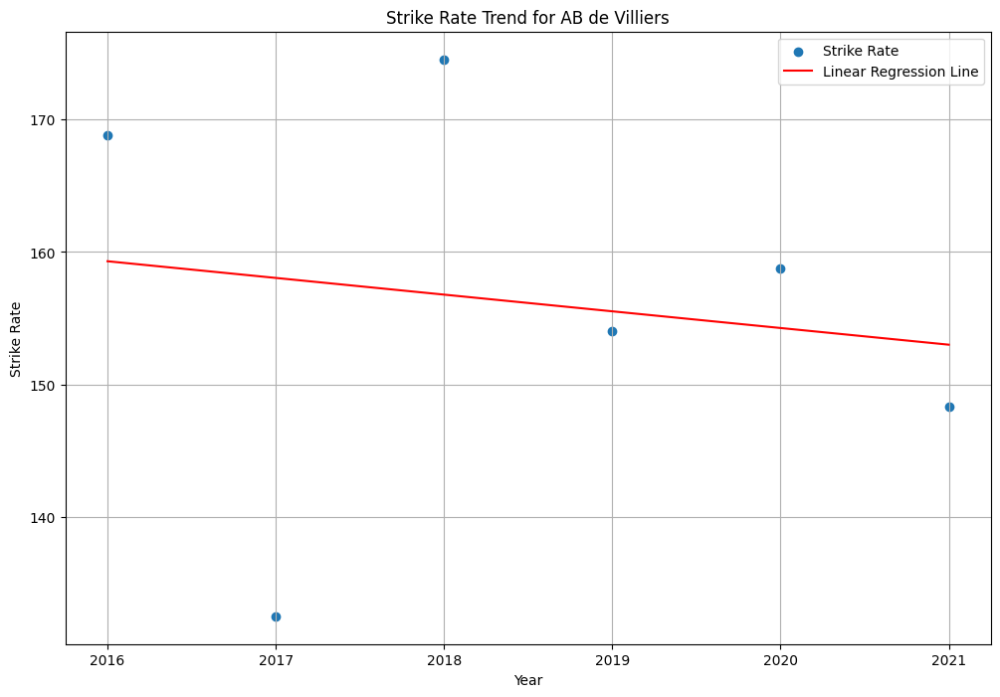

Player: AB de Villiers, Metric: Batting Avg Score, Slope (Coefficient): -2.492926716141002, Intercept: 5065.199172850958


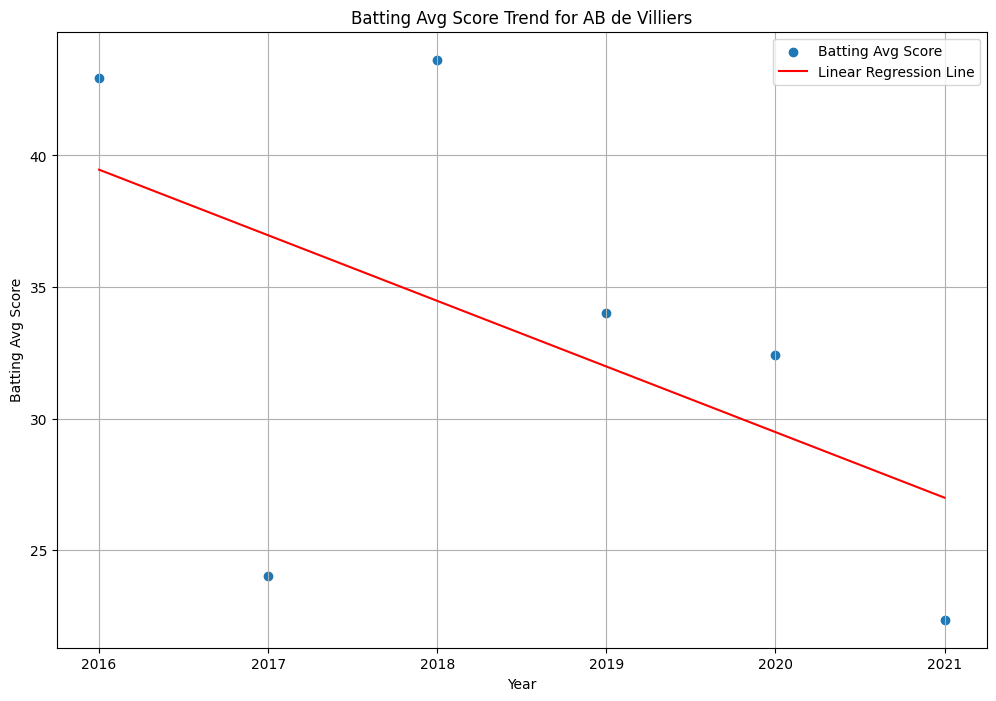

Player: David Miller, Metric: Batting Avg, Slope (Coefficient): 5.537577639751551, Intercept: -11145.96465838509


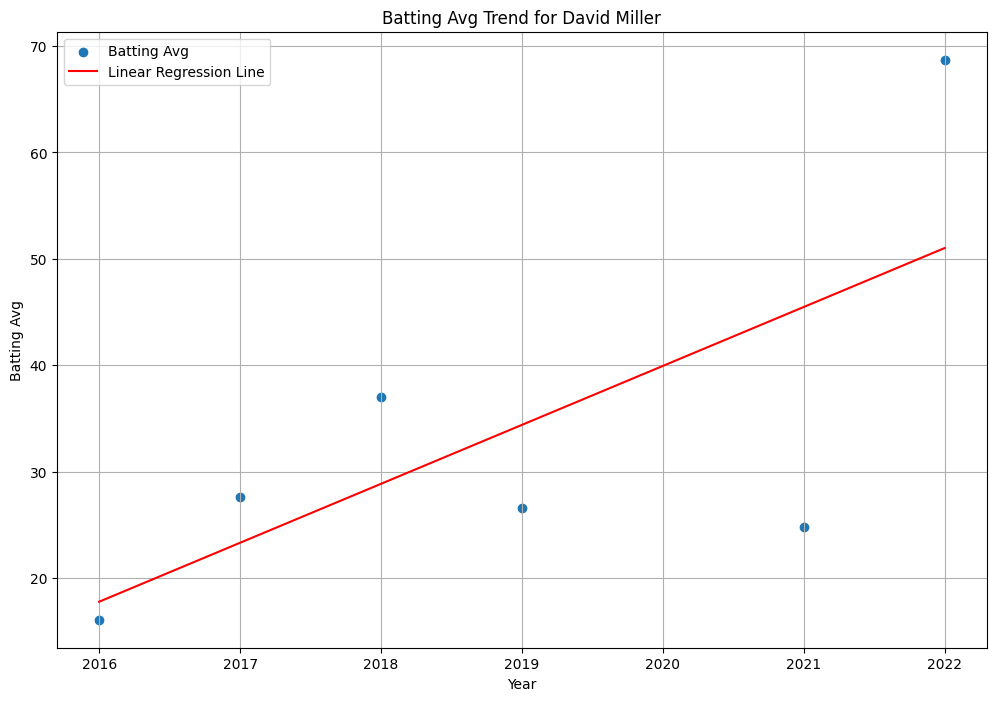

Player: David Miller, Metric: Strike Rate, Slope (Coefficient): 2.85335403726708, Intercept: -5639.681242236023


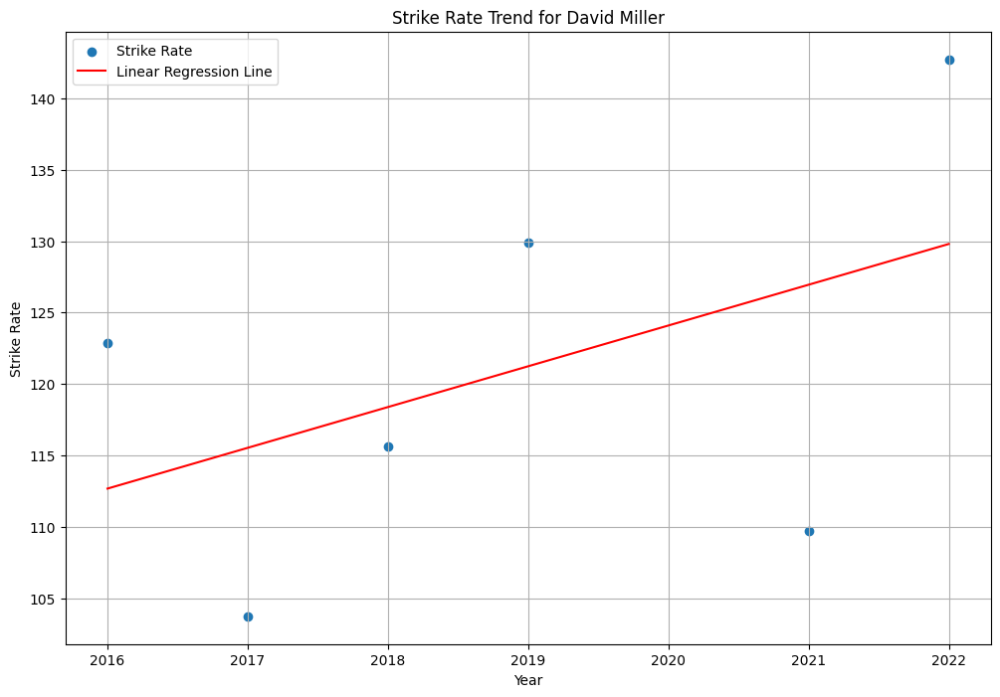

Player: David Miller, Metric: Batting Avg Score, Slope (Coefficient): 1.4401596591813983, Intercept: -2886.6650282688324


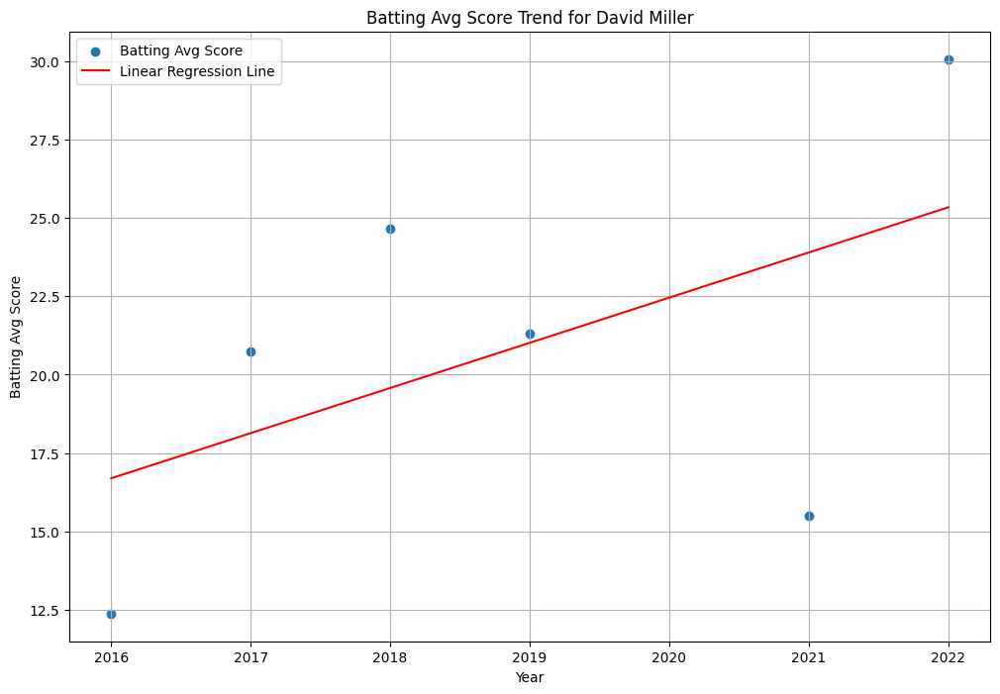

In [71]:
# Function to perform linear regression and plot the trend line
# Create a dictionary to store player-wise data
batsman_data_dict = {}

# Extract the data for the selected metric and year
for player_name in batsman_names_list:
    years = [entry['Year'] for entry in all_batting_data if entry['Player'] == player_name]
    batting_avg_values = [entry['Avg'] for entry in all_batting_data if entry['Player'] == player_name]
    sr_values = [entry['SR'] for entry in all_batting_data if entry['Player'] == player_name]
    batting_avg_score = [entry['Avg_score'] for entry in all_batting_data if entry['Player'] == player_name]
    
    batsman_data_dict[player_name] = {'Year': years, 'Batting Avg': batting_avg_values, 'Strike Rate': sr_values, 'Batting Avg Score': batting_avg_score}

# Perform linear regression for each player and each metric
positive_trend_batsman = []
for player_name, player_data in batsman_data_dict.items():
    X = np.array(player_data['Year'])
    metrics = ['Batting Avg', 'Strike Rate', 'Batting Avg Score']
    
    for metric in metrics:
        Y = np.array(player_data[metric])

        # Calculate the mean of X and Y
        mean_x = np.mean(X)
        mean_y = np.mean(Y)

        # Calculate the slope (coefficient)
        num = np.sum((X - mean_x) * (Y - mean_y))
        den = np.sum((X - mean_x) ** 2)
        slope = num / den

        # Check if the slope is positive
        if slope > -1:
            positive_trend_batsman.append(player_name)

        # Calculate the intercept
        intercept = mean_y - slope * mean_x

        # Print the slope and intercept for each player and metric
        print(f"Player: {player_name}, Metric: {metric}, Slope (Coefficient): {slope}, Intercept: {intercept}")

        # Create the linear regression line
        regression_line = slope * X + intercept

        # Plot the actual data points and the linear regression line for each player and metric
        plt.figure(figsize=(12, 8))
        plt.scatter(X, Y, label=metric)
        plt.plot(X, regression_line, color='red', label='Linear Regression Line')
        plt.xlabel('Year')
        plt.ylabel(metric)
        plt.title(f'{metric} Trend for {player_name}')
        plt.legend()
        plt.grid(True)
        plt.show()

In [72]:
# Find unique Batsman players with a positive trend in at least two metrics
batsman_with_positive_trend = set([player for player in positive_trend_batsman if positive_trend_batsman.count(player) >= 2])
print("Batsman with a Positive Trend in at least Two Metrics:")
print("\n" , len(batsman_with_positive_trend) , "\n")
for i in batsman_with_positive_trend:
    print(i)

Batsman with a Positive Trend in at least Two Metrics:

 24 

Sanju Samson
Andre Russell
Ravindra Jadeja
Jos Buttler
Hardik Pandya
Deepak Hooda
Rahul Tewatia
Shikhar Dhawan
Glenn Maxwell
Mayank Agarwal
Rahul Tripathi
Wriddhiman Saha
Chris Gayle
Faf du Plessis
Robin Uthappa
Marcus Stoinis
Rishabh Pant
Nitish Rana
Suryakumar Yadav
Dinesh Karthik
Ishan Kishan
Kieron Pollard
Ambati Rayudu
David Miller


Player: Amit Mishra, Metric: Bowling Avg, Slope (Coefficient): -1.996, Intercept: 4053.836


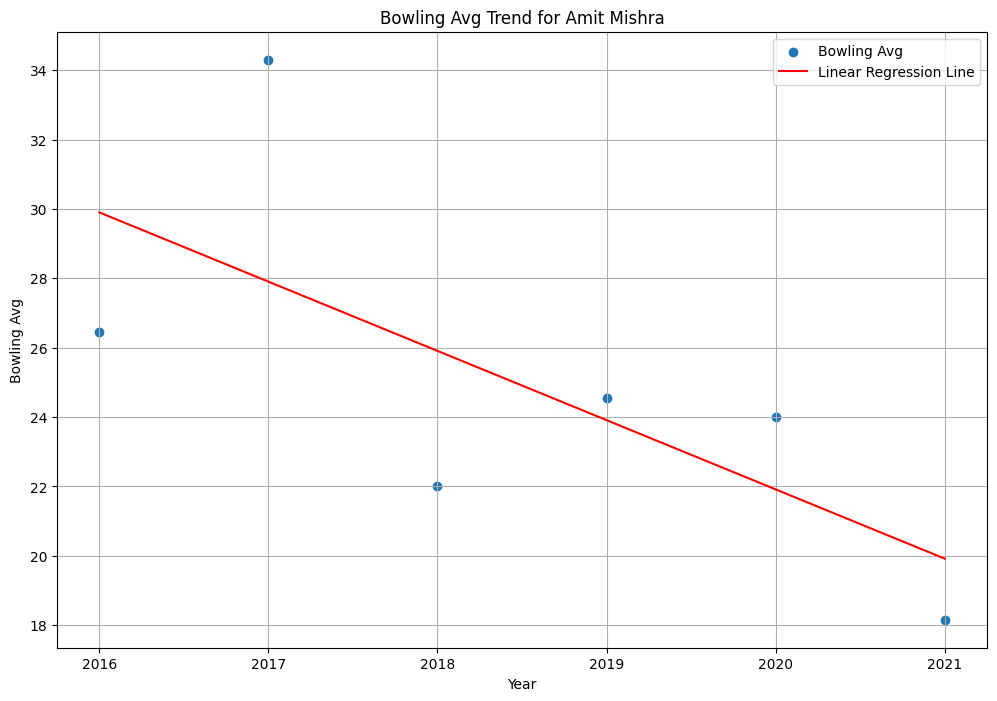

Player: Amit Mishra, Metric: Economy Rate, Slope (Coefficient): -0.1062857142857142, Intercept: 222.0643809523808


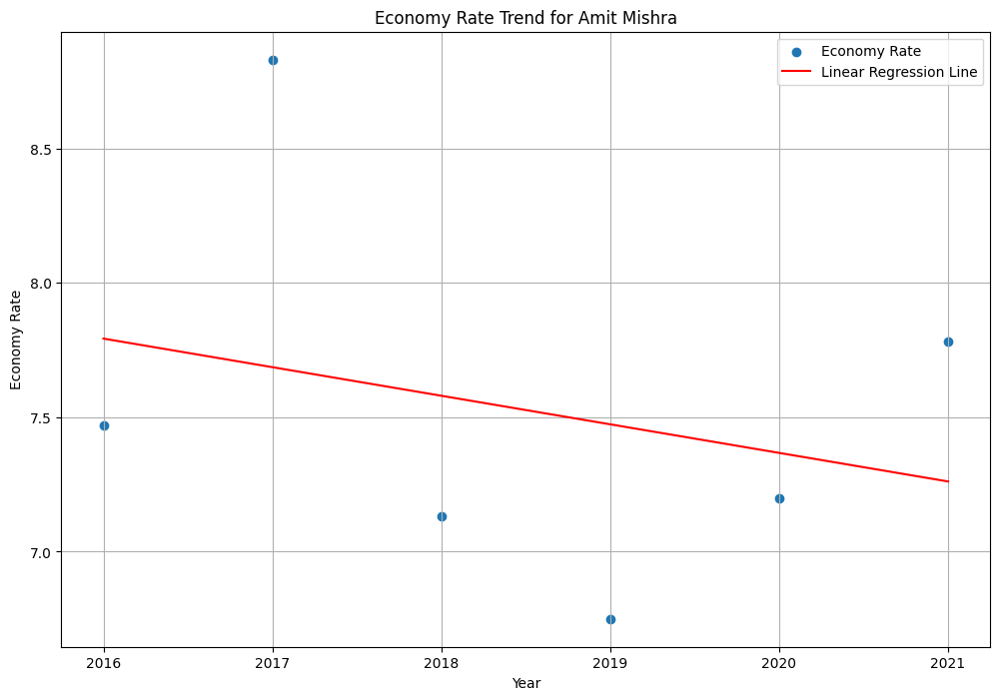

Player: Axar Patel, Metric: Bowling Avg, Slope (Coefficient): 0.9710714285714285, Intercept: -1921.5560714285712


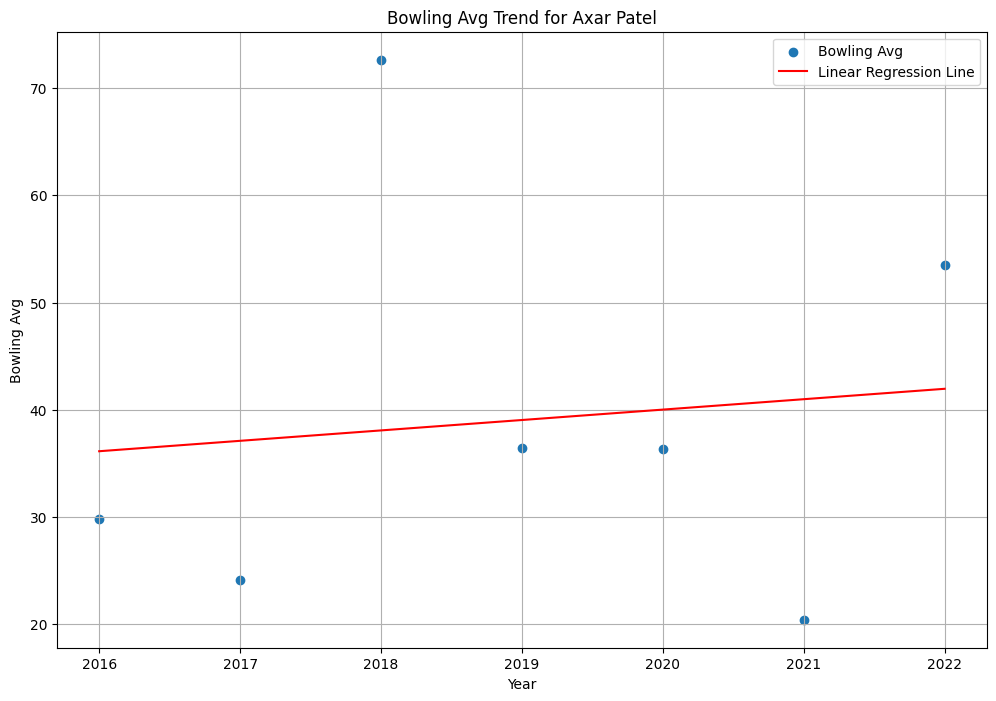

Player: Axar Patel, Metric: Economy Rate, Slope (Coefficient): -0.20357142857142851, Intercept: 418.3935714285713


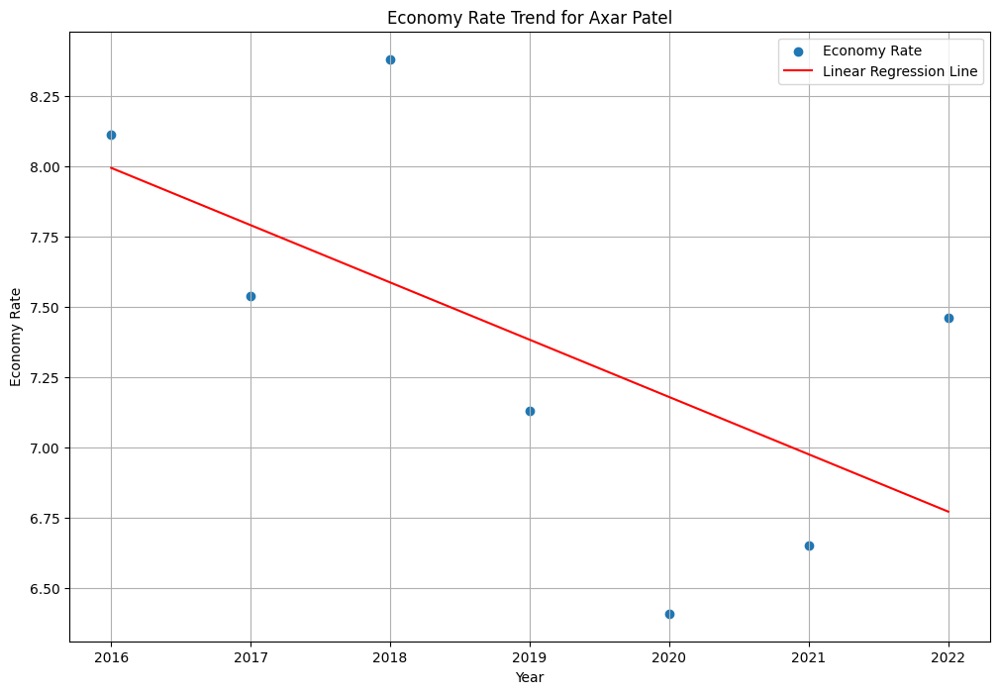

Player: Sunil Narine, Metric: Bowling Avg, Slope (Coefficient): 0.5978571428571424, Intercept: -1171.5564285714277


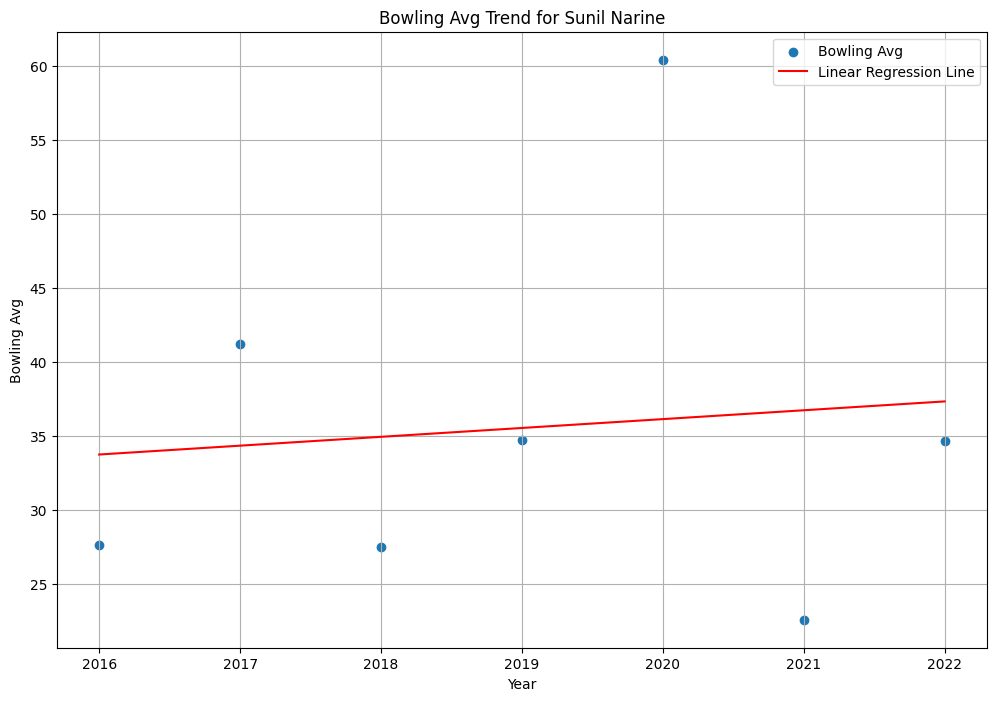

Player: Sunil Narine, Metric: Economy Rate, Slope (Coefficient): -0.19107142857142853, Intercept: 392.8432142857142


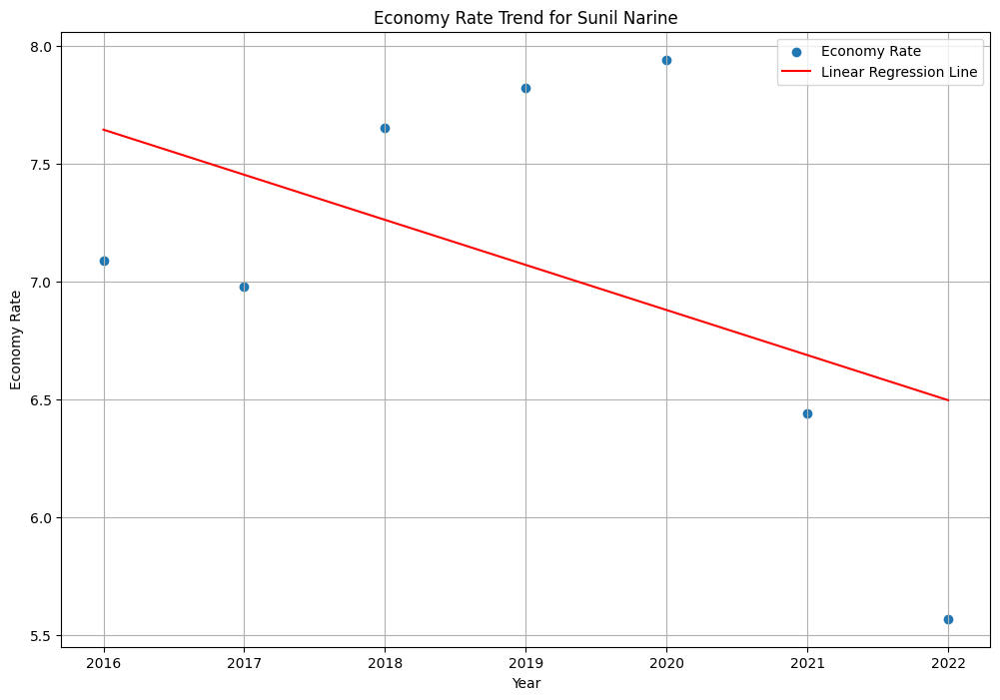

Player: Trent Boult, Metric: Bowling Avg, Slope (Coefficient): -2.010357142857143, Intercept: 4090.4739285714286


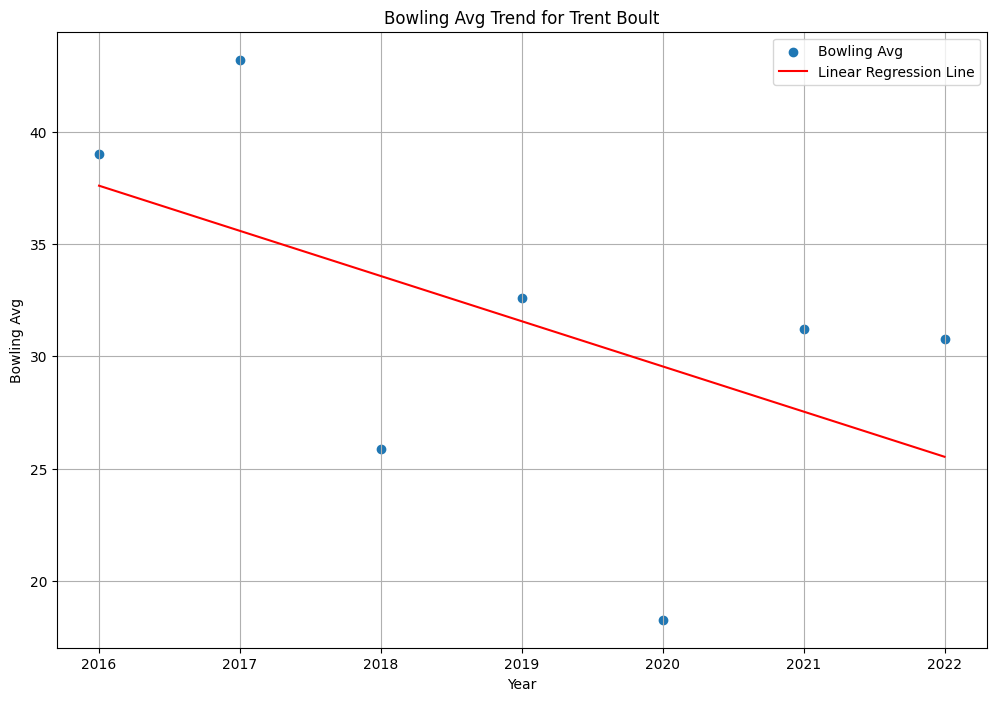

Player: Trent Boult, Metric: Economy Rate, Slope (Coefficient): -0.3089285714285715, Intercept: 632.3010714285715


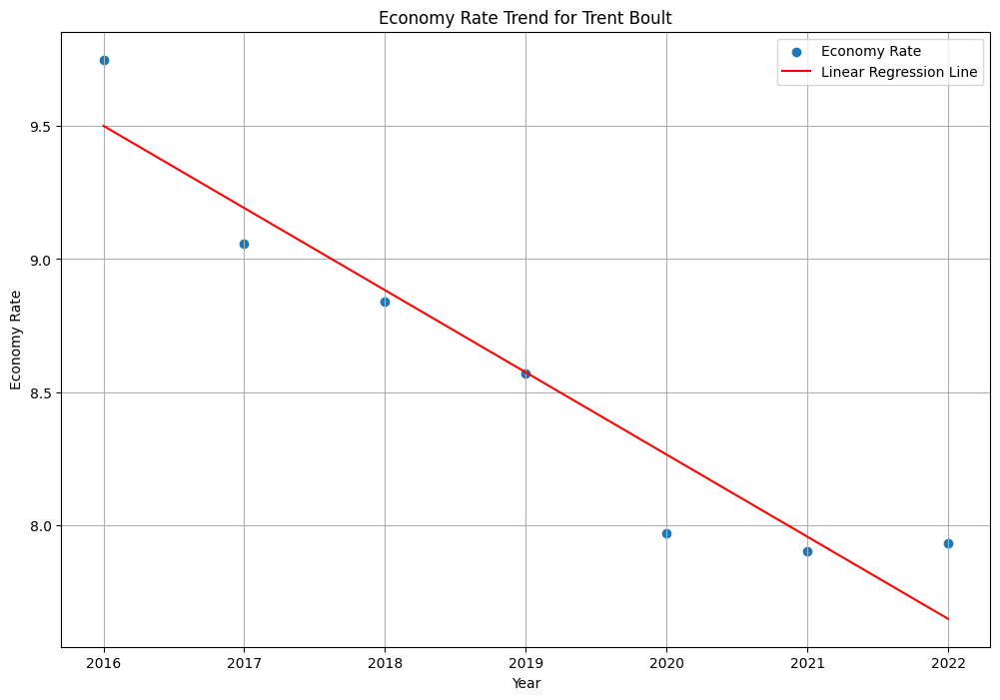

Player: Krunal Pandya, Metric: Bowling Avg, Slope (Coefficient): 1.8778571428571431, Intercept: -3754.103571428572


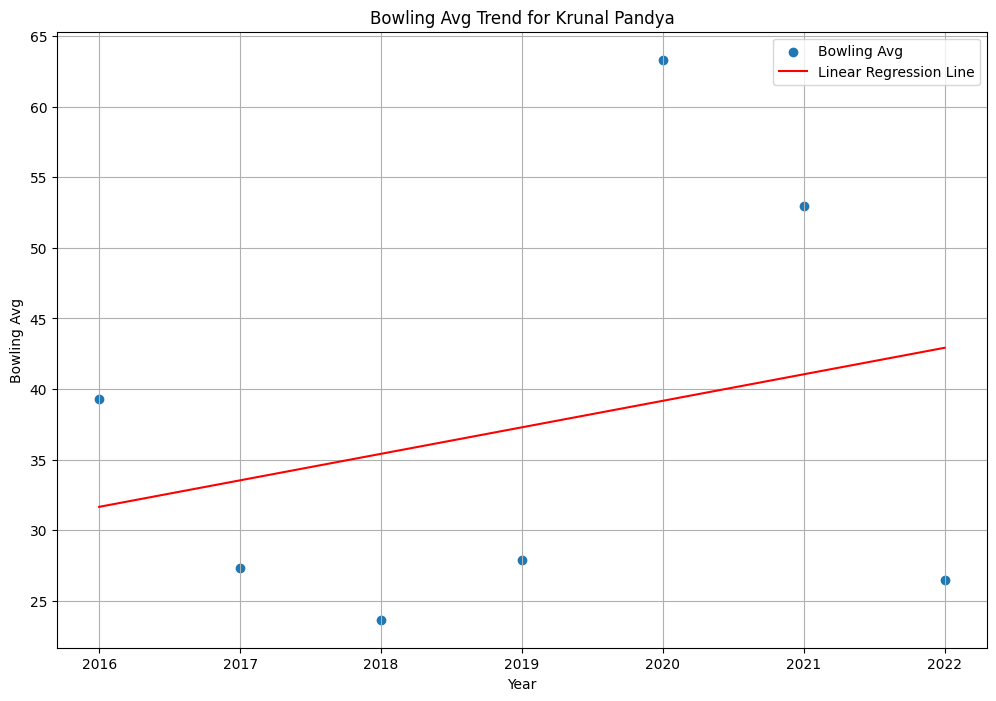

Player: Krunal Pandya, Metric: Economy Rate, Slope (Coefficient): 0.03642857142857138, Intercept: -66.22642857142847


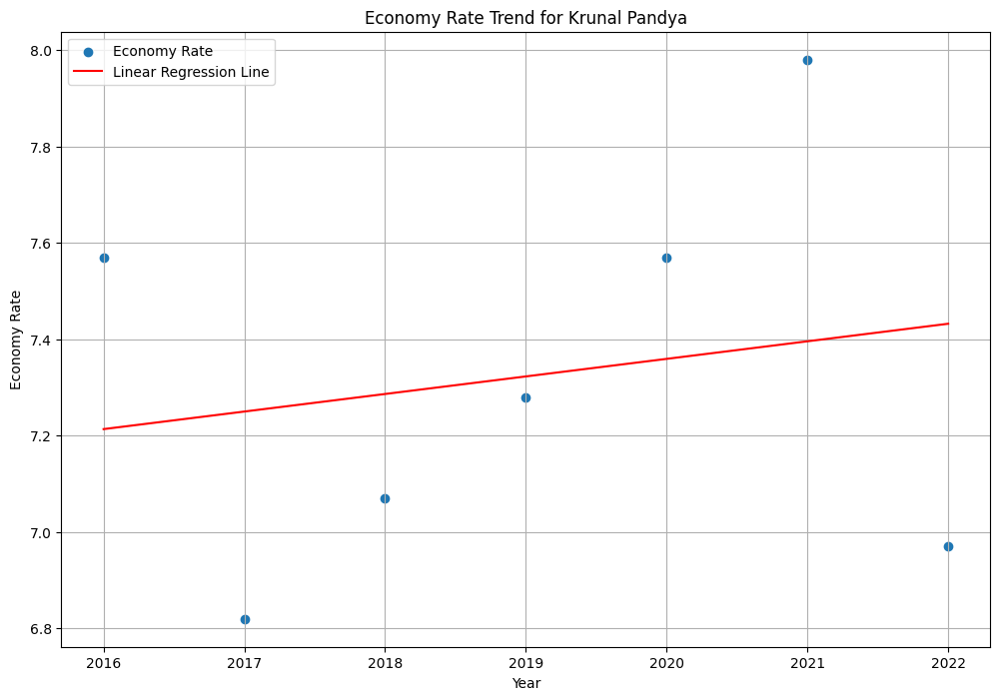

Player: Chris Morris, Metric: Bowling Avg, Slope (Coefficient): -0.5717142857142858, Intercept: 1180.510285714286


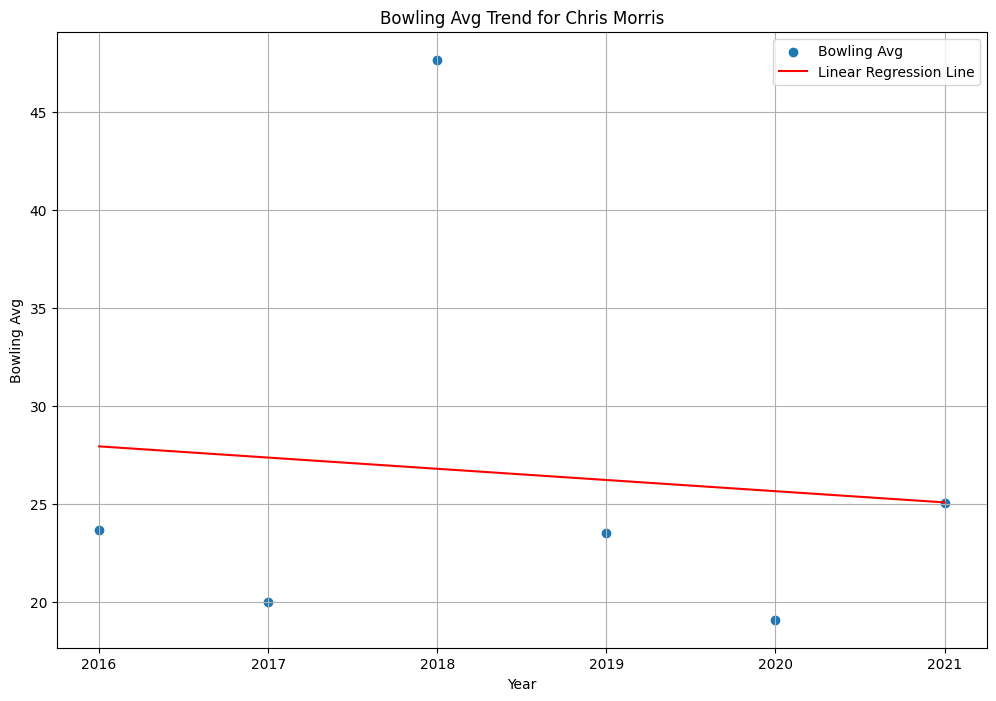

Player: Chris Morris, Metric: Economy Rate, Slope (Coefficient): 0.18799999999999992, Intercept: -371.1413333333332


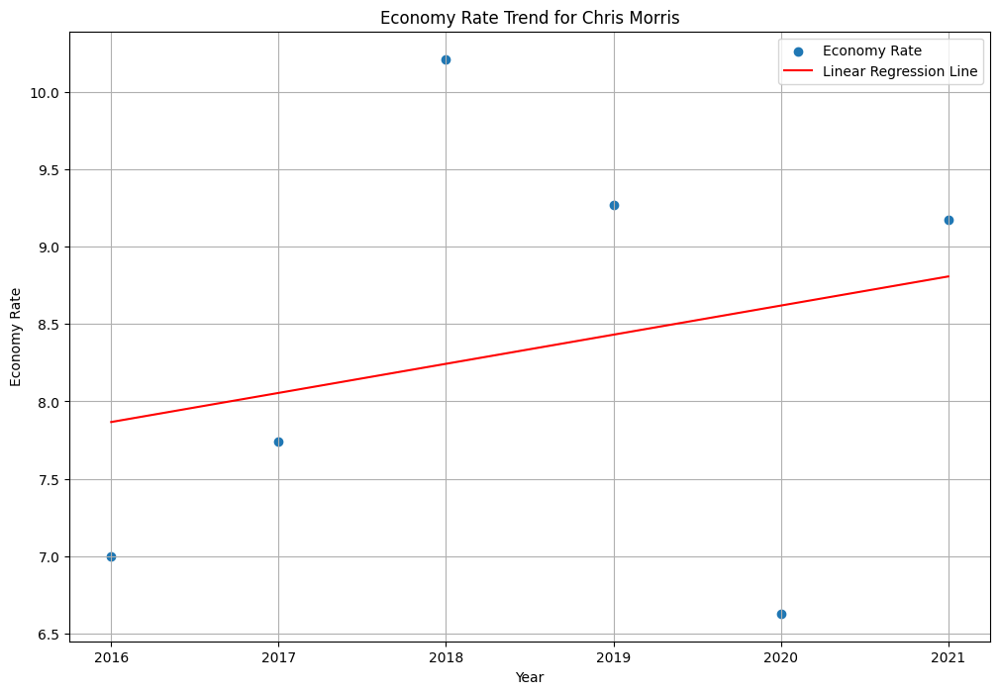

Player: Imran Tahir, Metric: Bowling Avg, Slope (Coefficient): 1.5354285714285716, Intercept: -3069.262571428572


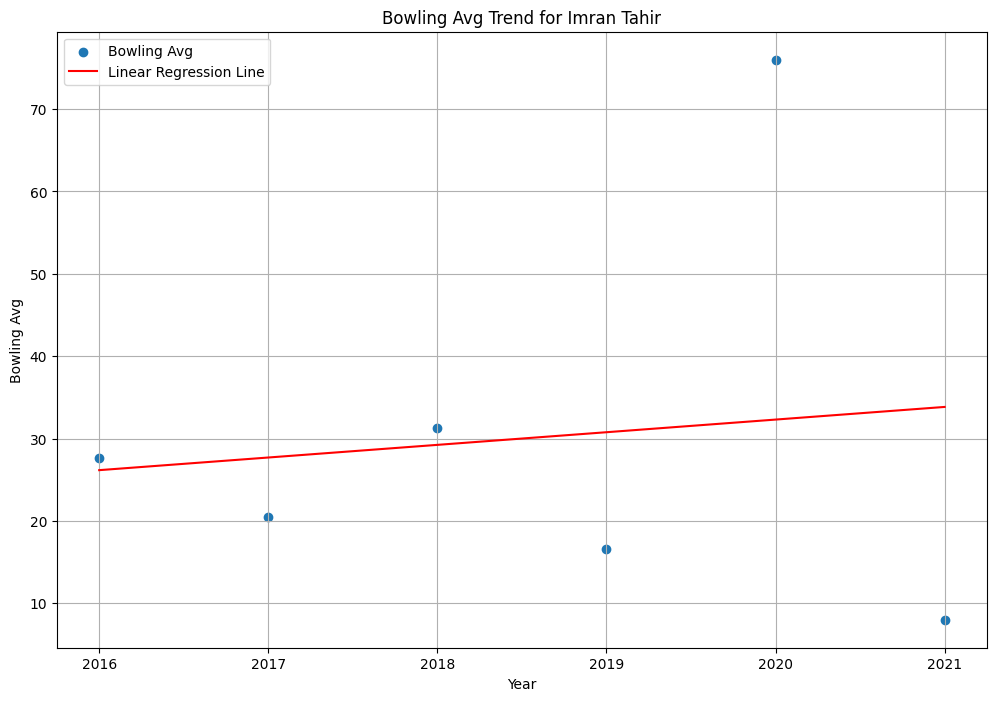

Player: Imran Tahir, Metric: Economy Rate, Slope (Coefficient): -0.8099999999999998, Intercept: 1642.1766666666663


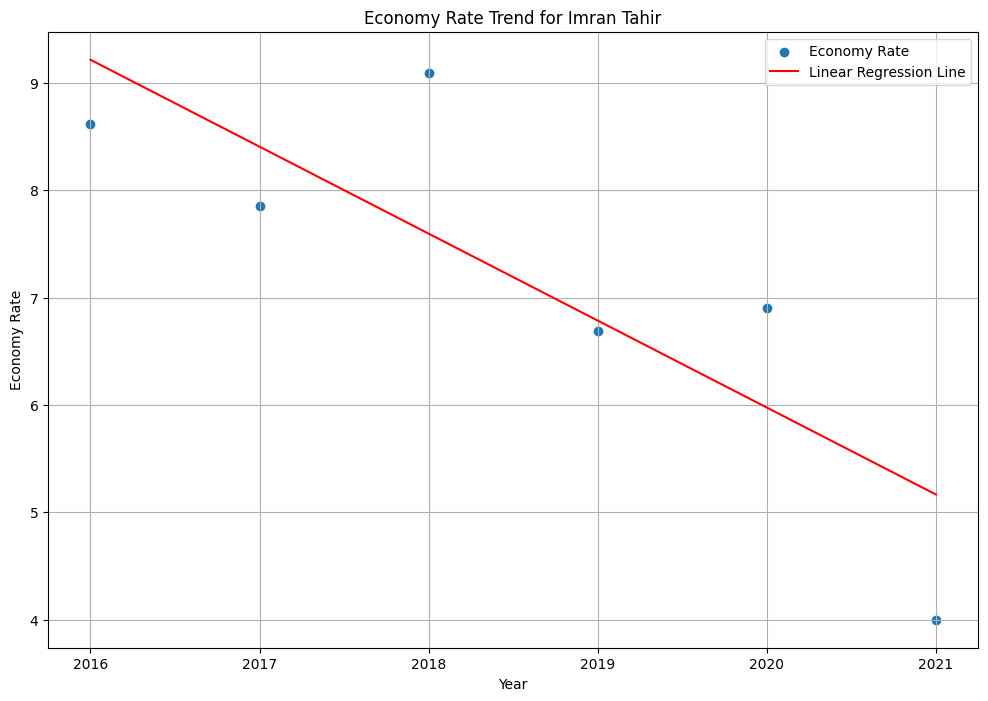

Player: Yuzvendra Chahal, Metric: Bowling Avg, Slope (Coefficient): -0.5617857142857142, Intercept: 1156.2624999999998


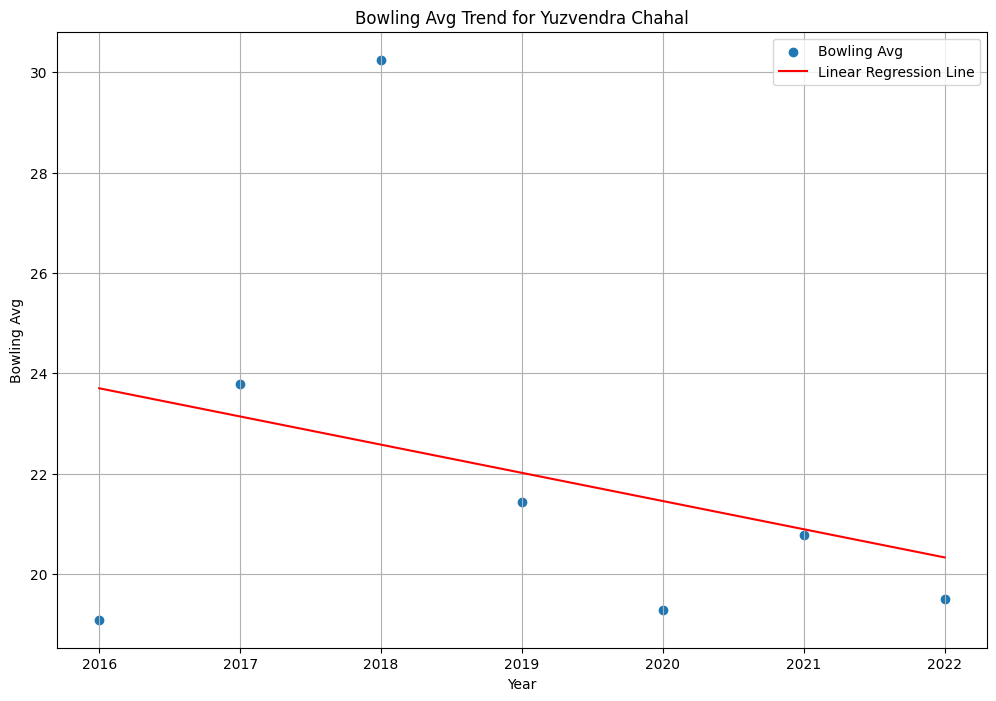

Player: Yuzvendra Chahal, Metric: Economy Rate, Slope (Coefficient): -0.0921428571428572, Intercept: 193.57357142857157


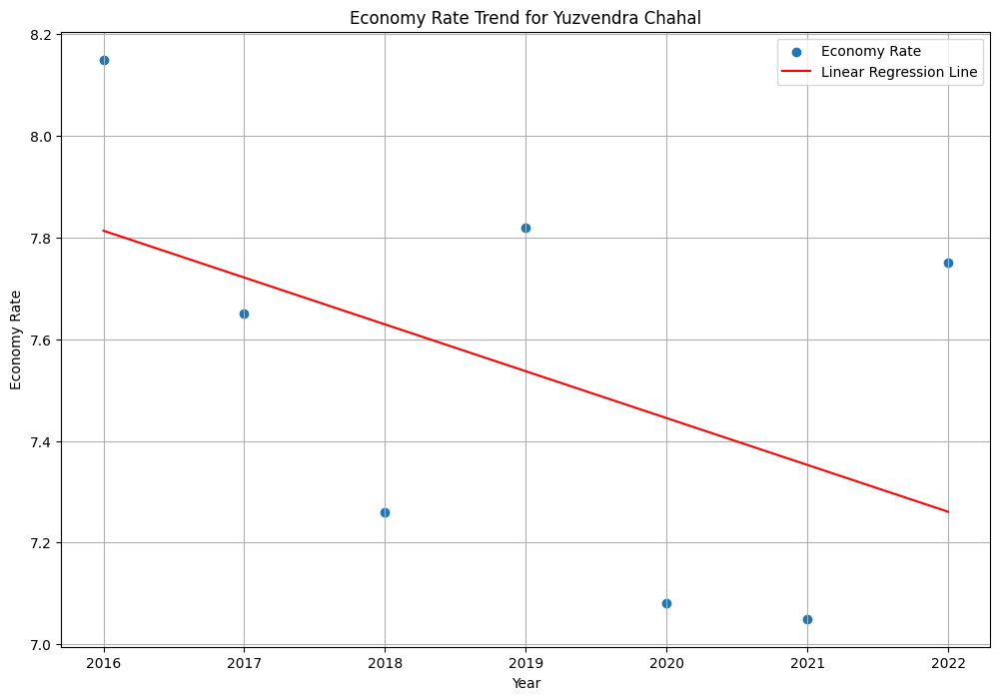

Player: Bhuvneshwar Kumar, Metric: Bowling Avg, Slope (Coefficient): 3.8849999999999993, Intercept: -7810.812142857141


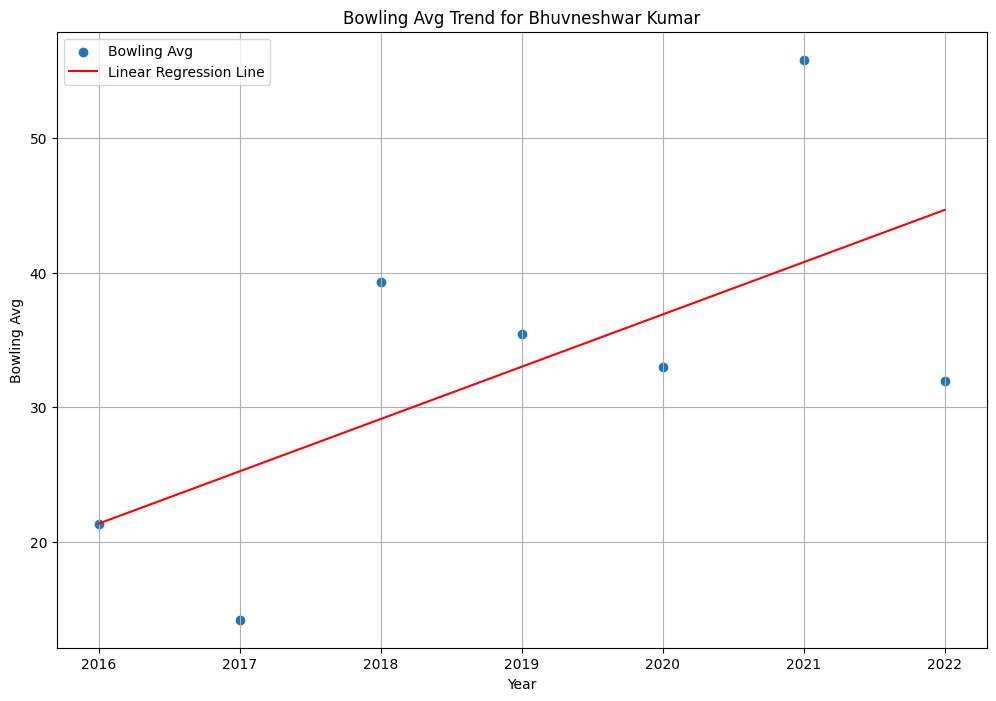

Player: Bhuvneshwar Kumar, Metric: Economy Rate, Slope (Coefficient): 0.032857142857142856, Intercept: -58.87714285714286


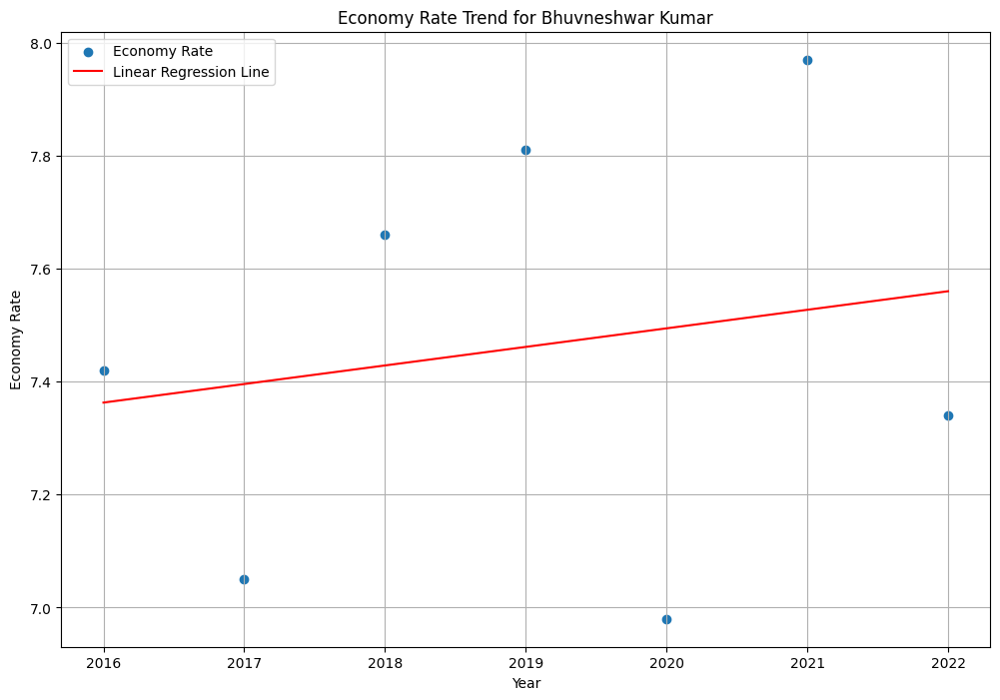

Player: Jasprit Bumrah, Metric: Bowling Avg, Slope (Coefficient): -0.5846428571428568, Intercept: 1202.1682142857137


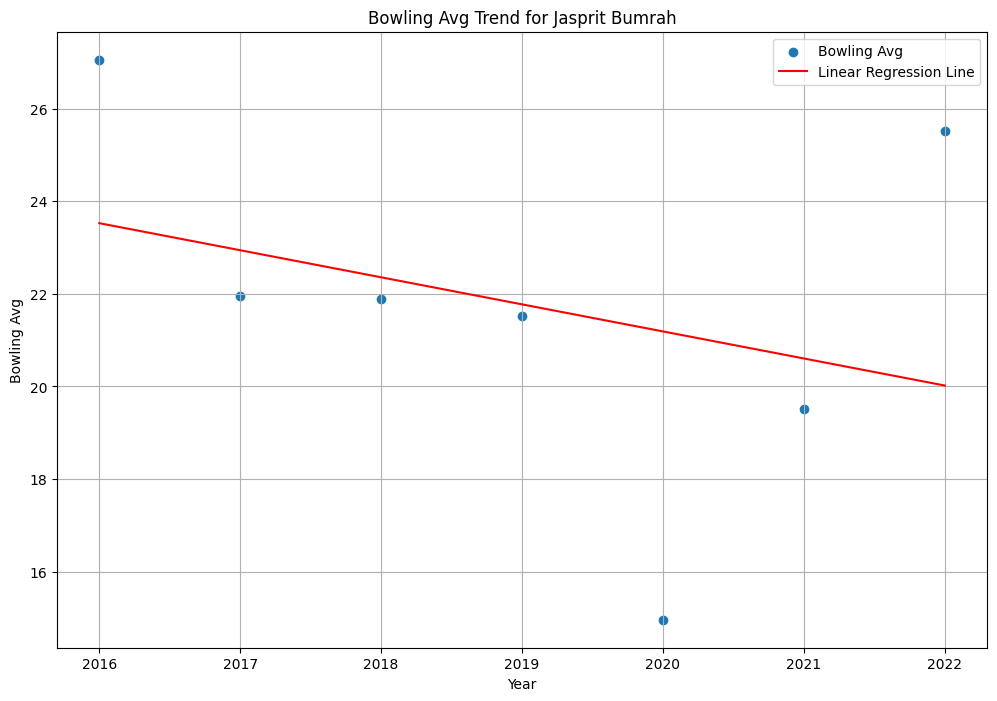

Player: Jasprit Bumrah, Metric: Economy Rate, Slope (Coefficient): -0.06749999999999996, Intercept: 143.43392857142848


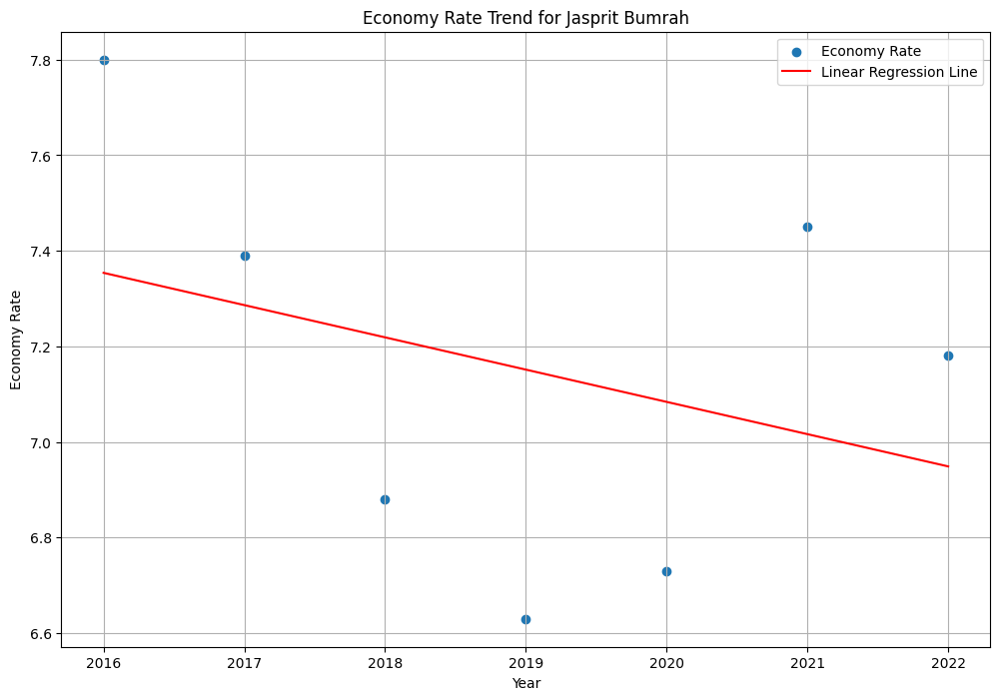

Player: Dwayne Bravo, Metric: Bowling Avg, Slope (Coefficient): -2.4205714285714284, Intercept: 4915.370571428572


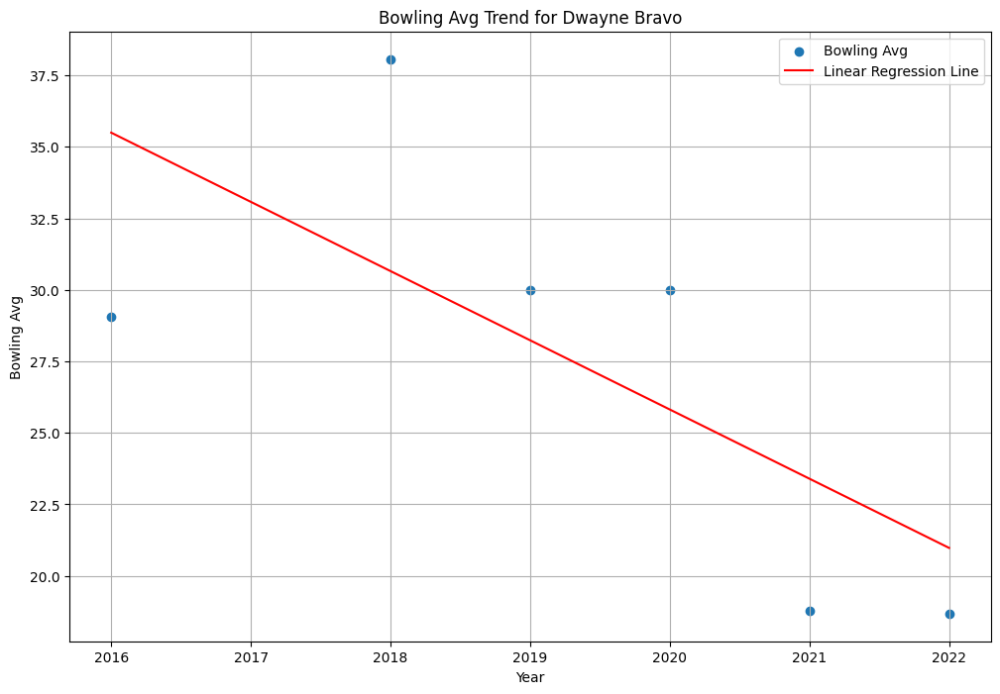

Player: Dwayne Bravo, Metric: Economy Rate, Slope (Coefficient): -0.14657142857142877, Intercept: 304.6215714285718


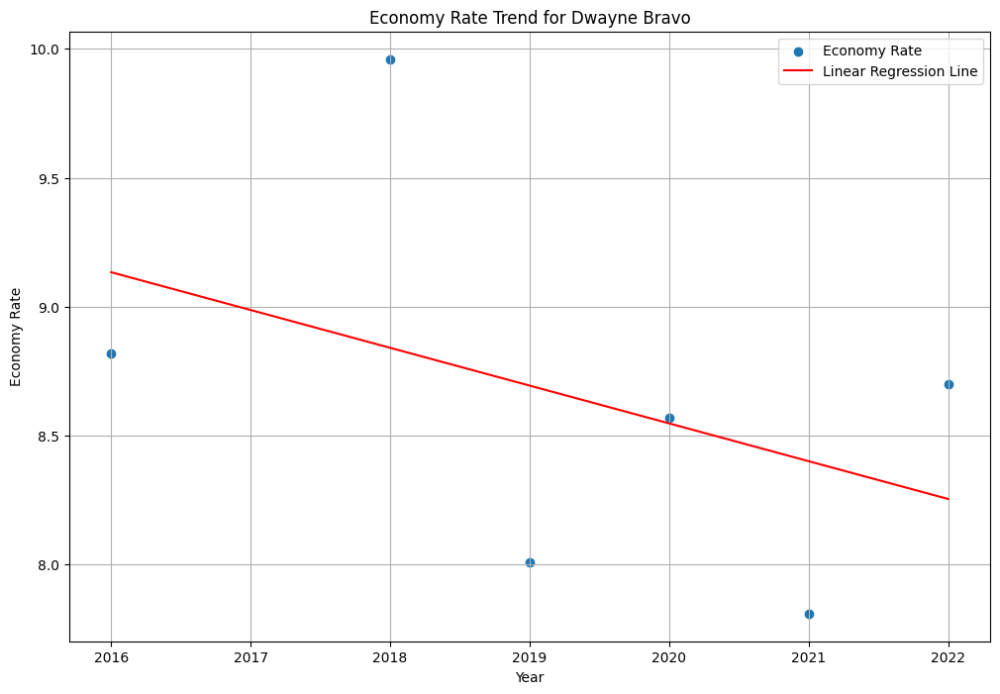

Player: Rashid Khan, Metric: Bowling Avg, Slope (Coefficient): -0.06800000000000057, Intercept: 158.19266666666783


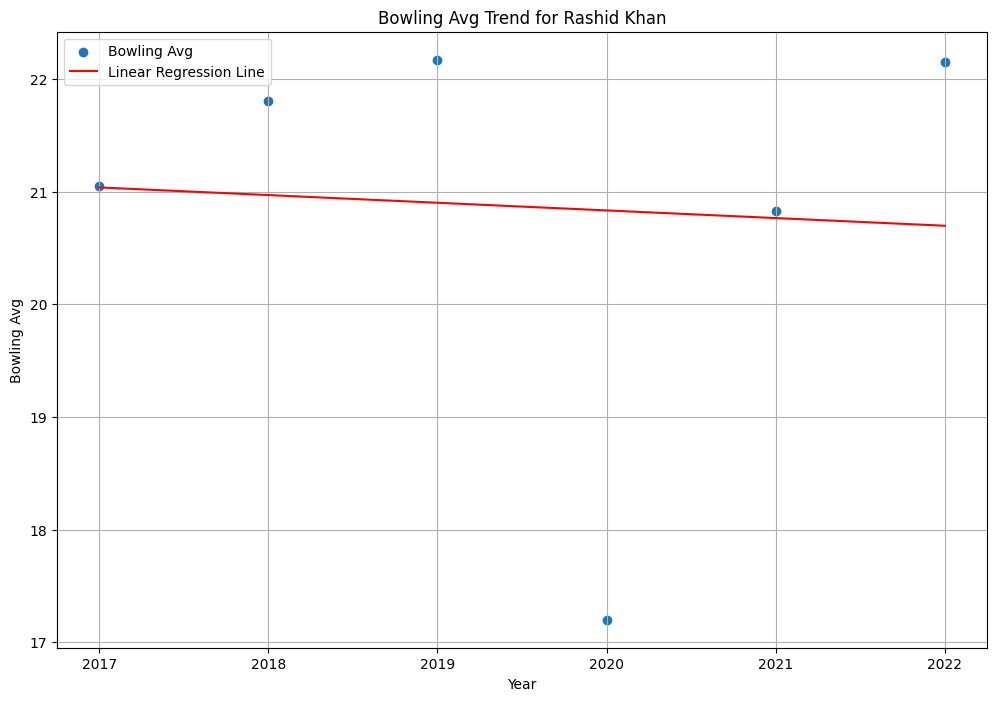

Player: Rashid Khan, Metric: Economy Rate, Slope (Coefficient): -0.03371428571428576, Intercept: 74.46600000000008


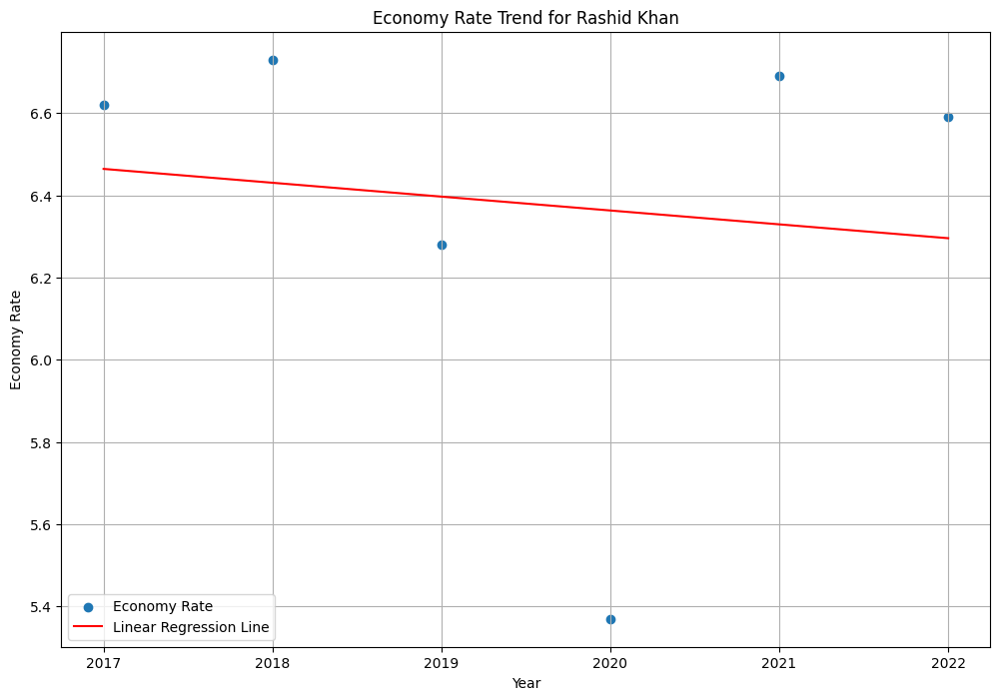

Player: Ravichandran Ashwin, Metric: Bowling Avg, Slope (Coefficient): 1.7451428571428569, Intercept: -3487.5551428571425


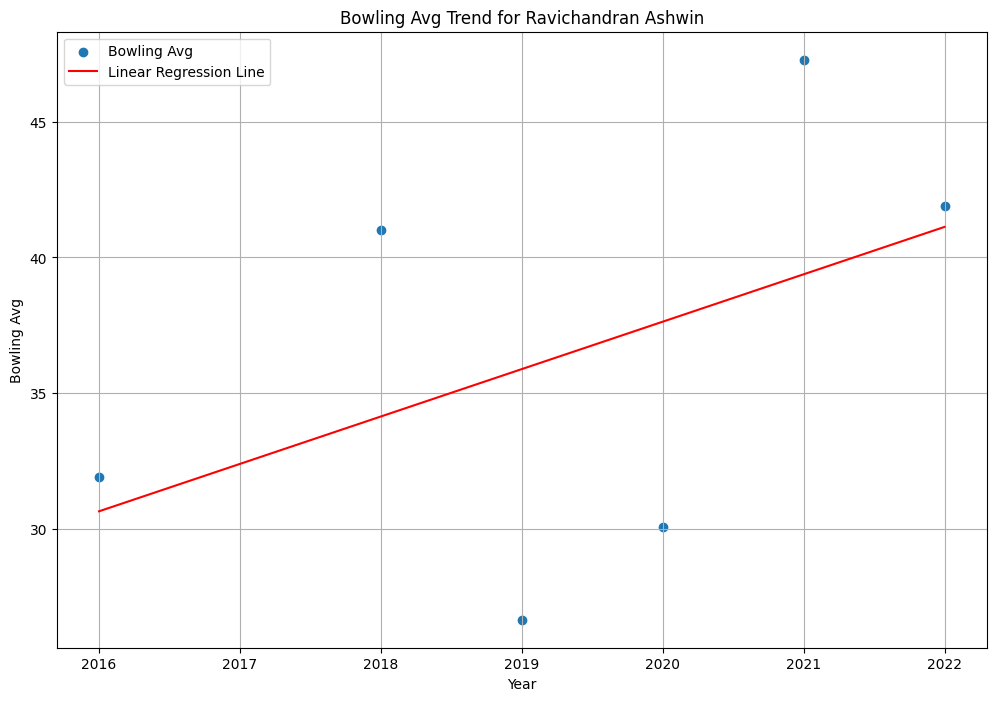

Player: Ravichandran Ashwin, Metric: Economy Rate, Slope (Coefficient): 0.003428571428571453, Intercept: 0.6065714285713799


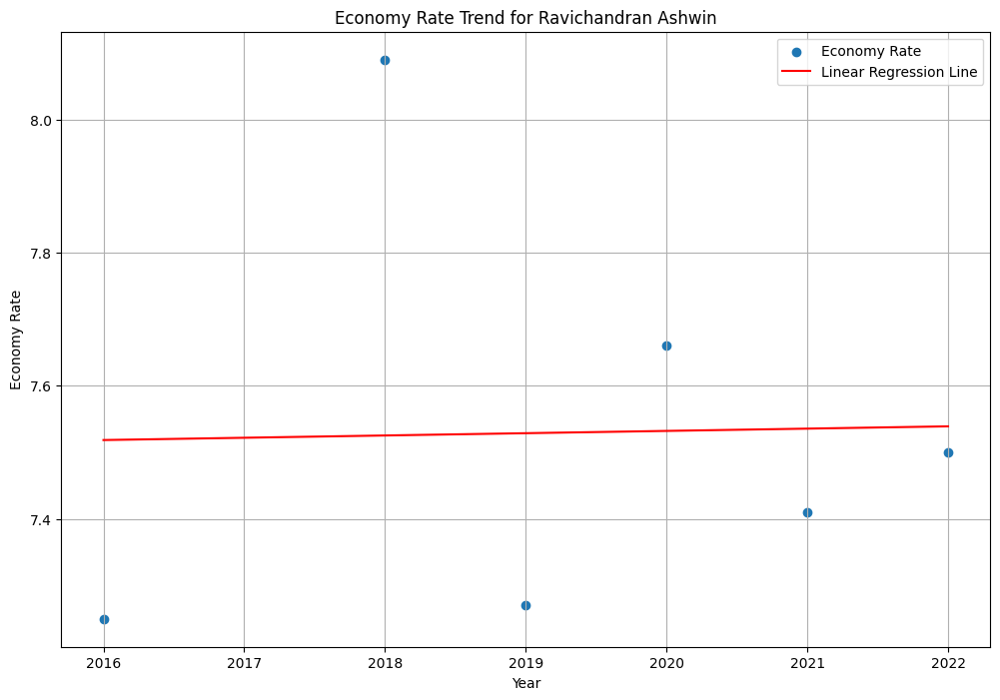

Player: Piyush Chawla, Metric: Bowling Avg, Slope (Coefficient): 2.3551428571428574, Intercept: -4721.557523809524


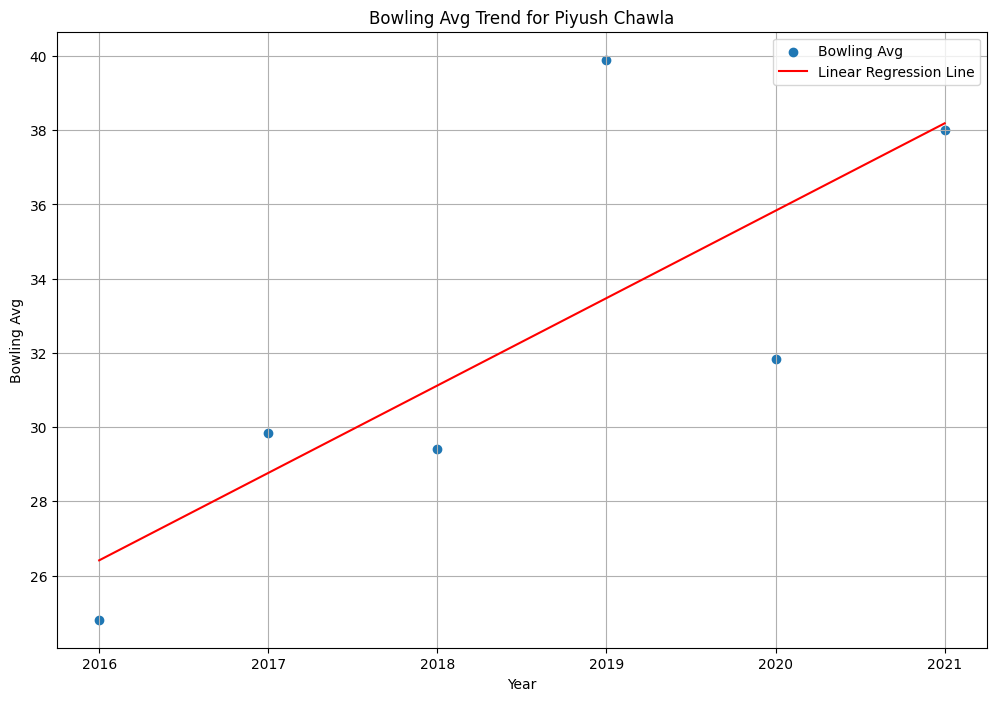

Player: Piyush Chawla, Metric: Economy Rate, Slope (Coefficient): 0.28228571428571436, Intercept: -561.0237142857145


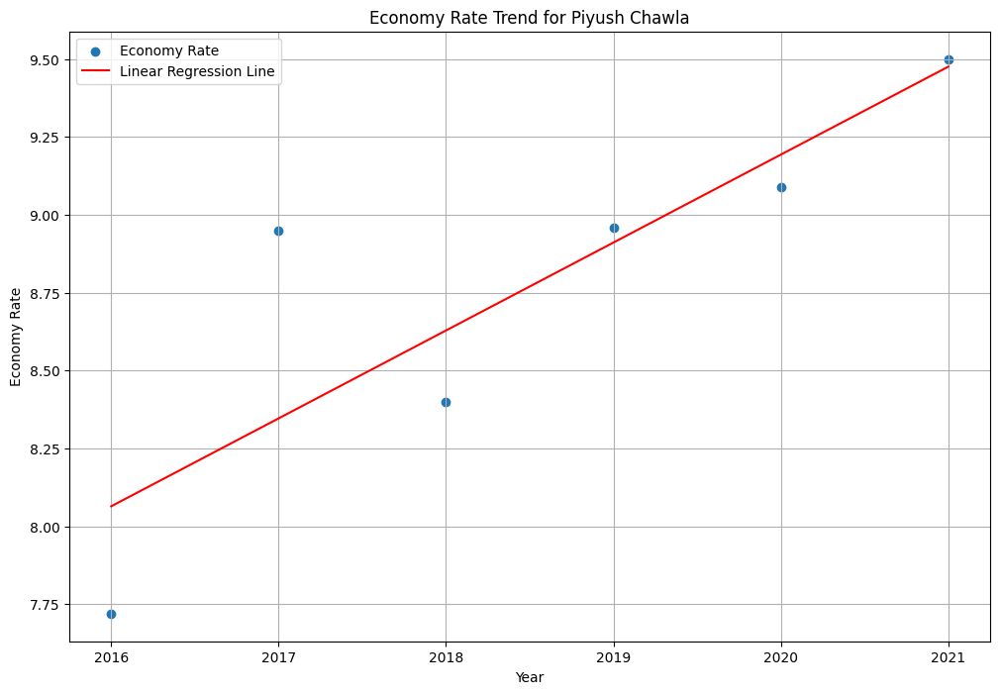

Player: Washington Sundar, Metric: Bowling Avg, Slope (Coefficient): 2.1797142857142853, Intercept: -4367.594666666666


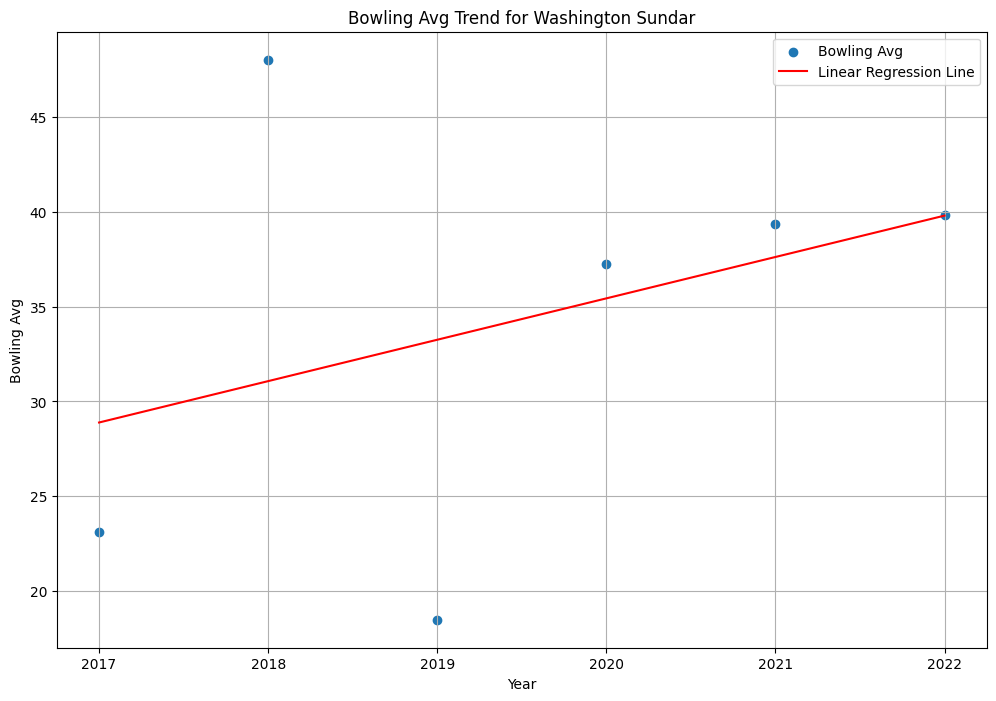

Player: Washington Sundar, Metric: Economy Rate, Slope (Coefficient): 0.08285714285714277, Intercept: -159.68999999999983


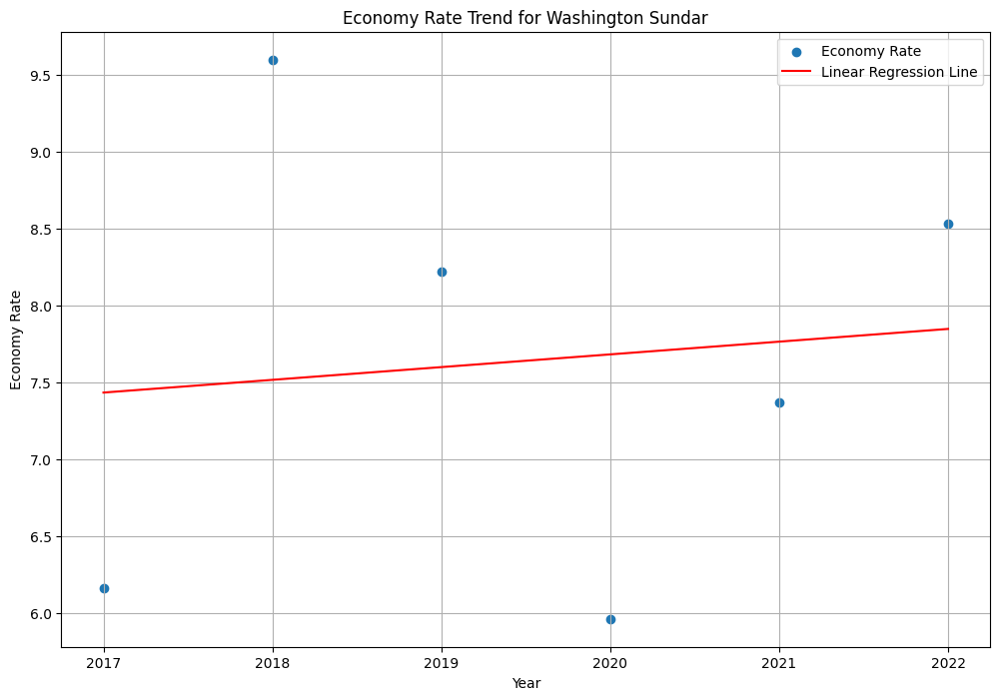

In [73]:
# Create a dictionary to store player-wise data
bowler_data_dict = {}

# Extract the data for the selected metric and year
for player_name in bowler_names_list:
    years = [entry['Year'] for entry in all_bowling_data if entry['Player'] == player_name]
    bowling_avg_values = [entry['Avg'] for entry in all_bowling_data if entry['Player'] == player_name]
    econ_rates = [entry['Econ'] for entry in all_bowling_data if entry['Player'] == player_name]
    
    bowler_data_dict[player_name] = {'Year': years, 'Bowling Avg': bowling_avg_values, 'Economy Rate': econ_rates}

# Perform linear regression for each player and each metric
positive_trend_bowler = []
for player_name, player_data in bowler_data_dict.items():
    X = np.array(player_data['Year'])
    metrics = ['Bowling Avg', 'Economy Rate']
    
    for metric in metrics:
        Y = np.array(player_data[metric])

        # Calculate the mean of X and Y
        mean_x = np.mean(X)
        mean_y = np.mean(Y)

        # Calculate the slope (coefficient)
        num = np.sum((X - mean_x) * (Y - mean_y))
        den = np.sum((X - mean_x) ** 2)
        slope = num / den

        # Check if the slope is positive
        if slope > -1:
            positive_trend_bowler.append(player_name)

        # Calculate the intercept
        intercept = mean_y - slope * mean_x

        # Print the slope and intercept for each player and metric
        print(f"Player: {player_name}, Metric: {metric}, Slope (Coefficient): {slope}, Intercept: {intercept}")

        # Create the linear regression line
        regression_line = slope * X + intercept

        # Plot the actual data points and the linear regression line for each player and metric
        plt.figure(figsize=(12, 8))
        plt.scatter(X, Y, label=metric)
        plt.plot(X, regression_line, color='red', label='Linear Regression Line')
        plt.xlabel('Year')
        plt.ylabel(metric)
        plt.title(f'{metric} Trend for {player_name}')
        plt.legend()
        plt.grid(True)
        plt.show()

In [74]:
# Find unique Batsman players with a positive trend in at least two metrics
bowler_with_positive_trend = set([player for player in positive_trend_bowler if positive_trend_bowler.count(player) >= 2])
print("Bowler with a Positive Trend in both the Two Metrics:")
print("\n" , len(bowler_with_positive_trend))
for i in bowler_with_positive_trend:
    print(i)

Bowler with a Positive Trend in both the Two Metrics:

 12
Axar Patel
Sunil Narine
Krunal Pandya
Chris Morris
Imran Tahir
Yuzvendra Chahal
Bhuvneshwar Kumar
Jasprit Bumrah
Rashid Khan
Ravichandran Ashwin
Piyush Chawla
Washington Sundar


In [75]:
bowler_with_positive_trend.intersection(overall_top_allrounder)

{'Chris Morris', 'Rashid Khan', 'Sunil Narine'}

In [76]:
# Function to calculate overall score for a batsman based on selected metrics
def calculate_batsman_score(player_data):
    batting_avg_score = np.mean(player_data['Batting Avg Score'])
    strike_rate = np.mean(player_data['Strike Rate'])
    batting_avg = np.mean(player_data['Batting Avg'])
    
    # You can adjust weights based on priority or importance of metrics
    score = (batting_avg_score + strike_rate + batting_avg)/3
    return score

# Calculate overall score for each batsman and create a list of tuples (player_name, overall_score)
batsman_scores = [(player_name, calculate_batsman_score(player_data)) for player_name, player_data in batsman_data_dict.items() if player_name in batsman_with_positive_trend]

# Sort the batsmen based on their overall scores in descending order
sorted_batsmen = sorted(batsman_scores, key=lambda x: x[1], reverse=True)

# Display the combined batsman sorted list
print("Combined Overall Score of 7 Years Batsman Sorted List:")
for player_name, score in sorted_batsmen:
    print(f"Player: {player_name}, Overall Score: {score:.2f}")

Combined Overall Score of 7 Years Batsman Sorted List:
Player: Andre Russell, Overall Score: 75.61
Player: Jos Buttler, Overall Score: 74.15
Player: Rishabh Pant, Overall Score: 69.84
Player: Shikhar Dhawan, Overall Score: 67.23
Player: Chris Gayle, Overall Score: 66.77
Player: Sanju Samson, Overall Score: 66.42
Player: Dinesh Karthik, Overall Score: 65.85
Player: Kieron Pollard, Overall Score: 64.78
Player: Suryakumar Yadav, Overall Score: 64.40
Player: Nitish Rana, Overall Score: 63.83
Player: Glenn Maxwell, Overall Score: 63.76
Player: Faf du Plessis, Overall Score: 63.47
Player: Rahul Tripathi, Overall Score: 63.02
Player: Hardik Pandya, Overall Score: 62.69
Player: Robin Uthappa, Overall Score: 61.19
Player: Ravindra Jadeja, Overall Score: 60.93
Player: Ambati Rayudu, Overall Score: 60.30
Player: Wriddhiman Saha, Overall Score: 59.91
Player: Ishan Kishan, Overall Score: 59.46
Player: David Miller, Overall Score: 58.34
Player: Deepak Hooda, Overall Score: 57.83
Player: Rahul Tewati

In [77]:
print(sorted_batsmen)

[('Andre Russell', 75.61456654456656), ('Jos Buttler', 74.15366120807296), ('Rishabh Pant', 69.8357783882784), ('Shikhar Dhawan', 67.23321228491396), ('Chris Gayle', 66.76844069510736), ('Sanju Samson', 66.41502200880352), ('Dinesh Karthik', 65.84962846677132), ('Kieron Pollard', 64.78316512852227), ('Suryakumar Yadav', 64.39959080601938), ('Nitish Rana', 63.832006287363434), ('Glenn Maxwell', 63.76372775372777), ('Faf du Plessis', 63.47301638176638), ('Rahul Tripathi', 63.02146404521403), ('Hardik Pandya', 62.687685462685465), ('Robin Uthappa', 61.18662420912421), ('Ravindra Jadeja', 60.934223184223185), ('Ambati Rayudu', 60.30291685438744), ('Wriddhiman Saha', 59.91316498316498), ('Ishan Kishan', 59.46092621664051), ('David Miller', 58.34132122507122), ('Deepak Hooda', 57.83083797155226), ('Rahul Tewatia', 57.30978114478116), ('Marcus Stoinis', 56.9756996131786), ('Mayank Agarwal', 56.62395271395271)]


Player: Andre Russell, Metric: Overall_score, Slope (Coefficient): -0.6906023024594452, Intercept: 1470.1708159776729


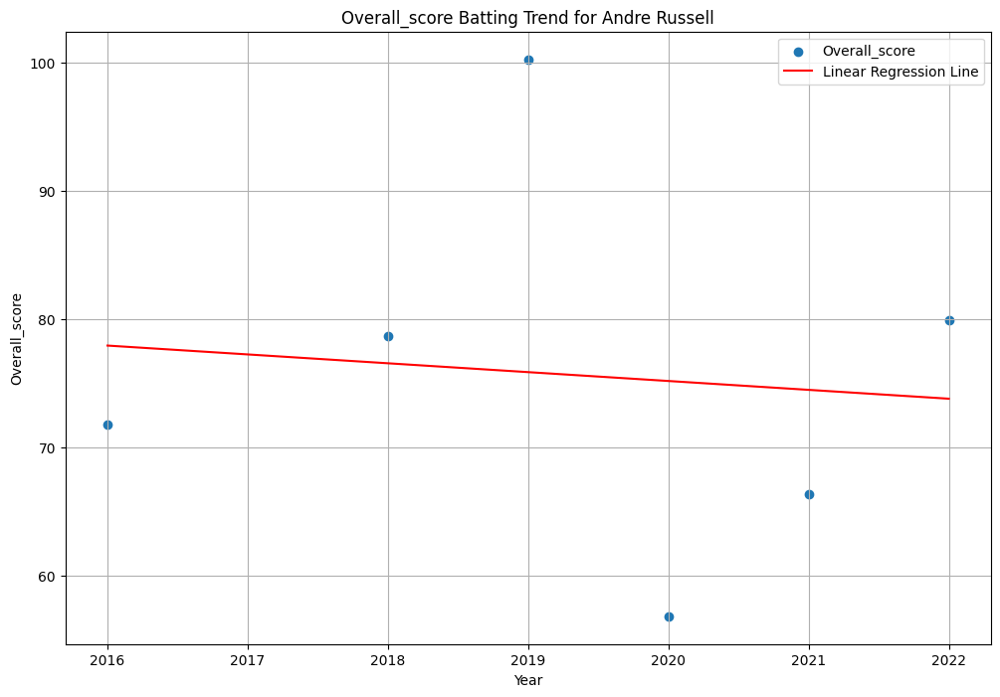

Player: Jos Buttler, Metric: Overall_score, Slope (Coefficient): 2.613716383989494, Intercept: -5202.939718066716


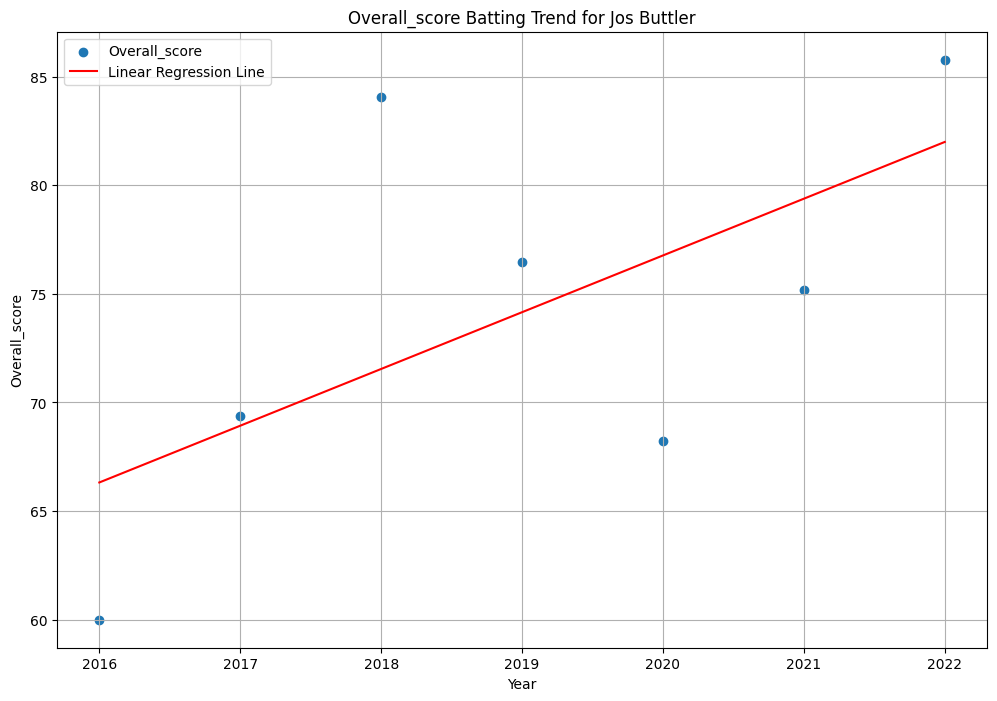

Player: Rishabh Pant, Metric: Overall_score, Slope (Coefficient): -0.7129323652537926, Intercept: 1509.2462238356857


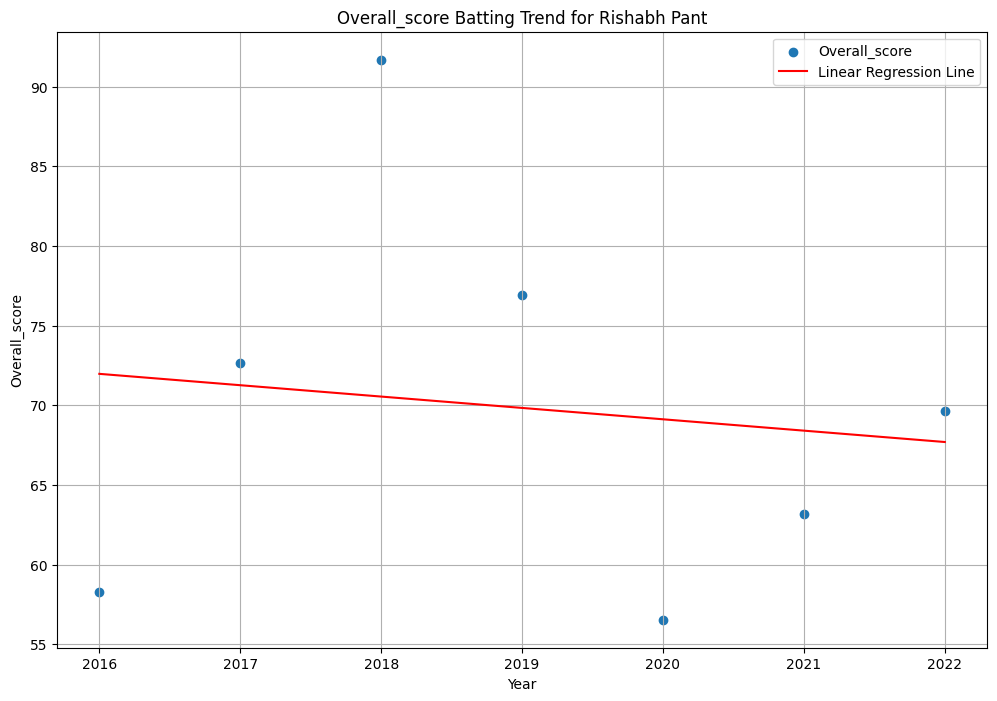

Player: Shikhar Dhawan, Metric: Overall_score, Slope (Coefficient): 0.5976968287314922, Intercept: -1139.516684923969


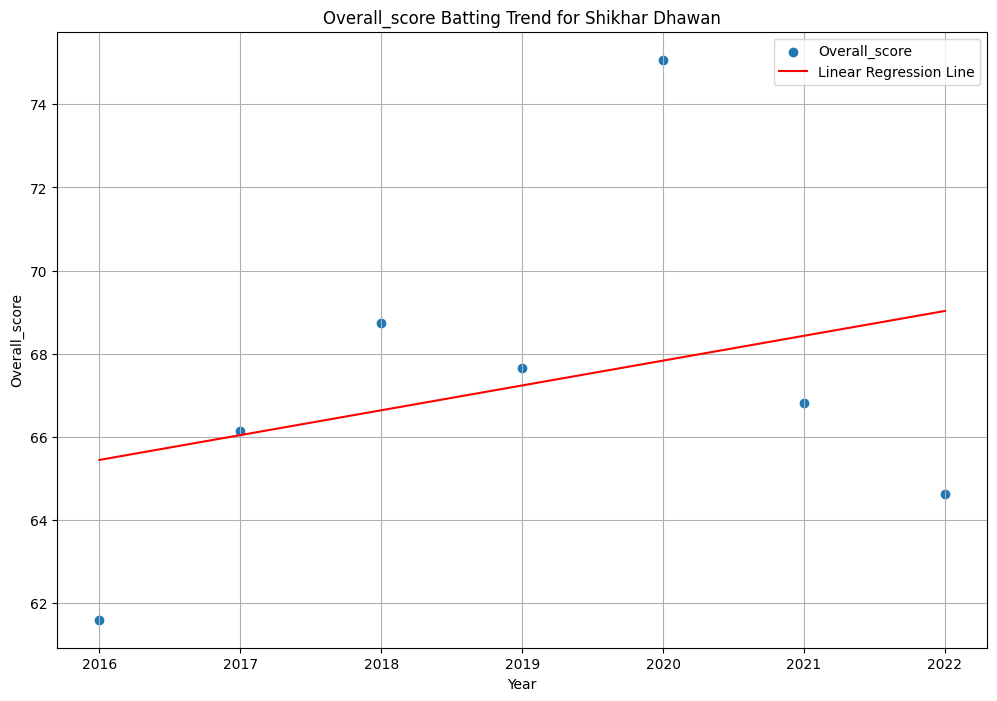

Player: Chris Gayle, Metric: Overall_score, Slope (Coefficient): 0.1455206380920653, Intercept: -226.9649672937265


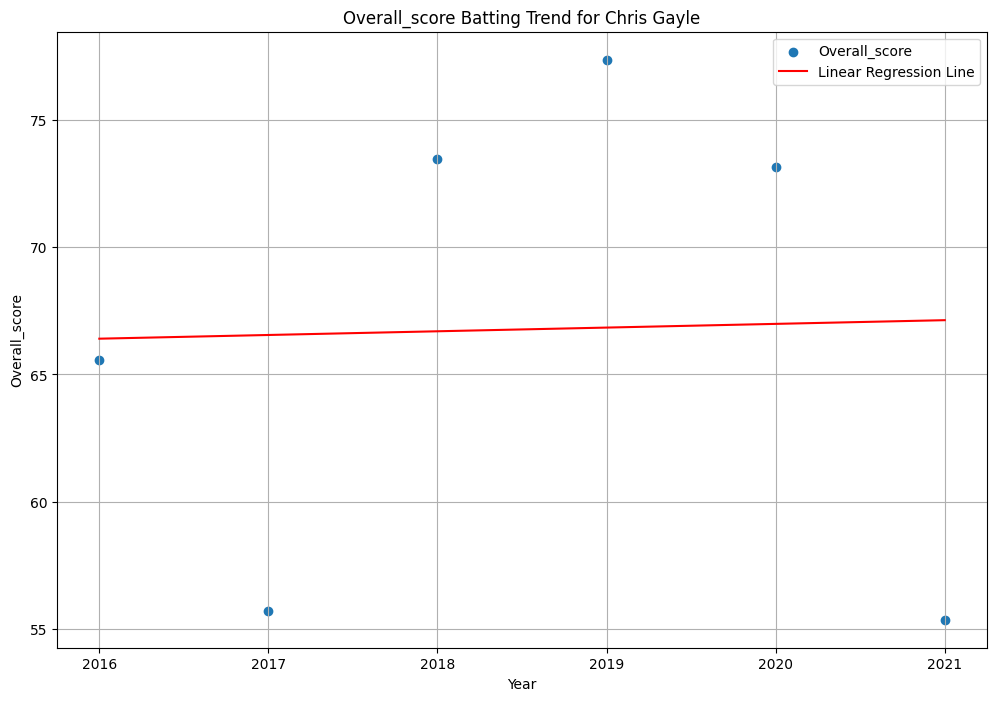

Player: Sanju Samson, Metric: Overall_score, Slope (Coefficient): 2.0751440576230498, Intercept: -4123.300830332134


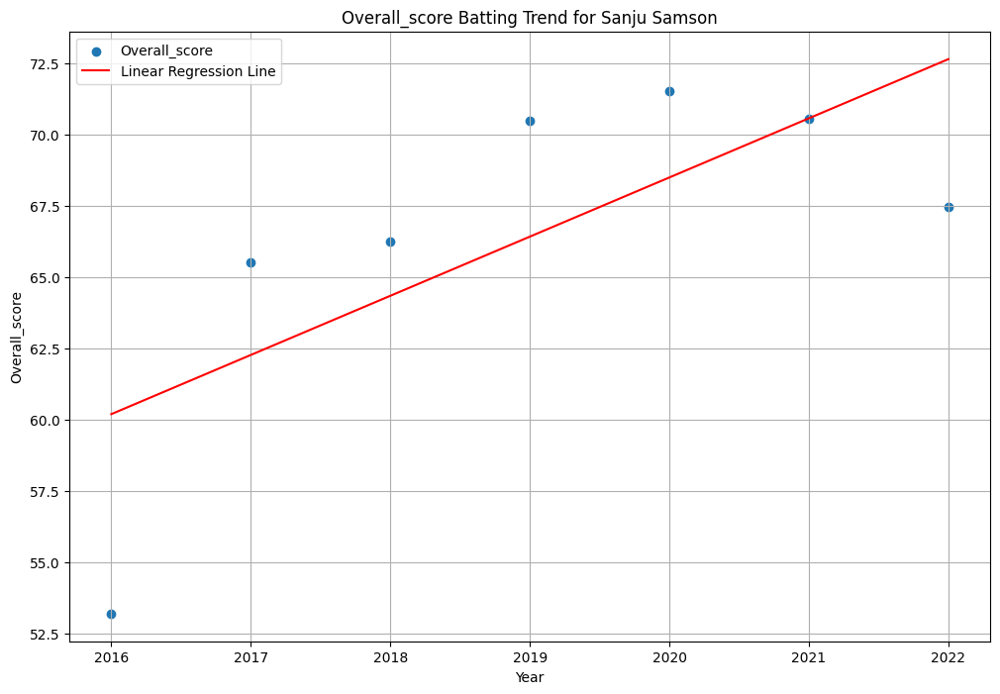

Player: Dinesh Karthik, Metric: Overall_score, Slope (Coefficient): 1.2920988138845289, Intercept: -2542.8978767660924


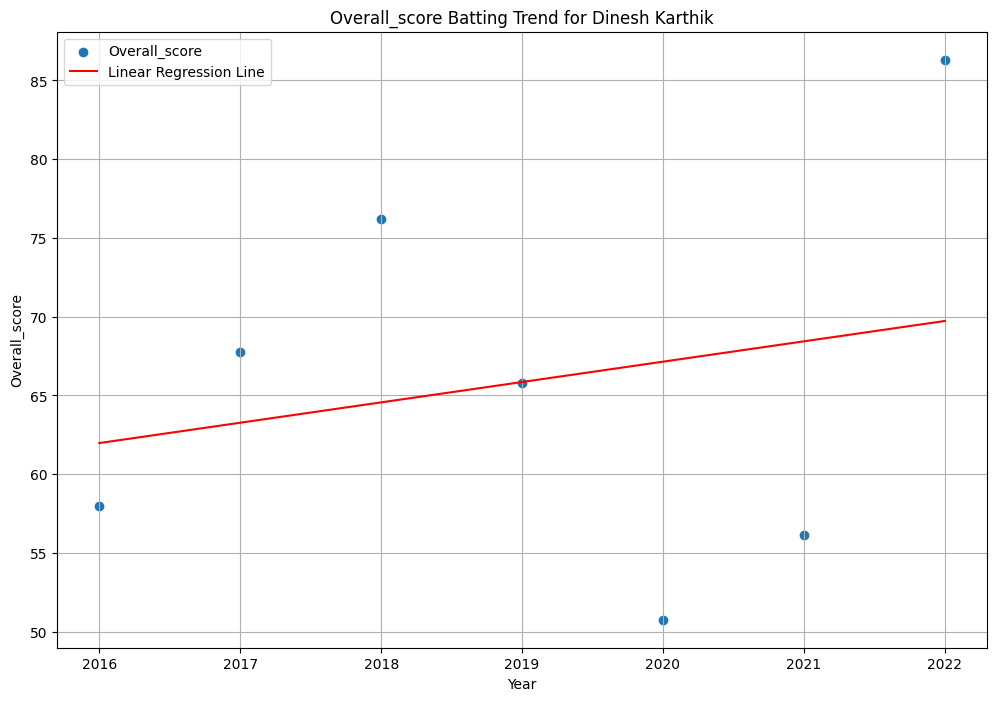

Player: Kieron Pollard, Metric: Overall_score, Slope (Coefficient): -0.5650194250194271, Intercept: 1205.5573842427457


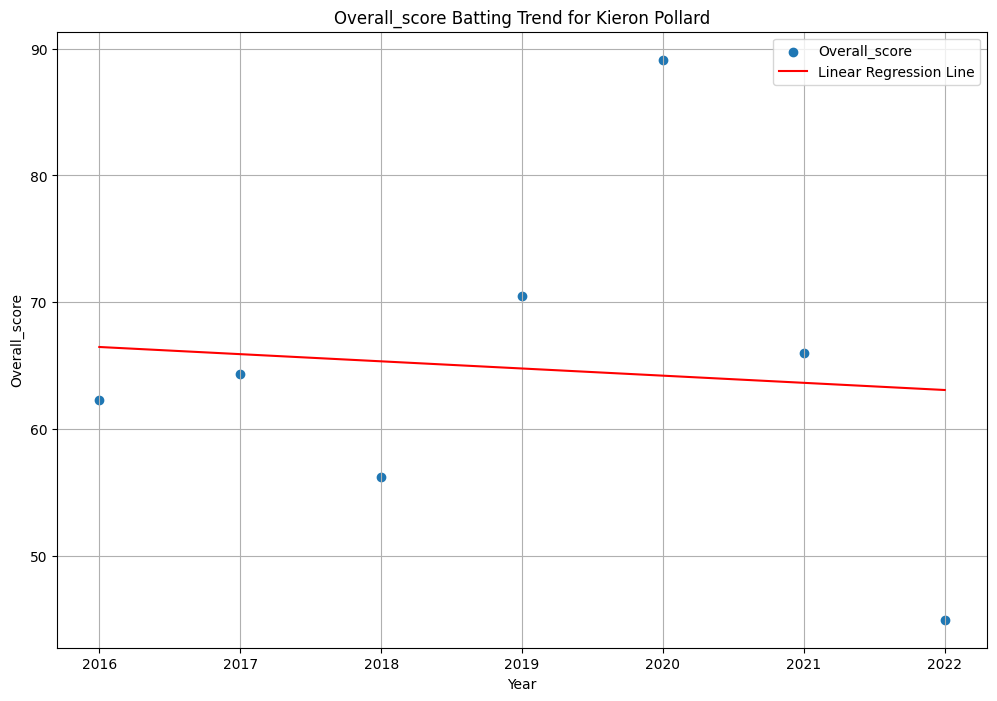

Player: Suryakumar Yadav, Metric: Overall_score, Slope (Coefficient): 3.0405109771181196, Intercept: -6074.392071995464


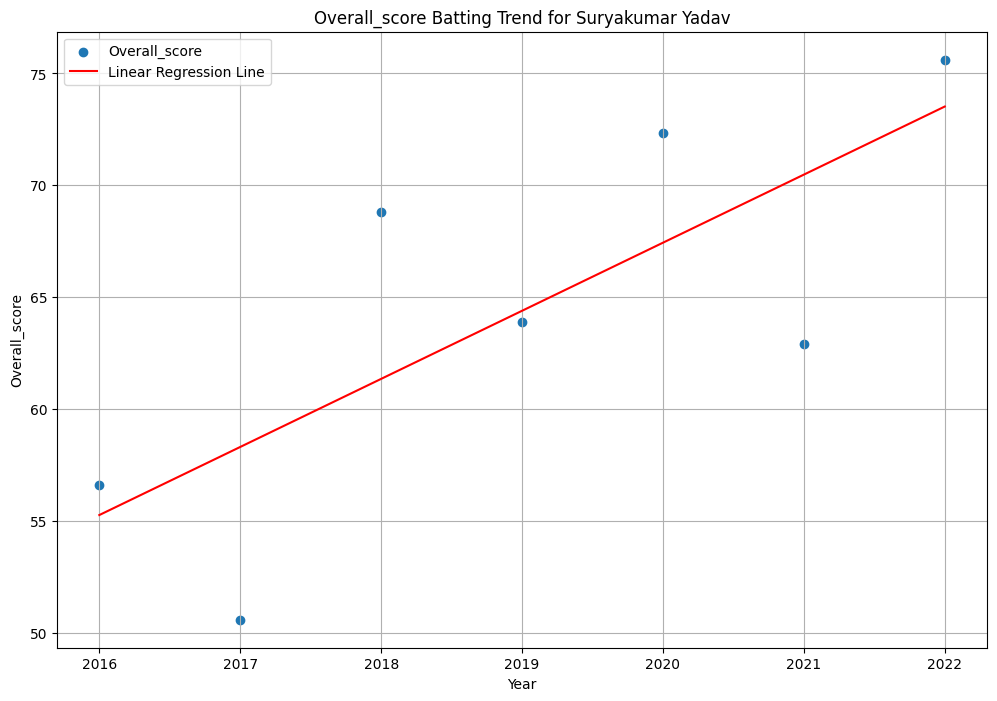

Player: Nitish Rana, Metric: Overall_score, Slope (Coefficient): -0.4191865079365069, Intercept: 910.169565811171


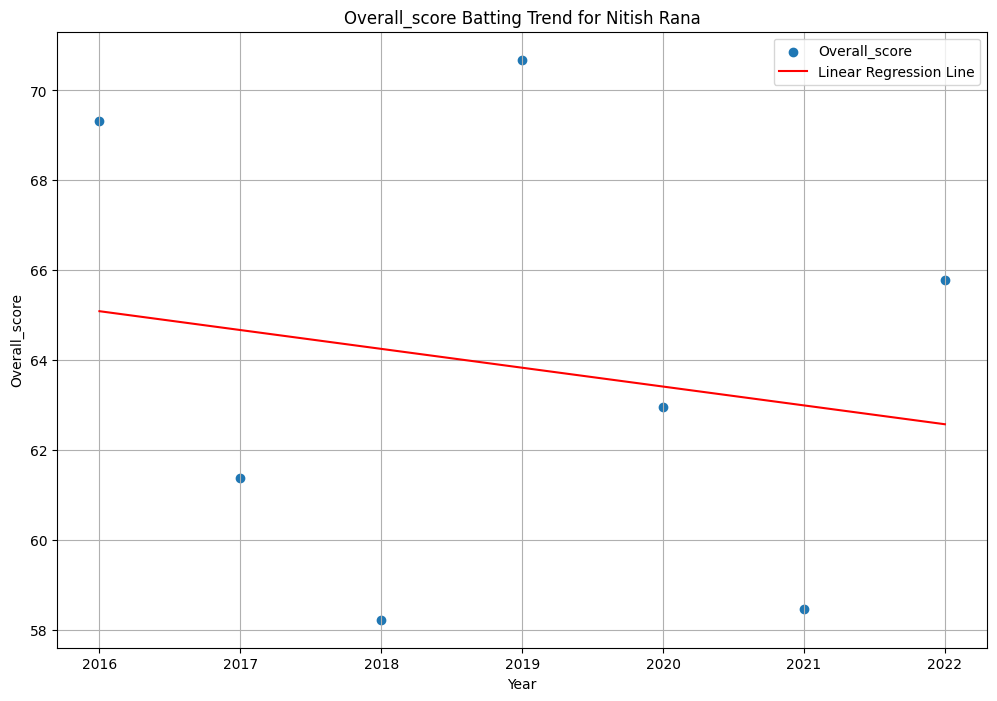

Player: Glenn Maxwell, Metric: Overall_score, Slope (Coefficient): 0.7903763300191863, Intercept: -1532.0060825550092


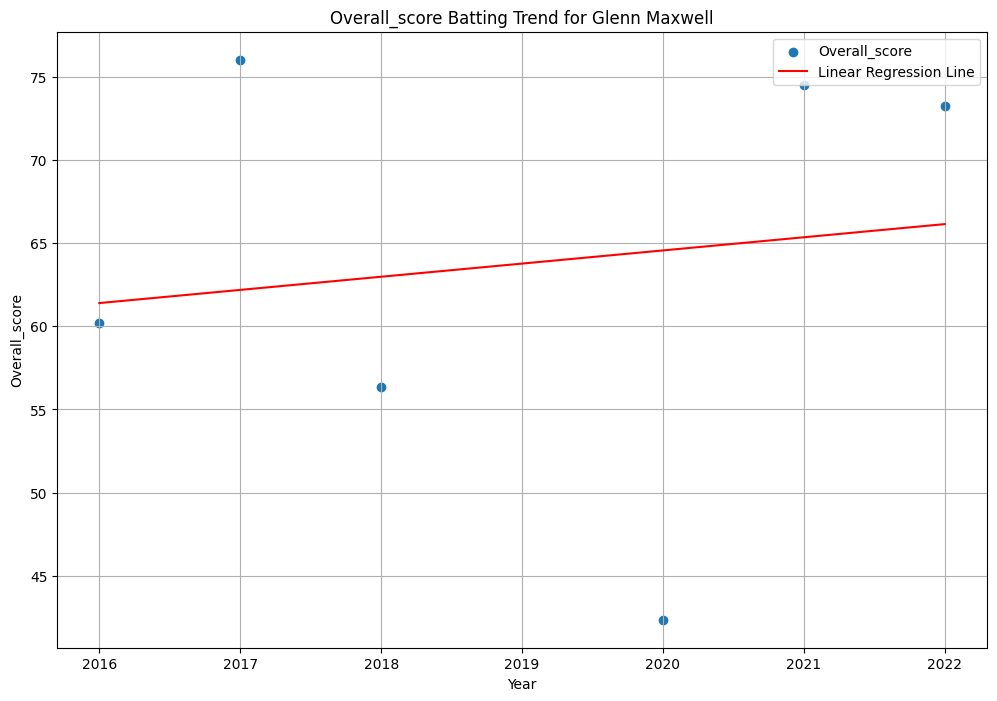

Player: Faf du Plessis, Metric: Overall_score, Slope (Coefficient): 3.815059218559218, Intercept: -7637.224016280015


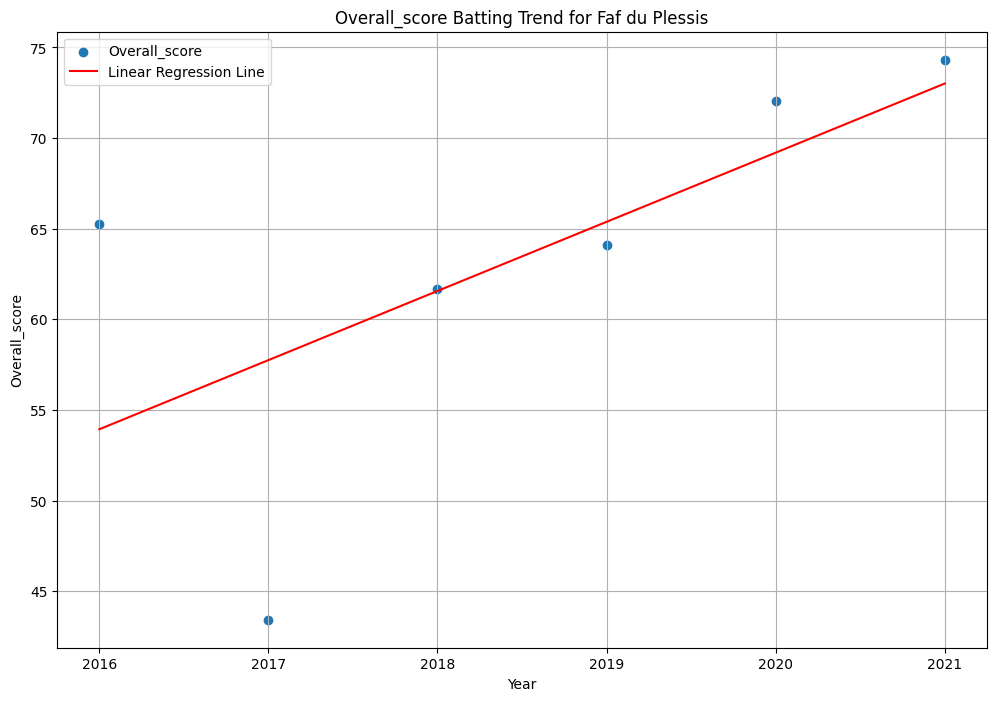

Player: Rahul Tripathi, Metric: Overall_score, Slope (Coefficient): 1.5746750154607265, Intercept: -3117.034729677723


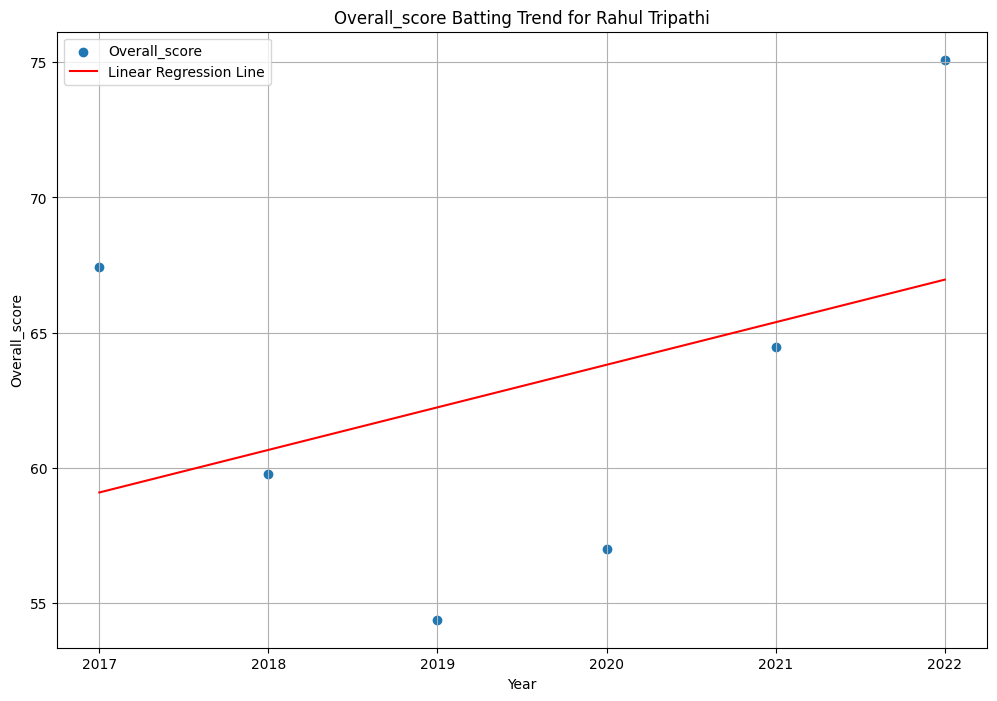

Player: Hardik Pandya, Metric: Overall_score, Slope (Coefficient): 3.5403527028527018, Intercept: -7085.28442159692


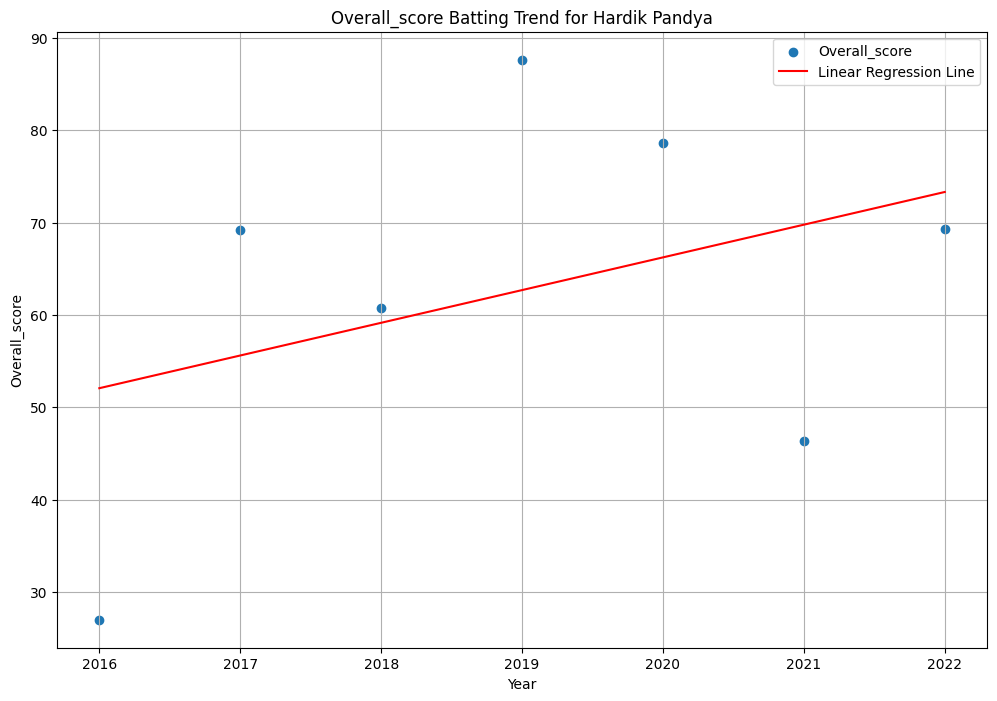

Player: Robin Uthappa, Metric: Overall_score, Slope (Coefficient): -1.458680971805972, Intercept: 3006.2635062853815


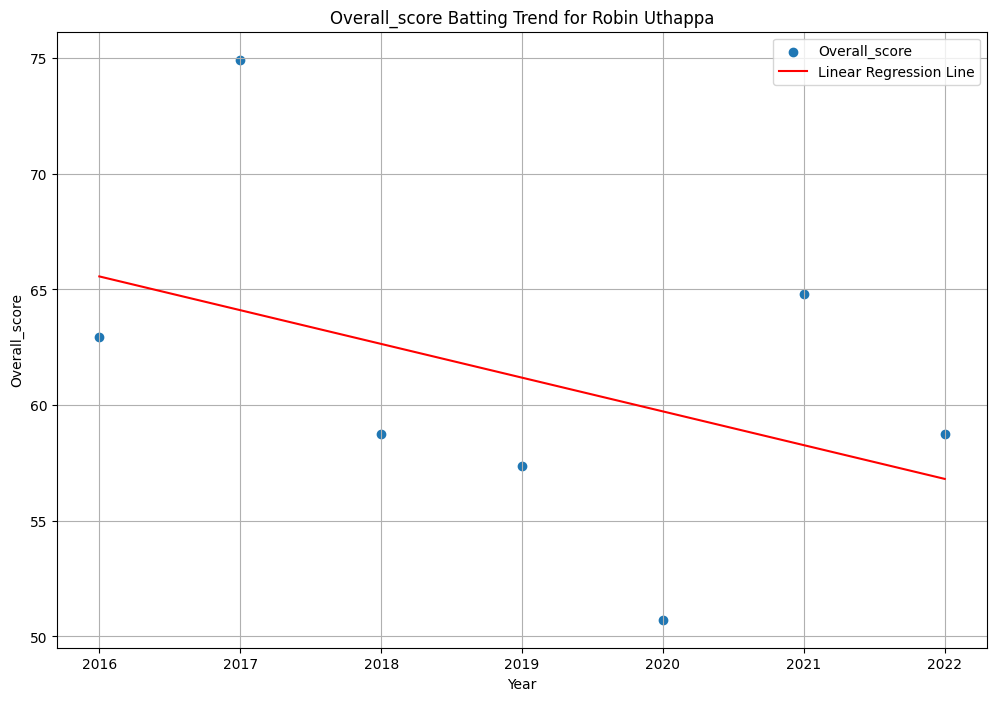

Player: Ravindra Jadeja, Metric: Overall_score, Slope (Coefficient): 2.4573124098124097, Intercept: -4900.3795322270325


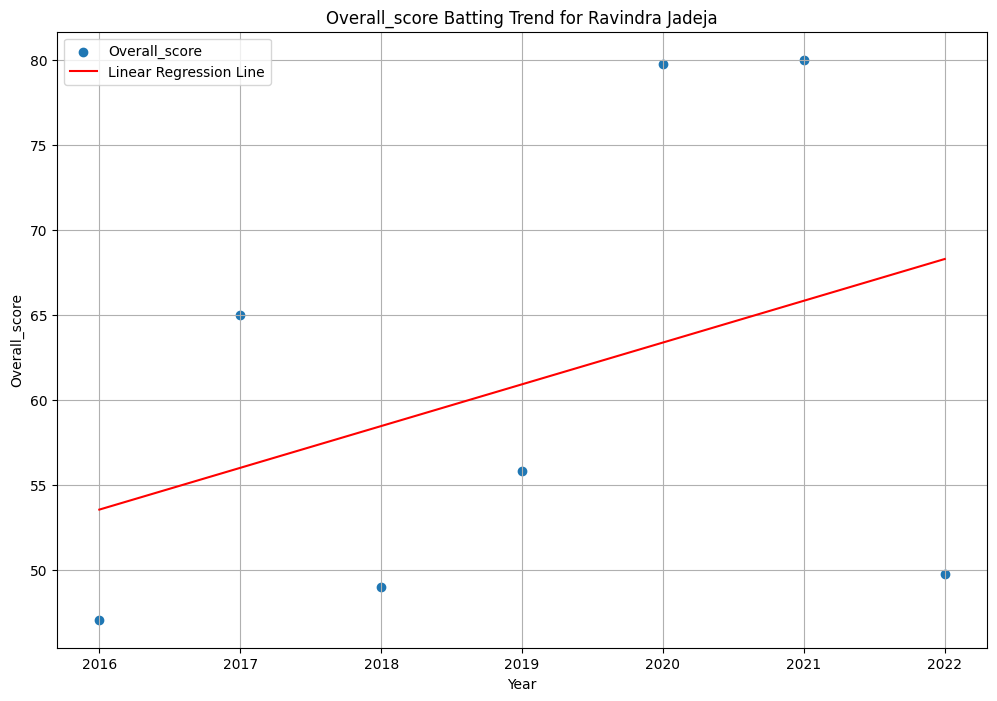

Player: Ambati Rayudu, Metric: Overall_score, Slope (Coefficient): 0.5204416416916414, Intercept: -990.4687577210365


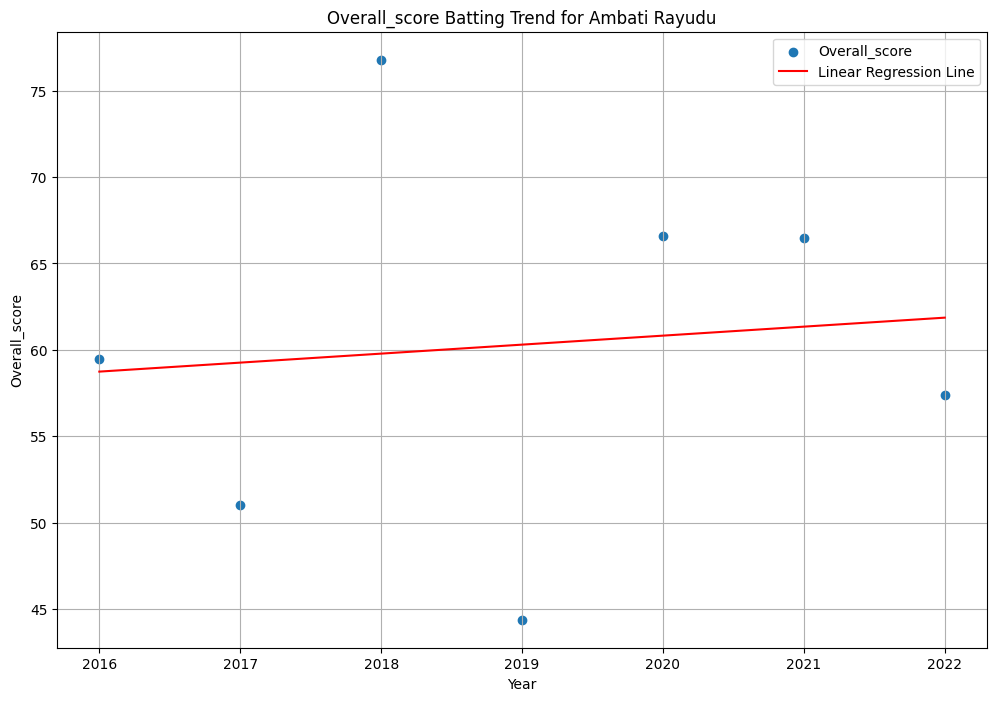

Player: Wriddhiman Saha, Metric: Overall_score, Slope (Coefficient): 0.582621452621453, Intercept: -1116.3995478595486


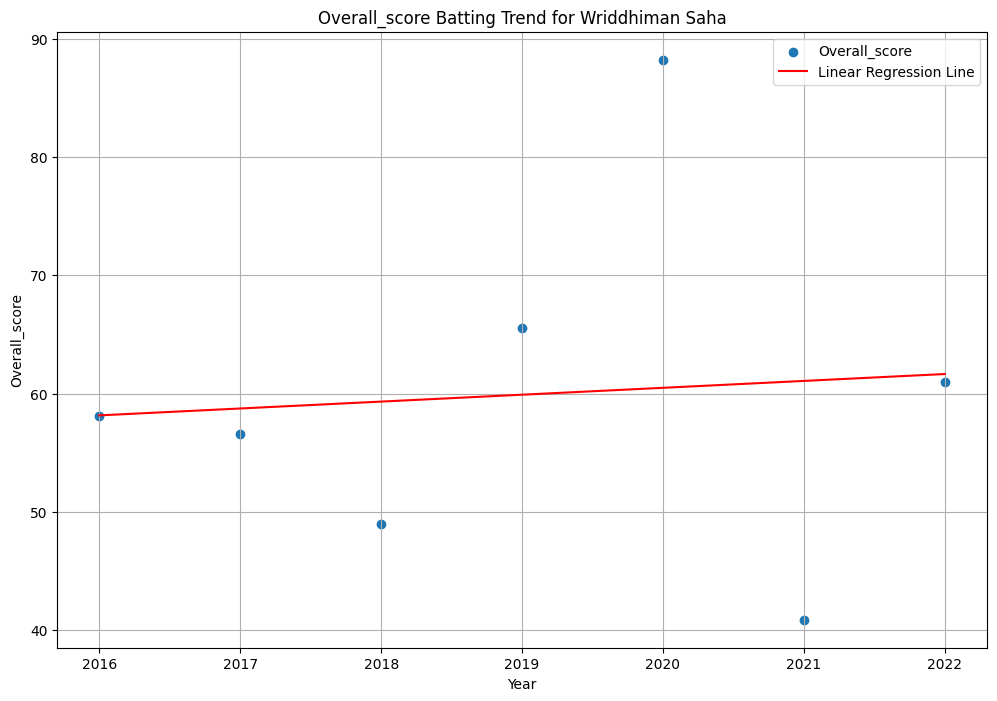

Player: Ishan Kishan, Metric: Overall_score, Slope (Coefficient): 2.6898460666317803, Intercept: -5371.338282312924


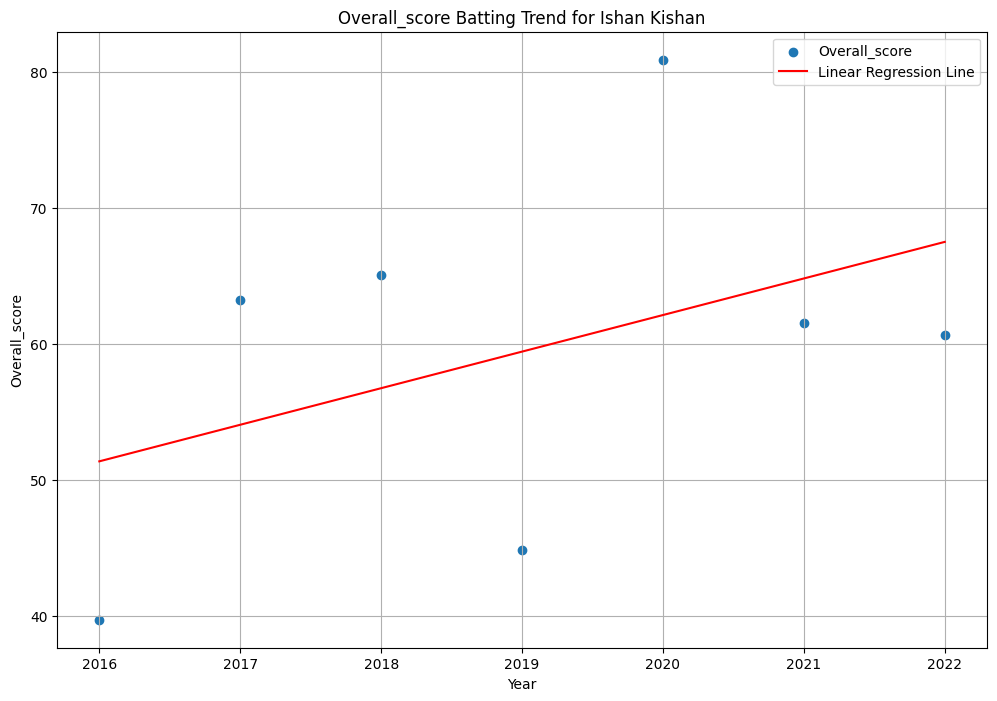

Player: David Miller, Metric: Overall_score, Slope (Coefficient): 3.2770304454000105, Intercept: -6557.43697629665


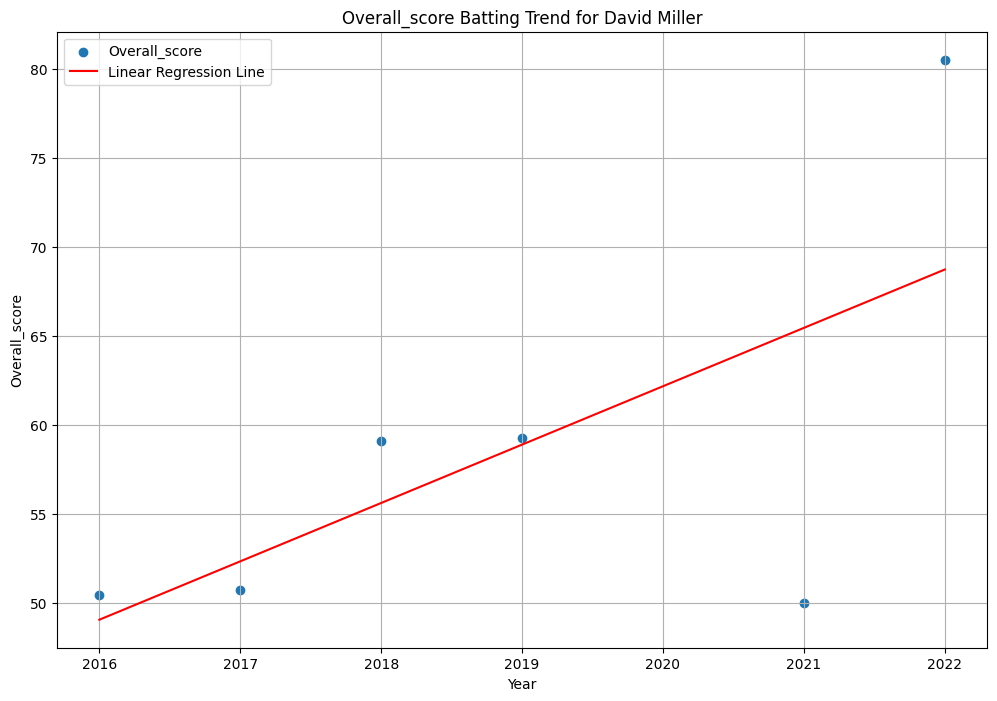

Player: Deepak Hooda, Metric: Overall_score, Slope (Coefficient): 3.015342455163885, Intercept: -6030.145579004332


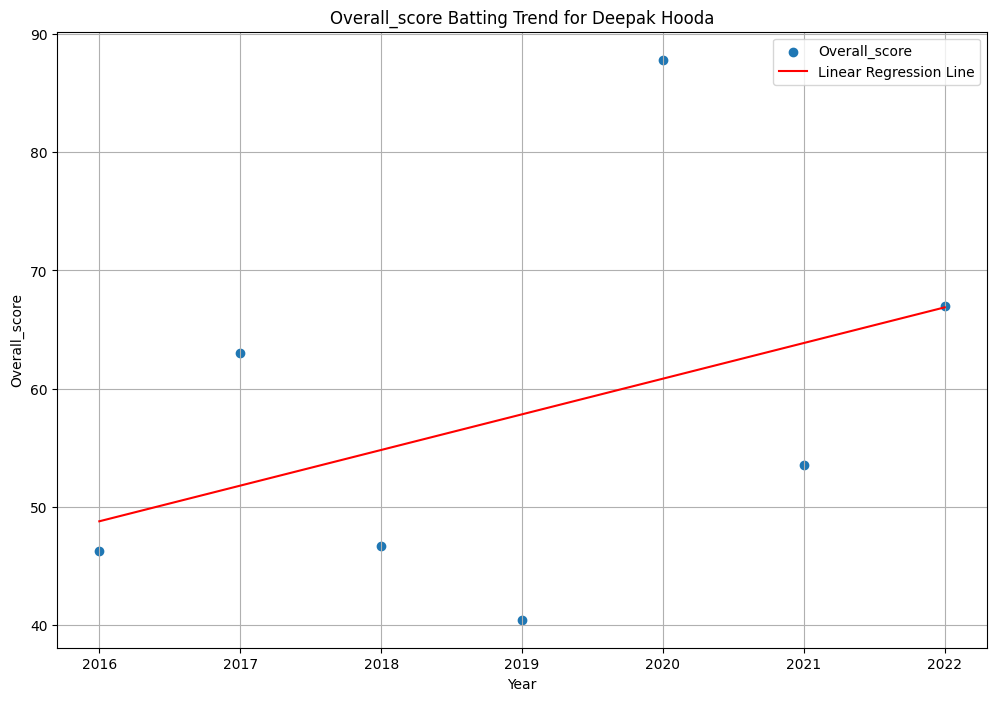

Player: Rahul Tewatia, Metric: Overall_score, Slope (Coefficient): 0.07629725829725759, Intercept: -96.77253198653057


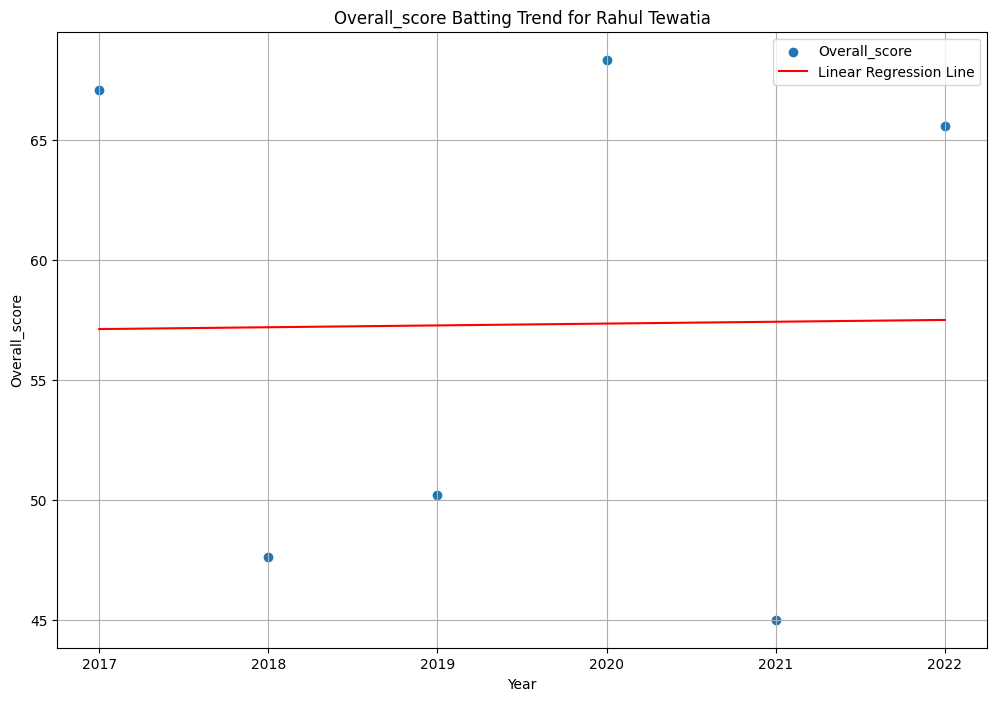

Player: Marcus Stoinis, Metric: Overall_score, Slope (Coefficient): 1.454622182206217, Intercept: -2879.9064862611735


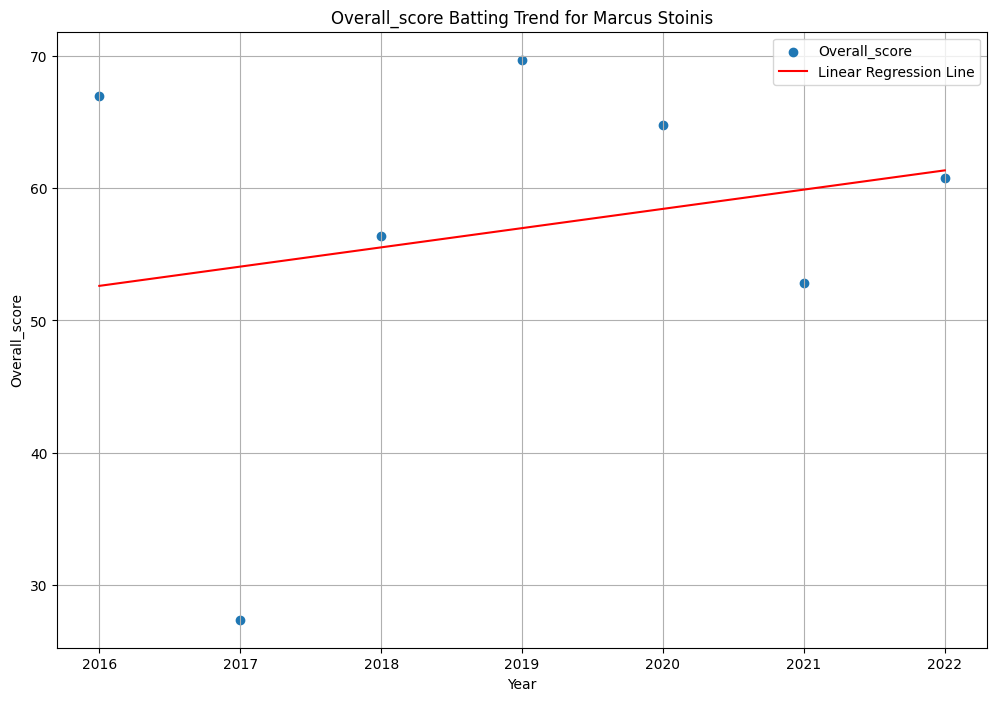

Player: Mayank Agarwal, Metric: Overall_score, Slope (Coefficient): 4.497536075036073, Intercept: -9023.901382783877


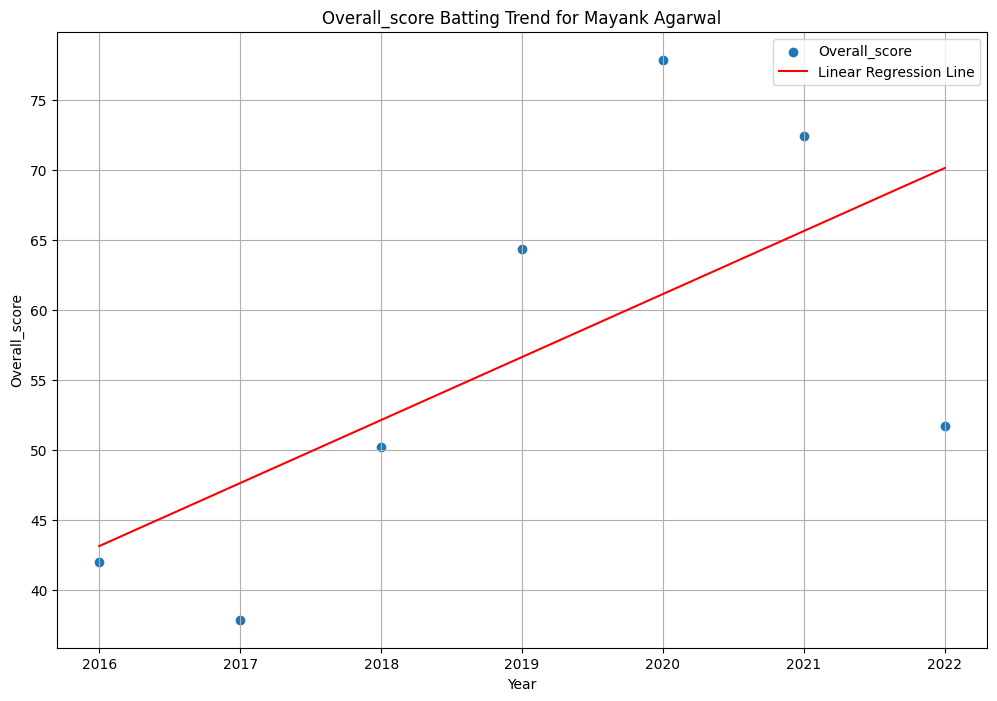

In [78]:
# Create a dictionary to store player-wise data
batsman_data_dict = {}

# Extract the data for the selected metric and year
for player_name , player_score in sorted_batsmen:
    years = [entry['Year'] for entry in all_batting_data if entry['Player'] == player_name]
    overall_score = [entry['Overall_score'] for entry in all_batting_data if entry['Player'] == player_name]
    
    batsman_data_dict[player_name] = {'Year': years, 'Overall_score': overall_score}

# Perform linear regression for each player and each metric
positive_trend_batsman = []
for player_name, player_data in batsman_data_dict.items():
        X = np.array(player_data['Year'])
        metric = 'Overall_score'
    
        Y = np.array(player_data[metric])

        # Calculate the mean of X and Y
        mean_x = np.mean(X)
        mean_y = np.mean(Y)

        # Calculate the slope (coefficient)
        num = np.sum((X - mean_x) * (Y - mean_y))
        den = np.sum((X - mean_x) ** 2)
        slope = num / den

        # Check if the slope is positive
        if slope > -1:
            positive_trend_batsman.append(player_name)

        # Calculate the intercept
        intercept = mean_y - slope * mean_x

        # Print the slope and intercept for each player and metric
        print(f"Player: {player_name}, Metric: {metric}, Slope (Coefficient): {slope}, Intercept: {intercept}")

        # Create the linear regression line
        regression_line = slope * X + intercept

        # Plot the actual data points and the linear regression line for each player and metric
        plt.figure(figsize=(12, 8))
        plt.scatter(X, Y, label=metric)
        plt.plot(X, regression_line, color='red', label='Linear Regression Line')
        plt.xlabel('Year')
        plt.ylabel(metric)
        plt.title(f'{metric} Batting Trend for {player_name}')
        plt.legend()
        plt.grid(True)
        plt.show()

In [79]:
# Function to calculate overall score for a bowler based on selected metrics
def calculate_bowler_score(player_data):
    econ_rate = np.mean(player_data['Economy Rate'])
    bowling_avg = np.mean(player_data['Bowling Avg'])
    
    score = (econ_rate + bowling_avg)/2
    return score

# Calculate overall score for each bowler and create a list of tuples (player_name, overall_score)
bowler_scores = [(player_name, calculate_bowler_score(player_data)) for player_name, player_data in bowler_data_dict.items() if player_name in bowler_with_positive_trend]

# Sort the bowlers based on their overall scores in descending order
sorted_bowlers = sorted(bowler_scores, key=lambda x: x[1], reverse=False)

# Display the combined batsman sorted list
print("Combined Bowler Sorted List:")
for player_name, score in sorted_bowlers:
    print(f"Player: {player_name}, Overall Score: {score:.2f}")

Combined Bowler Sorted List:
Player: Rashid Khan, Overall Score: 13.62
Player: Jasprit Bumrah, Overall Score: 14.46
Player: Yuzvendra Chahal, Overall Score: 14.78
Player: Chris Morris, Overall Score: 17.42
Player: Imran Tahir, Overall Score: 18.60
Player: Bhuvneshwar Kumar, Overall Score: 20.23
Player: Piyush Chawla, Overall Score: 20.53
Player: Washington Sundar, Overall Score: 20.99
Player: Sunil Narine, Overall Score: 21.29
Player: Ravichandran Ashwin, Overall Score: 22.00
Player: Krunal Pandya, Overall Score: 22.31
Player: Axar Patel, Overall Score: 23.21


Player: Rashid Khan, Metric: Overall_score, Slope (Coefficient): -0.05085714285714319, Intercept: 116.329333333334


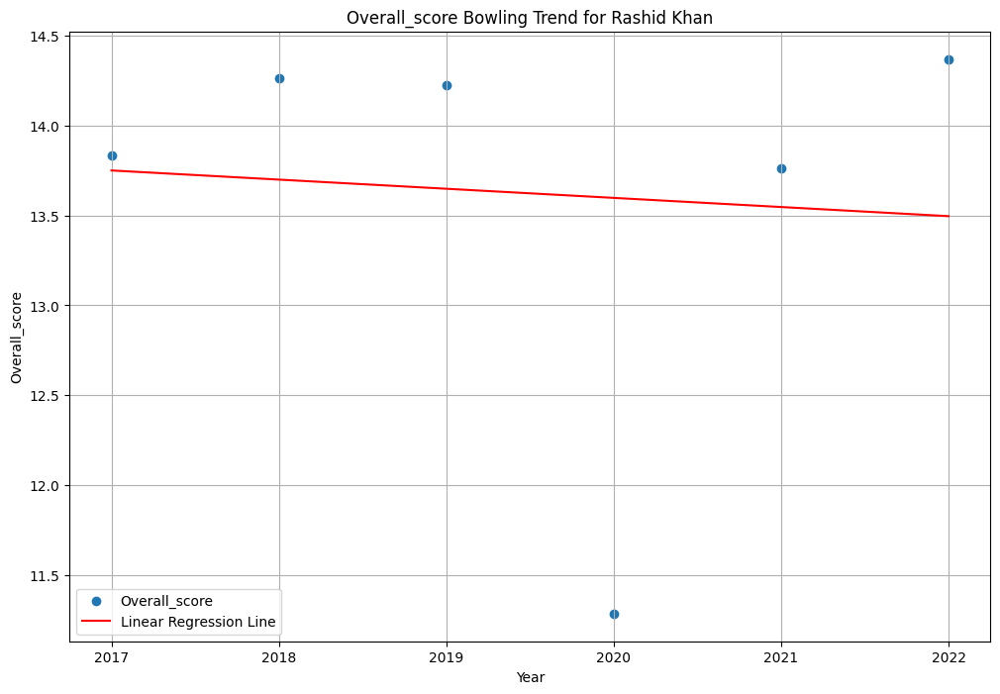

Player: Jasprit Bumrah, Metric: Overall_score, Slope (Coefficient): -0.32607142857142846, Intercept: 672.8010714285712


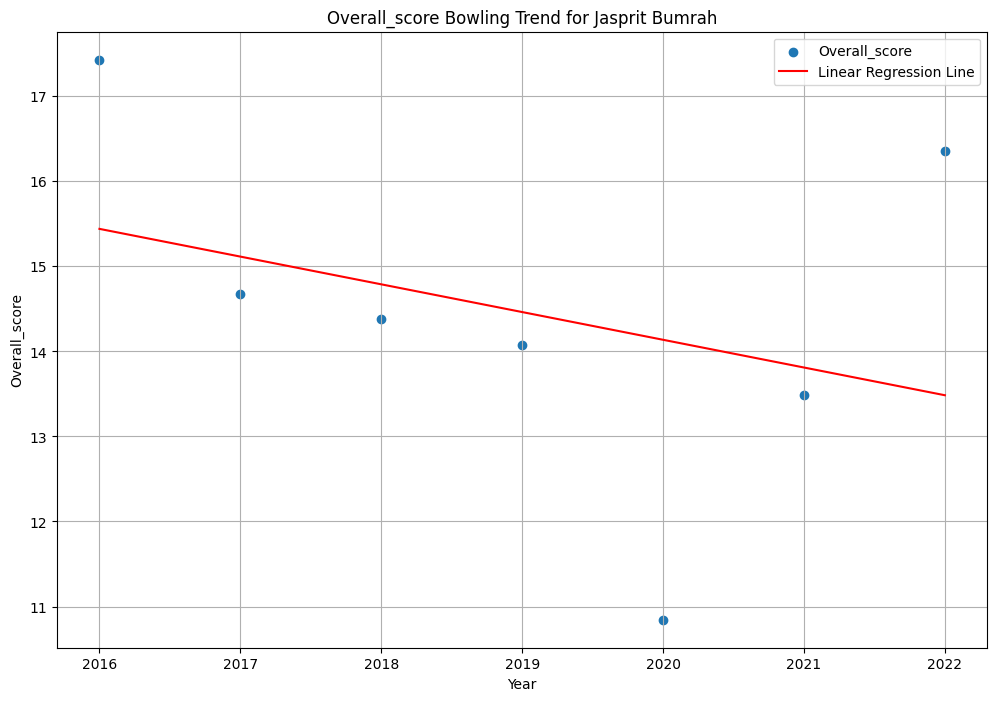

Player: Yuzvendra Chahal, Metric: Overall_score, Slope (Coefficient): -0.3269642857142857, Intercept: 674.9180357142857


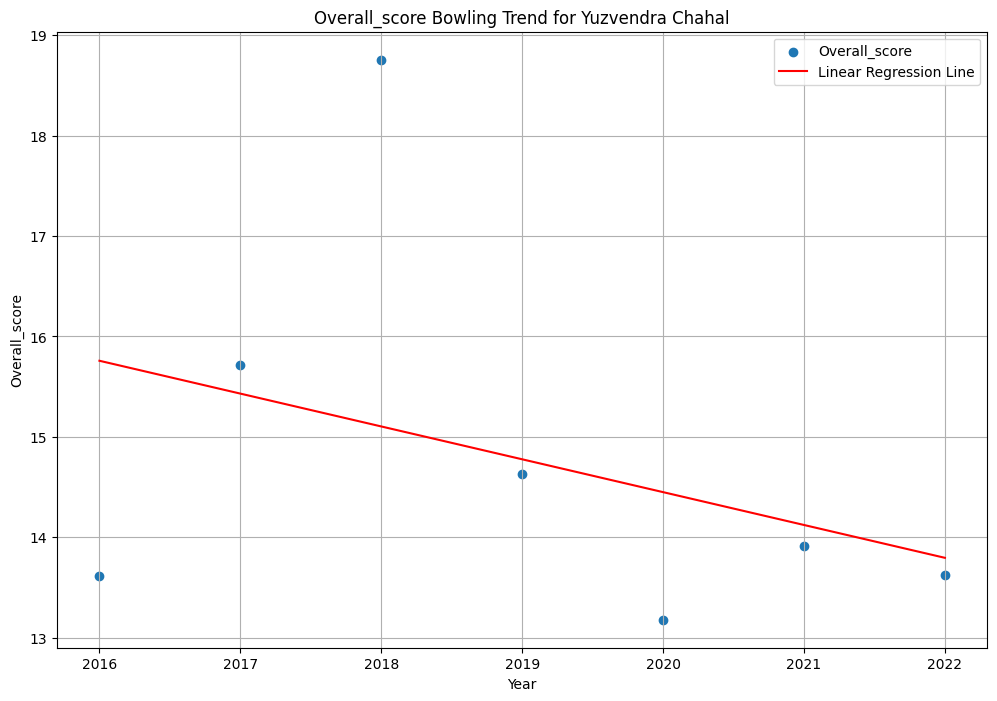

Player: Chris Morris, Metric: Overall_score, Slope (Coefficient): -0.19185714285714336, Intercept: 404.68447619047726


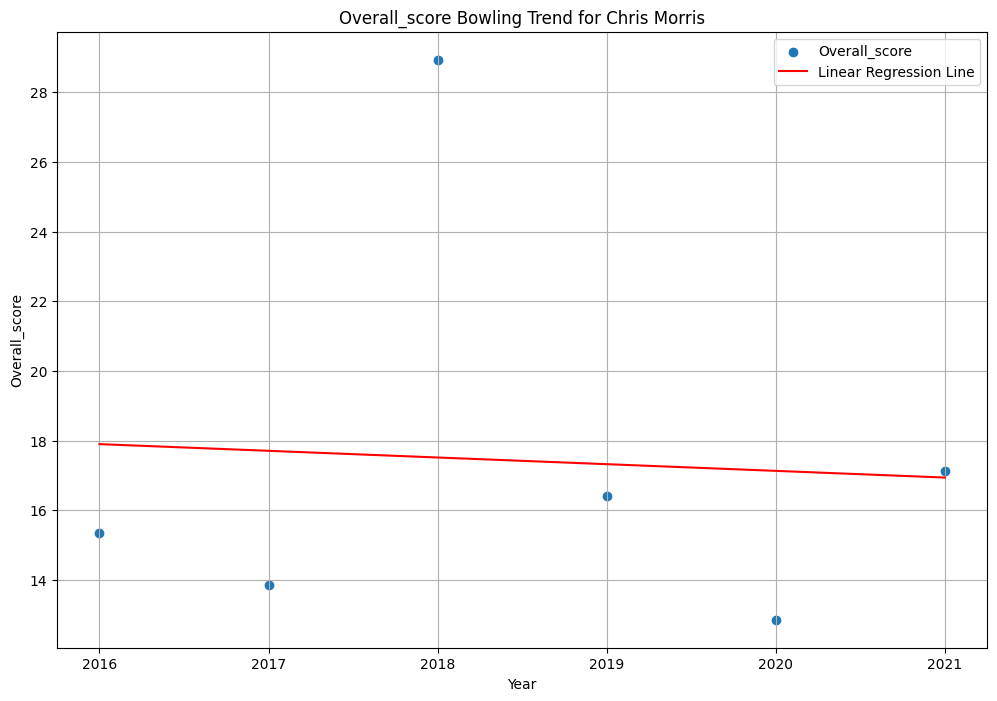

Player: Imran Tahir, Metric: Overall_score, Slope (Coefficient): 0.36271428571428593, Intercept: -713.5429523809529


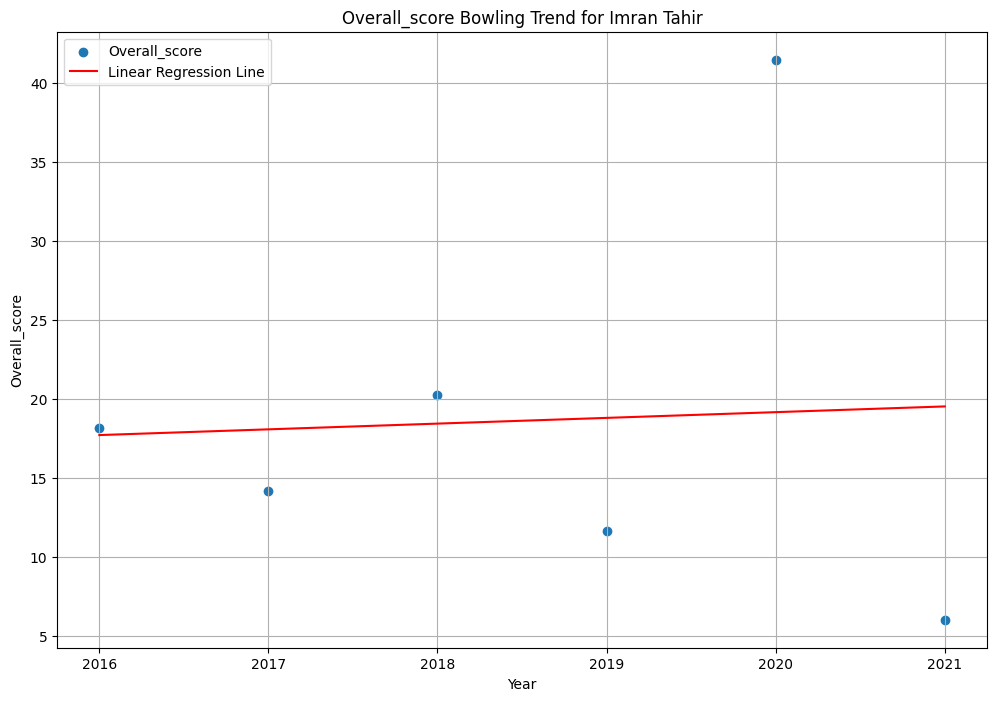

Player: Bhuvneshwar Kumar, Metric: Overall_score, Slope (Coefficient): 1.9589285714285718, Intercept: -3934.8446428571438


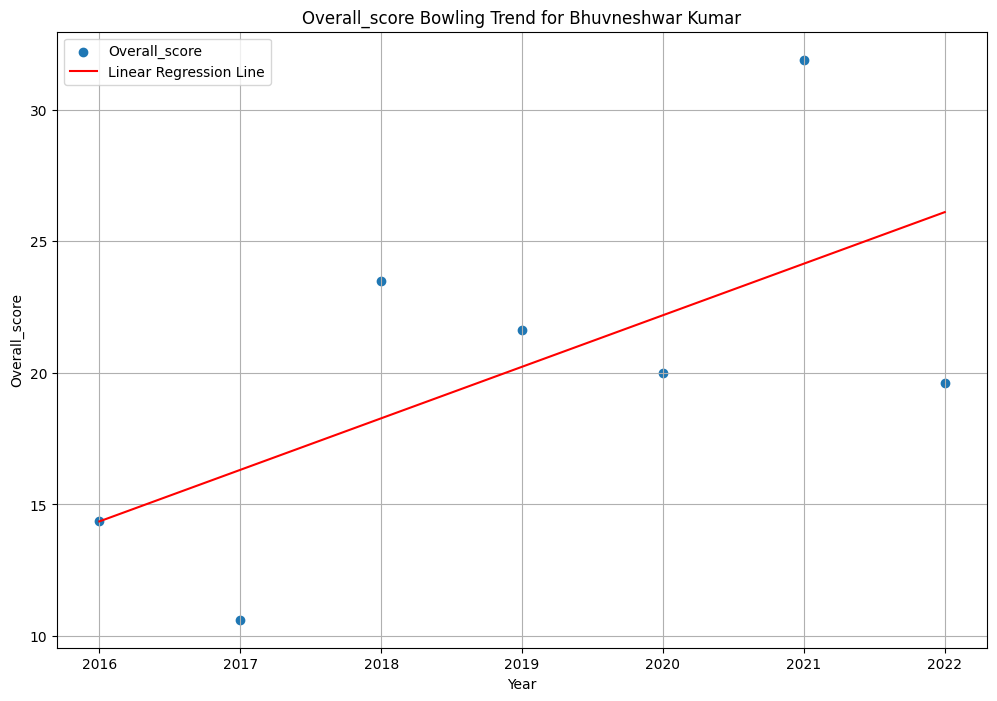

Player: Piyush Chawla, Metric: Overall_score, Slope (Coefficient): 1.3187142857142857, Intercept: -2641.2906190476187


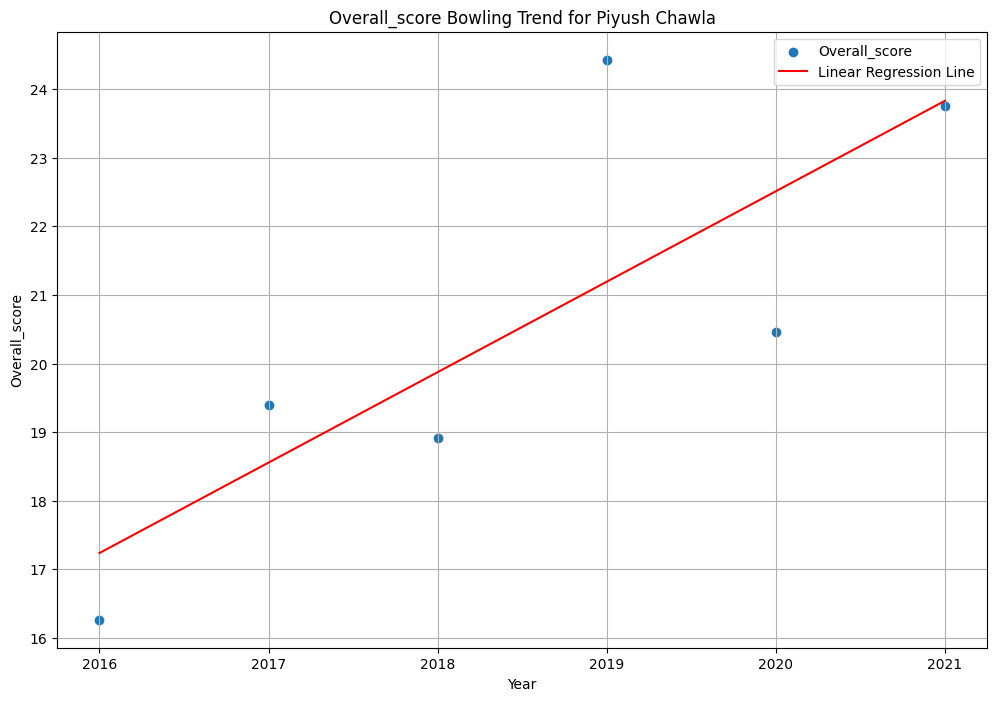

Player: Washington Sundar, Metric: Overall_score, Slope (Coefficient): 1.1312857142857138, Intercept: -2263.6423333333323


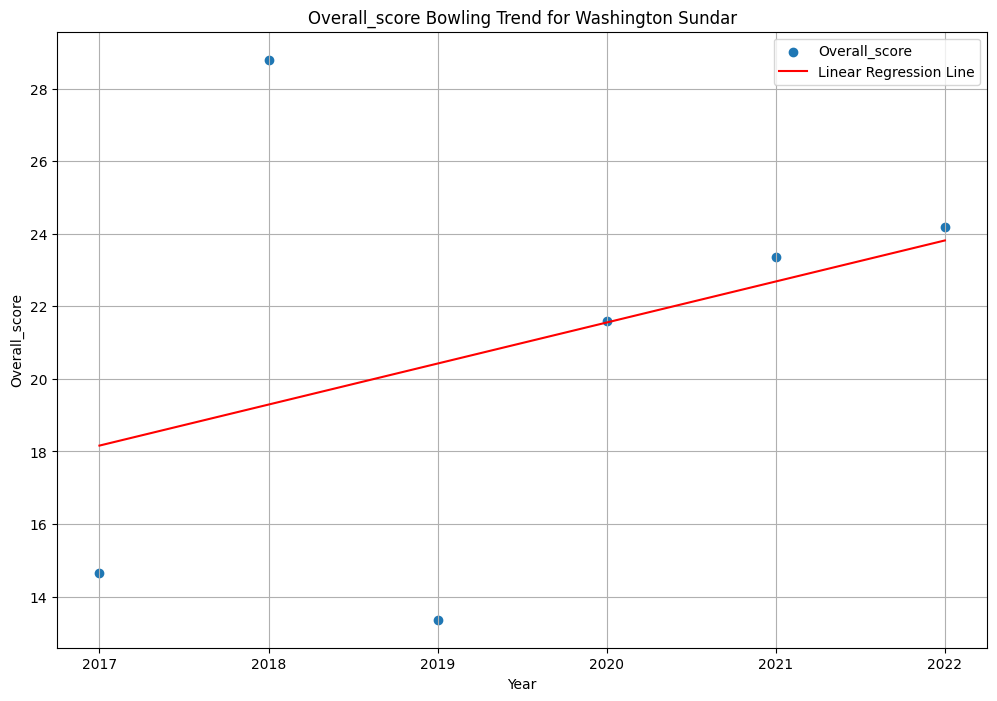

Player: Sunil Narine, Metric: Overall_score, Slope (Coefficient): 0.2033928571428569, Intercept: -389.35660714285666


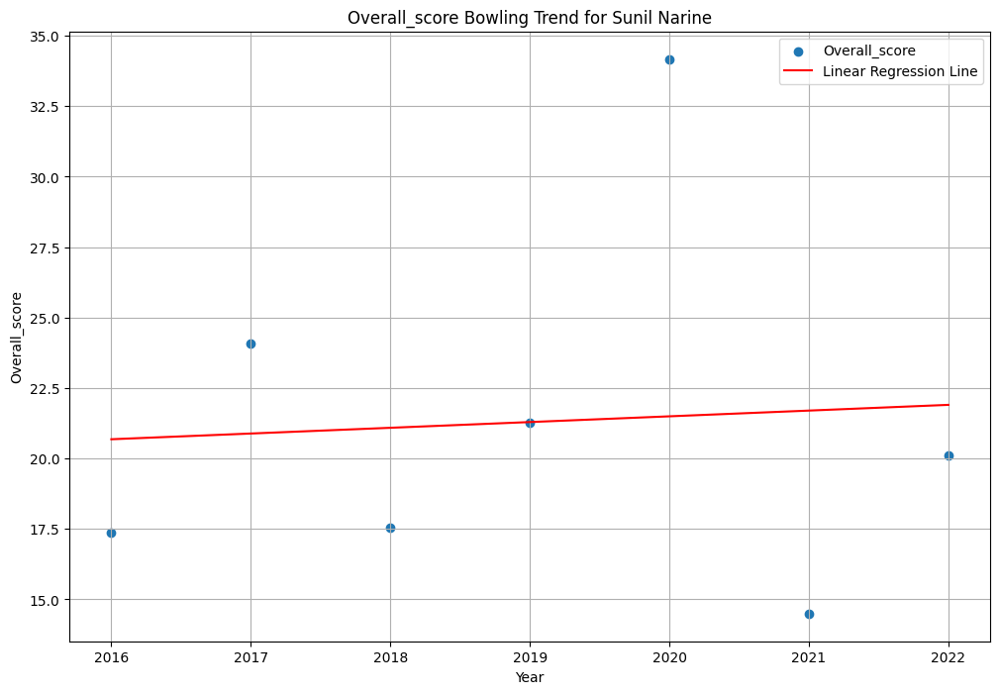

Player: Ravichandran Ashwin, Metric: Overall_score, Slope (Coefficient): 0.874285714285714, Intercept: -1743.474285714285


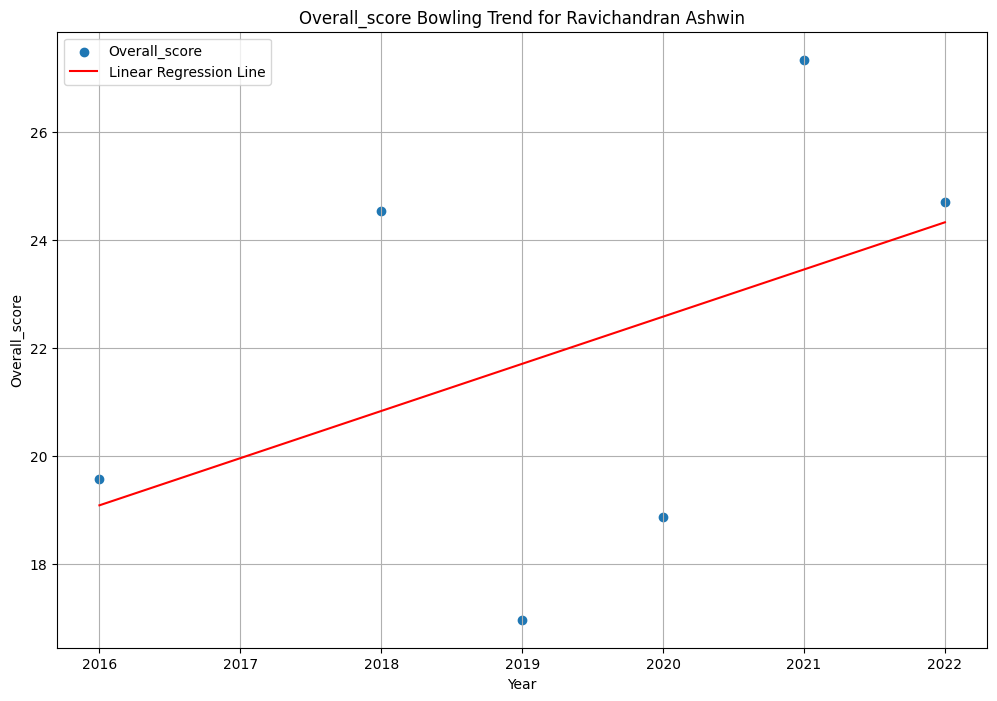

Player: Krunal Pandya, Metric: Overall_score, Slope (Coefficient): 0.9571428571428573, Intercept: -1910.1650000000004


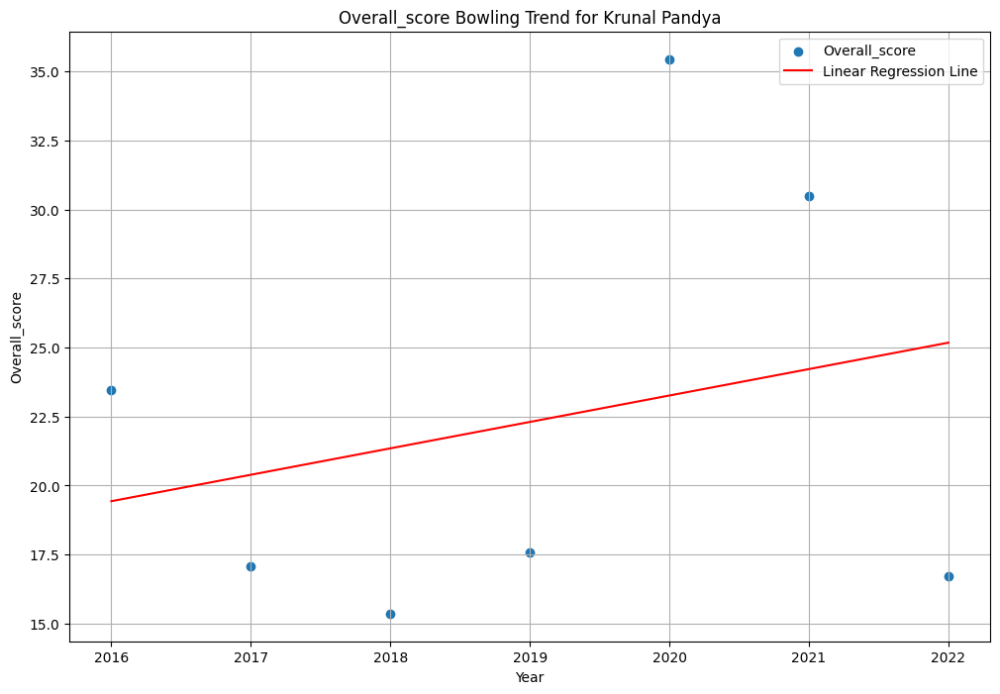

Player: Axar Patel, Metric: Overall_score, Slope (Coefficient): 0.3837499999999999, Intercept: -751.5812499999998


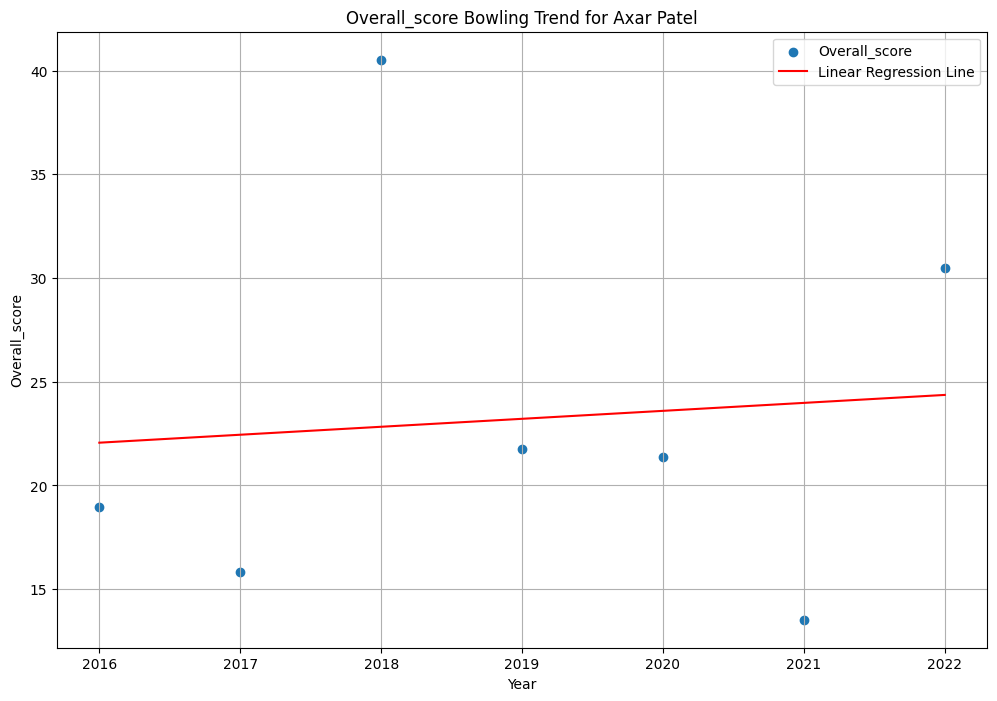

In [80]:
# Create a dictionary to store player-wise data
bowler_data_dict = {}

# Extract the data for the selected metric and year
for player_name , player_score in sorted_bowlers:
    years = [entry['Year'] for entry in all_bowling_data if entry['Player'] == player_name]
    overall_score = [entry['Overall_score'] for entry in all_bowling_data if entry['Player'] == player_name]
    
    bowler_data_dict[player_name] = {'Year': years, 'Overall_score': overall_score}

# Perform linear regression for each player and each metric
positive_trend_bowler = []
for player_name, player_data in bowler_data_dict.items():
        X = np.array(player_data['Year'])
        metric = 'Overall_score'
    
        Y = np.array(player_data[metric])

        # Calculate the mean of X and Y
        mean_x = np.mean(X)
        mean_y = np.mean(Y)

        # Calculate the slope (coefficient)
        num = np.sum((X - mean_x) * (Y - mean_y))
        den = np.sum((X - mean_x) ** 2)
        slope = num / den

        # Check if the slope is negative
        if slope < 1:
            positive_trend_bowler.append(player_name)

        # Calculate the intercept
        intercept = mean_y - slope * mean_x

        # Print the slope and intercept for each player and metric
        print(f"Player: {player_name}, Metric: {metric}, Slope (Coefficient): {slope}, Intercept: {intercept}")

        # Create the linear regression line
        regression_line = slope * X + intercept

        # Plot the actual data points and the linear regression line for each player and metric
        plt.figure(figsize=(12, 8))
        plt.scatter(X, Y, label=metric)
        plt.plot(X, regression_line, color='red', label='Linear Regression Line')
        plt.xlabel('Year')
        plt.ylabel(metric)
        plt.title(f'{metric} Bowling Trend for {player_name}')
        plt.legend()
        plt.grid(True)
        plt.show()

In [81]:
# Extract only the batsman names from the combined batsman sorted list
batsman_names_sorted = [player_name for player_name, _ in sorted_batsmen]

# Extract only the batsman names from the combined bowler sorted list
bowler_names_sorted = [player_name for player_name, _ in sorted_bowlers]

# Combine both lists to get the final team
team = batsman_names_sorted[:6] + bowler_names_sorted[:5]
substitute = batsman_names_sorted[6:10] + bowler_names_sorted[5:8] + ['MS Dhoni']
# Display the names of the players in the team
print("Team Selection:")
for i, player_name in enumerate(team, 1):
    print(f"{i}. {player_name}")

# Display the names of the players in the substitute
print("\nSbstitute Selection:")
for i, player_name in enumerate(substitute, 1):
    print(f"{i}. {player_name}")

Team Selection:
1. Andre Russell
2. Jos Buttler
3. Rishabh Pant
4. Shikhar Dhawan
5. Chris Gayle
6. Sanju Samson
7. Rashid Khan
8. Jasprit Bumrah
9. Yuzvendra Chahal
10. Chris Morris
11. Imran Tahir

Sbstitute Selection:
1. Dinesh Karthik
2. Kieron Pollard
3. Suryakumar Yadav
4. Nitish Rana
5. Bhuvneshwar Kumar
6. Piyush Chawla
7. Washington Sundar
8. MS Dhoni


In [82]:
y = set(name for name , _ in top_batting_avg).intersection(set(name for name , _ in top_batting_avg_score))

In [83]:
print(y)

{'Sanju Samson', 'Kane Williamson', 'Andre Russell', 'MS Dhoni', 'Ravindra Jadeja', 'Jos Buttler', 'David Warner', 'Virat Kohli', 'Krunal Pandya', 'Manish Pandey', 'Hardik Pandya', 'Mandeep Singh', 'Deepak Hooda', 'Rahul Tewatia', 'Ajinkya Rahane', 'Shikhar Dhawan', 'Glenn Maxwell', 'Mayank Agarwal', 'Rahul Tripathi', 'Wriddhiman Saha', 'Chris Gayle', 'Faf du Plessis', 'Robin Uthappa', 'Chris Morris', 'Marcus Stoinis', 'Rishabh Pant', 'Sarfaraz Khan', 'Nitish Rana', 'Suryakumar Yadav', 'Shreyas Iyer', 'Dinesh Karthik', 'Rohit Sharma', 'Ishan Kishan', 'Kieron Pollard', 'Ambati Rayudu', 'Vijay Shankar', 'AB de Villiers', 'David Miller'}


In [84]:
for row in aggregated_allrounder_player_stats.keys():
    for name in team:
        if row == name:
            print(name)

Chris Morris
Andre Russell
Jasprit Bumrah
Yuzvendra Chahal
Rashid Khan


In [85]:
set(team).intersection(overall_top_allrounder)

{'Andre Russell', 'Chris Morris', 'Rashid Khan'}

In [86]:
set(substitute).intersection(overall_top_allrounder)

set()

In [87]:
set(bowler_names_sorted).intersection(overall_top_allrounder)

{'Chris Morris', 'Rashid Khan', 'Sunil Narine'}

In [88]:
set(batsman_names_sorted).intersection(overall_top_allrounder)

{'Andre Russell'}

In [89]:
print(overall_top_allrounder)

{'Sunil Narine', 'Andre Russell', 'Chris Morris', 'Shardul Thakur', 'Rashid Khan', 'Dwayne Bravo'}


In [90]:
print(aggregated_allrounder_player_stats)

{'Krunal Pandya': {'Batting Avg': [39.5, 34.71, 22.8, 16.63, 18.16, 14.3, 20.33], 'Batting Avg Score': [26.333333333333332, 22.09090909090909, 17.53846153846154, 12.2, 9.083333333333334, 11.916666666666666, 14.076923076923077], 'Batting Strike Rate': [191.12, 135.75, 145.22, 122, 118.47, 116.26, 126.2], 'Bowling Econ Rate': [7.57, 6.82, 7.07, 7.28, 7.57, 7.98, 6.97], 'Bowling Avg': [39.33, 27.3, 23.66, 27.91, 63.33, 53, 26.5], 'Bat Score': [85.6511111111111, 64.18363636363637, 61.85282051282052, 50.276666666666664, 48.571111111111115, 47.49222222222222, 53.53564102564102], 'Bowl Score': [23.45, 17.060000000000002, 15.365, 17.595, 35.45, 30.490000000000002, 16.735]}, 'Chris Morris': {'Batting Avg': [65.0, 30.8, 46.0, 5.33, 8.5, 13.4], 'Batting Avg Score': [27.857142857142858, 17.11111111111111, 11.5, 5.333333333333333, 6.8, 9.571428571428571], 'Batting Strike Rate': [178.89, 163.82, 176.92, 86.48, 161.9, 136.73], 'Bowling Econ Rate': [7, 7.74, 10.21, 9.27, 6.63, 9.17], 'Bowling Avg': [2

In [91]:
print(top_batting_sr[:5])

[('Andre Russell', 170.98666666666668), ('AB de Villiers', 156.15333333333334), ('Chris Morris', 150.79), ('Rashid Khan', 150.68499999999997), ('Jos Buttler', 149.39142857142858)]
